In [1]:
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from tqdm import tqdm
from functions import collect_only, calculate_ic, calculate_r2, calulate_win, calculate_sharpe
import json
import importlib
from sklearn.linear_model import LogisticRegression, LinearRegression
from sklearn.metrics import accuracy_score, r2_score
from scipy.stats import spearmanr, pearsonr
from regression import run_indicators, tcv_quantile, test_model
from trading import simulate_trading, simulate_trading_ensemble, simulate_trading_quantile
from datetime import datetime
from trading import simulate_trading_binary
from regression import run_indicators2
from trading import simulate_trading_poly, simulate_trading_majority

original_columns=['bam_vwa', 'bam_open', 'bam_close',
       'bam_high', 'bam_low', 'bam_volatility_1m_return', 'base_volume',
       'pct_buy_volume', 'annual_interest_rate', 'spread_1m_vwa_vwa',
       'spread_twa']
symbols=['BNB', 'BTC', 'ETH','TRX','XRP']
linear_objectives = [None, 'elasticnet', 'ridge', 'lasso', 'linear', 'huber', 'bayesianridge', 'sgd', 'weights1']

In [2]:
import warnings
warnings.filterwarnings('ignore')

# binary + ensemble

Testing BNB with trading window 1
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.00016773470410594085
Fraction positive: 0.5117964591748141
Fraction negative: 0.48495715526027705
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14', 'stochastic_oscillator_14_0', 'stochastic_oscillator_14_1', 'ichimoku_cloud_9_26_52_0', 'ichimoku_cloud_9_26_52_1', 'ichimoku_cloud_9_26_52_2', 'ichimoku_cloud_9_26_52_3', 'vwap', 'atr', 'bam_vwa', 'bam_open', 'bam_close', 'bam_high', 'bam_low', 'bam_volatility_1m_

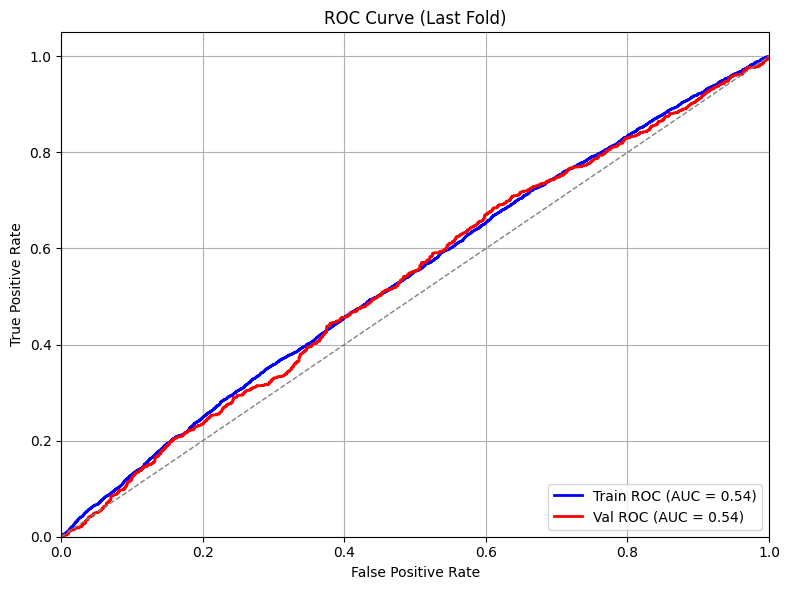

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.83%
Confusion Matrix (Total):
[[6964 4517]
 [7112 5059]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.51      0.63      0.56      1283
          Up       0.54      0.42      0.47      1345

    accuracy                           0.52      2628
   macro avg       0.53      0.52      0.52      2628
weighted avg       0.53      0.52      0.52      2628

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -5671.236561
  Test samples: 26491
  Features used: 31
  Overall Accuracy: 0.5301 (53.01%)
  Weighted Accuracy: 0.5301 (53.01%)
  Rise Accuracy: 0.4830 (48.30%) - 13213 samples
  Fall Accuracy: 0.5769 (57.69%) - 13278 samples
  Precision: 0.5318
  Recall: 0.4830
  F1 Score: 0.5062
  Confusion Matrix (Fall/Rise):
    [[7660 5618]  # Predicted Fall
     [6831 6382]]  # Predicted Rise
     # Actual Fall  A

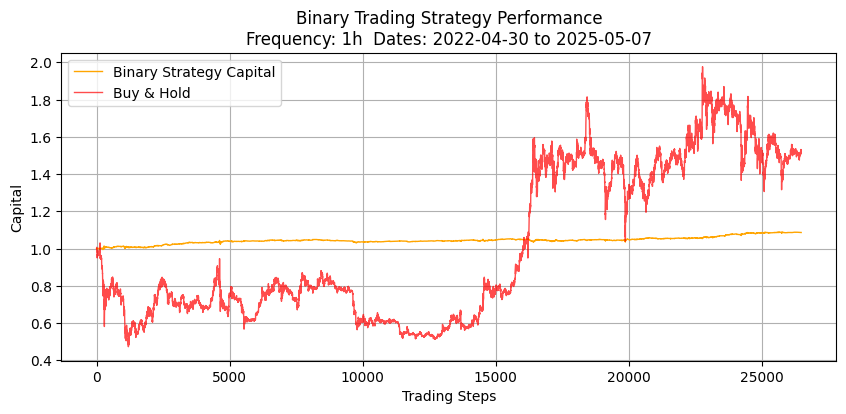

{'Total Return': 0.08673596591587707, 'Buy and Hold Return': 0.517189666036547, 'Hit Rate': 0.5064175160437902, 'Sharpe Ratio': 1.1443687058820455, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 52.27%
Hit Rate (Short/Price Fall): 49.30%
Number of Long Trades: 12000
Number of Short Trades: 14490
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 04:00:00 to 2025-05-07 23:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


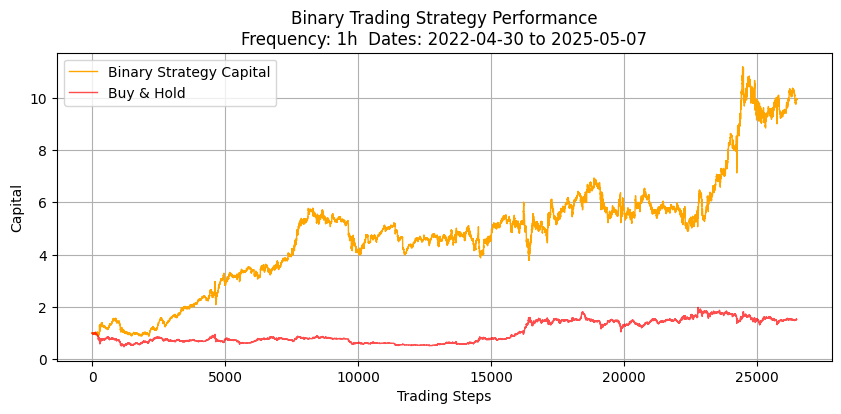

{'Total Return': 8.956713623288431, 'Buy and Hold Return': 0.517189666036547, 'Hit Rate': 0.5064175160437902, 'Sharpe Ratio': 0.9816645434988314, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 52.27%
Hit Rate (Short/Price Fall): 49.30%
Number of Long Trades: 12000
Number of Short Trades: 14490
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


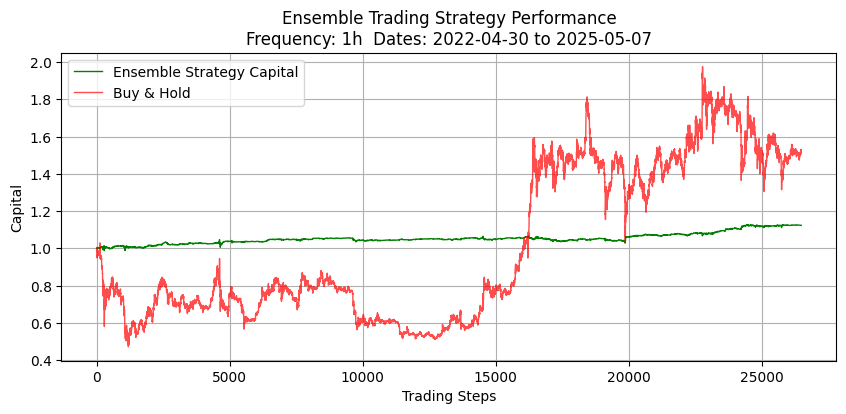

Ensemble Strategy Metrics: {'Total Return': 0.12384540156828261, 'Buy and Hold Return': 0.5156615888203452, 'Hit Rate': 0.515077365958978, 'Sharpe Ratio': 0.9488670085960963, 'Number of Trades': 13895}
Hit Rate (Long/Price Rise): 54.19%
Hit Rate (Short/Price Fall): 48.13%
Number of Long Trades: 7749
Number of Short Trades: 6146
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


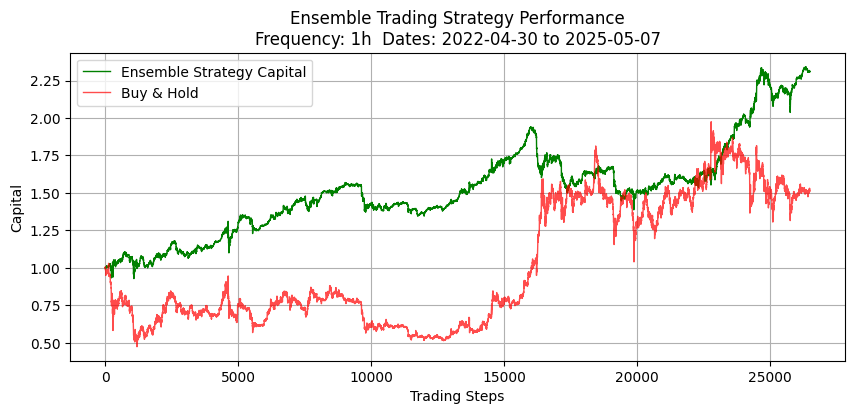

Ensemble Strategy Metrics: {'Total Return': 1.3107140951376959, 'Buy and Hold Return': 0.5156615888203452, 'Hit Rate': 0.5273839510615329, 'Sharpe Ratio': 1.233390390134847, 'Number of Trades': 13895}
Hit Rate (Long/Price Rise): 53.57%
Hit Rate (Short/Price Fall): 50.42%
Number of Long Trades: 10238
Number of Short Trades: 3657
Testing BTC with trading window 1
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.00010939550027540065
Fraction positive: 0.5104375070778755
Fraction negative: 0.4893737495753275
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'boll

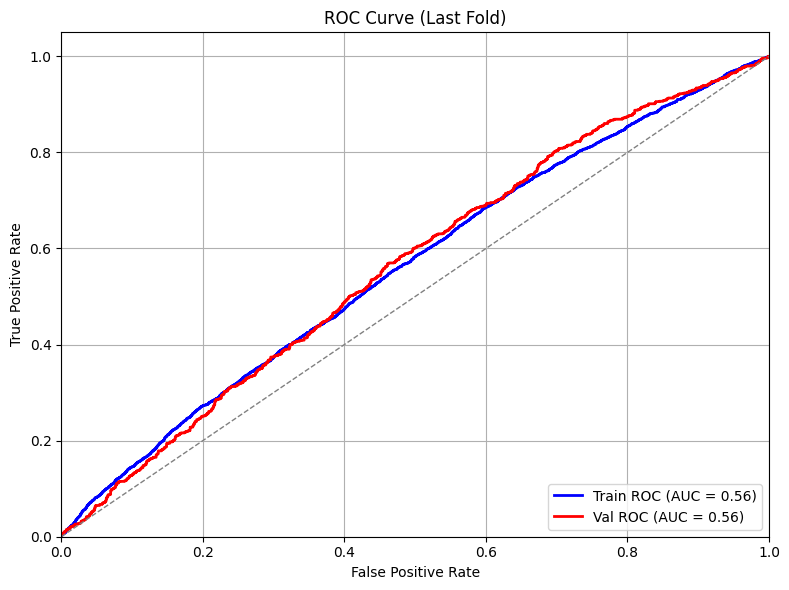

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 53.34%
Confusion Matrix (Total):
[[6566 5089]
 [5948 6049]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.52      0.64      0.57      1291
          Up       0.56      0.44      0.49      1337

    accuracy                           0.54      2628
   macro avg       0.54      0.54      0.53      2628
weighted avg       0.54      0.54      0.53      2628

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -7023.639175
  Test samples: 26491
  Features used: 31
  Overall Accuracy: 0.5330 (53.30%)
  Weighted Accuracy: 0.5330 (53.30%)
  Rise Accuracy: 0.3245 (32.45%) - 13428 samples
  Fall Accuracy: 0.7474 (74.74%) - 13063 samples
  Precision: 0.5691
  Recall: 0.3245
  F1 Score: 0.4134
  Confusion Matrix (Fall/Rise):
    [[9763 3300]  # Predicted Fall
     [9070 4358]]  # Predicted Rise
     # Actual Fall  A

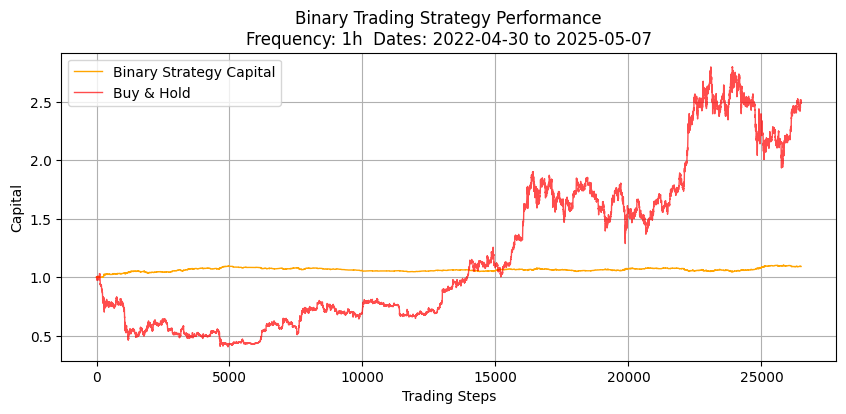

{'Total Return': 0.09210537160821453, 'Buy and Hold Return': 1.516089131482194, 'Hit Rate': 0.5141940354850887, 'Sharpe Ratio': 0.8267708340466849, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 53.67%
Hit Rate (Short/Price Fall): 50.50%
Number of Long Trades: 7658
Number of Short Trades: 18832
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 04:00:00 to 2025-05-07 23:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


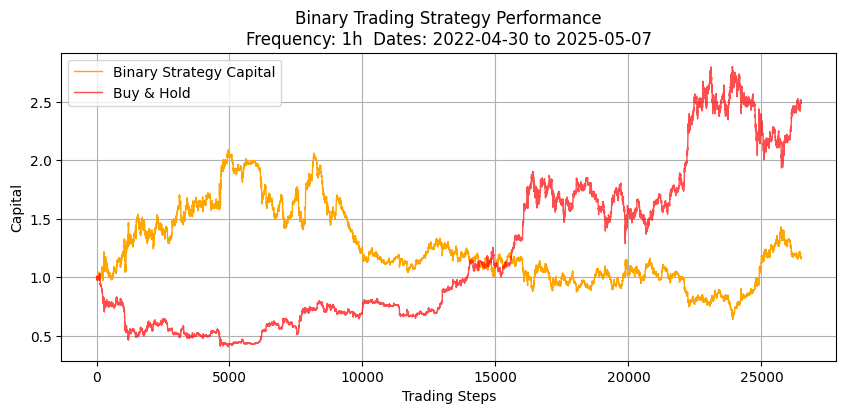

{'Total Return': 0.15900565496089425, 'Buy and Hold Return': 1.516089131482194, 'Hit Rate': 0.5141940354850887, 'Sharpe Ratio': 0.07935551522007683, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 53.67%
Hit Rate (Short/Price Fall): 50.50%
Number of Long Trades: 7658
Number of Short Trades: 18832
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


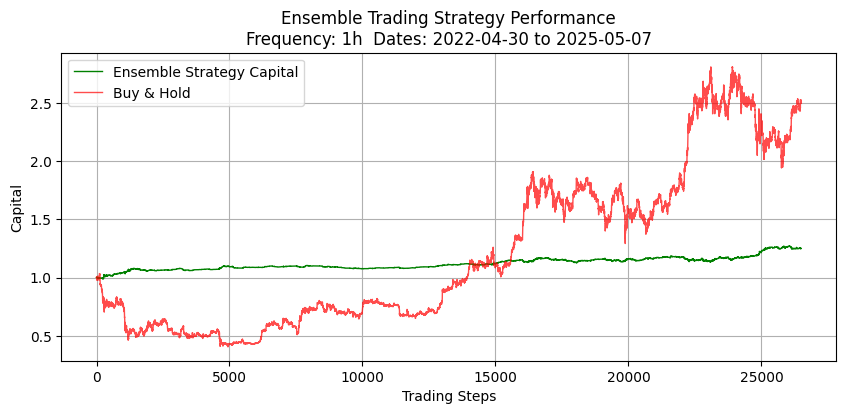

Ensemble Strategy Metrics: {'Total Return': 0.2492040909175357, 'Buy and Hold Return': 1.52281247637203, 'Hit Rate': 0.5178647384091876, 'Sharpe Ratio': 1.3376968079922569, 'Number of Trades': 14106}
Hit Rate (Long/Price Rise): 55.15%
Hit Rate (Short/Price Fall): 50.31%
Number of Long Trades: 4312
Number of Short Trades: 9794
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


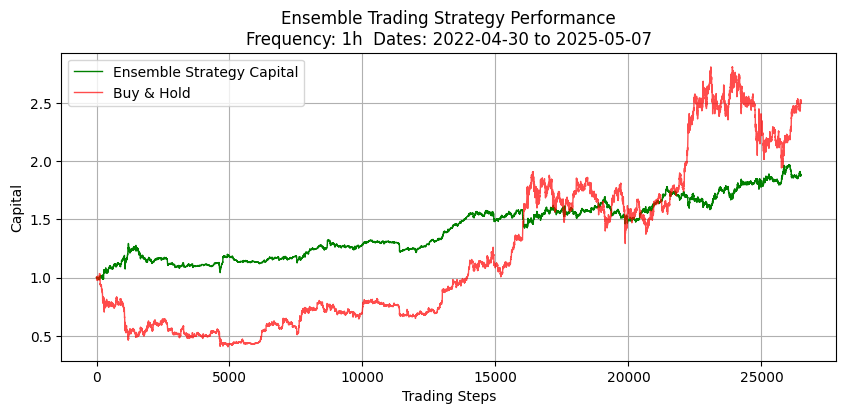

Ensemble Strategy Metrics: {'Total Return': 0.8770144868713676, 'Buy and Hold Return': 1.52281247637203, 'Hit Rate': 0.5368637459237204, 'Sharpe Ratio': 1.0460815405393906, 'Number of Trades': 14106}
Hit Rate (Long/Price Rise): 56.73%
Hit Rate (Short/Price Fall): 51.86%
Number of Long Trades: 5286
Number of Short Trades: 8820
Testing ETH with trading window 1
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.00015614739063441247
Fraction positive: 0.5089653089728587
Fraction negative: 0.4901287229625156
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollin

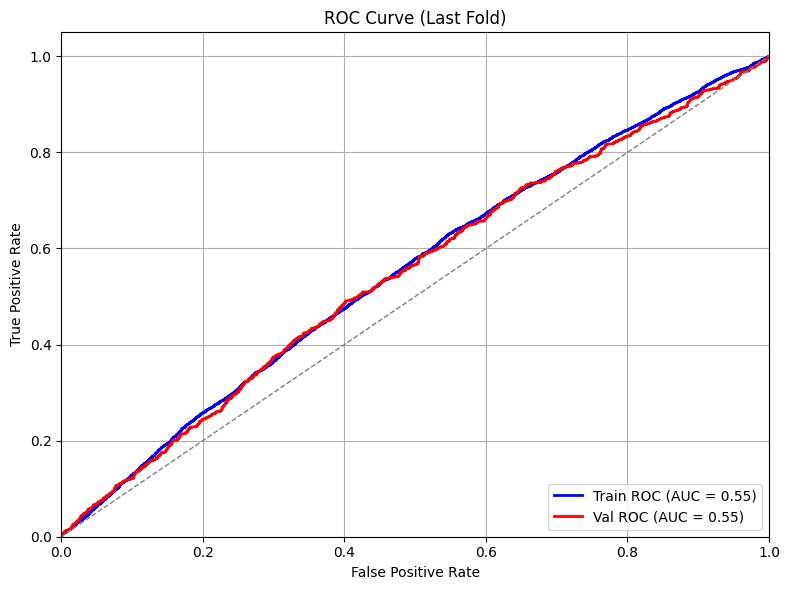

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 52.40%
Confusion Matrix (Total):
[[5558 5879]
 [5379 6836]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.51      0.71      0.60      1285
          Up       0.56      0.35      0.43      1343

    accuracy                           0.53      2628
   macro avg       0.54      0.53      0.52      2628
weighted avg       0.54      0.53      0.51      2628

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -3875.097880
  Test samples: 26491
  Features used: 31
  Overall Accuracy: 0.5143 (51.43%)
  Weighted Accuracy: 0.5143 (51.43%)
  Rise Accuracy: 0.1557 (15.57%) - 13305 samples
  Fall Accuracy: 0.8762 (87.62%) - 13186 samples
  Precision: 0.5592
  Recall: 0.1557
  F1 Score: 0.2436
  Confusion Matrix (Fall/Rise):
    [[11553 1633]  # Predicted Fall
     [11233 2072]]  # Predicted Rise
     # Actual Fall 

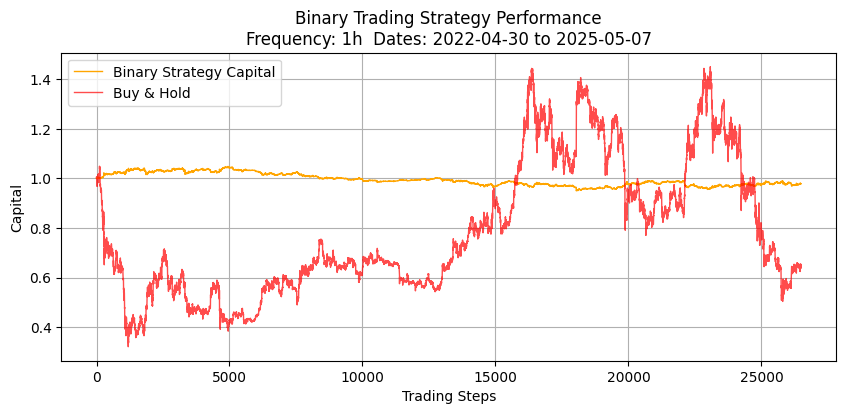

{'Total Return': -0.022040234767714995, 'Buy and Hold Return': -0.3552362889934056, 'Hit Rate': 0.5074367685919214, 'Sharpe Ratio': -0.160732949351549, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 53.66%
Hit Rate (Short/Price Fall): 50.27%
Number of Long Trades: 3705
Number of Short Trades: 22785
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 04:00:00 to 2025-05-07 23:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


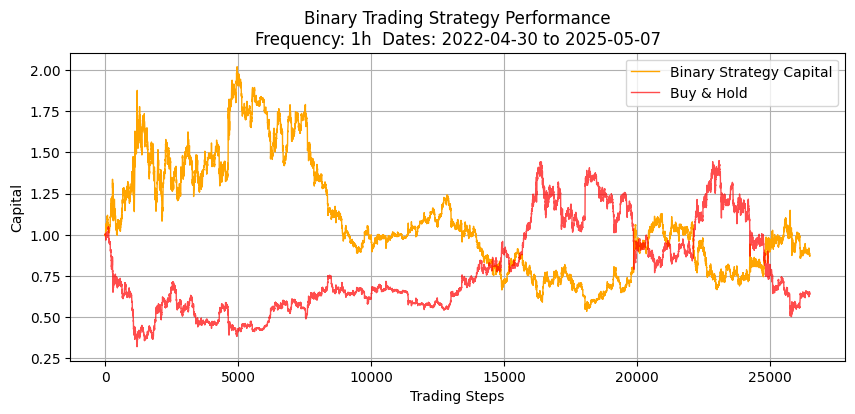

{'Total Return': -0.12810479858908663, 'Buy and Hold Return': -0.3552362889934056, 'Hit Rate': 0.5074367685919214, 'Sharpe Ratio': -0.05337783403902917, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 53.66%
Hit Rate (Short/Price Fall): 50.27%
Number of Long Trades: 3705
Number of Short Trades: 22785
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


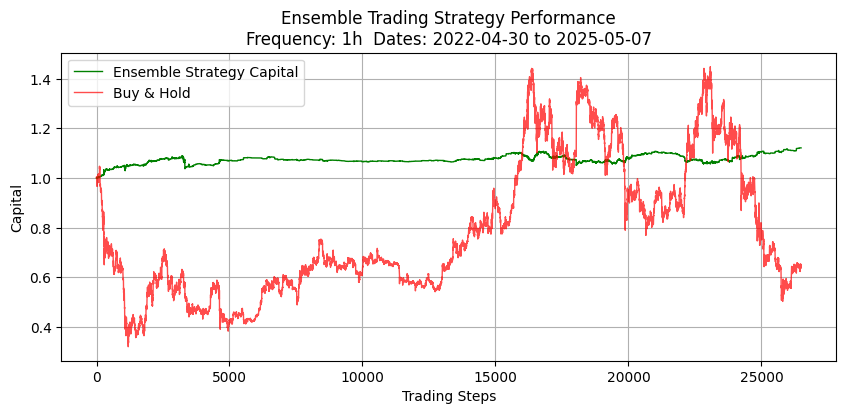

Ensemble Strategy Metrics: {'Total Return': 0.1216527192772574, 'Buy and Hold Return': -0.35586025498095525, 'Hit Rate': 0.5016337326902132, 'Sharpe Ratio': 0.7408126780534199, 'Number of Trades': 6427}
Hit Rate (Long/Price Rise): 54.39%
Hit Rate (Short/Price Fall): 48.55%
Number of Long Trades: 1778
Number of Short Trades: 4649
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


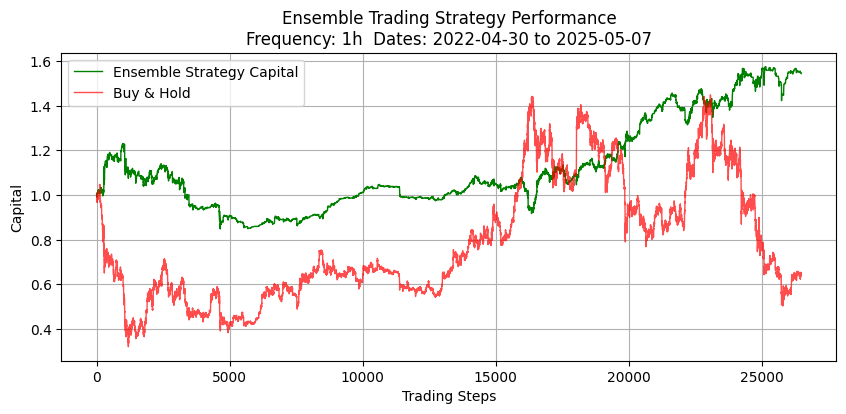

Ensemble Strategy Metrics: {'Total Return': 0.5442168618346694, 'Buy and Hold Return': -0.35586025498095525, 'Hit Rate': 0.5371090711062704, 'Sharpe Ratio': 0.7836031770740586, 'Number of Trades': 6427}
Hit Rate (Long/Price Rise): 55.81%
Hit Rate (Short/Price Fall): 51.50%
Number of Long Trades: 3295
Number of Short Trades: 3132
Testing TRX with trading window 1
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.00010172305597998901
Fraction positive: 0.5055301800611528
Fraction negative: 0.48186176437280587
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_

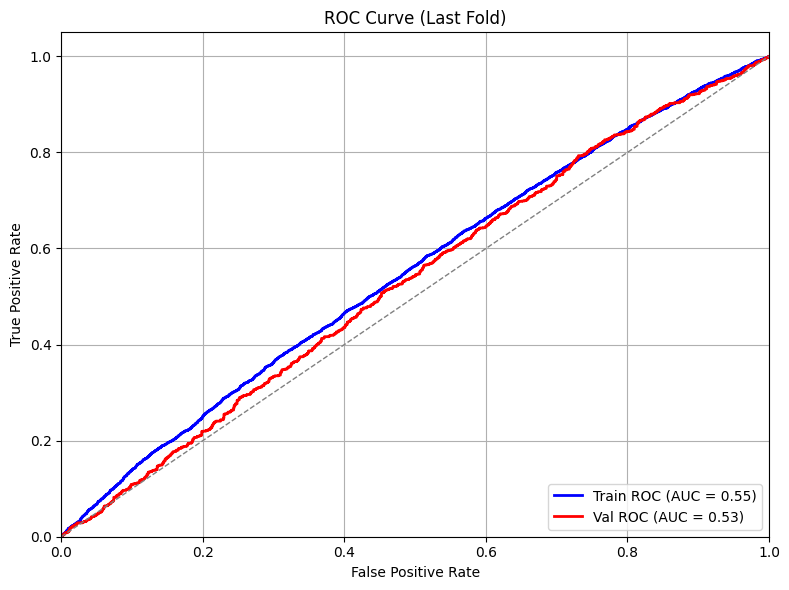

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.37%
Confusion Matrix (Total):
[[6475 4923]
 [6580 5674]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.47      0.89      0.62      1240
          Up       0.54      0.11      0.19      1388

    accuracy                           0.48      2628
   macro avg       0.51      0.50      0.40      2628
weighted avg       0.51      0.48      0.39      2628

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -7829.168338
  Test samples: 26491
  Features used: 30
  Overall Accuracy: 0.5122 (51.22%)
  Weighted Accuracy: 0.5122 (51.22%)
  Rise Accuracy: 0.7236 (72.36%) - 13625 samples
  Fall Accuracy: 0.2883 (28.83%) - 12866 samples
  Precision: 0.5185
  Recall: 0.7236
  F1 Score: 0.6041
  Confusion Matrix (Fall/Rise):
    [[3709 9157]  # Predicted Fall
     [3766 9859]]  # Predicted Rise
     # Actual Fall  A

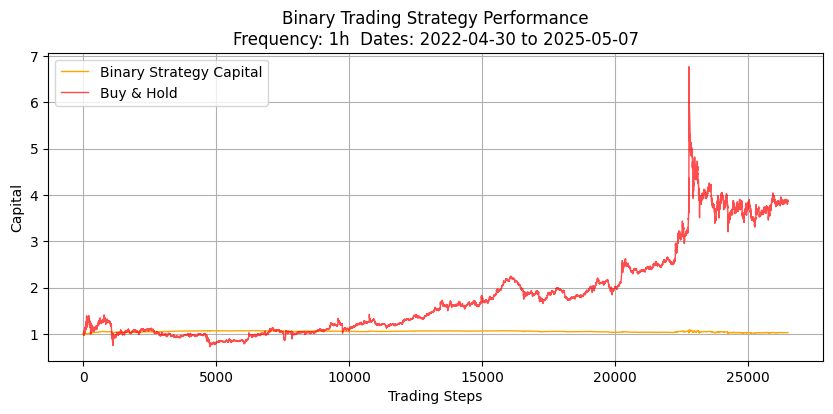

{'Total Return': 0.026903709027449763, 'Buy and Hold Return': 2.8862004370902277, 'Hit Rate': 0.5032465081162703, 'Sharpe Ratio': 0.15724413501605308, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 51.55%
Hit Rate (Short/Price Fall): 47.21%
Number of Long Trades: 19015
Number of Short Trades: 7475
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 04:00:00 to 2025-05-07 23:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


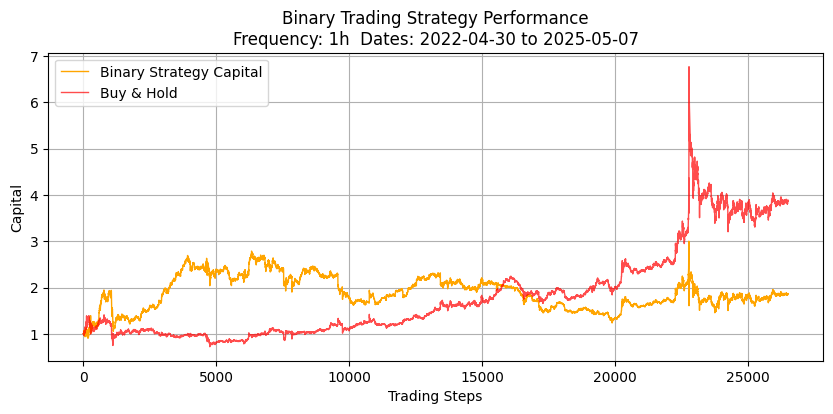

{'Total Return': 0.8693160898538026, 'Buy and Hold Return': 2.8862004370902277, 'Hit Rate': 0.5032465081162703, 'Sharpe Ratio': 0.2650853399730834, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 51.55%
Hit Rate (Short/Price Fall): 47.21%
Number of Long Trades: 19015
Number of Short Trades: 7475
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


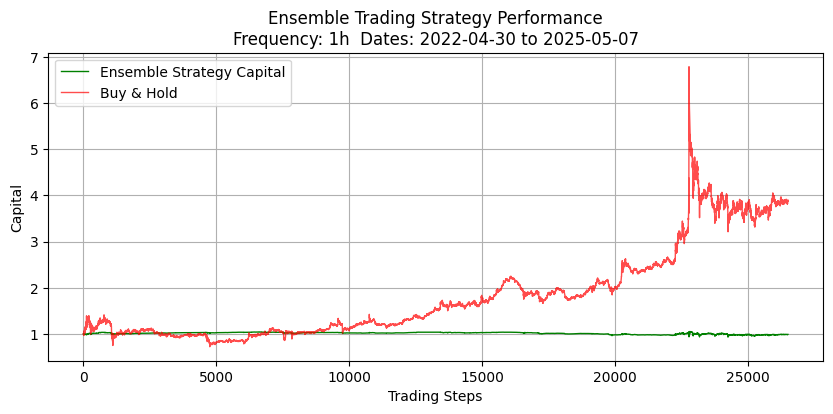

Ensemble Strategy Metrics: {'Total Return': -0.010411191823323174, 'Buy and Hold Return': 2.8950168192130175, 'Hit Rate': 0.504899292324442, 'Sharpe Ratio': -0.03425548167765949, 'Number of Trades': 18370}
Hit Rate (Long/Price Rise): 51.54%
Hit Rate (Short/Price Fall): 44.02%
Number of Long Trades: 15805
Number of Short Trades: 2565
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


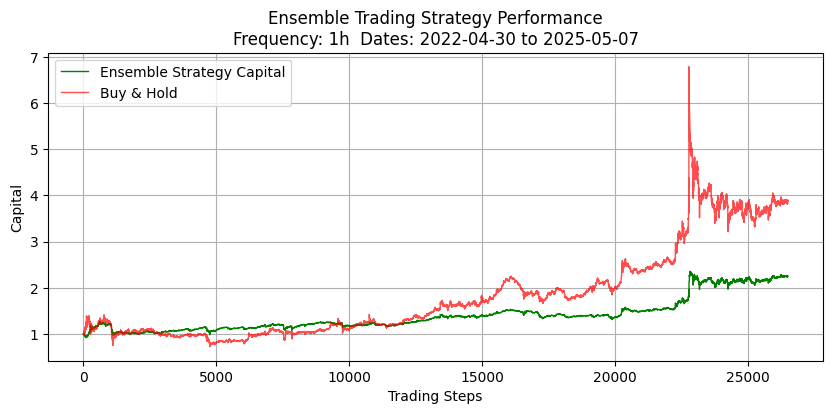

Ensemble Strategy Metrics: {'Total Return': 1.2566892837370385, 'Buy and Hold Return': 2.8950168192130175, 'Hit Rate': 0.520141535111595, 'Sharpe Ratio': 1.1032359806000704, 'Number of Trades': 18370}
Hit Rate (Long/Price Rise): 52.01%
Hit Rate (Short/Price Fall): 52.63%
Number of Long Trades: 18161
Number of Short Trades: 209
Testing XRP with trading window 1
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0001052756968163596
Fraction positive: 0.5033785059076668
Fraction negative: 0.49450756860820655
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1',

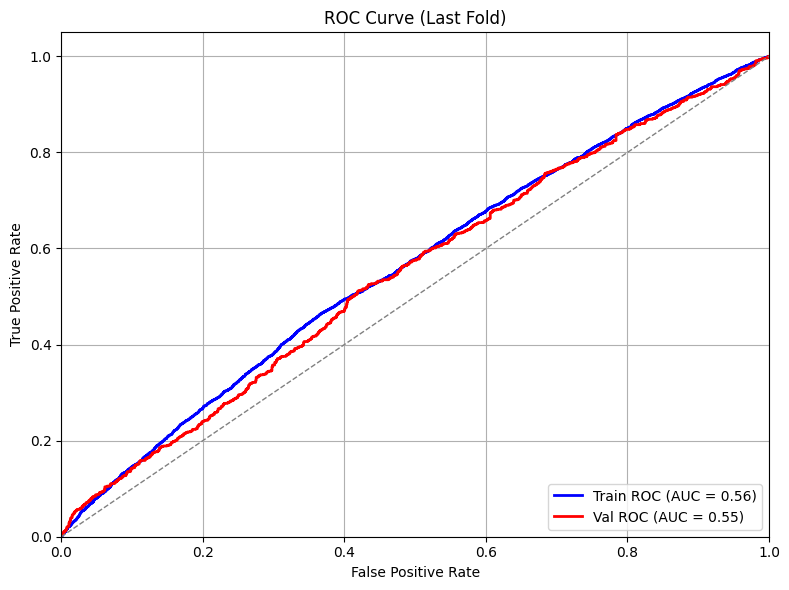

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 52.99%
Confusion Matrix (Total):
[[6683 4967]
 [6156 5855]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.53      0.52      0.53      1300
          Up       0.54      0.55      0.55      1329

    accuracy                           0.54      2629
   macro avg       0.54      0.54      0.54      2629
weighted avg       0.54      0.54      0.54      2629

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -3012.581522
  Test samples: 26491
  Features used: 30
  Overall Accuracy: 0.5395 (53.95%)
  Weighted Accuracy: 0.5395 (53.95%)
  Rise Accuracy: 0.6010 (60.10%) - 13395 samples
  Fall Accuracy: 0.4766 (47.66%) - 13096 samples
  Precision: 0.5401
  Recall: 0.6010
  F1 Score: 0.5689
  Confusion Matrix (Fall/Rise):
    [[6241 6855]  # Predicted Fall
     [5345 8050]]  # Predicted Rise
     # Actual Fall  A

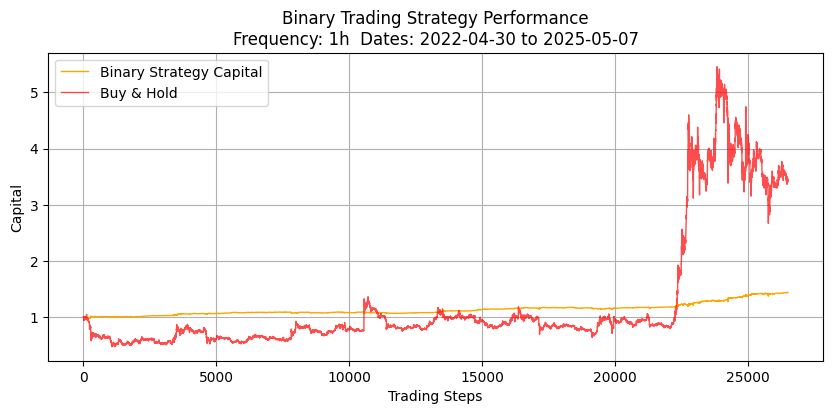

{'Total Return': 0.43839742893844913, 'Buy and Hold Return': 2.4329164985881406, 'Hit Rate': 0.5218573046432616, 'Sharpe Ratio': 1.6893869509490207, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 52.93%
Hit Rate (Short/Price Fall): 51.23%
Number of Long Trades: 14905
Number of Short Trades: 11585
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 04:00:00 to 2025-05-07 23:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


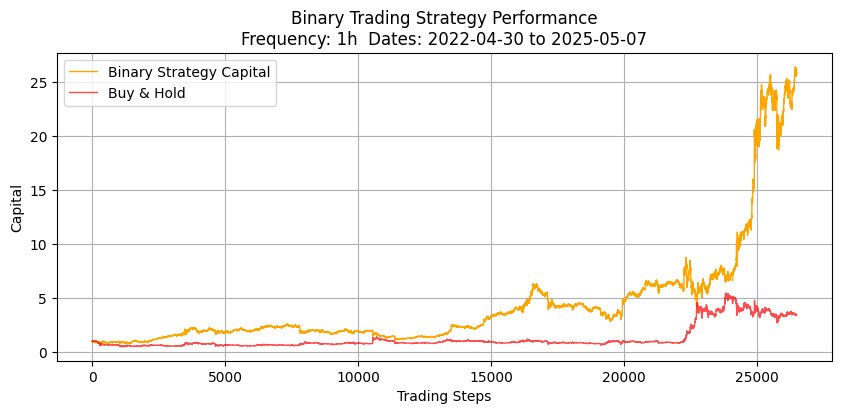

{'Total Return': 24.872576380741766, 'Buy and Hold Return': 2.4329164985881406, 'Hit Rate': 0.5218573046432616, 'Sharpe Ratio': 1.2390081505464627, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 52.93%
Hit Rate (Short/Price Fall): 51.23%
Number of Long Trades: 14905
Number of Short Trades: 11585
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


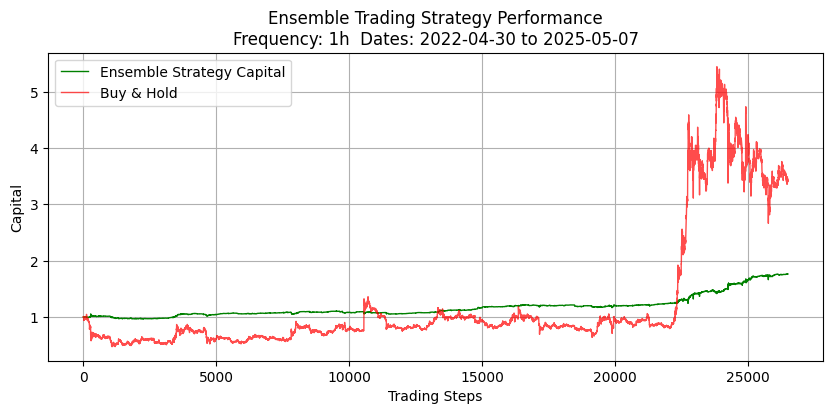

Ensemble Strategy Metrics: {'Total Return': 0.7650407976678162, 'Buy and Hold Return': 2.427386226339106, 'Hit Rate': 0.5307389774373835, 'Sharpe Ratio': 1.521210442411158, 'Number of Trades': 14493}
Hit Rate (Long/Price Rise): 53.58%
Hit Rate (Short/Price Fall): 52.40%
Number of Long Trades: 8266
Number of Short Trades: 6227
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


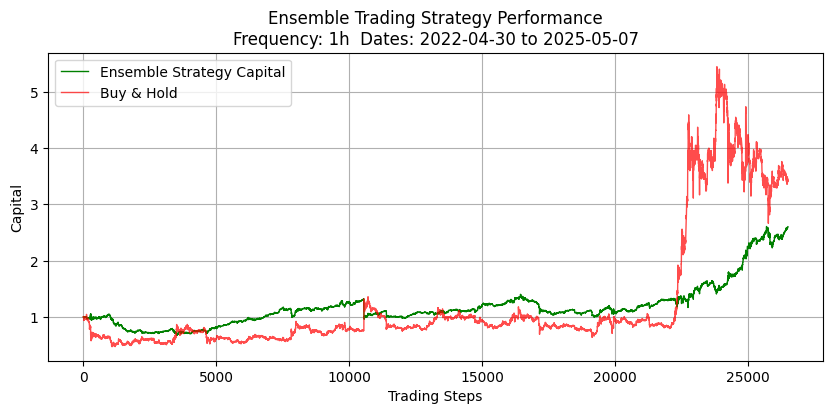

Ensemble Strategy Metrics: {'Total Return': 1.6044601673950765, 'Buy and Hold Return': 2.427386226339106, 'Hit Rate': 0.5376388601393777, 'Sharpe Ratio': 1.1732760397247415, 'Number of Trades': 14493}
Hit Rate (Long/Price Rise): 54.33%
Hit Rate (Short/Price Fall): 53.06%
Number of Long Trades: 8046
Number of Short Trades: 6447
Balanced logistic regression testing complete!


In [3]:
import os
import pandas as pd
import numpy as np
from regression import run_indicators, test_model
from trading import simulate_trading, simulate_trading_ensemble, simulate_trading_binary
import importlib

indicator_module = importlib.import_module('indicators')

original_columns = [
    'bam_vwa', 'bam_open', 'bam_close',
    'bam_high', 'bam_low', 'bam_volatility_1m_return', 'base_volume',
    'pct_buy_volume', 'annual_interest_rate', 'spread_1m_vwa_vwa',
    'spread_twa'
]
symbols = ['BNB', 'BTC', 'ETH', 'TRX', 'XRP']

for symbol in symbols:
    for trading_window in range(1, 2):
        print(f"Testing {symbol} with trading window {trading_window}")
        try:
            df = pd.read_csv(f'indicator_results_{symbol}.csv')
            df1 = df[df['window'] == trading_window]

            selected_indicators = df1[df1['weighted_win'] > 0.50]['indicator'].unique()
            if len(selected_indicators) == 0:
                print(f"No indicators with win rate > 50% for {symbol} - {trading_window}h window")
                continue
            print(f"Selected indicators: {selected_indicators}")

            df_symbol = pd.read_csv(f'{symbol}_spot_full.csv')
            half = len(df_symbol) // 2
            df_train = df_symbol.iloc[:half]
            
            # Get start time for testing (second half of data)
            start_time = df_symbol.iloc[half]['close_time']
            
            print(f"Training on: {df_train.iloc[0]['close_time']} to {df_train.iloc[-1]['close_time']}")
            print(f"Testing on: {start_time} to {df_symbol.iloc[-1]['close_time']}")

            print(f"\n=== Testing BALANCED LOGISTIC REGRESSION ===")
            try:
                # Test with balanced class weights
                linear, binary, scaler = run_indicators(df_train, selected_indicators.tolist() + original_columns, 
                                               time_window=trading_window, quantile=False, obj=None)
                
                if linear is not None and binary is not None and scaler is not None:
                    print(f"Testing balanced logistic regression on test set...")
                    r2_binary = test_model(df_symbol, binary, selected_indicators.tolist(), original_columns, 
                                         target_col='bam_close', time_window=trading_window, start_time=start_time, scaler=scaler)
                    
                    print(f"Binary-only trading simulation (balanced model)")
                    simulate_trading_binary(df_symbol, binary, selected_indicators.tolist() + original_columns,
                                         start_time=start_time,
                                         trading_window=trading_window, plot=True, strategy='prob', scaler=scaler)
                    
                    print(f"Binary-only trading simulation (aggressive)")
                    simulate_trading_binary(df_symbol, binary, selected_indicators.tolist() + original_columns,
                                         start_time=start_time,
                                         trading_window=trading_window, plot=True, strategy='aggressive', scaler=scaler)
                    
                    print(f"Ensemble trading simulation (linear + balanced binary)")
                    simulate_trading_ensemble(df_symbol, linear, binary, selected_indicators.tolist() + original_columns,
                                           start_time=start_time,
                                           trading_window=trading_window, plot=True, strategy='proba_ensemble', scaler=scaler)
                    
                    print(f"Aggressive ensemble trading simulation (linear + balanced binary)")
                    simulate_trading_ensemble(df_symbol, linear, binary, selected_indicators.tolist() + original_columns,
                                           start_time=start_time,
                                           trading_window=trading_window, plot=True, strategy='aggressive_ensemble', scaler=scaler)
                else:
                    print(f"Failed to create balanced logistic regression model")
                    
            except Exception as e:
                print(f"Error with balanced logistic regression: {str(e)}")
                continue
                    
        except Exception as e:
            print(f"Error processing {symbol} - {trading_window}h: {str(e)}")
            continue

print("Balanced logistic regression testing complete!")


Testing BNB with trading window 1
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.00016773470410594085
Fraction positive: 0.5117964591748141
Fraction negative: 0.48495715526027705
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14', 'stochastic_oscillator_14_0', 'stochastic_oscillator_14_1', 'ichimoku_cloud_9_26_52_0', 'ichimoku_cloud_9_26_52_1', 'ichimoku_cloud_9_26_52_2', 'ichimoku_cloud_9_26_52_3', 'vwap', 'atr', 'bam_vwa', 'bam_open', 'bam_close', 'bam_high', 'bam_low', 'bam_volatility_1m_return', 'base_vol

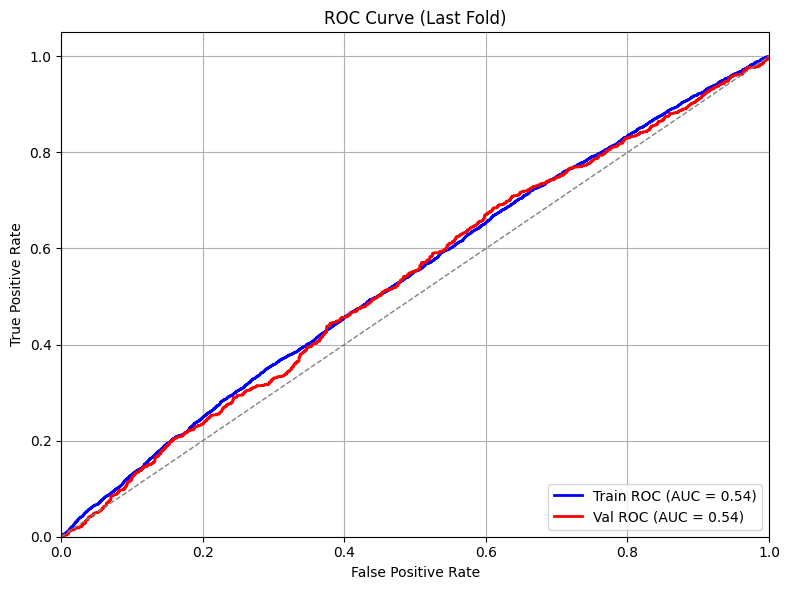

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.83%
Confusion Matrix (Total):
[[6964 4517]
 [7112 5059]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.51      0.63      0.56      1283
          Up       0.54      0.42      0.47      1345

    accuracy                           0.52      2628
   macro avg       0.53      0.52      0.52      2628
weighted avg       0.53      0.52      0.52      2628

Testing linear model on test set...
Test Model Results:
  R² Score: -0.014662
  Test samples: 26491
  Features used: 31
  Overall Accuracy: 0.5076 (50.76%)
  Weighted Accuracy: 0.5076 (50.76%)
  Rise Accuracy: 0.8038 (80.38%) - 13213 samples
  Fall Accuracy: 0.2129 (21.29%) - 13278 samples
  Precision: 0.5040
  Recall: 0.8038
  F1 Score: 0.6196
  Confusion Matrix (Fall/Rise):
    [[2827 10451]  # Predicted Fall
     [2592 10621]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggres

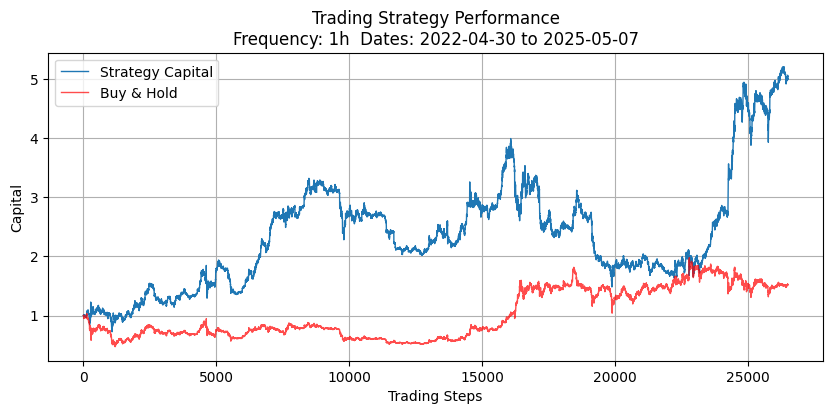

{'Total Return': 4.0020634596328835, 'Buy and Hold Return': 0.517189666036547, 'Hit Rate': 0.4997734994337486, 'Sharpe Ratio': 0.9110240034058493, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 50.14%
Hit Rate (Short/Price Fall): 49.34%
Number of Long Trades: 21072
Number of Short Trades: 5418
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


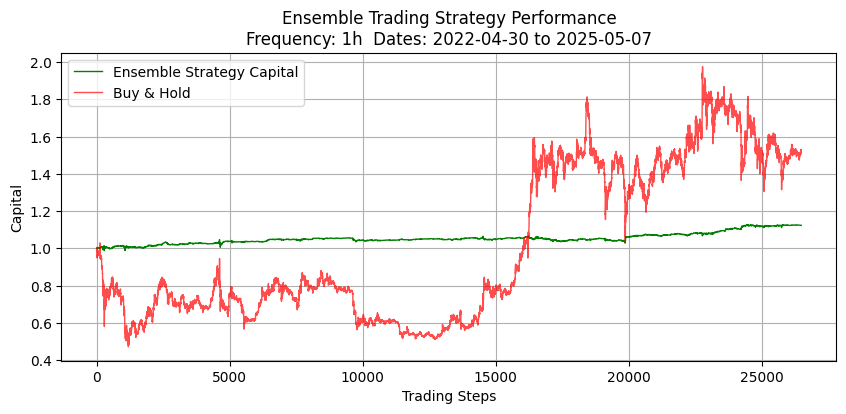

Ensemble Strategy Metrics: {'Total Return': 0.12384540156828261, 'Buy and Hold Return': 0.5156615888203452, 'Hit Rate': 0.515077365958978, 'Sharpe Ratio': 0.9488670085960963, 'Number of Trades': 13895}
Hit Rate (Long/Price Rise): 54.19%
Hit Rate (Short/Price Fall): 48.13%
Number of Long Trades: 7749
Number of Short Trades: 6146
Testing BTC with trading window 1
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.00010939550027540065
Fraction positive: 0.5104375070778755
Fraction negative: 0.4893737495753275
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0

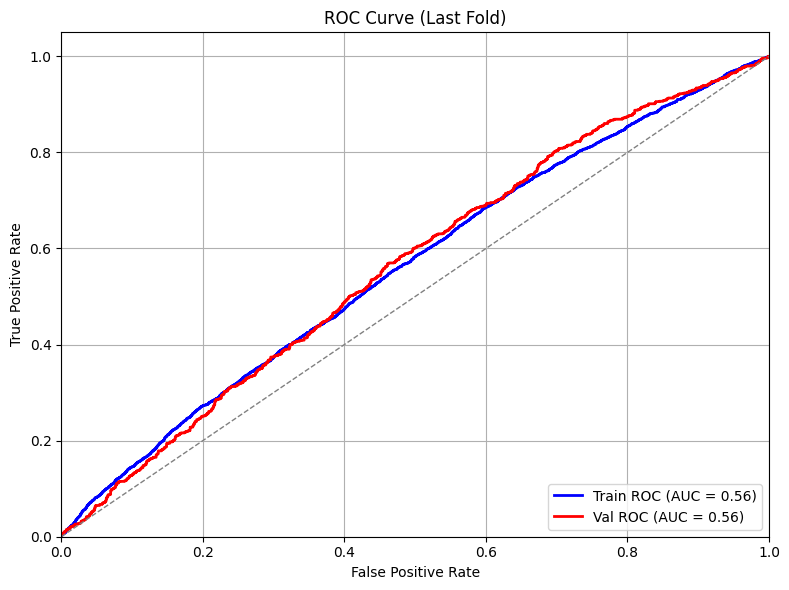

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 53.34%
Confusion Matrix (Total):
[[6566 5089]
 [5948 6049]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.52      0.64      0.57      1291
          Up       0.56      0.44      0.49      1337

    accuracy                           0.54      2628
   macro avg       0.54      0.54      0.53      2628
weighted avg       0.54      0.54      0.53      2628

Testing linear model on test set...
Test Model Results:
  R² Score: -0.014060
  Test samples: 26491
  Features used: 31
  Overall Accuracy: 0.5104 (51.04%)
  Weighted Accuracy: 0.5104 (51.04%)
  Rise Accuracy: 0.5866 (58.66%) - 13428 samples
  Fall Accuracy: 0.4320 (43.20%) - 13063 samples
  Precision: 0.5149
  Recall: 0.5866
  F1 Score: 0.5484
  Confusion Matrix (Fall/Rise):
    [[5643 7420]  # Predicted Fall
     [5551 7877]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressi

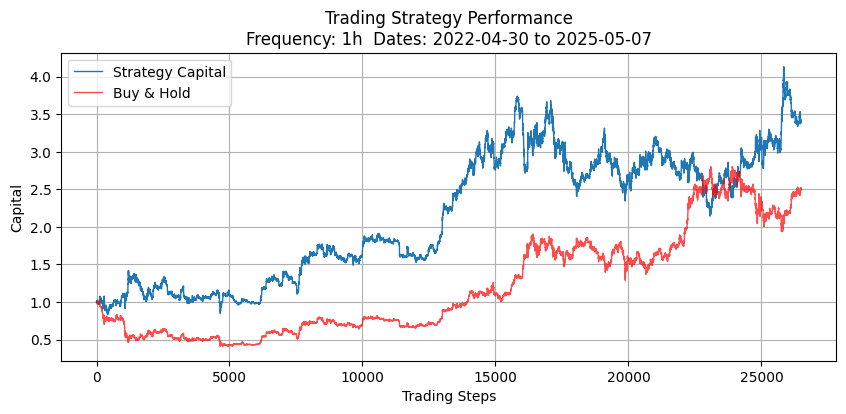

{'Total Return': 2.3959245268788827, 'Buy and Hold Return': 1.516089131482194, 'Hit Rate': 0.5063420158550397, 'Sharpe Ratio': 0.6729093704702431, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 51.15%
Hit Rate (Short/Price Fall): 49.92%
Number of Long Trades: 15297
Number of Short Trades: 11193
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


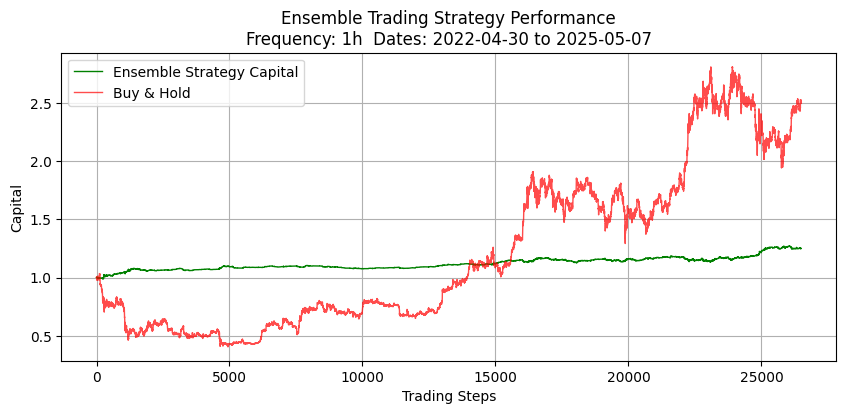

Ensemble Strategy Metrics: {'Total Return': 0.2492040909175357, 'Buy and Hold Return': 1.52281247637203, 'Hit Rate': 0.5178647384091876, 'Sharpe Ratio': 1.3376968079922569, 'Number of Trades': 14106}
Hit Rate (Long/Price Rise): 55.15%
Hit Rate (Short/Price Fall): 50.31%
Number of Long Trades: 4312
Number of Short Trades: 9794
Testing ETH with trading window 1
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.00015614739063441247
Fraction positive: 0.5089653089728587
Fraction negative: 0.4901287229625156
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0',

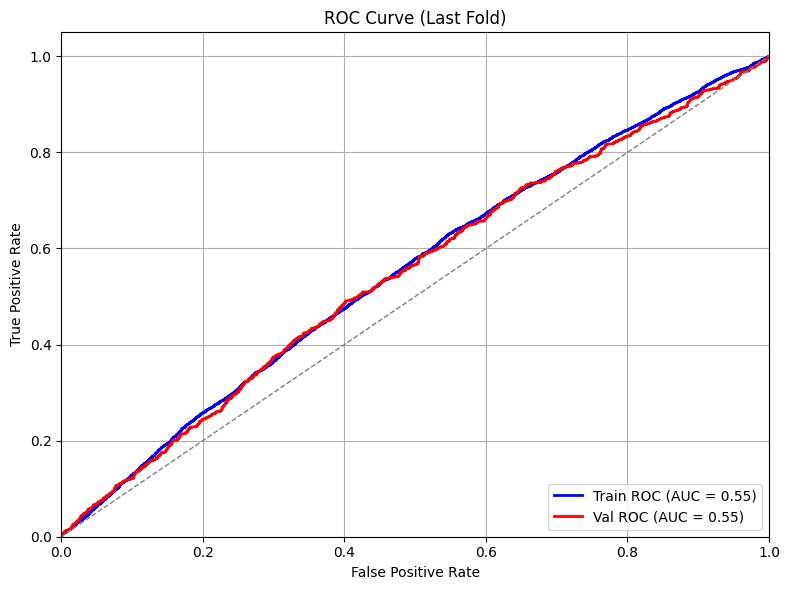

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 52.40%
Confusion Matrix (Total):
[[5558 5879]
 [5379 6836]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.51      0.71      0.60      1285
          Up       0.56      0.35      0.43      1343

    accuracy                           0.53      2628
   macro avg       0.54      0.53      0.52      2628
weighted avg       0.54      0.53      0.51      2628

Testing linear model on test set...
Test Model Results:
  R² Score: -0.012095
  Test samples: 26491
  Features used: 31
  Overall Accuracy: 0.5064 (50.64%)
  Weighted Accuracy: 0.5064 (50.64%)
  Rise Accuracy: 0.8710 (87.10%) - 13305 samples
  Fall Accuracy: 0.1385 (13.85%) - 13186 samples
  Precision: 0.5050
  Recall: 0.8710
  F1 Score: 0.6393
  Confusion Matrix (Fall/Rise):
    [[1826 11360]  # Predicted Fall
     [1716 11589]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggres

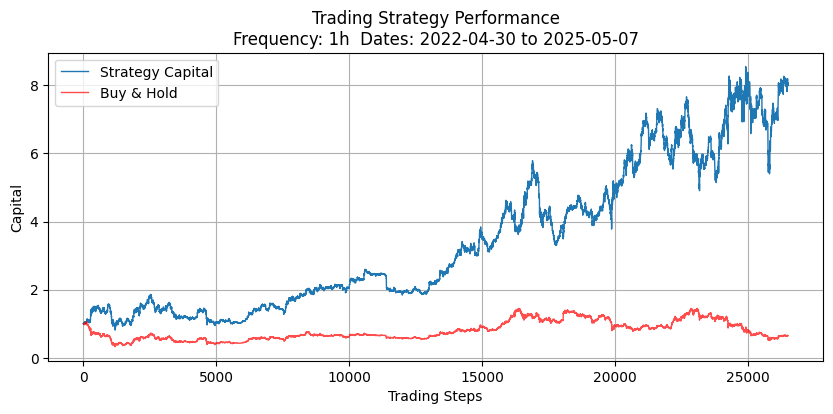

{'Total Return': 7.051739318771178, 'Buy and Hold Return': -0.3552362889934056, 'Hit Rate': 0.5037372593431484, 'Sharpe Ratio': 0.8371391186779601, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 50.35%
Hit Rate (Short/Price Fall): 50.54%
Number of Long Trades: 22948
Number of Short Trades: 3542
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


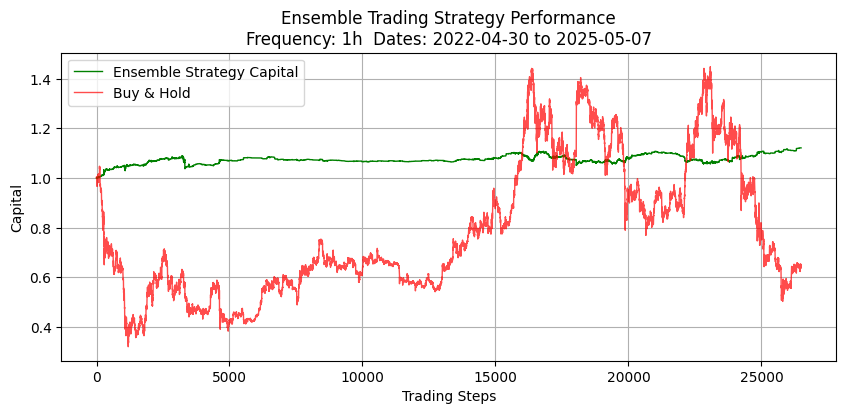

Ensemble Strategy Metrics: {'Total Return': 0.1216527192772574, 'Buy and Hold Return': -0.35586025498095525, 'Hit Rate': 0.5016337326902132, 'Sharpe Ratio': 0.7408126780534199, 'Number of Trades': 6427}
Hit Rate (Long/Price Rise): 54.39%
Hit Rate (Short/Price Fall): 48.55%
Number of Long Trades: 1778
Number of Short Trades: 4649
Testing TRX with trading window 1
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.00010172305597998901
Fraction positive: 0.5055301800611528
Fraction negative: 0.48186176437280587
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14

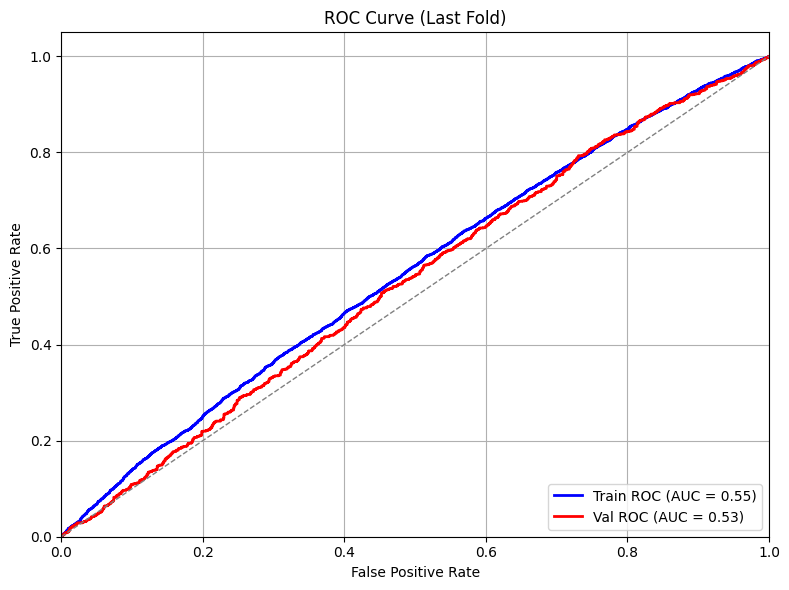

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.37%
Confusion Matrix (Total):
[[6475 4923]
 [6580 5674]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.47      0.89      0.62      1240
          Up       0.54      0.11      0.19      1388

    accuracy                           0.48      2628
   macro avg       0.51      0.50      0.40      2628
weighted avg       0.51      0.48      0.39      2628

Testing linear model on test set...
Test Model Results:
  R² Score: -0.090929
  Test samples: 26491
  Features used: 30
  Overall Accuracy: 0.5137 (51.37%)
  Weighted Accuracy: 0.5137 (51.37%)
  Rise Accuracy: 0.9604 (96.04%) - 13625 samples
  Fall Accuracy: 0.0406 (4.06%) - 12866 samples
  Precision: 0.5146
  Recall: 0.9604
  F1 Score: 0.6701
  Confusion Matrix (Fall/Rise):
    [[ 523 12343]  # Predicted Fall
     [ 540 13085]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggress

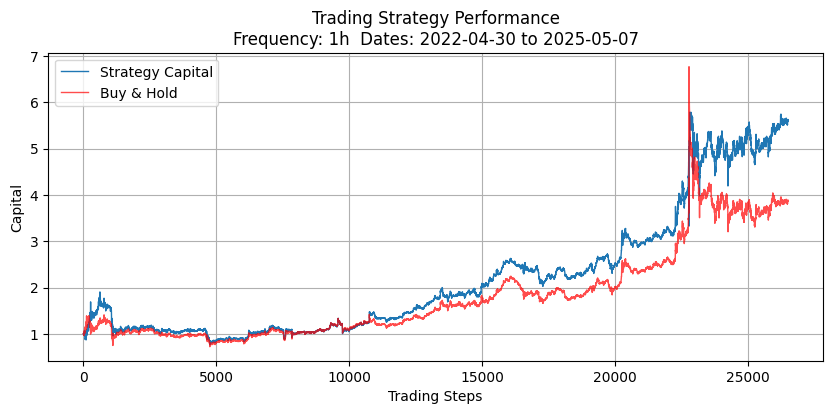

{'Total Return': 4.62136481869435, 'Buy and Hold Return': 2.8862004370902277, 'Hit Rate': 0.5150622876557192, 'Sharpe Ratio': 0.9412605451099271, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 51.57%
Hit Rate (Short/Price Fall): 50.05%
Number of Long Trades: 25427
Number of Short Trades: 1063
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


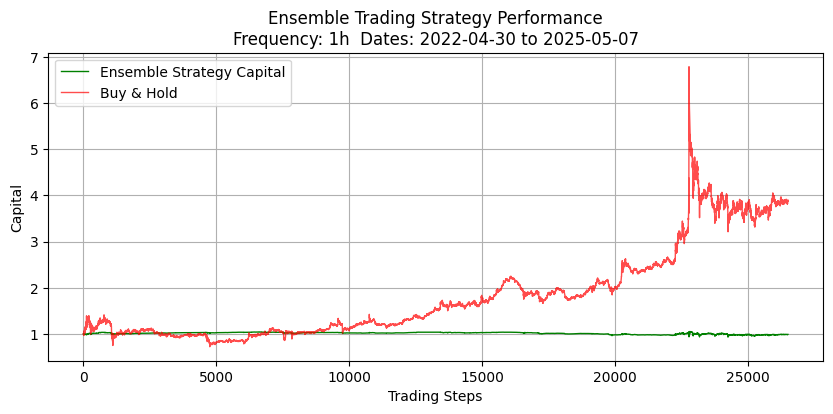

Ensemble Strategy Metrics: {'Total Return': -0.010411191823323174, 'Buy and Hold Return': 2.8950168192130175, 'Hit Rate': 0.504899292324442, 'Sharpe Ratio': -0.03425548167765949, 'Number of Trades': 18370}
Hit Rate (Long/Price Rise): 51.54%
Hit Rate (Short/Price Fall): 44.02%
Number of Long Trades: 15805
Number of Short Trades: 2565
Testing XRP with trading window 1
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0001052756968163596
Fraction positive: 0.5033785059076668
Fraction negative: 0.49450756860820655
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx

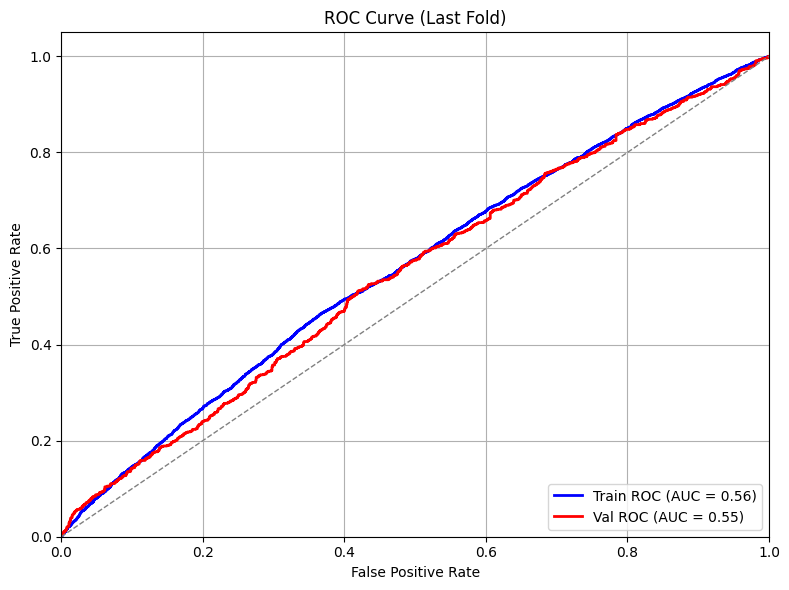

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 52.99%
Confusion Matrix (Total):
[[6683 4967]
 [6156 5855]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.53      0.52      0.53      1300
          Up       0.54      0.55      0.55      1329

    accuracy                           0.54      2629
   macro avg       0.54      0.54      0.54      2629
weighted avg       0.54      0.54      0.54      2629

Testing linear model on test set...
Test Model Results:
  R² Score: -0.020181
  Test samples: 26491
  Features used: 30
  Overall Accuracy: 0.5084 (50.84%)
  Weighted Accuracy: 0.5084 (50.84%)
  Rise Accuracy: 0.5060 (50.60%) - 13395 samples
  Fall Accuracy: 0.5109 (51.09%) - 13096 samples
  Precision: 0.5141
  Recall: 0.5060
  F1 Score: 0.5100
  Confusion Matrix (Fall/Rise):
    [[6691 6405]  # Predicted Fall
     [6617 6778]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressi

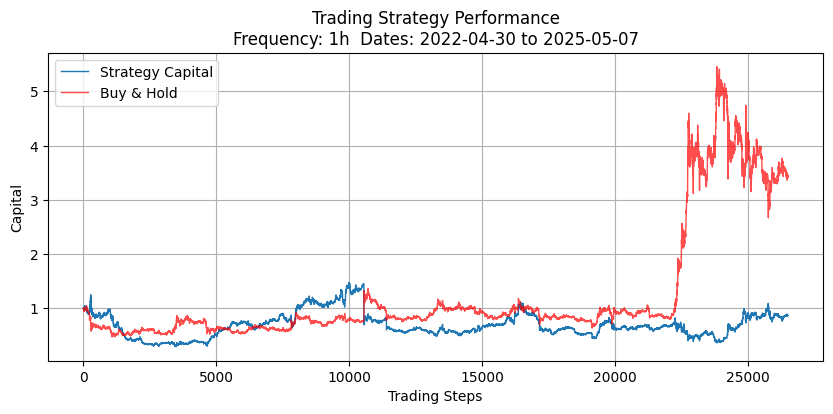

{'Total Return': -0.1327071573664057, 'Buy and Hold Return': 2.4329164985881406, 'Hit Rate': 0.5020007550018875, 'Sharpe Ratio': -0.06615210812822564, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 51.34%
Hit Rate (Short/Price Fall): 49.07%
Number of Long Trades: 13183
Number of Short Trades: 13307
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


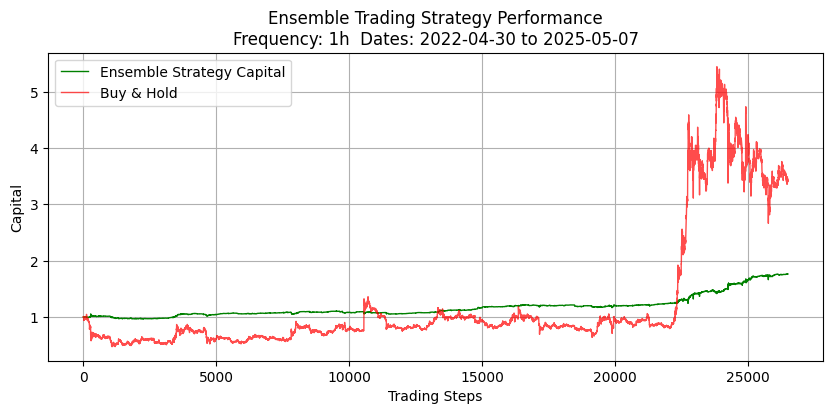

Ensemble Strategy Metrics: {'Total Return': 0.7650407976678162, 'Buy and Hold Return': 2.427386226339106, 'Hit Rate': 0.5307389774373835, 'Sharpe Ratio': 1.521210442411158, 'Number of Trades': 14493}
Hit Rate (Long/Price Rise): 53.58%
Hit Rate (Short/Price Fall): 52.40%
Number of Long Trades: 8266
Number of Short Trades: 6227
Linear model testing complete!


In [4]:
for symbol in symbols:
    for trading_window in range(1, 2):
        print(f"Testing {symbol} with trading window {trading_window}")
        try:
            df = pd.read_csv(f'indicator_results_{symbol}.csv')
            df1 = df[df['window'] == trading_window]

            selected_indicators = df1[df1['win'] > 0.50]['indicator'].unique()
            if len(selected_indicators) == 0:
                print(f"No indicators with win rate > 50% for {symbol} - {trading_window}h window")
                continue
            print(f"Selected indicators: {selected_indicators}")

            df_symbol = pd.read_csv(f'{symbol}_spot_full.csv')
            half = len(df_symbol) // 2
            df_train = df_symbol.iloc[:half]
            
            # Get start time for testing (second half of data)
            start_time = df_symbol.iloc[half]['close_time']
            
            print(f"Training on: {df_train.iloc[0]['close_time']} to {df_train.iloc[-1]['close_time']}")
            print(f"Testing on: {start_time} to {df_symbol.iloc[-1]['close_time']}")

            for obj in [None]:
                print(f"\n=== Testing {obj.upper() if obj else 'NONE'} model ===")
                try:
                    linear, binary, scaler = run_indicators(df_train, selected_indicators.tolist() + original_columns, 
                                                   time_window=trading_window, quantile=False, obj=obj)
                    
                    if linear is not None and binary is not None and scaler is not None:
                        print(f"Testing linear model on test set...")
                        r2_linear = test_model(df_symbol, linear, selected_indicators.tolist(), original_columns, 
                                             target_col='bam_close', time_window=trading_window, start_time=start_time, scaler=scaler)
                        
                        print(f"aggressive strategy (linear model)")
                        simulate_trading(df_symbol, linear, selected_indicators.tolist() + original_columns,
                                       start_time=start_time,
                                       trading_window=trading_window, plot=True, strategy='aggressive', scaler=scaler)
                        
                        print(f"proba_ensemble strategy (linear+binary model)")
                        simulate_trading_ensemble(df_symbol, linear, binary, selected_indicators.tolist() + original_columns,
                                               start_time=start_time,
                                               trading_window=trading_window, plot=True, strategy='proba_ensemble', scaler=scaler)
                    else:
                        print(f"Failed to create {obj} model")
                        
                except Exception as e:
                    print(f"Error with {obj} model: {str(e)}")
                    continue
                    
        except Exception as e:
            print(f"Error processing {symbol} - {trading_window}h: {str(e)}")
            continue

print("Linear model testing complete!")

# polynomial model testing

Testing BNB with trading window 1 (polynomial only)
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Mean target_return: 0.00016773470410594085
Fraction positive: 0.5117964591748141
Fraction negative: 0.48495715526027705
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14', 'stochastic_oscillator_14_0', 'stochastic_oscillator_14_1', 'ichimoku_cloud_9_26_52_0', 'ichimoku_cloud_9_26_52_1', 'ichimoku_cloud_9_26_52_2', 'ichimoku_cloud_9_26_52_3', 'vwap', 'atr', 'bam_vwa', 'bam_open', 'bam_close', 'bam_high', 'bam_low', 'bam_volatility_1m_return', 'base_volume', 'pct_buy_volume', 'annual_interest_rate', 'spread_1m_vwa_vwa', 'spread_twa']

--- Polynomial Regression  ---
Target

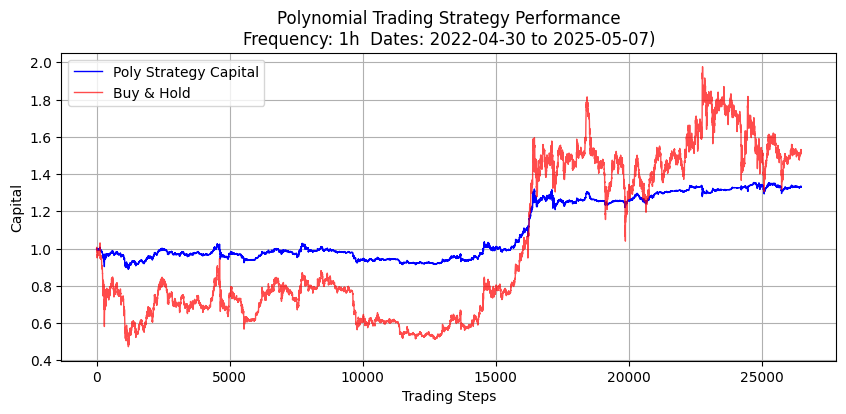

{'Total Return': 0.3332818631988481, 'Buy and Hold Return': 0.517189666036547, 'Hit Rate': 0.4981124952812382, 'Sharpe Ratio': 0.7300114107947986, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 49.84%
Hit Rate (Short/Price Fall): 49.34%
Number of Long Trades: 25203
Number of Short Trades: 1287
Testing reverse_reactive strategy (polynomial model)
Date range: 2022-04-30 04:00:00 to 2025-05-07 23:00:00
Poly plot saved as: images/poly_trading_simulation_13072025.png


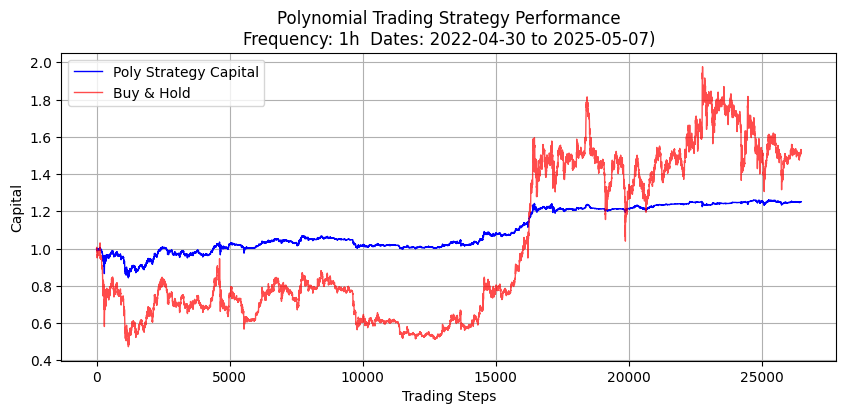

{'Total Return': 0.2513385694286365, 'Buy and Hold Return': 0.517189666036547, 'Hit Rate': 0.4981124952812382, 'Sharpe Ratio': 0.7071085977164582, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 49.84%
Hit Rate (Short/Price Fall): 49.34%
Number of Long Trades: 25203
Number of Short Trades: 1287
Testing simple strategy (polynomial model)
Date range: 2022-04-30 04:00:00 to 2025-05-07 23:00:00
Poly plot saved as: images/poly_trading_simulation_13072025.png


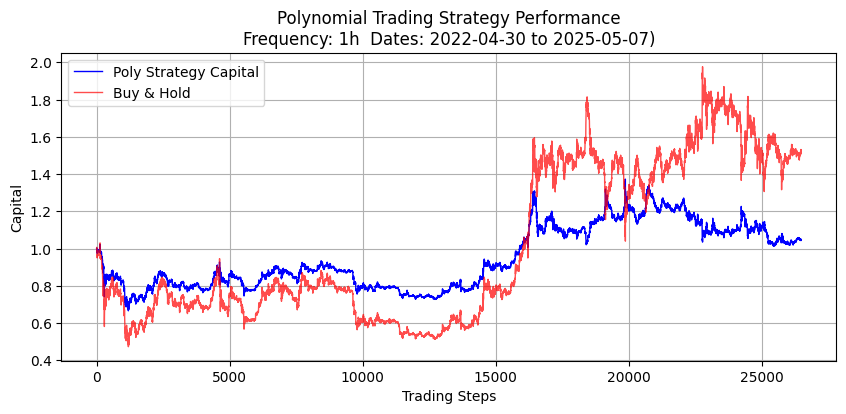

{'Total Return': 0.046470135654332, 'Buy and Hold Return': 0.517189666036547, 'Hit Rate': 0.4898074745186863, 'Sharpe Ratio': 0.05107521418325296, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 49.41%
Hit Rate (Short/Price Fall): 48.10%
Number of Long Trades: 17793
Number of Short Trades: 8697
Testing quartile strategy (polynomial model)
Date range: 2022-04-30 04:00:00 to 2025-05-07 23:00:00
Poly plot saved as: images/poly_trading_simulation_13072025.png


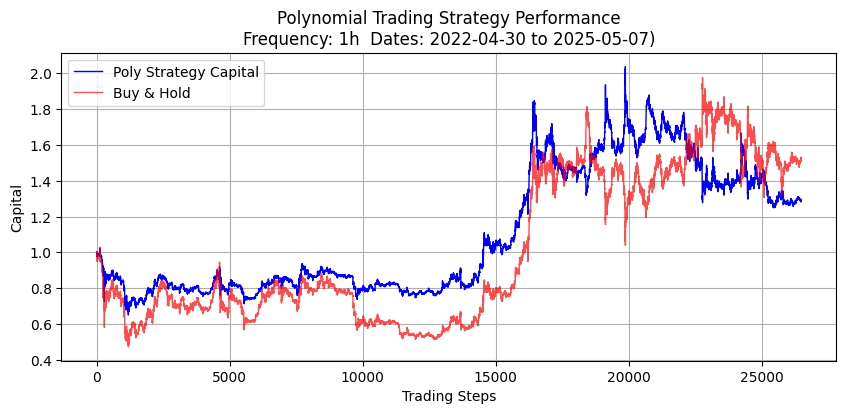

{'Total Return': 0.2911115959355519, 'Buy and Hold Return': 0.517189666036547, 'Hit Rate': 0.4898074745186863, 'Sharpe Ratio': 0.1861204808257324, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 49.41%
Hit Rate (Short/Price Fall): 48.10%
Number of Long Trades: 17793
Number of Short Trades: 8697
Testing aggressive strategy (polynomial model)
Date range: 2022-04-30 04:00:00 to 2025-05-07 23:00:00
Poly plot saved as: images/poly_trading_simulation_13072025.png


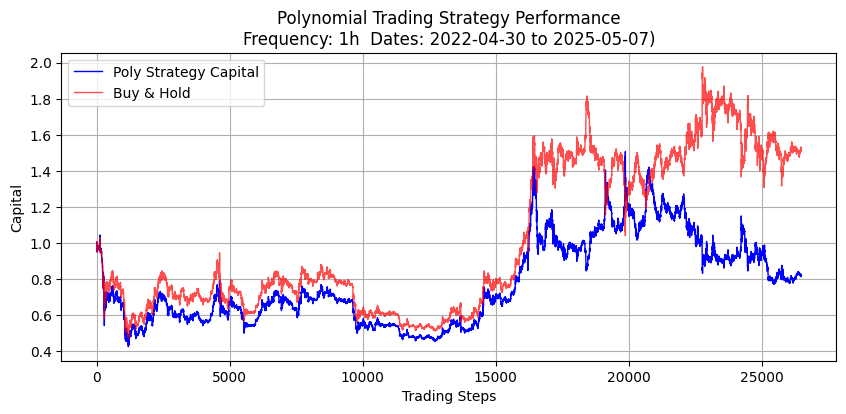

{'Total Return': -0.18036963358010216, 'Buy and Hold Return': 0.517189666036547, 'Hit Rate': 0.4898074745186863, 'Sharpe Ratio': -0.1151623185979946, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 49.41%
Hit Rate (Short/Price Fall): 48.10%
Number of Long Trades: 17793
Number of Short Trades: 8697
Testing BTC with trading window 1 (polynomial only)
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Mean target_return: 0.00010939550027540065
Fraction positive: 0.5104375070778755
Fraction negative: 0.4893737495753275
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14', 'stochastic_oscillator_14_0', 'stochastic_oscillator_14_1', 'ichimoku_cloud_9_26_52_0', 'ichimoku_c

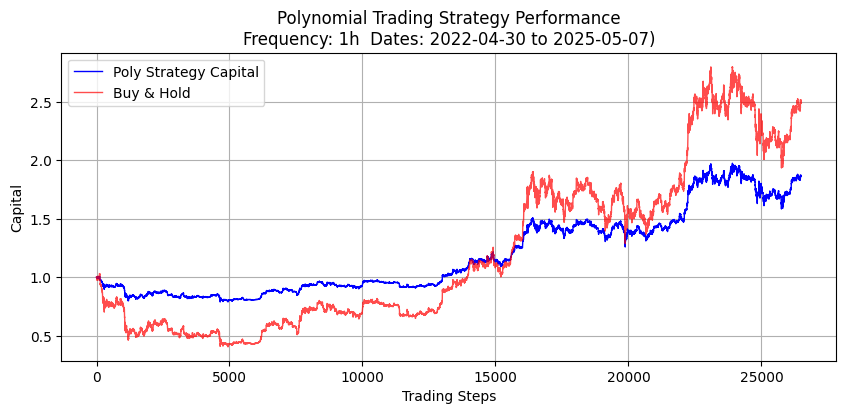

{'Total Return': 0.8703594413929574, 'Buy and Hold Return': 1.516089131482194, 'Hit Rate': 0.506870517176293, 'Sharpe Ratio': 0.8765142677294262, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 50.69%
Hit Rate (Short/Price Fall): 0.00%
Number of Long Trades: 26489
Number of Short Trades: 1
Testing reverse_reactive strategy (polynomial model)
Date range: 2022-04-30 04:00:00 to 2025-05-07 23:00:00
Poly plot saved as: images/poly_trading_simulation_13072025.png


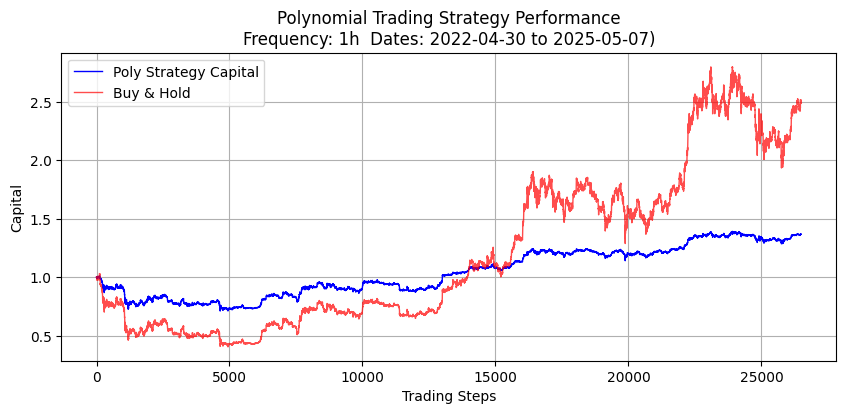

{'Total Return': 0.3695179830582098, 'Buy and Hold Return': 1.516089131482194, 'Hit Rate': 0.506870517176293, 'Sharpe Ratio': 0.6745370281781736, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 50.69%
Hit Rate (Short/Price Fall): 0.00%
Number of Long Trades: 26489
Number of Short Trades: 1
Testing simple strategy (polynomial model)
Date range: 2022-04-30 04:00:00 to 2025-05-07 23:00:00
Poly plot saved as: images/poly_trading_simulation_13072025.png


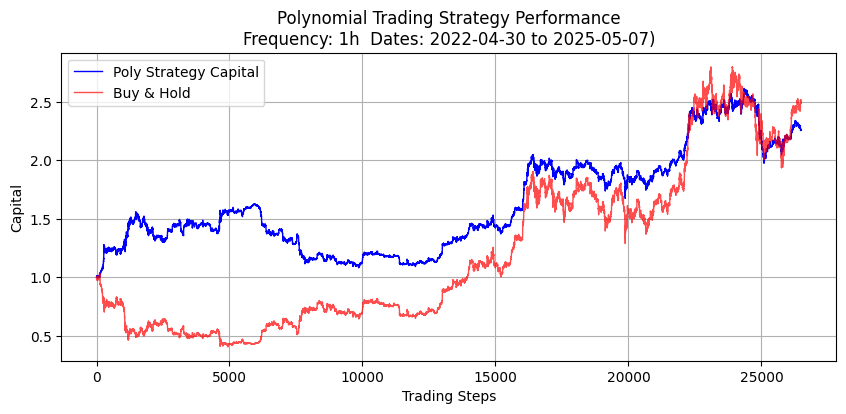

{'Total Return': 1.2651046483848667, 'Buy and Hold Return': 1.516089131482194, 'Hit Rate': 0.5061155152887882, 'Sharpe Ratio': 0.9402002558473795, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 50.94%
Hit Rate (Short/Price Fall): 49.87%
Number of Long Trades: 18321
Number of Short Trades: 8169
Testing quartile strategy (polynomial model)



KeyboardInterrupt



In [5]:
for symbol in symbols:
    for trading_window in range(1, 2):
        print(f"Testing {symbol} with trading window {trading_window} (polynomial only)")
        try:
            # Read indicator results
            df = pd.read_csv(f'indicator_results_{symbol}.csv')
            df1 = df[df['window'] == trading_window]

            # Select indicators with win rate > 50%
            selected_indicators = df1[df1['win'] > 0.50]['indicator'].unique()
            if len(selected_indicators) == 0:
                print(f"No indicators with win rate > 50% for {symbol} - {trading_window}h window")
                continue
            print(f"Selected indicators: {selected_indicators}")

            # Read symbol data
            df_symbol = pd.read_csv(f'{symbol}_spot_full.csv')
            half = len(df_symbol) // 2
            df1 = df_symbol.iloc[:half]
            df_train = df_symbol.iloc[:half]
            
            # Get start time for testing (second half of data)
            start_time = df_symbol.iloc[half]['close_time']

            # Fit polynomial model only (comment out majority vote)
            poly_model, majority_vote_model = run_indicators2(df1, selected_indicators.tolist() + original_columns, time_window=trading_window)
            if poly_model is not None:
                # Test all polynomial strategies
                strategies = ["reactive", "reverse_reactive", "simple", "quartile", "aggressive"]
                for strategy in strategies:
                    print(f"Testing {strategy} strategy (polynomial model)")
                    simulate_trading_poly(df_symbol, poly_model, selected_indicators.tolist() + original_columns,
                                          trading_window=trading_window,start_time=start_time, plot=True, strategy=strategy)
                
                # Comment out majority vote testing
                # print("majority vote strategy")
                # simulate_trading_majority(df1[:1000], majority_vote_model, selected_indicators.tolist(), selected_indicators.tolist() + original_columns,
                #                               trading_window=trading_window, plot=True)
            else:
                print("Failed to create polynomial model")
        except Exception as e:
            print(f"Error processing {symbol} - {trading_window}h: {str(e)}")
            continue

print("Polynomial strategy testing complete!")

# different trading frequency

Testing BNB with trading window 2
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0003280677367073612
Fraction positive: 0.5070209874679148
Fraction negative: 0.49056318888721123
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14', 'stochastic_oscillator_14_0', 'stochastic_oscillator_14_1', 'ichimoku_cloud_9_26_52_0', 'ichimoku_cloud_9_26_52_1', 'ichimoku_cloud_9_26_52_2', 'ichimoku_cloud_9_26_52_3', 'vwap', 'atr', 'bam_vwa', 'bam_open', 'bam_close', 'bam_high', 'bam_low', 'bam_volatility_1m_r

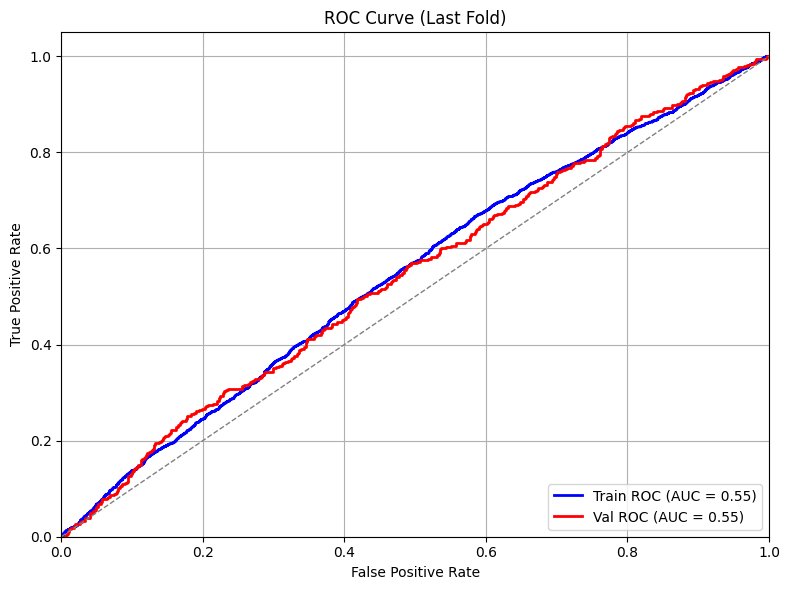

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.74%
Confusion Matrix (Total):
[[3479 2223]
 [3558 2476]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.52      0.69      0.59       649
          Up       0.54      0.36      0.43       655

    accuracy                           0.52      1304
   macro avg       0.53      0.52      0.51      1304
weighted avg       0.53      0.52      0.51      1304

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -1458.437181
  Test samples: 13244
  Features used: 31
  Overall Accuracy: 0.5286 (52.86%)
  Weighted Accuracy: 0.5286 (52.86%)
  Rise Accuracy: 0.4087 (40.87%) - 6712 samples
  Fall Accuracy: 0.6519 (65.19%) - 6532 samples
  Precision: 0.5467
  Recall: 0.4087
  F1 Score: 0.4677
  Confusion Matrix (Fall/Rise):
    [[4258 2274]  # Predicted Fall
     [3969 2743]]  # Predicted Rise
     # Actual Fall  Act

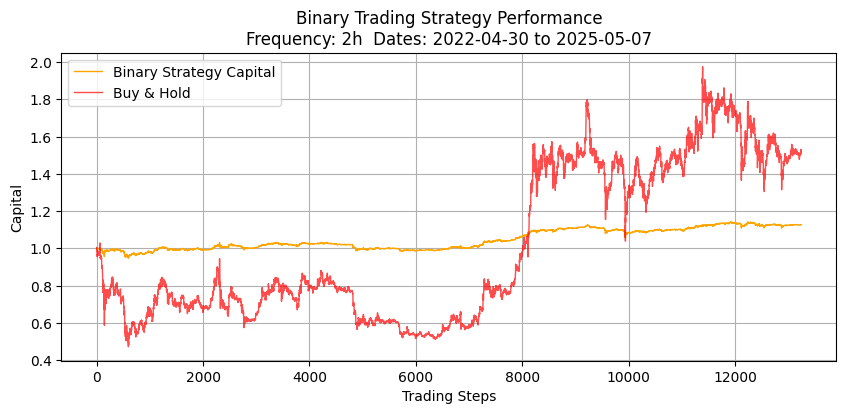

{'Total Return': 0.12657614608725543, 'Buy and Hold Return': 0.5084476897897519, 'Hit Rate': 0.5033222591362126, 'Sharpe Ratio': 0.6794304454507316, 'Number of Trades': 13244}
Hit Rate (Long/Price Rise): 50.36%
Hit Rate (Short/Price Fall): 31.25%
Number of Long Trades: 13228
Number of Short Trades: 16
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


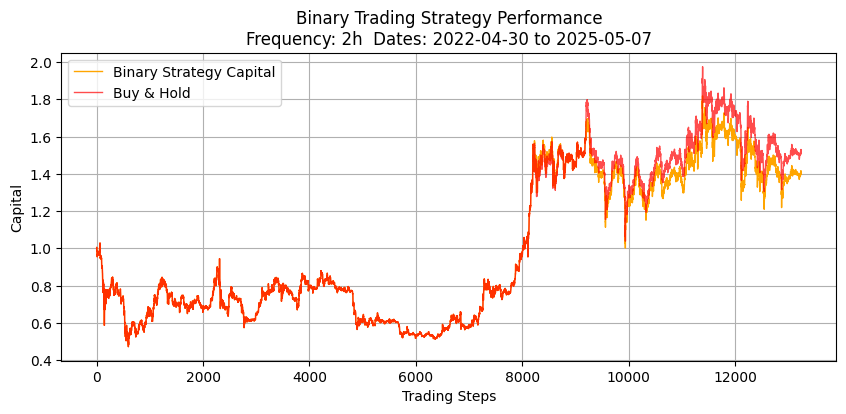

{'Total Return': 0.40299366765306144, 'Buy and Hold Return': 0.5084476897897519, 'Hit Rate': 0.5033222591362126, 'Sharpe Ratio': 0.206348290504936, 'Number of Trades': 13244}
Hit Rate (Long/Price Rise): 50.36%
Hit Rate (Short/Price Fall): 31.25%
Number of Long Trades: 13228
Number of Short Trades: 16
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


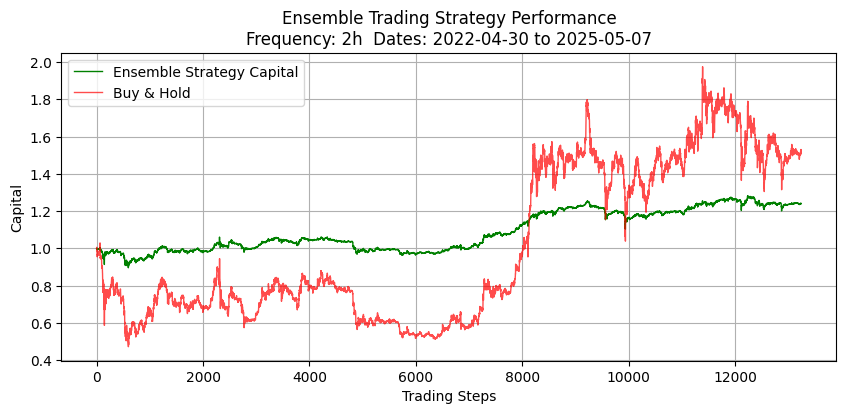

Ensemble Strategy Metrics: {'Total Return': 0.2404490465986937, 'Buy and Hold Return': 0.5084476897897519, 'Hit Rate': 0.5031117182756527, 'Sharpe Ratio': 0.6261253347226046, 'Number of Trades': 13176}
Hit Rate (Long/Price Rise): 50.34%
Hit Rate (Short/Price Fall): 26.67%
Number of Long Trades: 13161
Number of Short Trades: 15
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


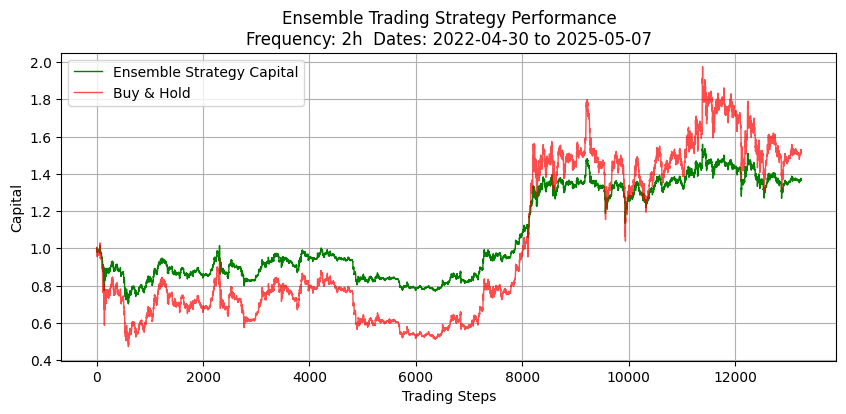

Ensemble Strategy Metrics: {'Total Return': 0.36930262410460224, 'Buy and Hold Return': 0.5084476897897519, 'Hit Rate': 0.5035670916818458, 'Sharpe Ratio': 0.36715008537302984, 'Number of Trades': 13176}
Hit Rate (Long/Price Rise): 50.36%
Hit Rate (Short/Price Fall): 0.00%
Number of Long Trades: 13175
Number of Short Trades: 1
Testing BNB with trading window 3
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0004930882800885277
Fraction positive: 0.5191937492922659
Fraction negative: 0.4794474012003171
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollin

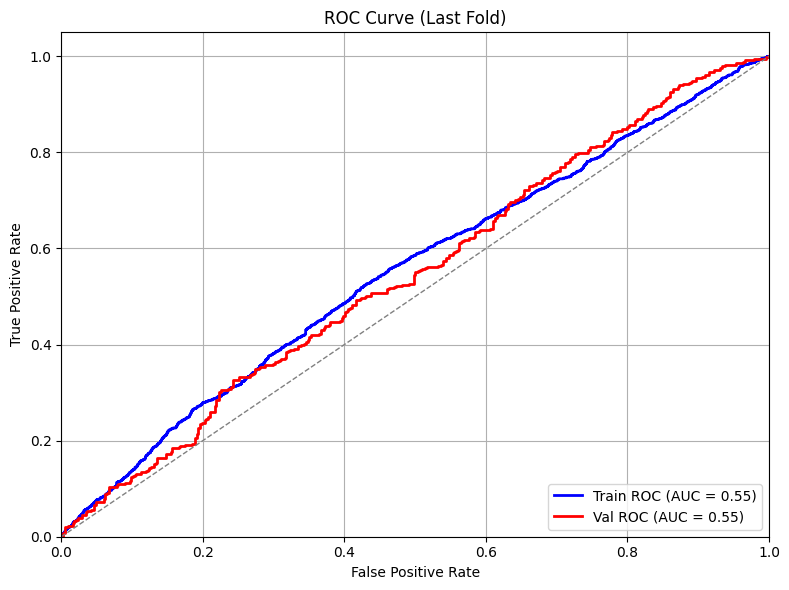

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.27%
Confusion Matrix (Total):
[[2115 1568]
 [2217 1867]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.53      0.60      0.56       434
          Up       0.53      0.47      0.50       429

    accuracy                           0.53       863
   macro avg       0.53      0.53      0.53       863
weighted avg       0.53      0.53      0.53       863

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -727.458762
  Test samples: 8827
  Features used: 31
  Overall Accuracy: 0.5231 (52.31%)
  Weighted Accuracy: 0.5231 (52.31%)
  Rise Accuracy: 0.5537 (55.37%) - 4481 samples
  Fall Accuracy: 0.4915 (49.15%) - 4346 samples
  Precision: 0.5289
  Recall: 0.5537
  F1 Score: 0.5410
  Confusion Matrix (Fall/Rise):
    [[2136 2210]  # Predicted Fall
     [2000 2481]]  # Predicted Rise
     # Actual Fall  Actua

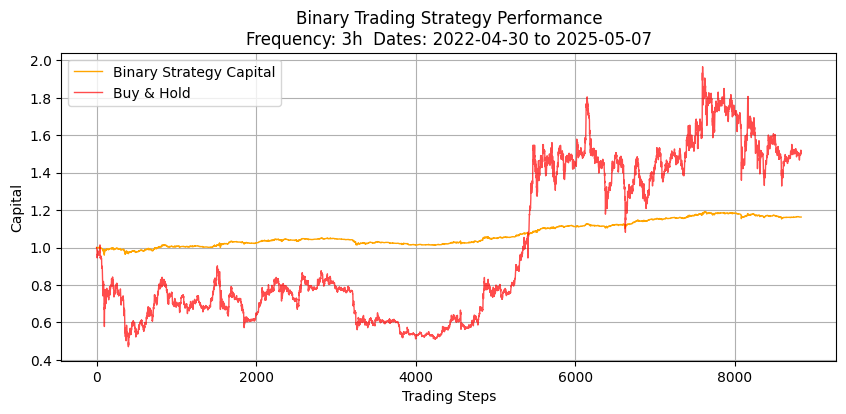

{'Total Return': 0.1626758548696956, 'Buy and Hold Return': 0.5007766503820619, 'Hit Rate': 0.510250311473553, 'Sharpe Ratio': 1.0670726214155963, 'Number of Trades': 8829}
Hit Rate (Long/Price Rise): 50.96%
Hit Rate (Short/Price Fall): 52.14%
Number of Long Trades: 8361
Number of Short Trades: 468
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


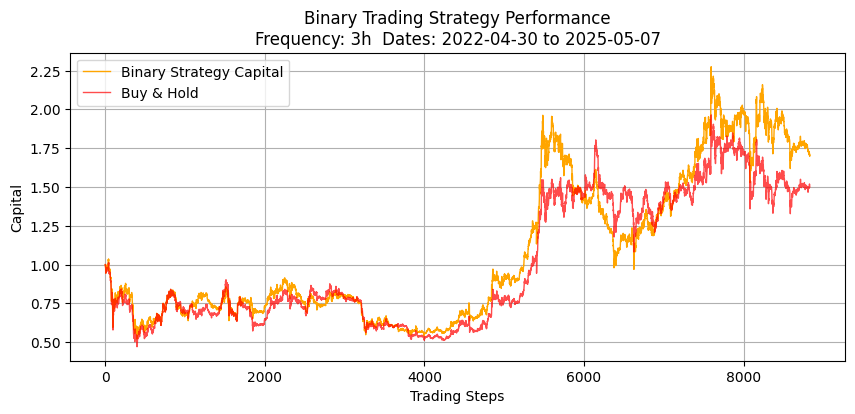

{'Total Return': 0.7067689740418717, 'Buy and Hold Return': 0.5007766503820619, 'Hit Rate': 0.510250311473553, 'Sharpe Ratio': 0.32484493767466943, 'Number of Trades': 8829}
Hit Rate (Long/Price Rise): 50.96%
Hit Rate (Short/Price Fall): 52.14%
Number of Long Trades: 8361
Number of Short Trades: 468
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


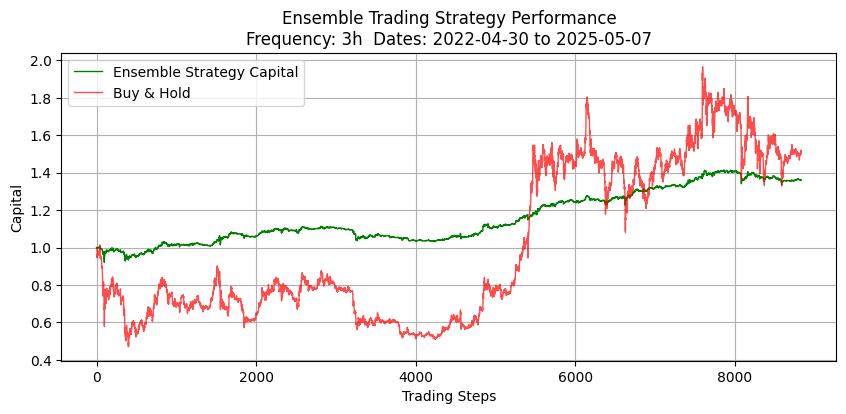

Ensemble Strategy Metrics: {'Total Return': 0.36018773096219214, 'Buy and Hold Return': 0.5007766503820619, 'Hit Rate': 0.5112091581206774, 'Sharpe Ratio': 1.1120199785461593, 'Number of Trades': 8386}
Hit Rate (Long/Price Rise): 51.09%
Hit Rate (Short/Price Fall): 51.90%
Number of Long Trades: 8018
Number of Short Trades: 368
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


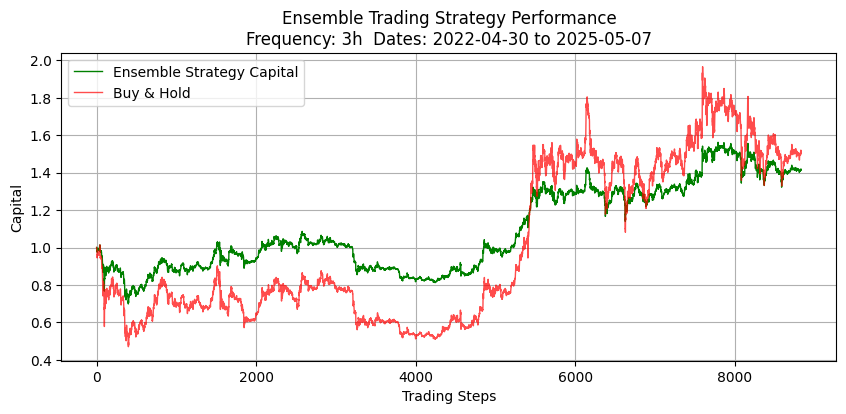

Ensemble Strategy Metrics: {'Total Return': 0.41568815386956426, 'Buy and Hold Return': 0.5007766503820619, 'Hit Rate': 0.5089434772239446, 'Sharpe Ratio': 0.41832851554448036, 'Number of Trades': 8386}
Hit Rate (Long/Price Rise): 50.89%
Hit Rate (Short/Price Fall): 66.67%
Number of Long Trades: 8383
Number of Short Trades: 3
Testing BNB with trading window 4
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0006578248991478246
Fraction positive: 0.517288237958629
Fraction negative: 0.4805979163521063
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinge

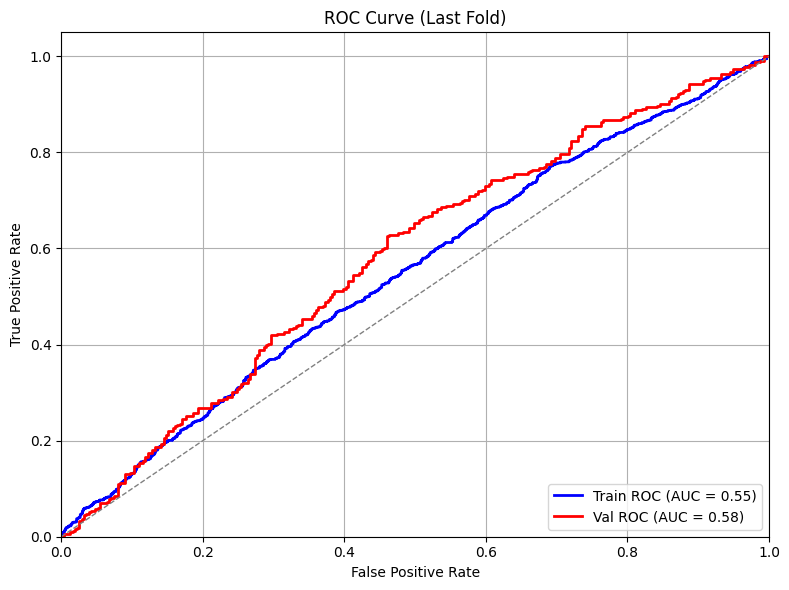

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.11%
Confusion Matrix (Total):
[[1711 1056]
 [1769 1242]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.55      0.58      0.56       311
          Up       0.58      0.56      0.57       331

    accuracy                           0.57       642
   macro avg       0.57      0.57      0.57       642
weighted avg       0.57      0.57      0.57       642

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -453.540956
  Test samples: 6619
  Features used: 31
  Overall Accuracy: 0.5091 (50.91%)
  Weighted Accuracy: 0.5091 (50.91%)
  Rise Accuracy: 0.7398 (73.98%) - 3297 samples
  Fall Accuracy: 0.2803 (28.03%) - 3322 samples
  Precision: 0.5050
  Recall: 0.7398
  F1 Score: 0.6002
  Confusion Matrix (Fall/Rise):
    [[ 931 2391]  # Predicted Fall
     [ 858 2439]]  # Predicted Rise
     # Actual Fall  Actua

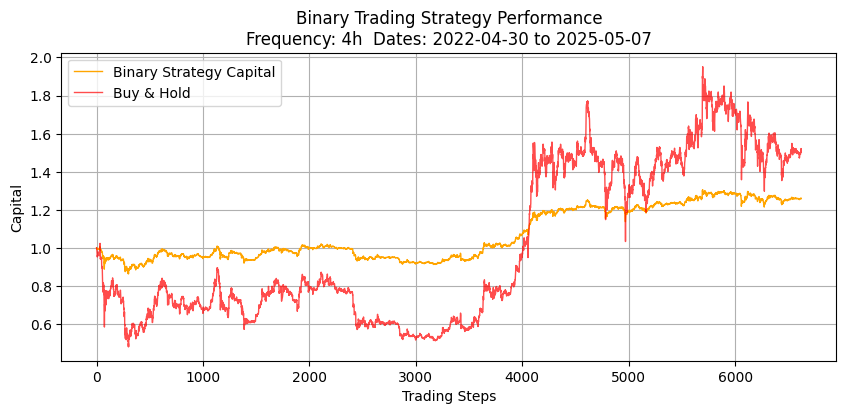

{'Total Return': 0.2584978785553196, 'Buy and Hold Return': 0.5019647102990865, 'Hit Rate': 0.5114031113124906, 'Sharpe Ratio': 0.6108184856728885, 'Number of Trades': 6621}
Hit Rate (Long/Price Rise): 51.15%
Hit Rate (Short/Price Fall): 0.00%
Number of Long Trades: 6620
Number of Short Trades: 1
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


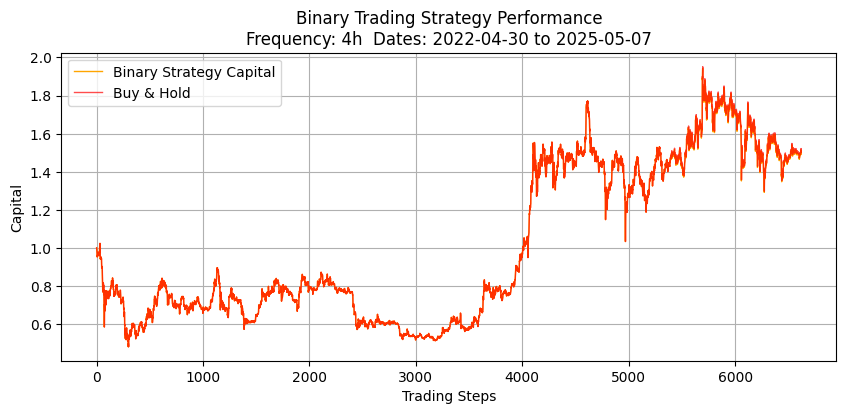

{'Total Return': 0.49266947457701105, 'Buy and Hold Return': 0.5019647102990865, 'Hit Rate': 0.5114031113124906, 'Sharpe Ratio': 0.2523102793960592, 'Number of Trades': 6621}
Hit Rate (Long/Price Rise): 51.15%
Hit Rate (Short/Price Fall): 0.00%
Number of Long Trades: 6620
Number of Short Trades: 1
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


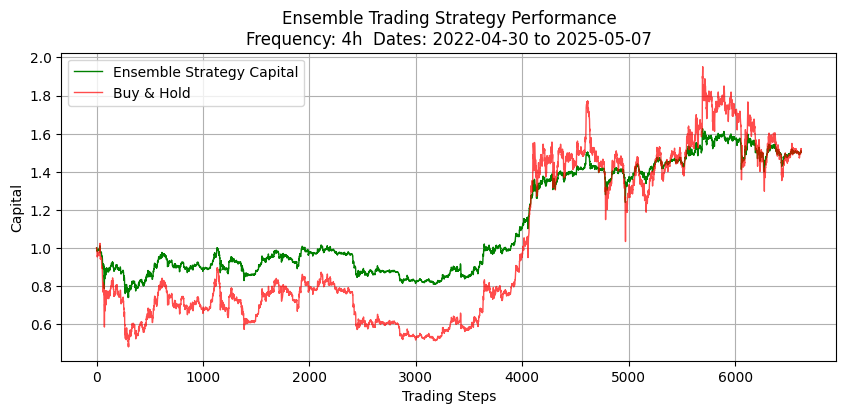

Ensemble Strategy Metrics: {'Total Return': 0.5013675843064909, 'Buy and Hold Return': 0.5019647102990865, 'Hit Rate': 0.5114803625377643, 'Sharpe Ratio': 0.5646382485371696, 'Number of Trades': 6620}
Hit Rate (Long/Price Rise): 51.16%
Hit Rate (Short/Price Fall): 0.00%
Number of Long Trades: 6619
Number of Short Trades: 1
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


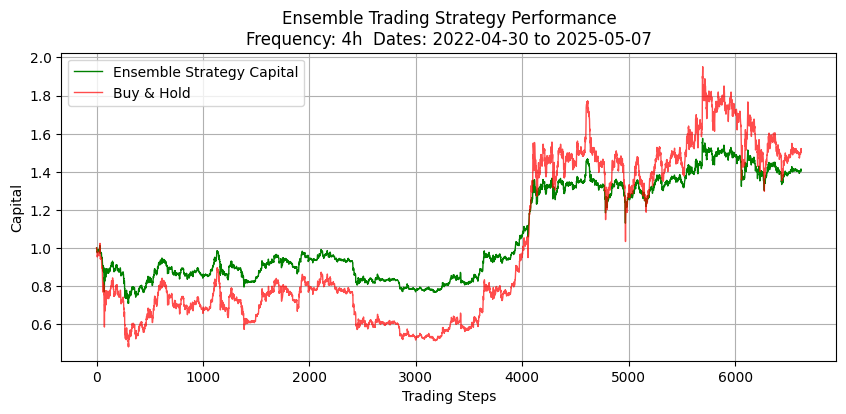

Ensemble Strategy Metrics: {'Total Return': 0.4041820709532713, 'Buy and Hold Return': 0.5019647102990865, 'Hit Rate': 0.5116314199395771, 'Sharpe Ratio': 0.4096145870124631, 'Number of Trades': 6620}
Hit Rate (Long/Price Rise): 51.16%
Hit Rate (Short/Price Fall): nan%
Number of Long Trades: 6620
Number of Short Trades: 0
Testing BNB with trading window 5
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0008424340796365307
Fraction positive: 0.5114172485374598
Fraction negative: 0.48650688809209286
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_

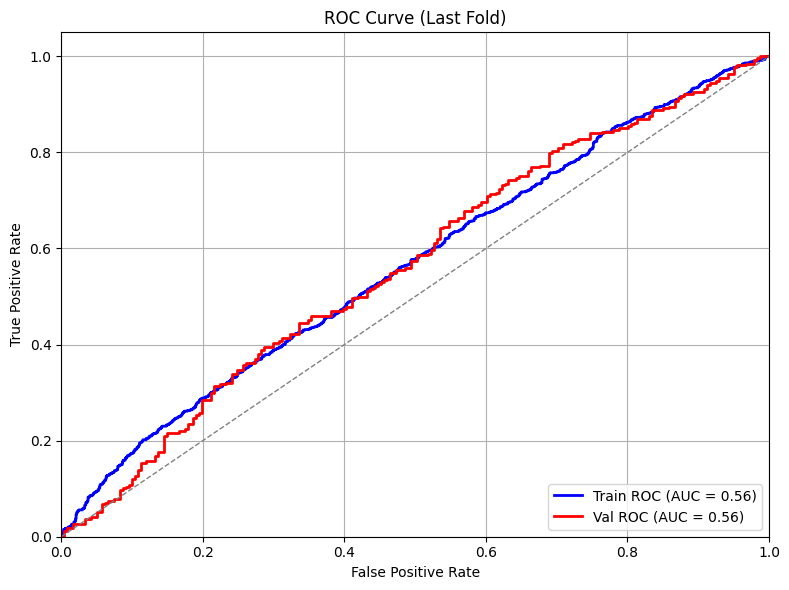

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 49.84%
Confusion Matrix (Total):
[[1641  573]
 [1725  642]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.48      0.86      0.62       241
          Up       0.58      0.18      0.27       268

    accuracy                           0.50       509
   macro avg       0.53      0.52      0.44       509
weighted avg       0.53      0.50      0.43       509

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -240.957714
  Test samples: 5293
  Features used: 31
  Overall Accuracy: 0.5078 (50.78%)
  Weighted Accuracy: 0.5078 (50.78%)
  Rise Accuracy: 0.2821 (28.21%) - 2655 samples
  Fall Accuracy: 0.7350 (73.50%) - 2638 samples
  Precision: 0.5173
  Recall: 0.2821
  F1 Score: 0.3651
  Confusion Matrix (Fall/Rise):
    [[1939  699]  # Predicted Fall
     [1906  749]]  # Predicted Rise
     # Actual Fall  Actua

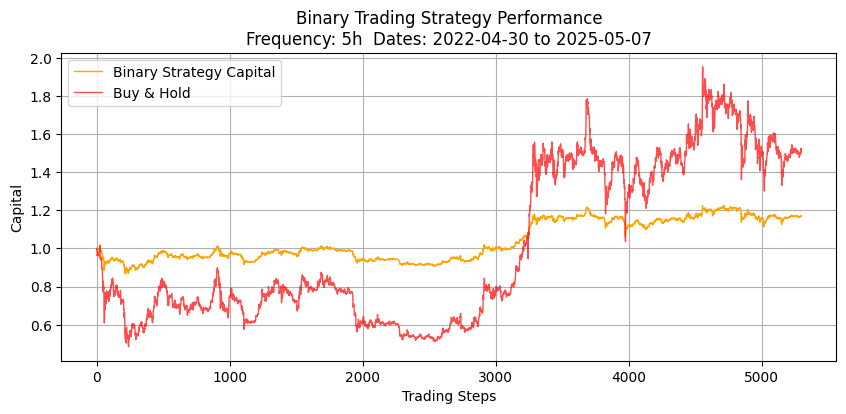

{'Total Return': 0.16905001561341337, 'Buy and Hold Return': 0.5039412576879628, 'Hit Rate': 0.5036813290541816, 'Sharpe Ratio': 0.40363944484124437, 'Number of Trades': 5297}
Hit Rate (Long/Price Rise): 50.38%
Hit Rate (Short/Price Fall): 0.00%
Number of Long Trades: 5296
Number of Short Trades: 1
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


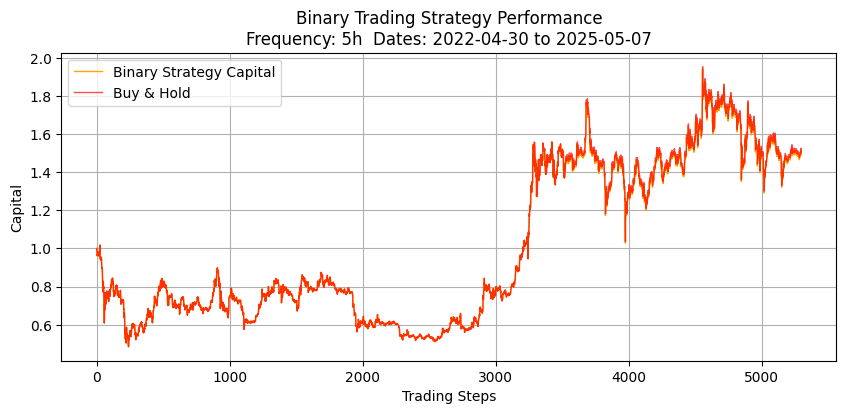

{'Total Return': 0.4990015064985216, 'Buy and Hold Return': 0.5039412576879628, 'Hit Rate': 0.5036813290541816, 'Sharpe Ratio': 0.259354291890113, 'Number of Trades': 5297}
Hit Rate (Long/Price Rise): 50.38%
Hit Rate (Short/Price Fall): 0.00%
Number of Long Trades: 5296
Number of Short Trades: 1
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


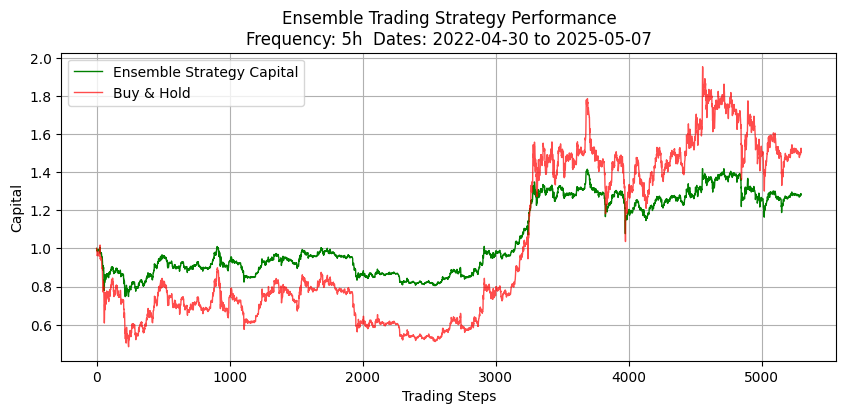

Ensemble Strategy Metrics: {'Total Return': 0.2825021386772115, 'Buy and Hold Return': 0.5039412576879628, 'Hit Rate': 0.5035876132930514, 'Sharpe Ratio': 0.32866921815168504, 'Number of Trades': 5296}
Hit Rate (Long/Price Rise): 50.37%
Hit Rate (Short/Price Fall): 0.00%
Number of Long Trades: 5295
Number of Short Trades: 1
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


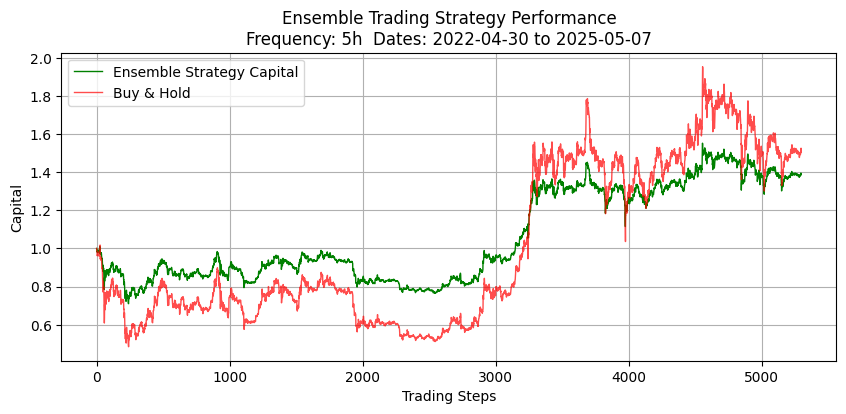

Ensemble Strategy Metrics: {'Total Return': 0.38893082662749934, 'Buy and Hold Return': 0.5039412576879628, 'Hit Rate': 0.5037764350453172, 'Sharpe Ratio': 0.40230345537512746, 'Number of Trades': 5296}
Hit Rate (Long/Price Rise): 50.38%
Hit Rate (Short/Price Fall): nan%
Number of Long Trades: 5296
Number of Short Trades: 0
Testing BNB with trading window 6
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0009850774318593382
Fraction positive: 0.5253623188405797
Fraction negative: 0.4725996376811594
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger

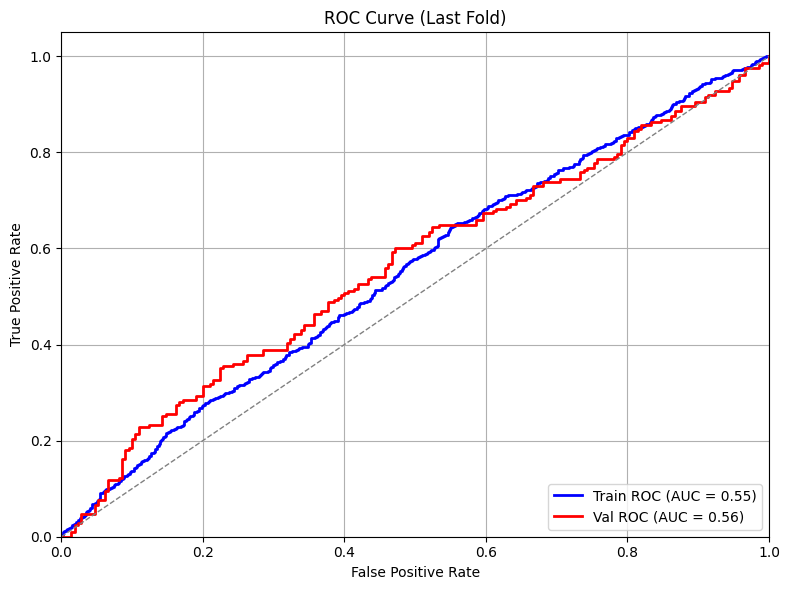

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.22%
Confusion Matrix (Total):
[[1131  642]
 [1244  772]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.52      0.90      0.66       210
          Up       0.65      0.18      0.29       211

    accuracy                           0.54       421
   macro avg       0.59      0.54      0.47       421
weighted avg       0.59      0.54      0.47       421

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -188.880868
  Test samples: 4409
  Features used: 31
  Overall Accuracy: 0.5128 (51.28%)
  Weighted Accuracy: 0.5128 (51.28%)
  Rise Accuracy: 0.4824 (48.24%) - 2239 samples
  Fall Accuracy: 0.5442 (54.42%) - 2170 samples
  Precision: 0.5220
  Recall: 0.4824
  F1 Score: 0.5014
  Confusion Matrix (Fall/Rise):
    [[1181  989]  # Predicted Fall
     [1159 1080]]  # Predicted Rise
     # Actual Fall  Actua

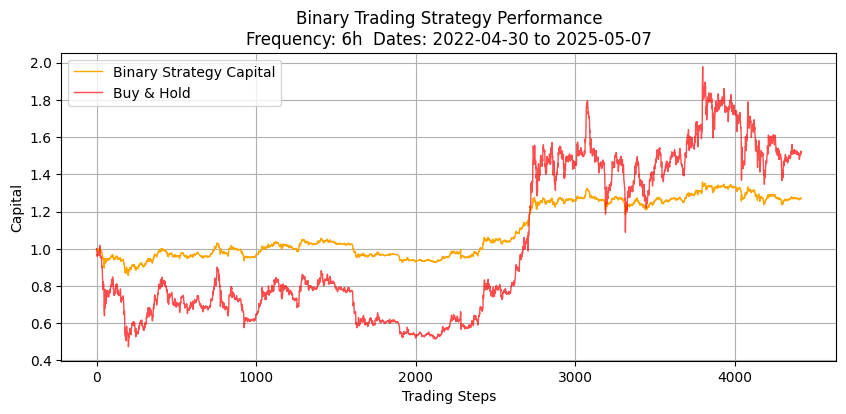

{'Total Return': 0.27103058751773923, 'Buy and Hold Return': 0.5133274492497794, 'Hit Rate': 0.5054372451291346, 'Sharpe Ratio': 0.5621607404021106, 'Number of Trades': 4414}
Hit Rate (Long/Price Rise): 50.54%
Hit Rate (Short/Price Fall): nan%
Number of Long Trades: 4414
Number of Short Trades: 0
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


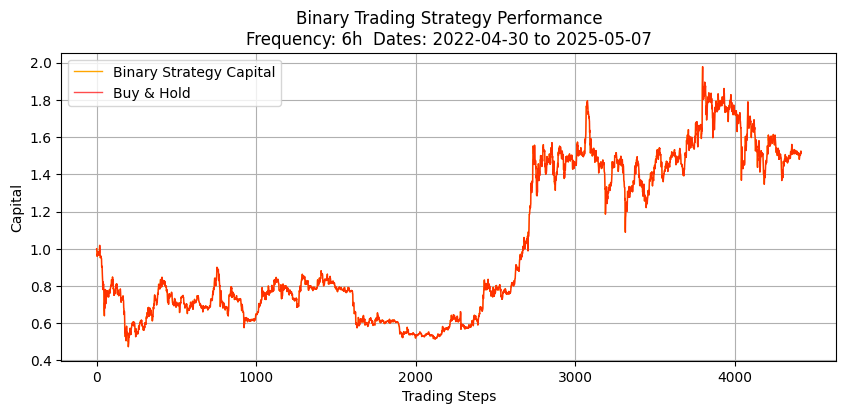

{'Total Return': 0.5179548606733155, 'Buy and Hold Return': 0.5133274492497794, 'Hit Rate': 0.5054372451291346, 'Sharpe Ratio': 0.2690681137746403, 'Number of Trades': 4414}
Hit Rate (Long/Price Rise): 50.54%
Hit Rate (Short/Price Fall): nan%
Number of Long Trades: 4414
Number of Short Trades: 0
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


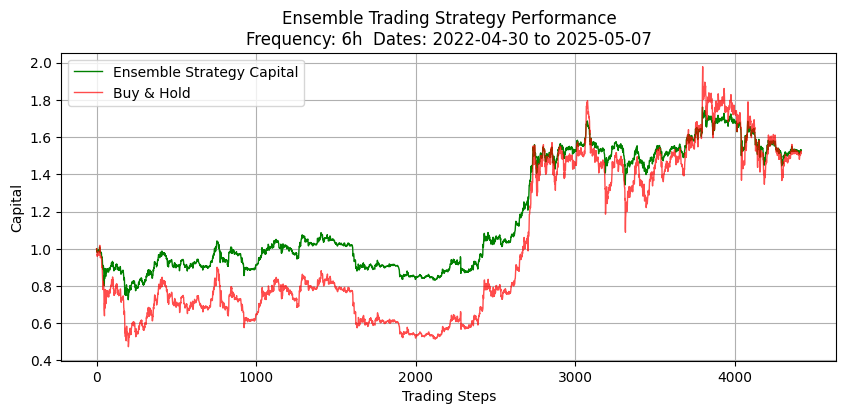

Ensemble Strategy Metrics: {'Total Return': 0.5287492230279665, 'Buy and Hold Return': 0.5133274492497794, 'Hit Rate': 0.5056663644605621, 'Sharpe Ratio': 0.5040045653658013, 'Number of Trades': 4412}
Hit Rate (Long/Price Rise): 50.57%
Hit Rate (Short/Price Fall): nan%
Number of Long Trades: 4412
Number of Short Trades: 0
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


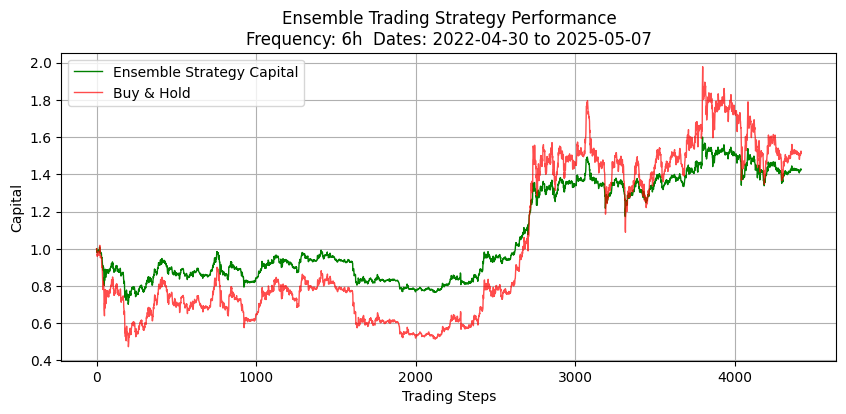

Ensemble Strategy Metrics: {'Total Return': 0.4255245718761702, 'Buy and Hold Return': 0.5133274492497794, 'Hit Rate': 0.5056663644605621, 'Sharpe Ratio': 0.4390649449310645, 'Number of Trades': 4412}
Hit Rate (Long/Price Rise): 50.57%
Hit Rate (Short/Price Fall): nan%
Number of Long Trades: 4412
Number of Short Trades: 0
Testing BTC with trading window 2
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.00021605411029471206
Fraction positive: 0.5133625245357089
Fraction negative: 0.4864864864864865
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_

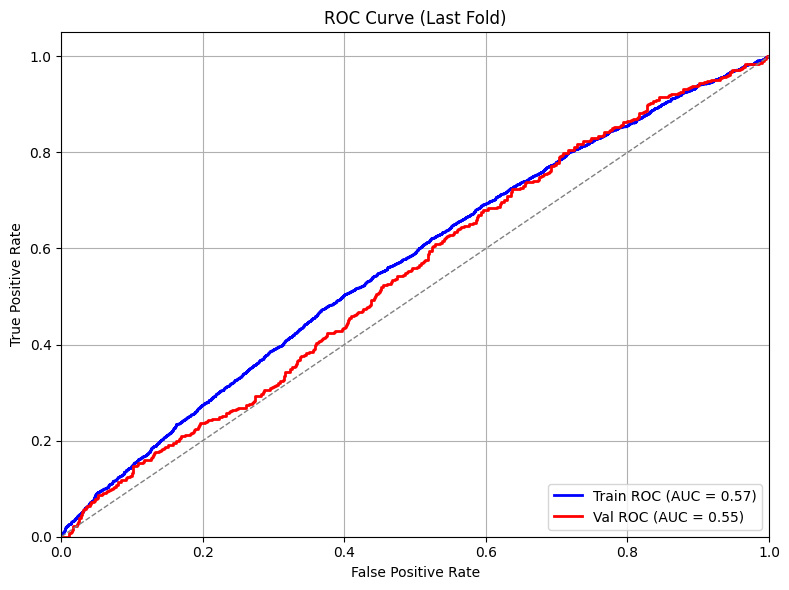

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.24%
Confusion Matrix (Total):
[[3352 2367]
 [3355 2662]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.51      0.61      0.56       649
          Up       0.52      0.43      0.47       655

    accuracy                           0.52      1304
   macro avg       0.52      0.52      0.51      1304
weighted avg       0.52      0.52      0.51      1304

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -1550.434699
  Test samples: 13244
  Features used: 31
  Overall Accuracy: 0.5104 (51.04%)
  Weighted Accuracy: 0.5104 (51.04%)
  Rise Accuracy: 0.1517 (15.17%) - 6762 samples
  Fall Accuracy: 0.8846 (88.46%) - 6482 samples
  Precision: 0.5784
  Recall: 0.1517
  F1 Score: 0.2404
  Confusion Matrix (Fall/Rise):
    [[5734  748]  # Predicted Fall
     [5736 1026]]  # Predicted Rise
     # Actual Fall  Act

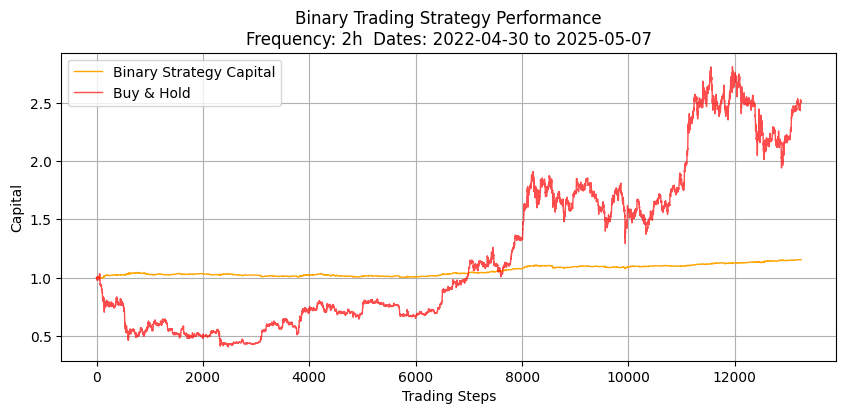

{'Total Return': 0.154509224171407, 'Buy and Hold Return': 1.5099448543453609, 'Hit Rate': 0.524992449411054, 'Sharpe Ratio': 1.402698603931494, 'Number of Trades': 13244}
Hit Rate (Long/Price Rise): 52.73%
Hit Rate (Short/Price Fall): 52.08%
Number of Long Trades: 8513
Number of Short Trades: 4731
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


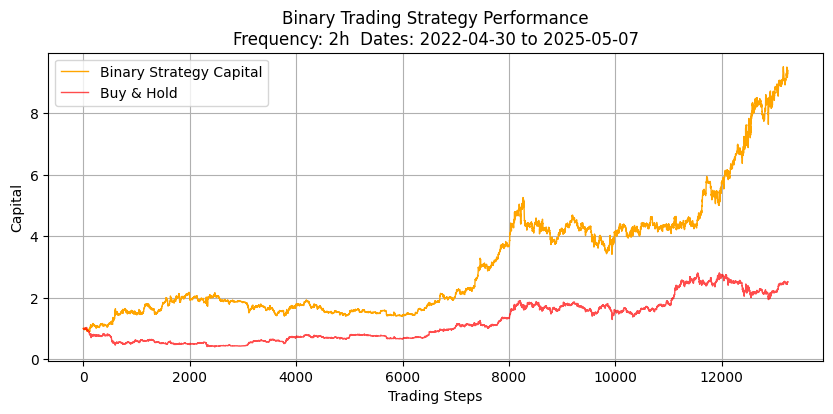

{'Total Return': 8.389281615906963, 'Buy and Hold Return': 1.5099448543453609, 'Hit Rate': 0.524992449411054, 'Sharpe Ratio': 1.4531331238749552, 'Number of Trades': 13244}
Hit Rate (Long/Price Rise): 52.73%
Hit Rate (Short/Price Fall): 52.08%
Number of Long Trades: 8513
Number of Short Trades: 4731
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


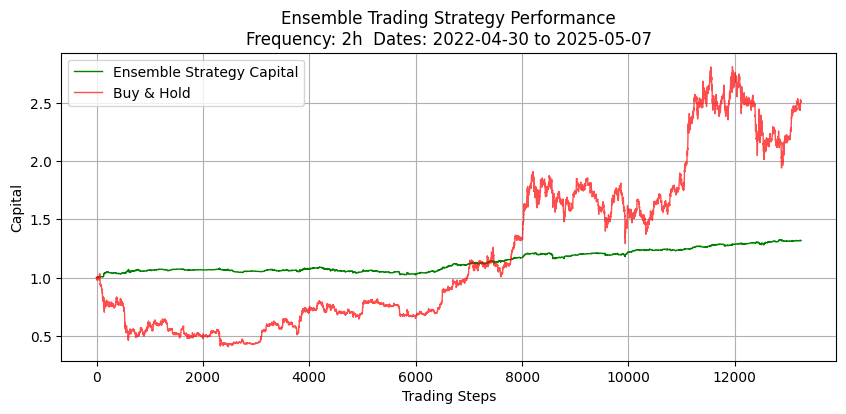

Ensemble Strategy Metrics: {'Total Return': 0.31792720130148977, 'Buy and Hold Return': 1.5099448543453609, 'Hit Rate': 0.5260218896582532, 'Sharpe Ratio': 1.5655217070287315, 'Number of Trades': 8954}
Hit Rate (Long/Price Rise): 53.19%
Hit Rate (Short/Price Fall): 51.11%
Number of Long Trades: 6434
Number of Short Trades: 2520
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


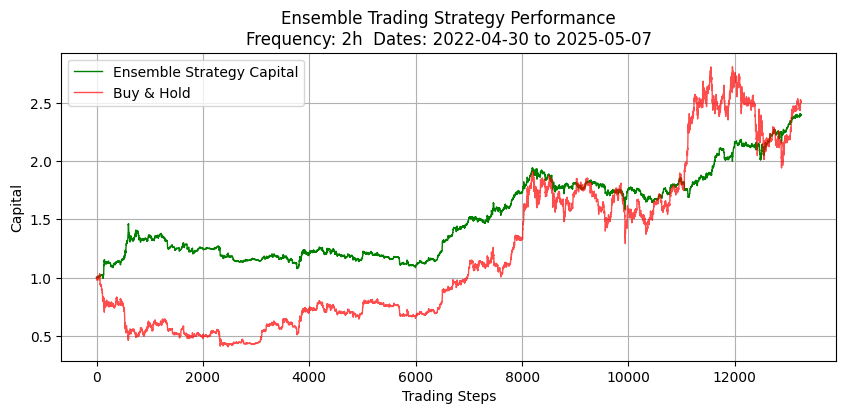

Ensemble Strategy Metrics: {'Total Return': 1.393018093814669, 'Buy and Hold Return': 1.5099448543453609, 'Hit Rate': 0.5245700245700246, 'Sharpe Ratio': 1.4560255493394865, 'Number of Trades': 8954}
Hit Rate (Long/Price Rise): 52.75%
Hit Rate (Short/Price Fall): 51.23%
Number of Long Trades: 7207
Number of Short Trades: 1747
Testing BTC with trading window 3
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.00032350297996931634
Fraction positive: 0.5144377760163062
Fraction negative: 0.4854489865247424
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollin

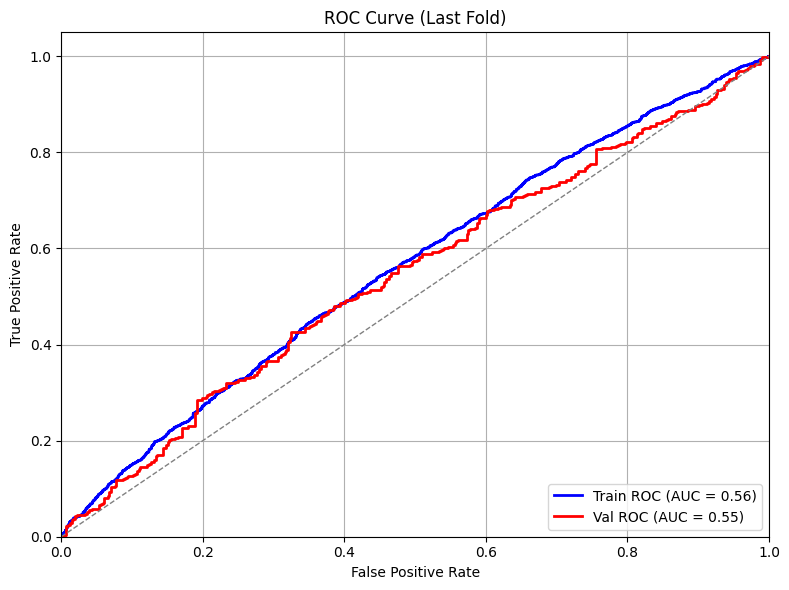

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.93%
Confusion Matrix (Total):
[[1620 2200]
 [1611 2336]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.53      0.41      0.46       412
          Up       0.55      0.66      0.60       451

    accuracy                           0.54       863
   macro avg       0.54      0.54      0.53       863
weighted avg       0.54      0.54      0.53       863

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -756.556369
  Test samples: 8827
  Features used: 31
  Overall Accuracy: 0.5098 (50.98%)
  Weighted Accuracy: 0.5098 (50.98%)
  Rise Accuracy: 0.2323 (23.23%) - 4465 samples
  Fall Accuracy: 0.7939 (79.39%) - 4362 samples
  Precision: 0.5356
  Recall: 0.2323
  F1 Score: 0.3240
  Confusion Matrix (Fall/Rise):
    [[3463  899]  # Predicted Fall
     [3428 1037]]  # Predicted Rise
     # Actual Fall  Actua

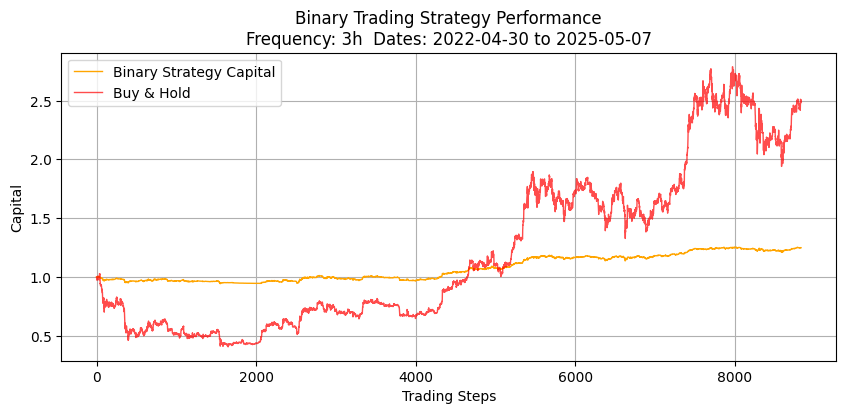

{'Total Return': 0.2484147328815678, 'Buy and Hold Return': 1.4848201063457473, 'Hit Rate': 0.5110431532449881, 'Sharpe Ratio': 1.190122943014893, 'Number of Trades': 8829}
Hit Rate (Long/Price Rise): 51.06%
Hit Rate (Short/Price Fall): 52.43%
Number of Long Trades: 8541
Number of Short Trades: 288
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


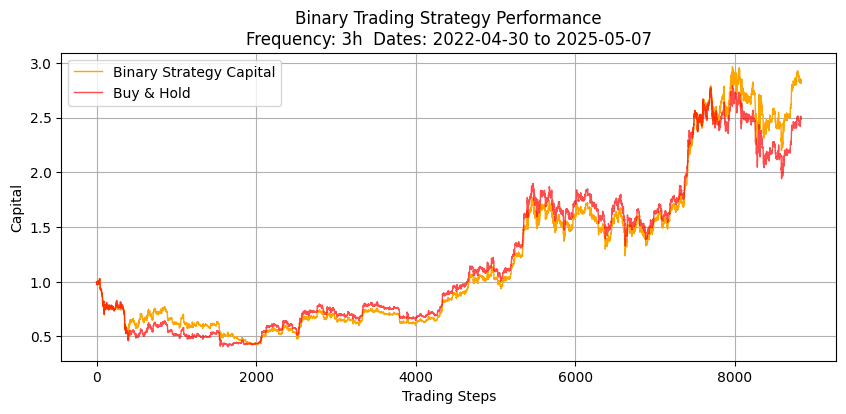

{'Total Return': 1.8453862509029806, 'Buy and Hold Return': 1.4848201063457473, 'Hit Rate': 0.5110431532449881, 'Sharpe Ratio': 0.8438539870072328, 'Number of Trades': 8829}
Hit Rate (Long/Price Rise): 51.06%
Hit Rate (Short/Price Fall): 52.43%
Number of Long Trades: 8541
Number of Short Trades: 288
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


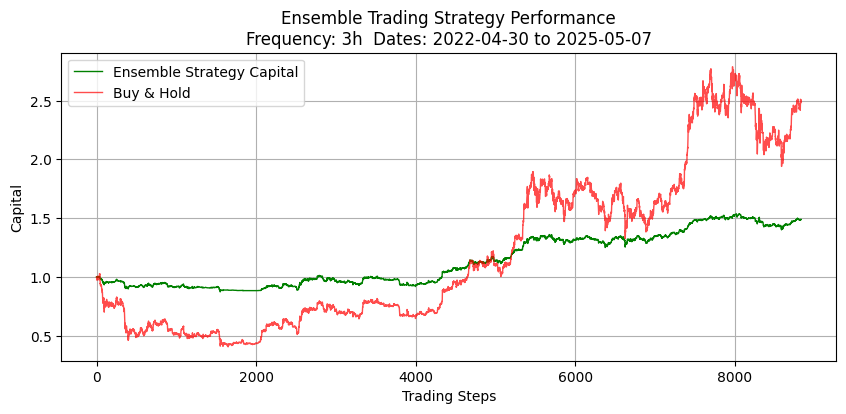

Ensemble Strategy Metrics: {'Total Return': 0.49004781841191214, 'Buy and Hold Return': 1.4848201063457473, 'Hit Rate': 0.5104253544620517, 'Sharpe Ratio': 1.1109250833722941, 'Number of Trades': 8393}
Hit Rate (Long/Price Rise): 51.04%
Hit Rate (Short/Price Fall): 50.93%
Number of Long Trades: 8285
Number of Short Trades: 108
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


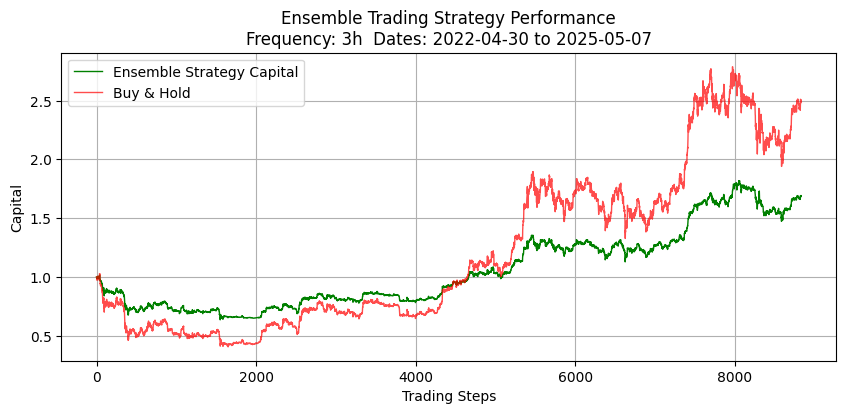

Ensemble Strategy Metrics: {'Total Return': 0.6923293261250723, 'Buy and Hold Return': 1.4848201063457473, 'Hit Rate': 0.5106636482783272, 'Sharpe Ratio': 0.8321896404478738, 'Number of Trades': 8393}
Hit Rate (Long/Price Rise): 51.05%
Hit Rate (Short/Price Fall): 55.88%
Number of Long Trades: 8359
Number of Short Trades: 34
Testing BTC with trading window 4
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0004287976463391228
Fraction positive: 0.5168352710252152
Fraction negative: 0.4828627510191756
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinge

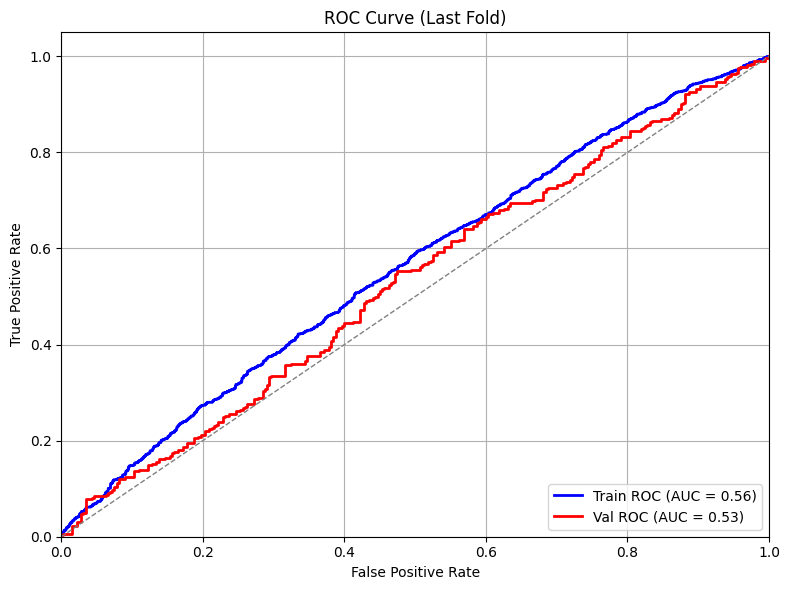

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.24%
Confusion Matrix (Total):
[[1772 1020]
 [1855 1131]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.50      0.90      0.65       320
          Up       0.55      0.12      0.20       322

    accuracy                           0.51       642
   macro avg       0.53      0.51      0.42       642
weighted avg       0.53      0.51      0.42       642

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -334.363639
  Test samples: 6619
  Features used: 31
  Overall Accuracy: 0.4937 (49.37%)
  Weighted Accuracy: 0.4937 (49.37%)
  Rise Accuracy: 0.0297 (2.97%) - 3368 samples
  Fall Accuracy: 0.9745 (97.45%) - 3251 samples
  Precision: 0.5464
  Recall: 0.0297
  F1 Score: 0.0563
  Confusion Matrix (Fall/Rise):
    [[3168   83]  # Predicted Fall
     [3268  100]]  # Predicted Rise
     # Actual Fall  Actual

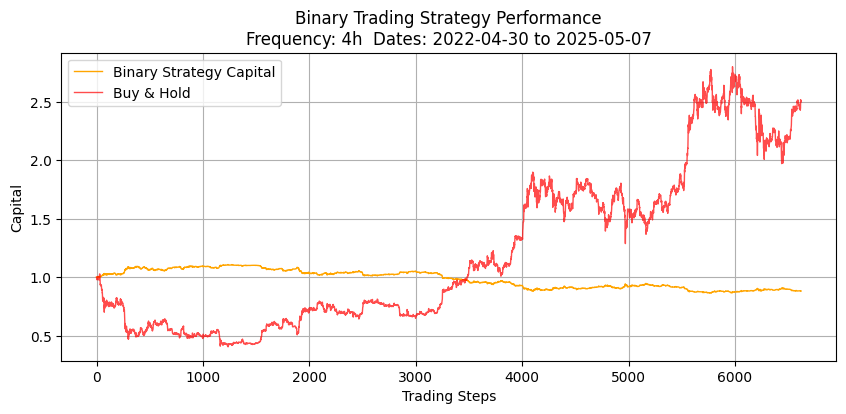

{'Total Return': -0.11878497963267376, 'Buy and Hold Return': 1.5026964985375741, 'Hit Rate': 0.49191964959975837, 'Sharpe Ratio': -0.5602564209886984, 'Number of Trades': 6621}
Hit Rate (Long/Price Rise): 76.92%
Hit Rate (Short/Price Fall): 49.14%
Number of Long Trades: 13
Number of Short Trades: 6608
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


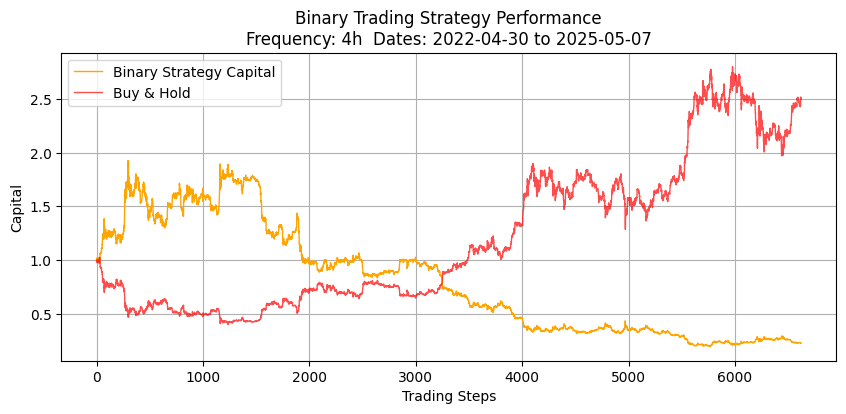

{'Total Return': -0.7709609734208971, 'Buy and Hold Return': 1.5026964985375741, 'Hit Rate': 0.49191964959975837, 'Sharpe Ratio': -0.4716709767996335, 'Number of Trades': 6621}
Hit Rate (Long/Price Rise): 76.92%
Hit Rate (Short/Price Fall): 49.14%
Number of Long Trades: 13
Number of Short Trades: 6608
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


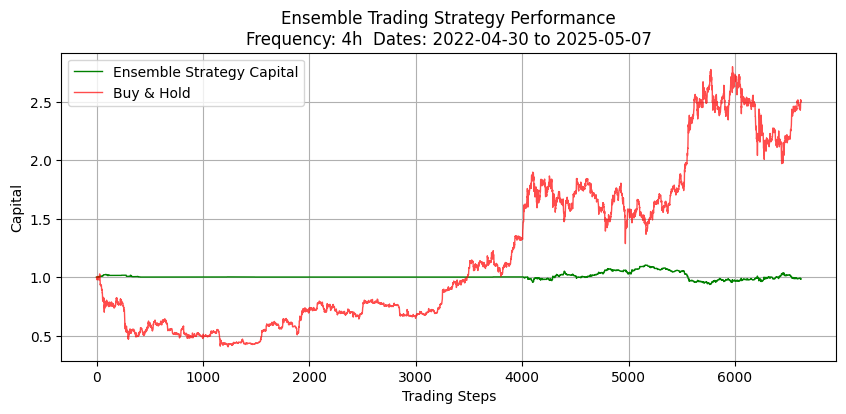

Ensemble Strategy Metrics: {'Total Return': -0.015318033163487454, 'Buy and Hold Return': 1.5026964985375741, 'Hit Rate': 0.49377123442808607, 'Sharpe Ratio': -0.0673376607034614, 'Number of Trades': 1766}
Hit Rate (Long/Price Rise): 83.33%
Hit Rate (Short/Price Fall): 49.26%
Number of Long Trades: 6
Number of Short Trades: 1760
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


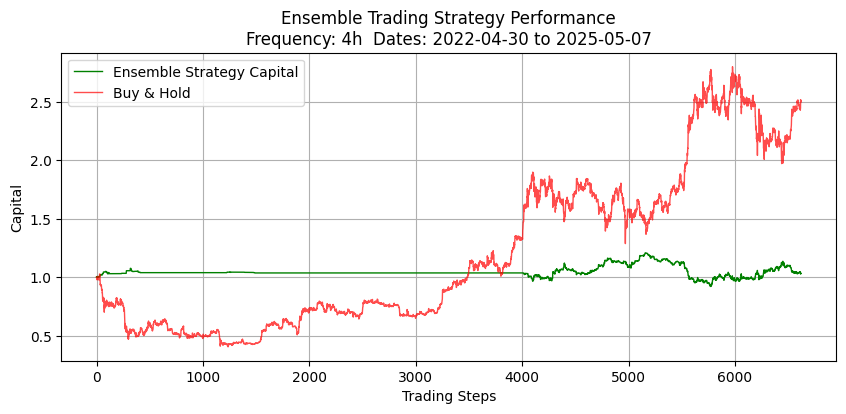

Ensemble Strategy Metrics: {'Total Return': 0.03116645433207177, 'Buy and Hold Return': 1.5026964985375741, 'Hit Rate': 0.4943374858437146, 'Sharpe Ratio': 0.07566379983559644, 'Number of Trades': 1766}
Hit Rate (Long/Price Rise): 85.71%
Hit Rate (Short/Price Fall): 49.29%
Number of Long Trades: 7
Number of Short Trades: 1759
Testing BTC with trading window 5
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0005369532776755626
Fraction positive: 0.5257595772787318
Fraction negative: 0.4740517078694093
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bolling

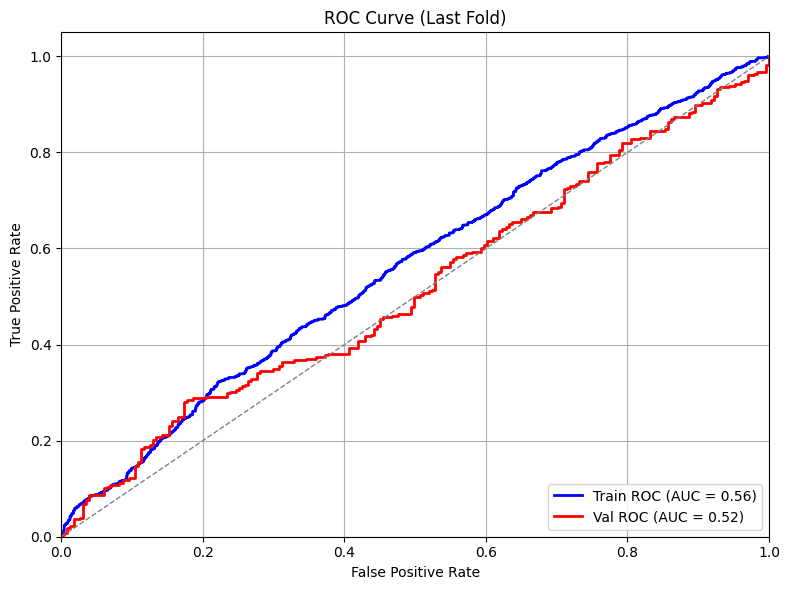

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 49.90%
Confusion Matrix (Total):
[[1155 1052]
 [1243 1131]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.45      0.50      0.47       231
          Up       0.54      0.49      0.51       278

    accuracy                           0.49       509
   macro avg       0.49      0.49      0.49       509
weighted avg       0.50      0.49      0.49       509

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -247.482599
  Test samples: 5293
  Features used: 31
  Overall Accuracy: 0.4954 (49.54%)
  Weighted Accuracy: 0.4954 (49.54%)
  Rise Accuracy: 0.0799 (7.99%) - 2690 samples
  Fall Accuracy: 0.9247 (92.47%) - 2603 samples
  Precision: 0.5231
  Recall: 0.0799
  F1 Score: 0.1387
  Confusion Matrix (Fall/Rise):
    [[2407  196]  # Predicted Fall
     [2475  215]]  # Predicted Rise
     # Actual Fall  Actual

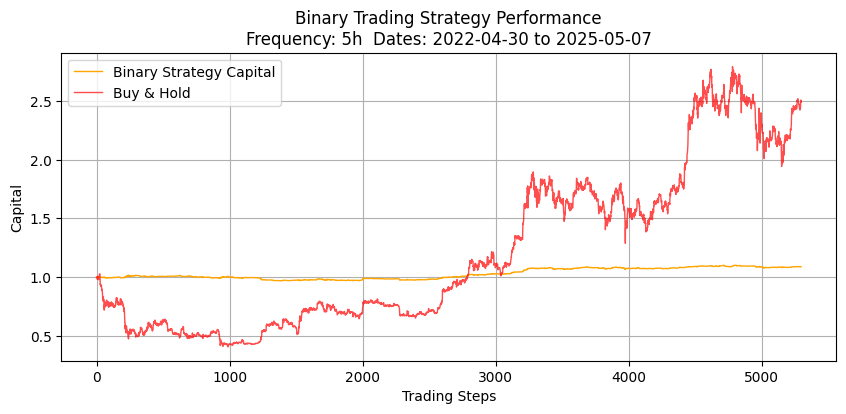

{'Total Return': 0.08870385777249412, 'Buy and Hold Return': 1.491764174420694, 'Hit Rate': 0.5123654898999433, 'Sharpe Ratio': 0.8861021019837498, 'Number of Trades': 5297}
Hit Rate (Long/Price Rise): 51.77%
Hit Rate (Short/Price Fall): 49.94%
Number of Long Trades: 3747
Number of Short Trades: 1550
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


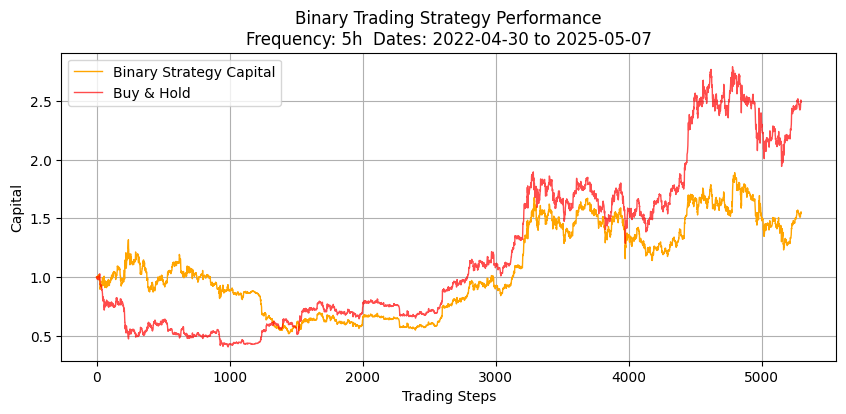

{'Total Return': 0.5550355101377036, 'Buy and Hold Return': 1.491764174420694, 'Hit Rate': 0.5123654898999433, 'Sharpe Ratio': 0.3025324792910897, 'Number of Trades': 5297}
Hit Rate (Long/Price Rise): 51.77%
Hit Rate (Short/Price Fall): 49.94%
Number of Long Trades: 3747
Number of Short Trades: 1550
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


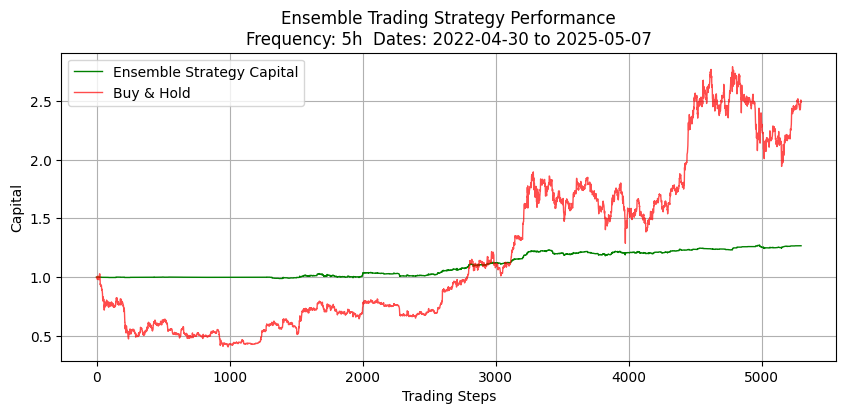

Ensemble Strategy Metrics: {'Total Return': 0.2675322266636233, 'Buy and Hold Return': 1.491764174420694, 'Hit Rate': 0.5154170723790977, 'Sharpe Ratio': 1.6226246188032296, 'Number of Trades': 3081}
Hit Rate (Long/Price Rise): 51.78%
Hit Rate (Short/Price Fall): 48.75%
Number of Long Trades: 2841
Number of Short Trades: 240
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


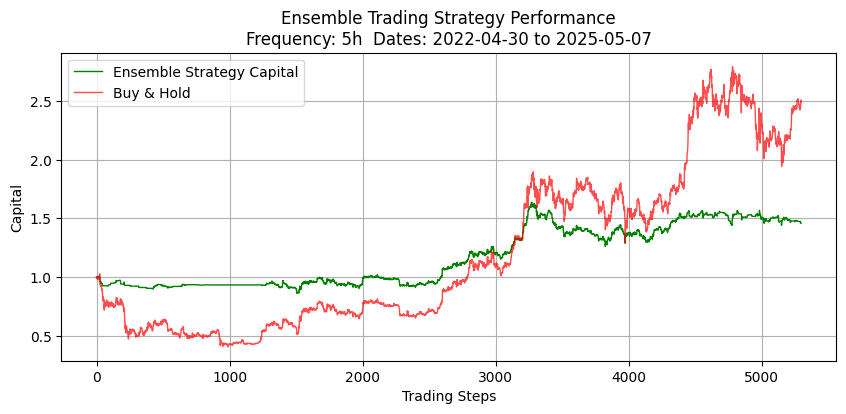

Ensemble Strategy Metrics: {'Total Return': 0.4598774217368493, 'Buy and Hold Return': 1.491764174420694, 'Hit Rate': 0.5115222330412204, 'Sharpe Ratio': 0.6750900295791518, 'Number of Trades': 3081}
Hit Rate (Long/Price Rise): 51.54%
Hit Rate (Short/Price Fall): 45.50%
Number of Long Trades: 2881
Number of Short Trades: 200
Testing BTC with trading window 6
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0006460765916401936
Fraction positive: 0.5210597826086957
Fraction negative: 0.478713768115942
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger

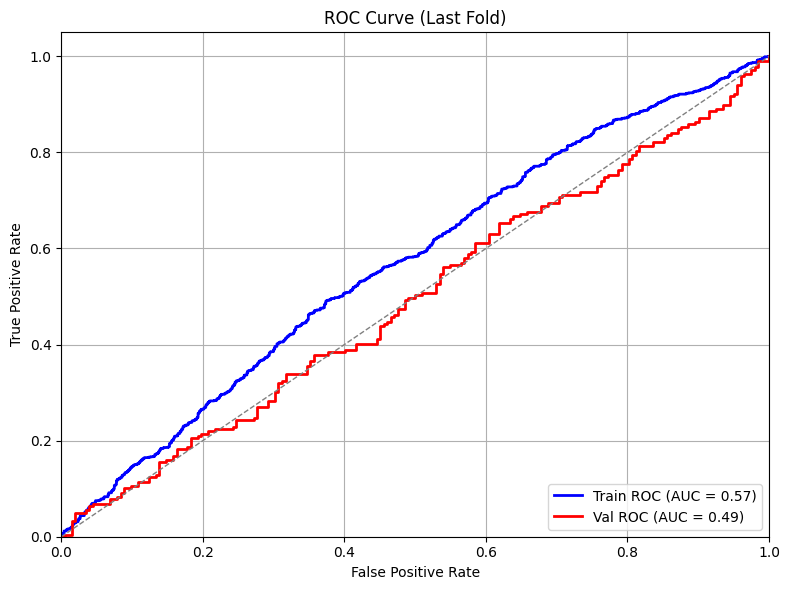

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.83%
Confusion Matrix (Total):
[[956 901]
 [962 970]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.48      0.83      0.61       202
          Up       0.54      0.18      0.27       219

    accuracy                           0.49       421
   macro avg       0.51      0.51      0.44       421
weighted avg       0.51      0.49      0.44       421

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -163.290886
  Test samples: 4409
  Features used: 31
  Overall Accuracy: 0.4883 (48.83%)
  Weighted Accuracy: 0.4883 (48.83%)
  Rise Accuracy: 0.0338 (3.38%) - 2277 samples
  Fall Accuracy: 0.9737 (97.37%) - 2132 samples
  Precision: 0.5789
  Recall: 0.0338
  F1 Score: 0.0639
  Confusion Matrix (Fall/Rise):
    [[2076   56]  # Predicted Fall
     [2200   77]]  # Predicted Rise
     # Actual Fall  Actual Ris

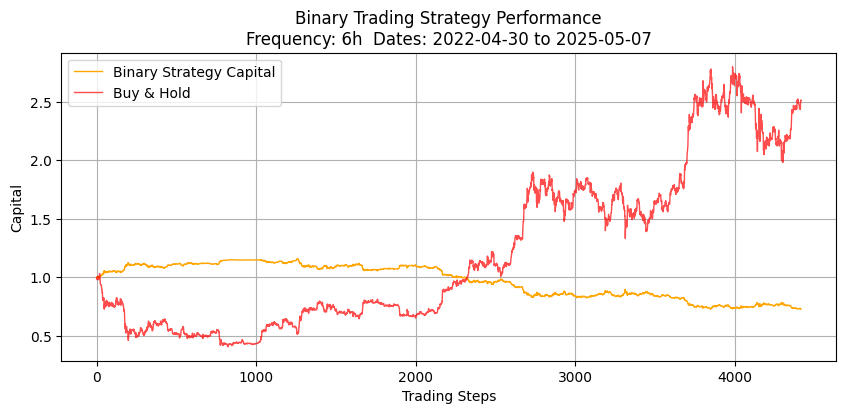

{'Total Return': -0.2715434829784792, 'Buy and Hold Return': 1.5107442725360263, 'Hit Rate': 0.49229723606705933, 'Sharpe Ratio': -0.8592662668916163, 'Number of Trades': 4414}
Hit Rate (Long/Price Rise): 60.00%
Hit Rate (Short/Price Fall): 49.13%
Number of Long Trades: 40
Number of Short Trades: 4374
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


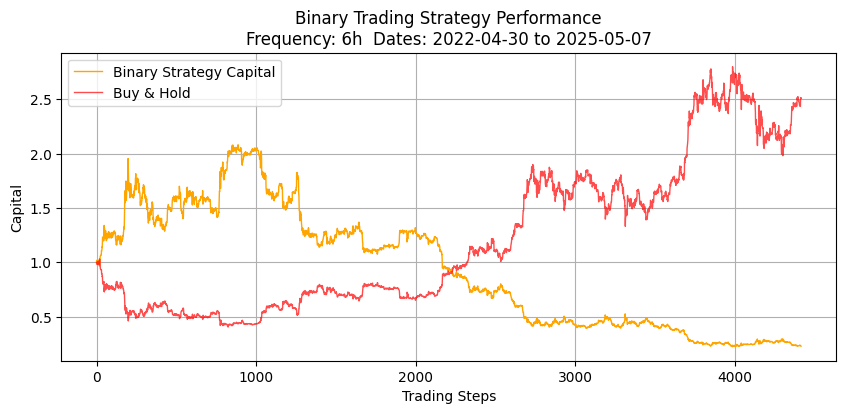

{'Total Return': -0.7696059767240062, 'Buy and Hold Return': 1.5107442725360263, 'Hit Rate': 0.49229723606705933, 'Sharpe Ratio': -0.42868941374303987, 'Number of Trades': 4414}
Hit Rate (Long/Price Rise): 60.00%
Hit Rate (Short/Price Fall): 49.13%
Number of Long Trades: 40
Number of Short Trades: 4374
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


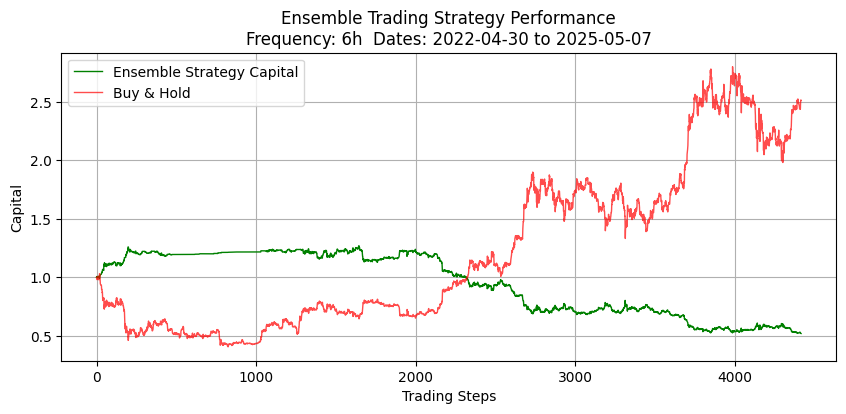

Ensemble Strategy Metrics: {'Total Return': -0.47914180725404454, 'Buy and Hold Return': 1.5107442725360263, 'Hit Rate': 0.49255377826806396, 'Sharpe Ratio': -0.85726735016901, 'Number of Trades': 3626}
Hit Rate (Long/Price Rise): 58.33%
Hit Rate (Short/Price Fall): 49.19%
Number of Long Trades: 24
Number of Short Trades: 3602
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


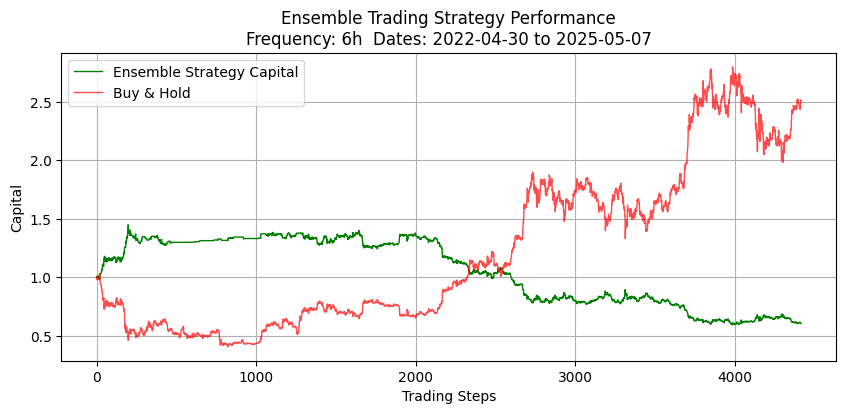

Ensemble Strategy Metrics: {'Total Return': -0.39412782549292635, 'Buy and Hold Return': 1.5107442725360263, 'Hit Rate': 0.4914506343077772, 'Sharpe Ratio': -0.5868711040383874, 'Number of Trades': 3626}
Hit Rate (Long/Price Rise): 50.00%
Hit Rate (Short/Price Fall): 49.13%
Number of Long Trades: 48
Number of Short Trades: 3578
Testing ETH with trading window 2
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0003078535737426885
Fraction positive: 0.5114751623131512
Fraction negative: 0.4873924203533142
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bolli

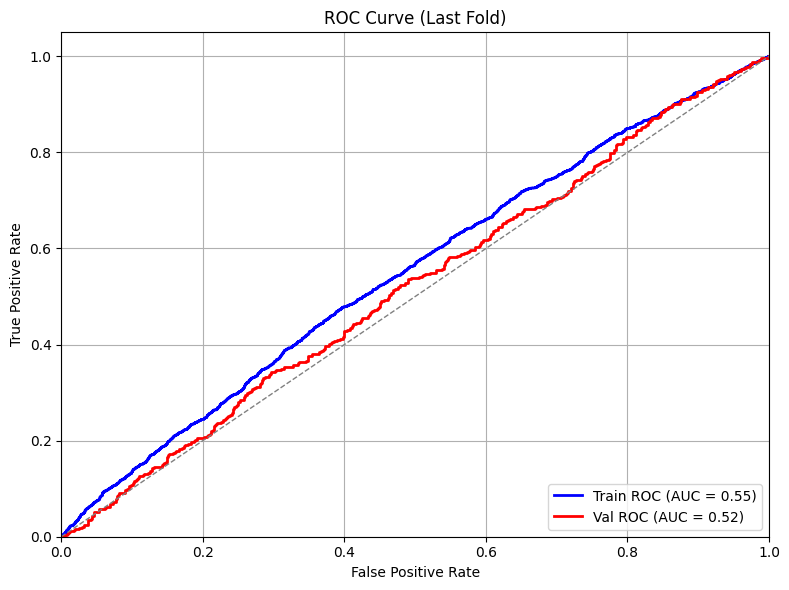

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.80%
Confusion Matrix (Total):
[[2568 3094]
 [2680 3394]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.50      0.55      0.52       635
          Up       0.53      0.49      0.51       669

    accuracy                           0.52      1304
   macro avg       0.52      0.52      0.52      1304
weighted avg       0.52      0.52      0.52      1304

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -1217.372054
  Test samples: 13244
  Features used: 31
  Overall Accuracy: 0.5302 (53.02%)
  Weighted Accuracy: 0.5302 (53.02%)
  Rise Accuracy: 0.4892 (48.92%) - 6689 samples
  Fall Accuracy: 0.5721 (57.21%) - 6555 samples
  Precision: 0.5384
  Recall: 0.4892
  F1 Score: 0.5126
  Confusion Matrix (Fall/Rise):
    [[3750 2805]  # Predicted Fall
     [3417 3272]]  # Predicted Rise
     # Actual Fall  Act

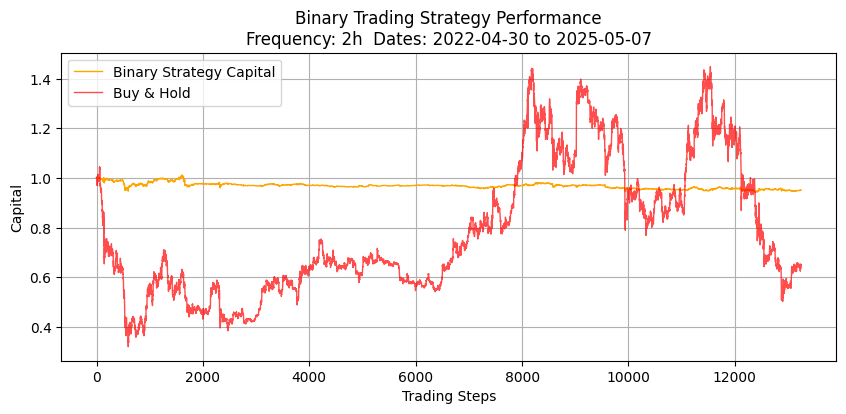

{'Total Return': -0.0487619611140242, 'Buy and Hold Return': -0.3625706532624127, 'Hit Rate': 0.5223497432799759, 'Sharpe Ratio': -0.3951523628459225, 'Number of Trades': 13244}
Hit Rate (Long/Price Rise): 52.82%
Hit Rate (Short/Price Fall): 51.60%
Number of Long Trades: 6855
Number of Short Trades: 6389
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


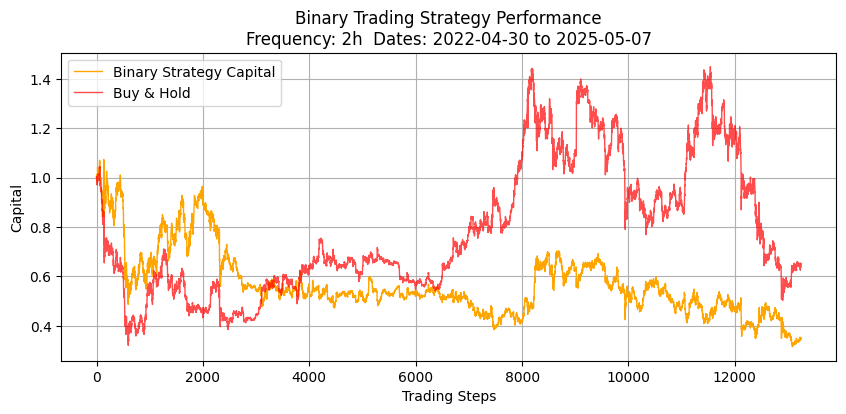

{'Total Return': -0.6504773169534854, 'Buy and Hold Return': -0.3625706532624127, 'Hit Rate': 0.5223497432799759, 'Sharpe Ratio': -0.5176856455683315, 'Number of Trades': 13244}
Hit Rate (Long/Price Rise): 52.82%
Hit Rate (Short/Price Fall): 51.60%
Number of Long Trades: 6855
Number of Short Trades: 6389
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


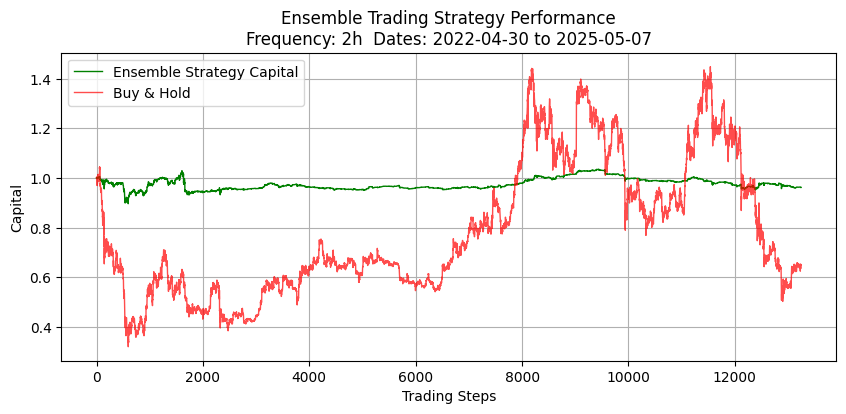

Ensemble Strategy Metrics: {'Total Return': -0.03751978321302385, 'Buy and Hold Return': -0.3625706532624127, 'Hit Rate': 0.523011963406052, 'Sharpe Ratio': -0.17345658552736412, 'Number of Trades': 7105}
Hit Rate (Long/Price Rise): 53.87%
Hit Rate (Short/Price Fall): 48.38%
Number of Long Trades: 5073
Number of Short Trades: 2032
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


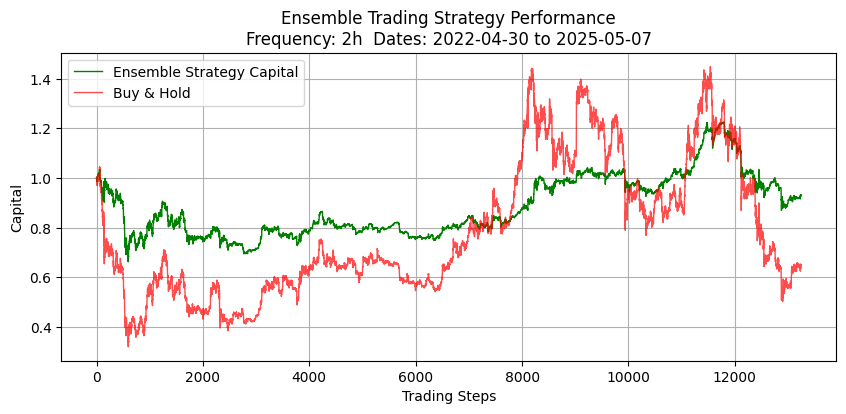

Ensemble Strategy Metrics: {'Total Return': -0.06797466739526214, 'Buy and Hold Return': -0.3625706532624127, 'Hit Rate': 0.5310344827586206, 'Sharpe Ratio': -0.09546707516241701, 'Number of Trades': 7105}
Hit Rate (Long/Price Rise): 53.33%
Hit Rate (Short/Price Fall): 49.08%
Number of Long Trades: 6726
Number of Short Trades: 379
Testing ETH with trading window 3
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0004618039869327803
Fraction positive: 0.5173819499490432
Fraction negative: 0.48193862529724835
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'b

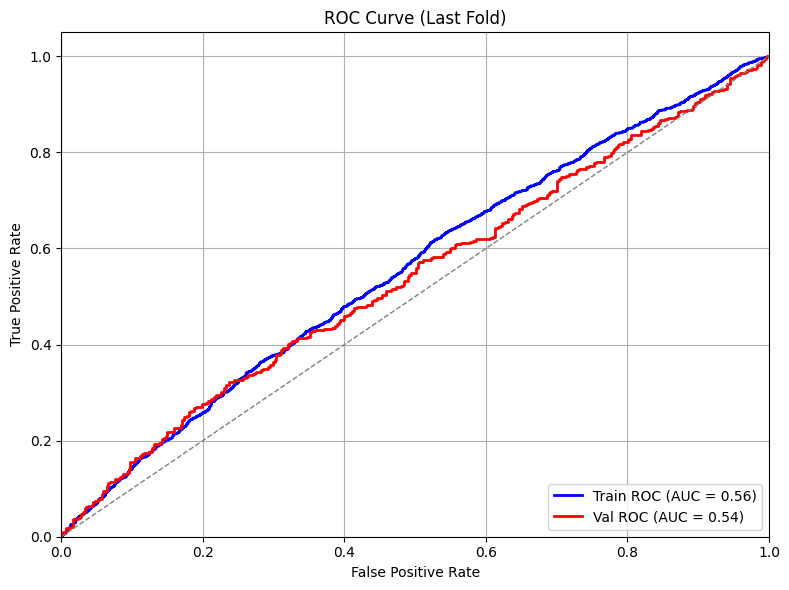

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 52.17%
Confusion Matrix (Total):
[[1466 2234]
 [1481 2586]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.51      0.73      0.60       421
          Up       0.57      0.34      0.42       442

    accuracy                           0.53       863
   macro avg       0.54      0.53      0.51       863
weighted avg       0.54      0.53      0.51       863

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -346.323913
  Test samples: 8827
  Features used: 31
  Overall Accuracy: 0.5047 (50.47%)
  Weighted Accuracy: 0.5047 (50.47%)
  Rise Accuracy: 0.0121 (1.21%) - 4382 samples
  Fall Accuracy: 0.9903 (99.03%) - 4445 samples
  Precision: 0.5521
  Recall: 0.0121
  F1 Score: 0.0237
  Confusion Matrix (Fall/Rise):
    [[4402   43]  # Predicted Fall
     [4329   53]]  # Predicted Rise
     # Actual Fall  Actual

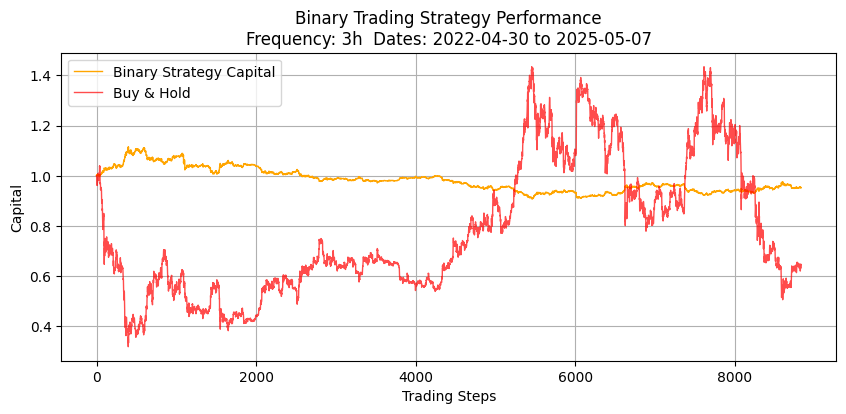

{'Total Return': -0.047600936473099265, 'Buy and Hold Return': -0.366785306939839, 'Hit Rate': 0.49292105561218713, 'Sharpe Ratio': -0.22599567818133856, 'Number of Trades': 8829}
Hit Rate (Long/Price Rise): 54.39%
Hit Rate (Short/Price Fall): 49.23%
Number of Long Trades: 114
Number of Short Trades: 8715
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


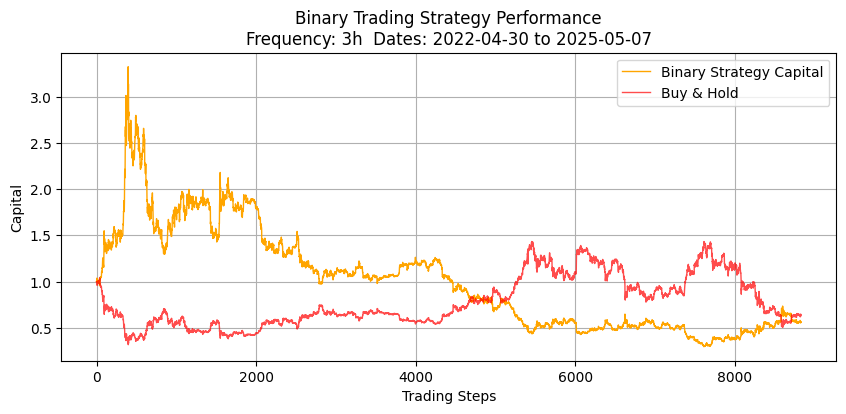

{'Total Return': -0.4379106550317714, 'Buy and Hold Return': -0.366785306939839, 'Hit Rate': 0.49292105561218713, 'Sharpe Ratio': -0.14977070606012902, 'Number of Trades': 8829}
Hit Rate (Long/Price Rise): 54.39%
Hit Rate (Short/Price Fall): 49.23%
Number of Long Trades: 114
Number of Short Trades: 8715
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


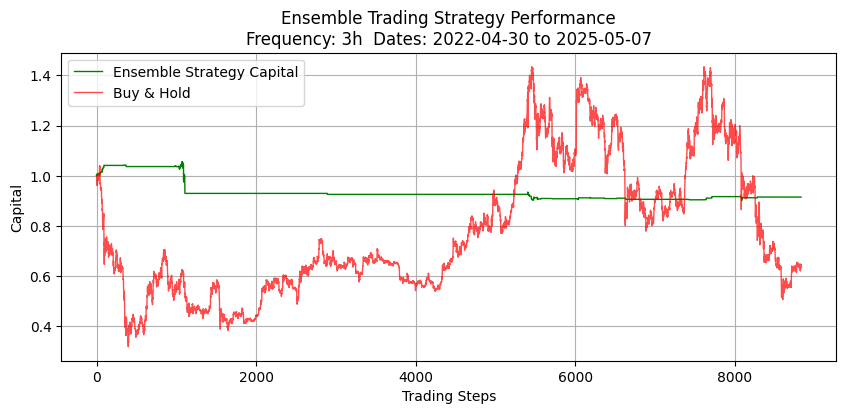

Ensemble Strategy Metrics: {'Total Return': -0.08516603133561573, 'Buy and Hold Return': -0.366785306939839, 'Hit Rate': 0.47761194029850745, 'Sharpe Ratio': -0.49316474334698873, 'Number of Trades': 201}
Hit Rate (Long/Price Rise): 50.00%
Hit Rate (Short/Price Fall): 46.34%
Number of Long Trades: 78
Number of Short Trades: 123
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


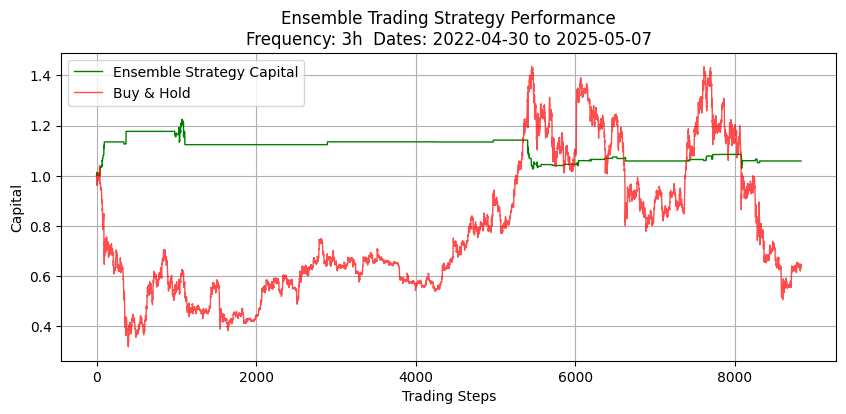

Ensemble Strategy Metrics: {'Total Return': 0.058771753728470655, 'Buy and Hold Return': -0.366785306939839, 'Hit Rate': 0.5024875621890548, 'Sharpe Ratio': 0.21544104916587242, 'Number of Trades': 201}
Hit Rate (Long/Price Rise): 52.14%
Hit Rate (Short/Price Fall): 47.62%
Number of Long Trades: 117
Number of Short Trades: 84
Testing ETH with trading window 4
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.000612833340976593
Fraction positive: 0.5144194473803413
Fraction negative: 0.484674618752831
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger

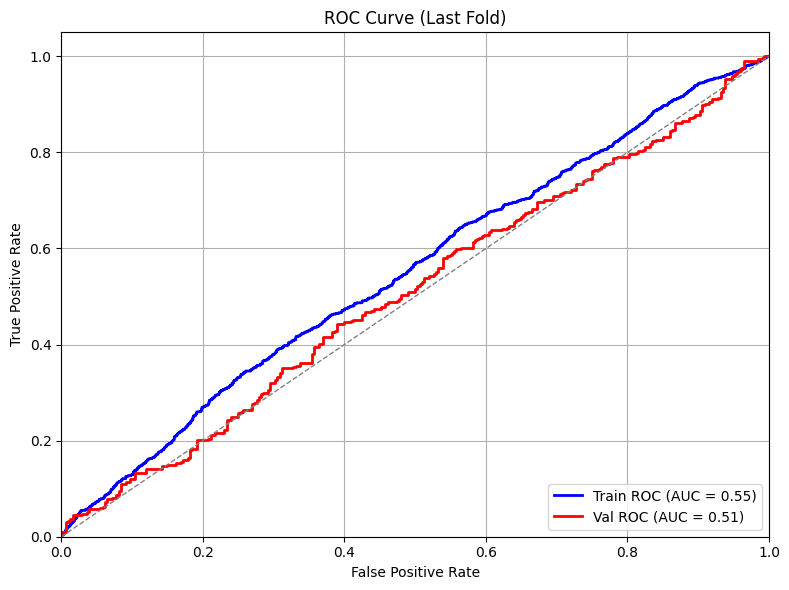

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.94%
Confusion Matrix (Total):
[[1028 1705]
 [1072 1973]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.49      0.25      0.33       308
          Up       0.52      0.76      0.62       334

    accuracy                           0.51       642
   macro avg       0.51      0.50      0.47       642
weighted avg       0.51      0.51      0.48       642

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -338.322033
  Test samples: 6619
  Features used: 31
  Overall Accuracy: 0.5132 (51.32%)
  Weighted Accuracy: 0.5132 (51.32%)
  Rise Accuracy: 0.7237 (72.37%) - 3308 samples
  Fall Accuracy: 0.3029 (30.29%) - 3311 samples
  Precision: 0.5091
  Recall: 0.7237
  F1 Score: 0.5978
  Confusion Matrix (Fall/Rise):
    [[1003 2308]  # Predicted Fall
     [ 914 2394]]  # Predicted Rise
     # Actual Fall  Actua

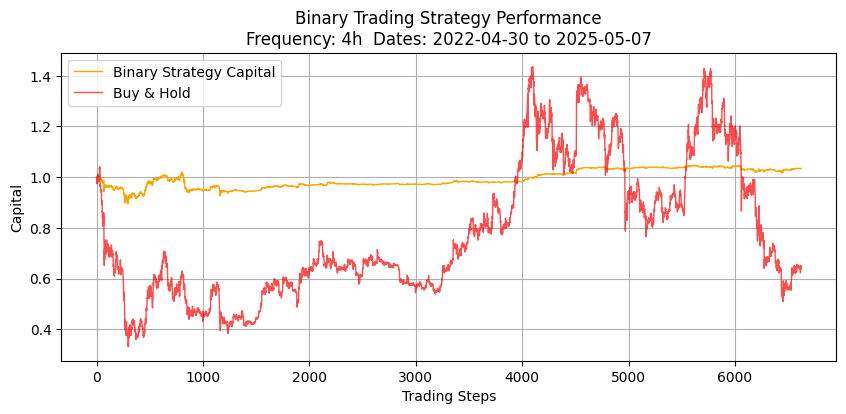

{'Total Return': 0.034208404099326684, 'Buy and Hold Return': -0.3601564500322258, 'Hit Rate': 0.5047575894879928, 'Sharpe Ratio': 0.17399319250297596, 'Number of Trades': 6621}
Hit Rate (Long/Price Rise): 50.24%
Hit Rate (Short/Price Fall): 51.13%
Number of Long Trades: 4900
Number of Short Trades: 1721
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


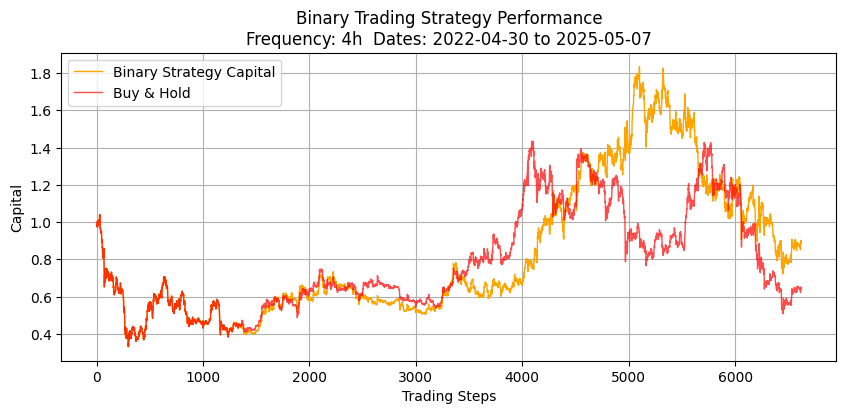

{'Total Return': -0.10354459683335837, 'Buy and Hold Return': -0.3601564500322258, 'Hit Rate': 0.5047575894879928, 'Sharpe Ratio': -0.058016002732925155, 'Number of Trades': 6621}
Hit Rate (Long/Price Rise): 50.24%
Hit Rate (Short/Price Fall): 51.13%
Number of Long Trades: 4900
Number of Short Trades: 1721
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


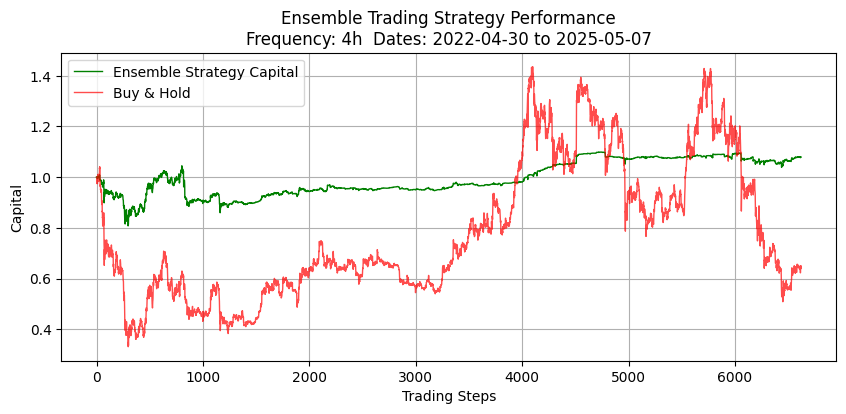

Ensemble Strategy Metrics: {'Total Return': 0.07942267303988393, 'Buy and Hold Return': -0.3601564500322258, 'Hit Rate': 0.5070564516129032, 'Sharpe Ratio': 0.21068093730614892, 'Number of Trades': 4960}
Hit Rate (Long/Price Rise): 51.04%
Hit Rate (Short/Price Fall): 48.79%
Number of Long Trades: 4218
Number of Short Trades: 742
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


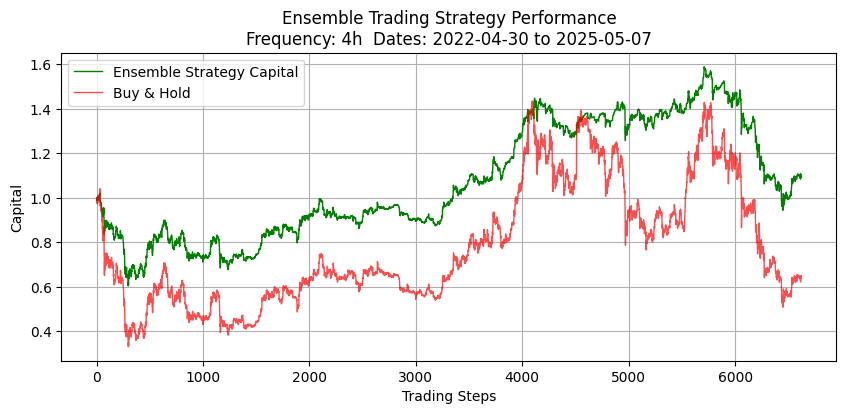

Ensemble Strategy Metrics: {'Total Return': 0.0913892300999859, 'Buy and Hold Return': -0.3601564500322258, 'Hit Rate': 0.5112903225806451, 'Sharpe Ratio': 0.09790672016861524, 'Number of Trades': 4960}
Hit Rate (Long/Price Rise): 51.10%
Hit Rate (Short/Price Fall): 54.76%
Number of Long Trades: 4918
Number of Short Trades: 42
Testing ETH with trading window 5
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0007741656714883776
Fraction positive: 0.5229288545008492
Fraction negative: 0.4763162860917154
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollin

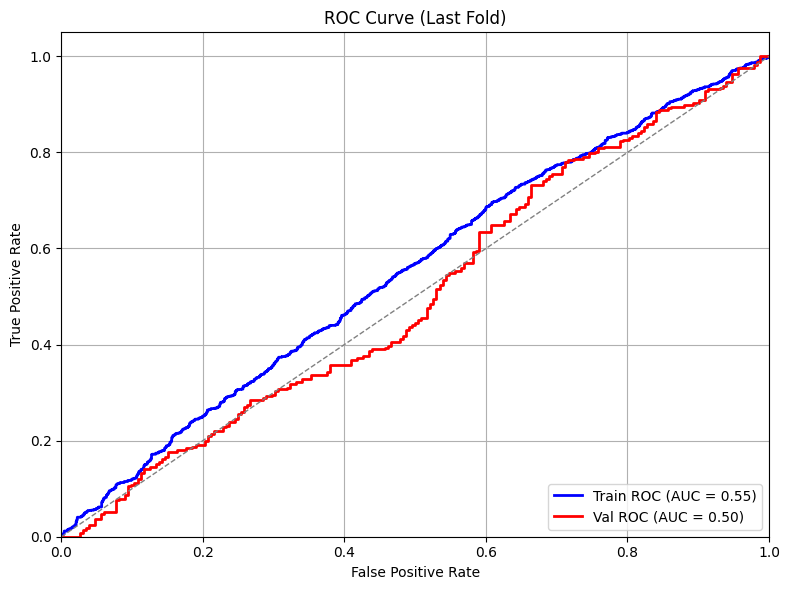

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 49.86%
Confusion Matrix (Total):
[[1107 1028]
 [1269 1177]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.45      0.75      0.57       232
          Up       0.54      0.24      0.33       277

    accuracy                           0.47       509
   macro avg       0.49      0.50      0.45       509
weighted avg       0.50      0.47      0.44       509

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -114.293343
  Test samples: 5293
  Features used: 31
  Overall Accuracy: 0.4963 (49.63%)
  Weighted Accuracy: 0.4963 (49.63%)
  Rise Accuracy: 0.0075 (0.75%) - 2654 samples
  Fall Accuracy: 0.9879 (98.79%) - 2639 samples
  Precision: 0.3846
  Recall: 0.0075
  F1 Score: 0.0148
  Confusion Matrix (Fall/Rise):
    [[2607   32]  # Predicted Fall
     [2634   20]]  # Predicted Rise
     # Actual Fall  Actual

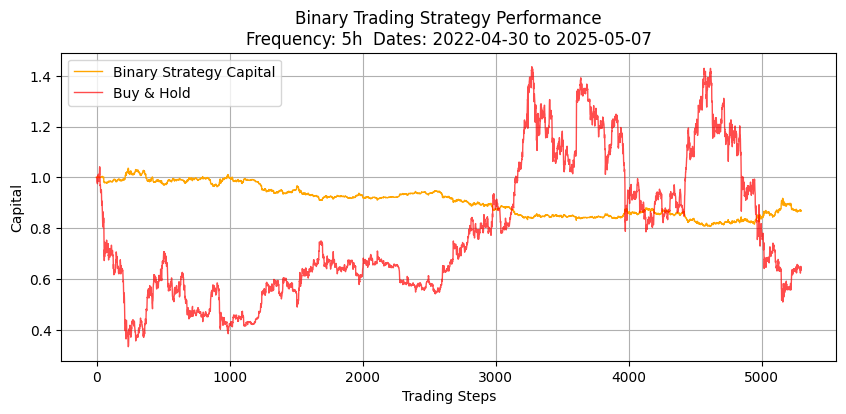

{'Total Return': -0.1314358797649553, 'Buy and Hold Return': -0.3652367044255856, 'Hit Rate': 0.48857844062676986, 'Sharpe Ratio': -0.5702136752551049, 'Number of Trades': 5297}
Hit Rate (Long/Price Rise): 46.48%
Hit Rate (Short/Price Fall): 48.89%
Number of Long Trades: 71
Number of Short Trades: 5226
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


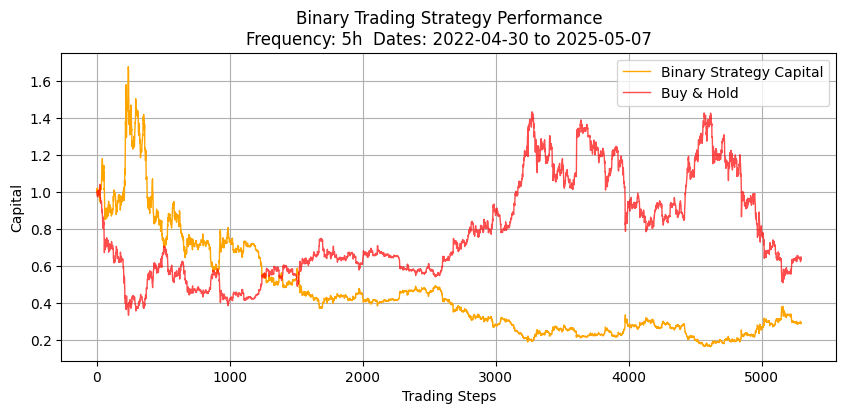

{'Total Return': -0.7095289081629419, 'Buy and Hold Return': -0.3652367044255856, 'Hit Rate': 0.48857844062676986, 'Sharpe Ratio': -0.5108940407763888, 'Number of Trades': 5297}
Hit Rate (Long/Price Rise): 46.48%
Hit Rate (Short/Price Fall): 48.89%
Number of Long Trades: 71
Number of Short Trades: 5226
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


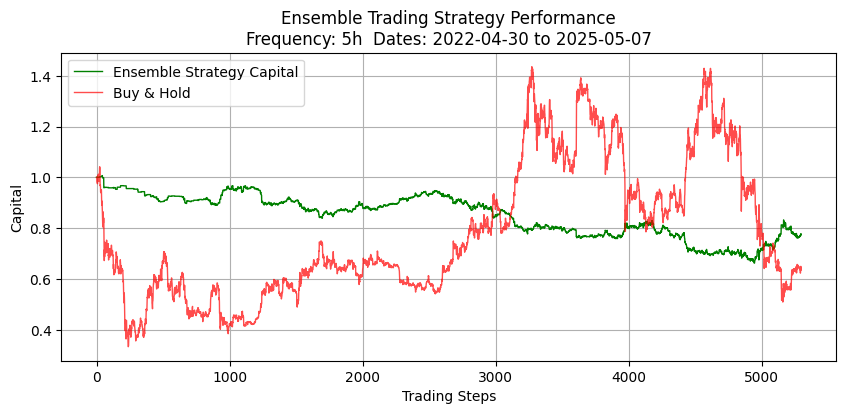

Ensemble Strategy Metrics: {'Total Return': -0.22533829608373102, 'Buy and Hold Return': -0.3652367044255856, 'Hit Rate': 0.4921422663358147, 'Sharpe Ratio': -0.6711530894770854, 'Number of Trades': 3627}
Hit Rate (Long/Price Rise): 42.86%
Hit Rate (Short/Price Fall): 49.29%
Number of Long Trades: 42
Number of Short Trades: 3585
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


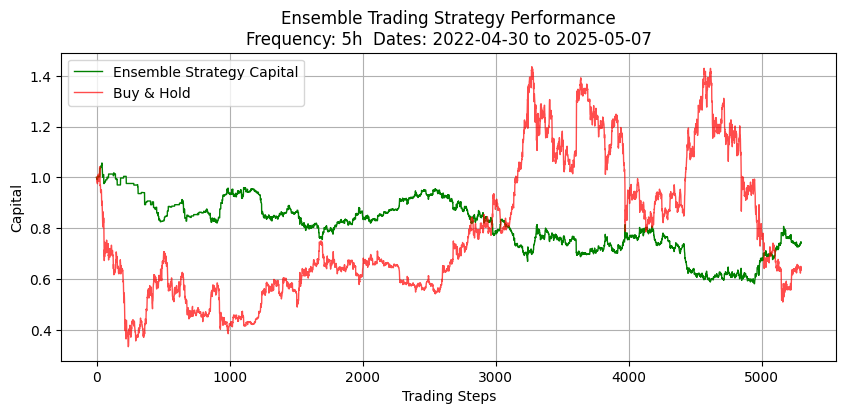

Ensemble Strategy Metrics: {'Total Return': -0.2577605593357356, 'Buy and Hold Return': -0.3652367044255856, 'Hit Rate': 0.49324510614833195, 'Sharpe Ratio': -0.4515330778973142, 'Number of Trades': 3627}
Hit Rate (Long/Price Rise): 48.57%
Hit Rate (Short/Price Fall): 49.34%
Number of Long Trades: 70
Number of Short Trades: 3557
Testing ETH with trading window 6
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0009204502152683965
Fraction positive: 0.5292119565217391
Fraction negative: 0.4701086956521739
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'boll

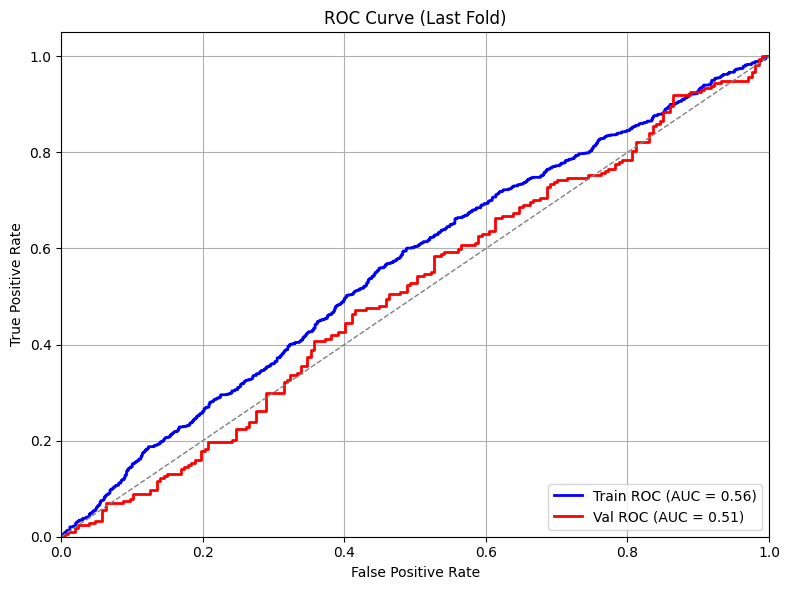

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 48.38%
Confusion Matrix (Total):
[[1024  776]
 [1180  809]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.51      0.50      0.50       207
          Up       0.53      0.54      0.53       214

    accuracy                           0.52       421
   macro avg       0.52      0.52      0.52       421
weighted avg       0.52      0.52      0.52       421

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -173.570694
  Test samples: 4409
  Features used: 31
  Overall Accuracy: 0.5035 (50.35%)
  Weighted Accuracy: 0.5035 (50.35%)
  Rise Accuracy: 0.9120 (91.20%) - 2215 samples
  Fall Accuracy: 0.0912 (9.12%) - 2194 samples
  Precision: 0.5032
  Recall: 0.9120
  F1 Score: 0.6486
  Confusion Matrix (Fall/Rise):
    [[ 200 1994]  # Predicted Fall
     [ 195 2020]]  # Predicted Rise
     # Actual Fall  Actual

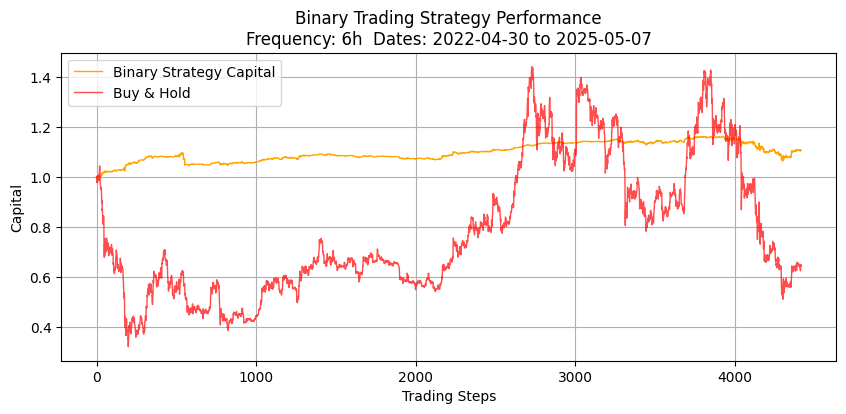

{'Total Return': 0.10731123234141915, 'Buy and Hold Return': -0.35805257777801397, 'Hit Rate': 0.512686905301314, 'Sharpe Ratio': 0.6961548191850886, 'Number of Trades': 4414}
Hit Rate (Long/Price Rise): 50.57%
Hit Rate (Short/Price Fall): 54.96%
Number of Long Trades: 3708
Number of Short Trades: 706
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


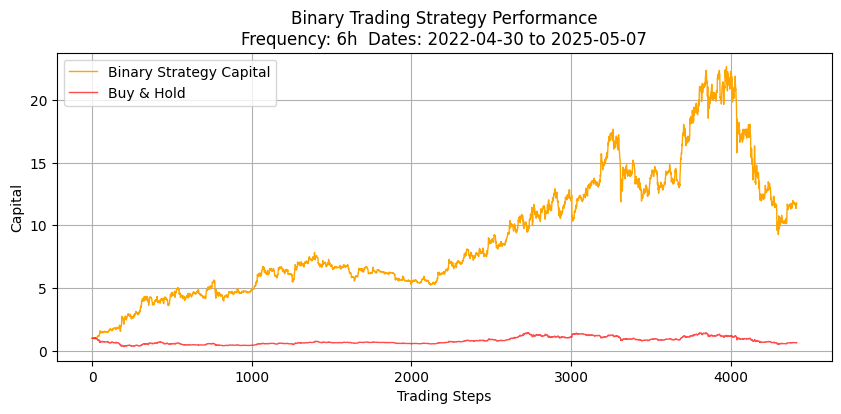

{'Total Return': 10.703201407961975, 'Buy and Hold Return': -0.35805257777801397, 'Hit Rate': 0.512686905301314, 'Sharpe Ratio': 0.5097063924530547, 'Number of Trades': 4414}
Hit Rate (Long/Price Rise): 50.57%
Hit Rate (Short/Price Fall): 54.96%
Number of Long Trades: 3708
Number of Short Trades: 706
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


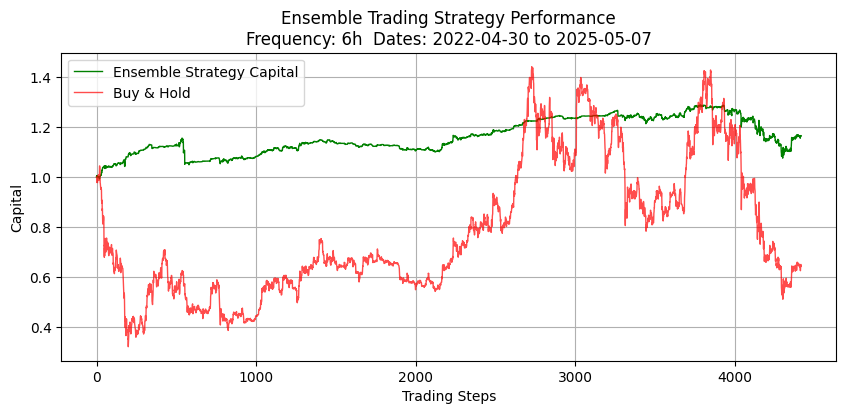

Ensemble Strategy Metrics: {'Total Return': 0.1638598792612629, 'Buy and Hold Return': -0.35805257777801397, 'Hit Rate': 0.5110637163423087, 'Sharpe Ratio': 0.5114494595876908, 'Number of Trades': 3751}
Hit Rate (Long/Price Rise): 50.53%
Hit Rate (Short/Price Fall): 56.40%
Number of Long Trades: 3384
Number of Short Trades: 367
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


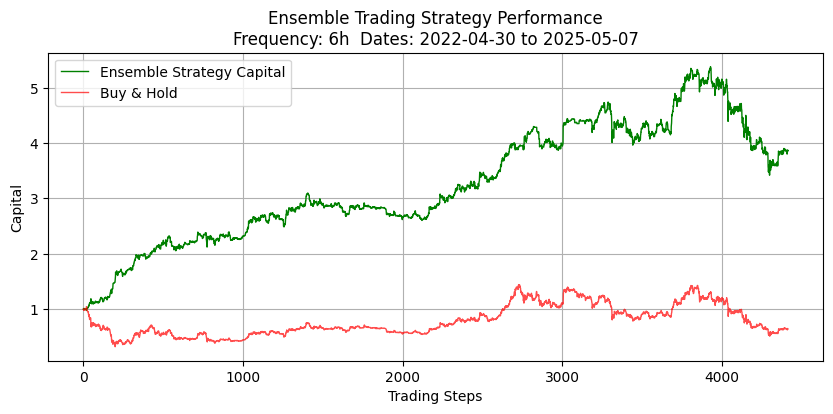

Ensemble Strategy Metrics: {'Total Return': 2.85836697310247, 'Buy and Hold Return': -0.35805257777801397, 'Hit Rate': 0.5113303119168222, 'Sharpe Ratio': 0.9197041439917256, 'Number of Trades': 3751}
Hit Rate (Long/Price Rise): 50.52%
Hit Rate (Short/Price Fall): 60.71%
Number of Long Trades: 3527
Number of Short Trades: 224
Testing TRX with trading window 2
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.00019856522923226798
Fraction positive: 0.5094368111127887
Fraction negative: 0.4799184659519855
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 

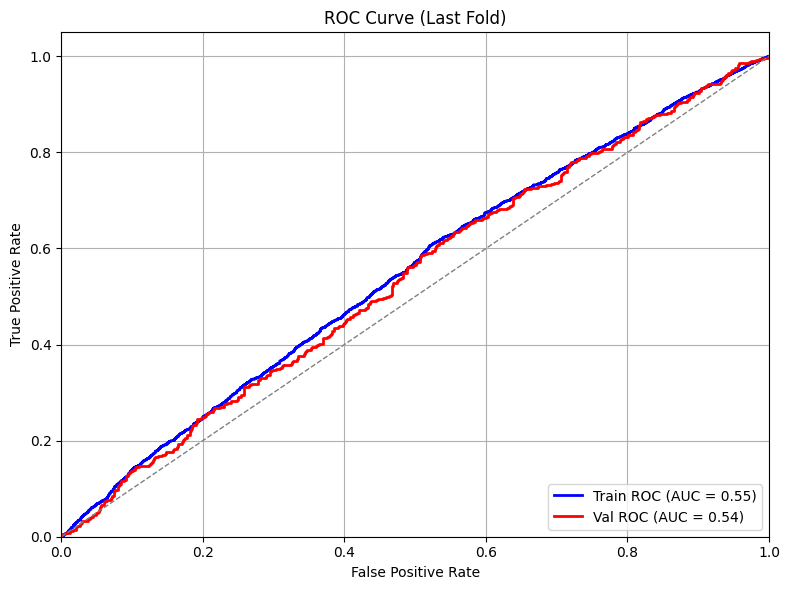

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.38%
Confusion Matrix (Total):
[[2879 2709]
 [2997 3151]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.49      0.65      0.56       616
          Up       0.56      0.40      0.46       688

    accuracy                           0.51      1304
   macro avg       0.52      0.52      0.51      1304
weighted avg       0.52      0.51      0.51      1304

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -1741.951155
  Test samples: 13244
  Features used: 30
  Overall Accuracy: 0.5261 (52.61%)
  Weighted Accuracy: 0.5261 (52.61%)
  Rise Accuracy: 0.8131 (81.31%) - 7003 samples
  Fall Accuracy: 0.2041 (20.41%) - 6241 samples
  Precision: 0.5341
  Recall: 0.8131
  F1 Score: 0.6447
  Confusion Matrix (Fall/Rise):
    [[1274 4967]  # Predicted Fall
     [1309 5694]]  # Predicted Rise
     # Actual Fall  Act

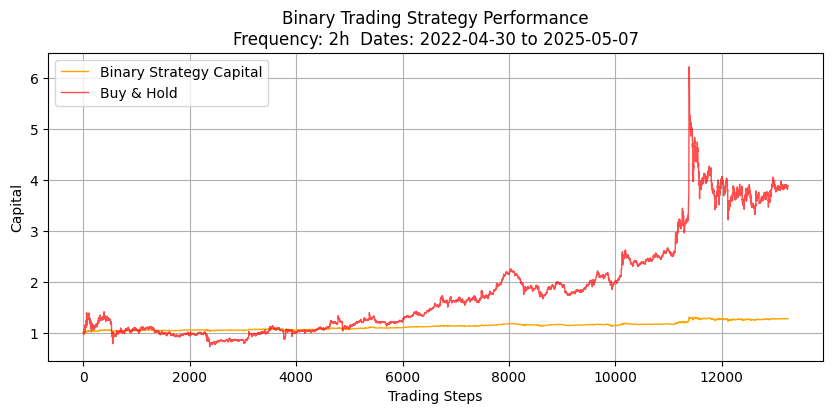

{'Total Return': 0.27503079405629527, 'Buy and Hold Return': 2.884064773527341, 'Hit Rate': 0.5183479311386288, 'Sharpe Ratio': 1.1547732891567148, 'Number of Trades': 13244}
Hit Rate (Long/Price Rise): 51.84%
Hit Rate (Short/Price Fall): 50.00%
Number of Long Trades: 13210
Number of Short Trades: 34
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


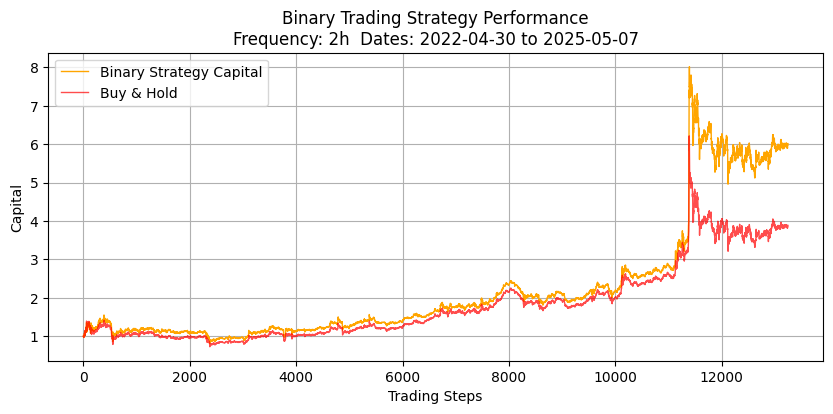

{'Total Return': 5.014365655406046, 'Buy and Hold Return': 2.884064773527341, 'Hit Rate': 0.5183479311386288, 'Sharpe Ratio': 0.9130429445207661, 'Number of Trades': 13244}
Hit Rate (Long/Price Rise): 51.84%
Hit Rate (Short/Price Fall): 50.00%
Number of Long Trades: 13210
Number of Short Trades: 34
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


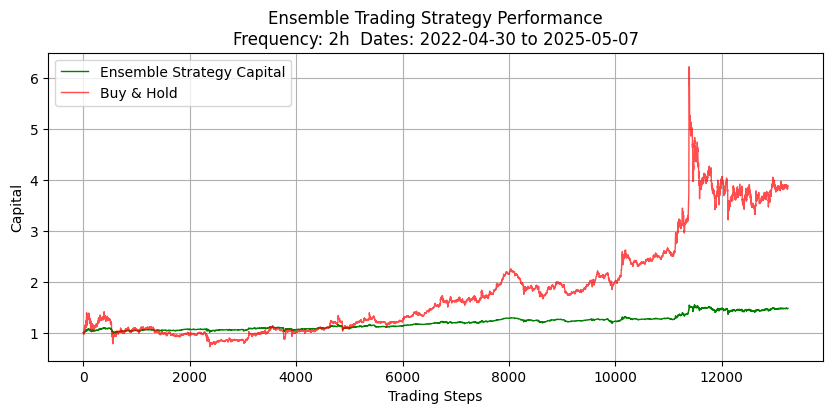

Ensemble Strategy Metrics: {'Total Return': 0.47619056067342047, 'Buy and Hold Return': 2.884064773527341, 'Hit Rate': 0.5177730518000911, 'Sharpe Ratio': 0.9371846651701914, 'Number of Trades': 13166}
Hit Rate (Long/Price Rise): 51.78%
Hit Rate (Short/Price Fall): 47.83%
Number of Long Trades: 13143
Number of Short Trades: 23
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


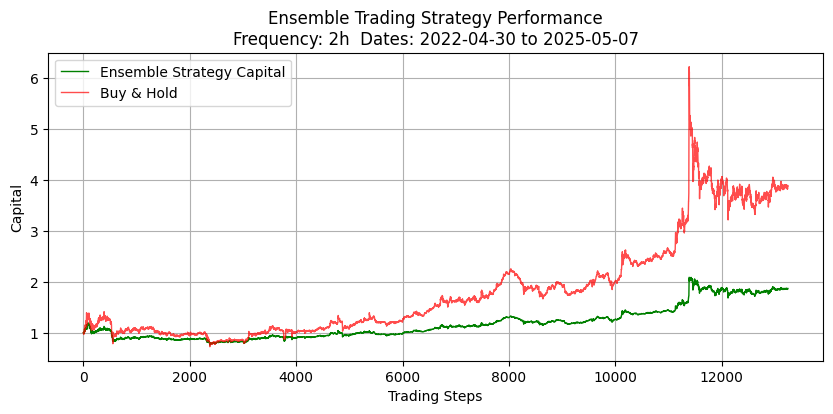

Ensemble Strategy Metrics: {'Total Return': 0.8679234063786678, 'Buy and Hold Return': 2.884064773527341, 'Hit Rate': 0.5180768646513747, 'Sharpe Ratio': 0.8330140467720408, 'Number of Trades': 13166}
Hit Rate (Long/Price Rise): 51.80%
Hit Rate (Short/Price Fall): 66.67%
Number of Long Trades: 13157
Number of Short Trades: 9
Testing TRX with trading window 3
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.00029196334185631106
Fraction positive: 0.5136451138036462
Fraction negative: 0.4799003510361228
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', '

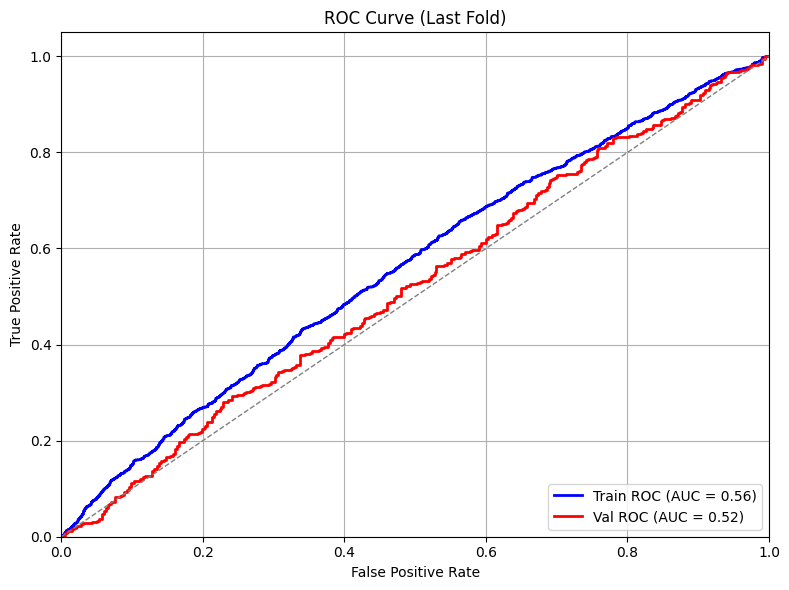

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.23%
Confusion Matrix (Total):
[[2072 1580]
 [2208 1907]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.47      0.59      0.52       398
          Up       0.55      0.43      0.48       465

    accuracy                           0.50       863
   macro avg       0.51      0.51      0.50       863
weighted avg       0.51      0.50      0.50       863

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -829.991370
  Test samples: 8827
  Features used: 30
  Overall Accuracy: 0.5366 (53.66%)
  Weighted Accuracy: 0.5366 (53.66%)
  Rise Accuracy: 0.8862 (88.62%) - 4709 samples
  Fall Accuracy: 0.1370 (13.70%) - 4118 samples
  Precision: 0.5401
  Recall: 0.8862
  F1 Score: 0.6711
  Confusion Matrix (Fall/Rise):
    [[ 564 3554]  # Predicted Fall
     [ 536 4173]]  # Predicted Rise
     # Actual Fall  Actua

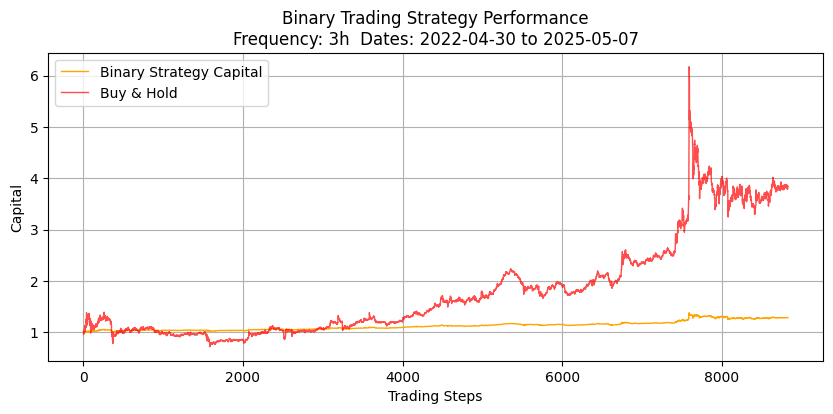

{'Total Return': 0.28530269313183587, 'Buy and Hold Return': 2.8437038763303035, 'Hit Rate': 0.5241816740287688, 'Sharpe Ratio': 0.9204781584671271, 'Number of Trades': 8829}
Hit Rate (Long/Price Rise): 52.41%
Hit Rate (Short/Price Fall): 62.50%
Number of Long Trades: 8821
Number of Short Trades: 8
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


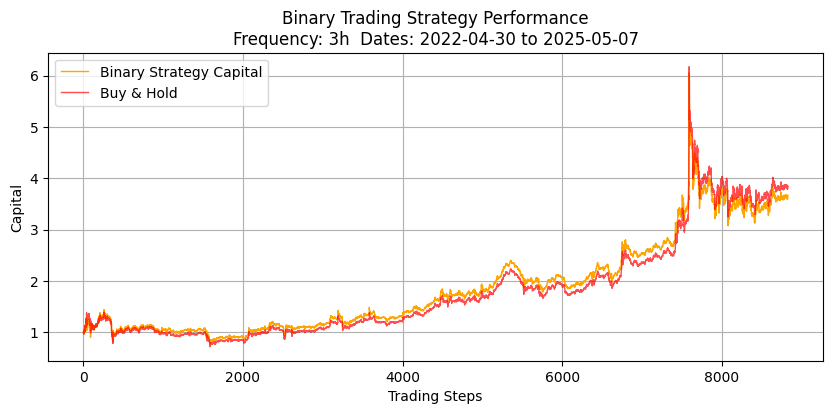

{'Total Return': 2.6665984660189794, 'Buy and Hold Return': 2.8437038763303035, 'Hit Rate': 0.5241816740287688, 'Sharpe Ratio': 0.6132217936679012, 'Number of Trades': 8829}
Hit Rate (Long/Price Rise): 52.41%
Hit Rate (Short/Price Fall): 62.50%
Number of Long Trades: 8821
Number of Short Trades: 8
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


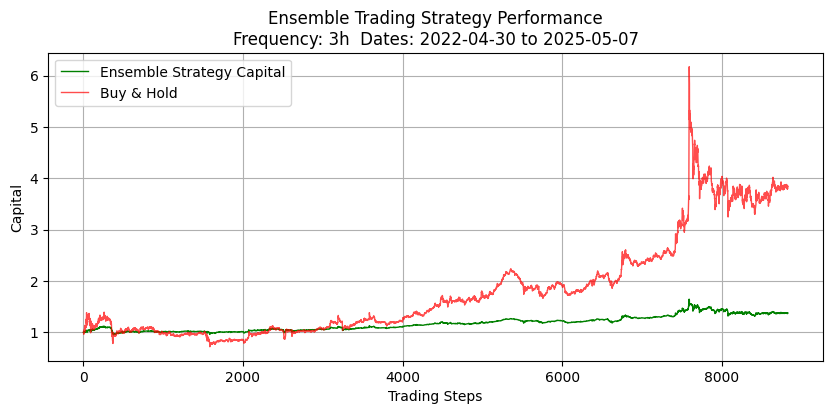

Ensemble Strategy Metrics: {'Total Return': 0.3747890301402059, 'Buy and Hold Return': 2.8437038763303035, 'Hit Rate': 0.5228660292593019, 'Sharpe Ratio': 0.5889402245289277, 'Number of Trades': 8681}
Hit Rate (Long/Price Rise): 52.29%
Hit Rate (Short/Price Fall): 50.00%
Number of Long Trades: 8675
Number of Short Trades: 6
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


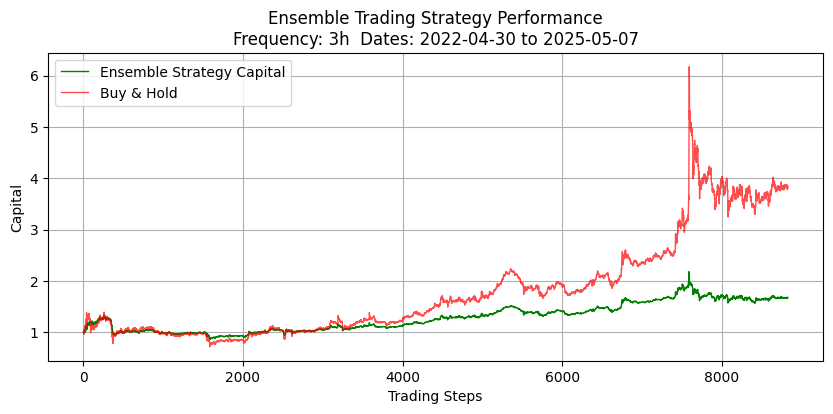

Ensemble Strategy Metrics: {'Total Return': 0.677638514763433, 'Buy and Hold Return': 2.8437038763303035, 'Hit Rate': 0.5228660292593019, 'Sharpe Ratio': 0.6197377394107937, 'Number of Trades': 8681}
Hit Rate (Long/Price Rise): 52.29%
Hit Rate (Short/Price Fall): 50.00%
Number of Long Trades: 8677
Number of Short Trades: 4
Testing TRX with trading window 4
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.00039396388186782133
Fraction positive: 0.5180431828476522
Fraction negative: 0.47501132417333536
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'o

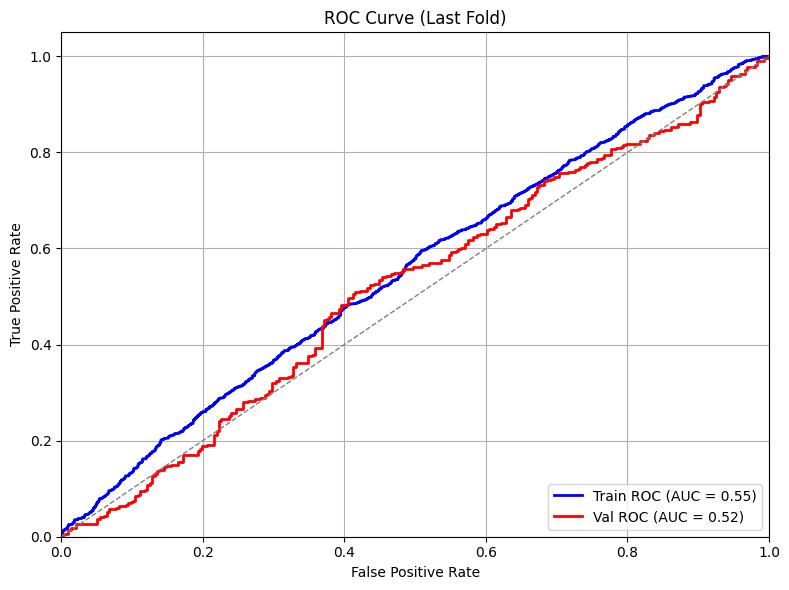

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.80%
Confusion Matrix (Total):
[[1477 1205]
 [1638 1458]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.48      0.44      0.46       296
          Up       0.55      0.60      0.58       346

    accuracy                           0.52       642
   macro avg       0.52      0.52      0.52       642
weighted avg       0.52      0.52      0.52       642

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -287.630493
  Test samples: 6619
  Features used: 30
  Overall Accuracy: 0.5244 (52.44%)
  Weighted Accuracy: 0.5244 (52.44%)
  Rise Accuracy: 0.4530 (45.30%) - 3567 samples
  Fall Accuracy: 0.6078 (60.78%) - 3052 samples
  Precision: 0.5745
  Recall: 0.4530
  F1 Score: 0.5066
  Confusion Matrix (Fall/Rise):
    [[1855 1197]  # Predicted Fall
     [1951 1616]]  # Predicted Rise
     # Actual Fall  Actua

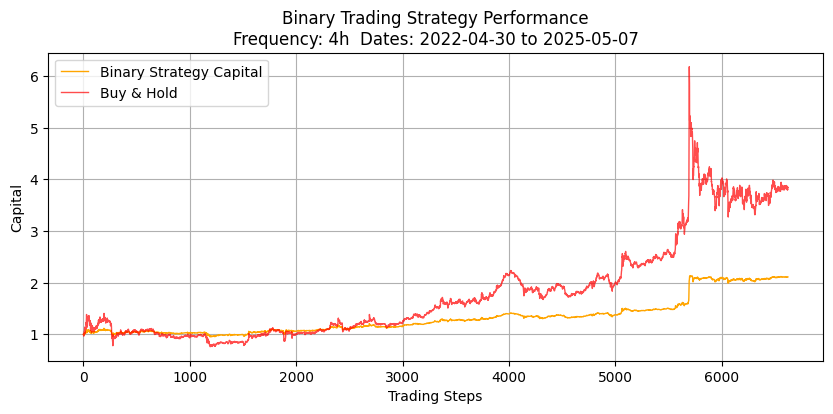

{'Total Return': 1.11139741490868, 'Buy and Hold Return': 2.8467522364838587, 'Hit Rate': 0.5292251925690983, 'Sharpe Ratio': 1.49794879210099, 'Number of Trades': 6621}
Hit Rate (Long/Price Rise): 52.92%
Hit Rate (Short/Price Fall): 54.55%
Number of Long Trades: 6610
Number of Short Trades: 11
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


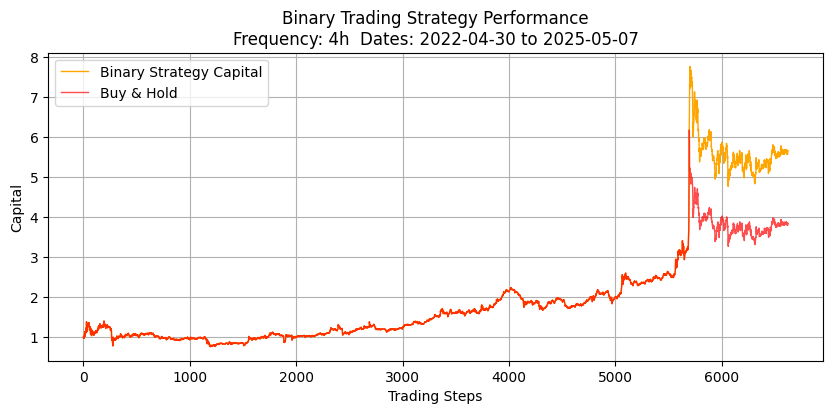

{'Total Return': 4.667614766723962, 'Buy and Hold Return': 2.8467522364838587, 'Hit Rate': 0.5292251925690983, 'Sharpe Ratio': 0.8718545122894573, 'Number of Trades': 6621}
Hit Rate (Long/Price Rise): 52.92%
Hit Rate (Short/Price Fall): 54.55%
Number of Long Trades: 6610
Number of Short Trades: 11
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


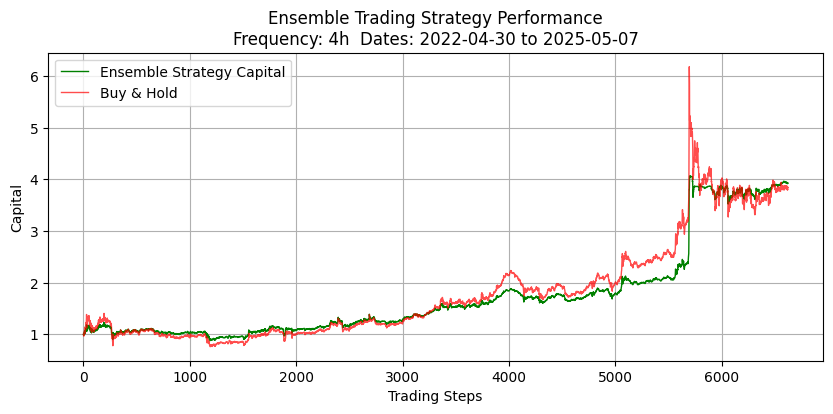

Ensemble Strategy Metrics: {'Total Return': 2.929505662213276, 'Buy and Hold Return': 2.8467522364838587, 'Hit Rate': 0.5304086157744694, 'Sharpe Ratio': 1.3639100925003729, 'Number of Trades': 6314}
Hit Rate (Long/Price Rise): 53.04%
Hit Rate (Short/Price Fall): 50.00%
Number of Long Trades: 6310
Number of Short Trades: 4
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


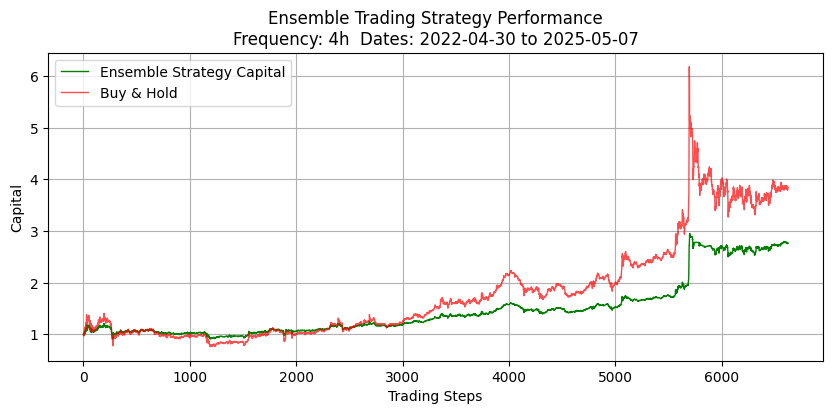

Ensemble Strategy Metrics: {'Total Return': 1.7682754066288275, 'Buy and Hold Return': 2.8467522364838587, 'Hit Rate': 0.5305669939816281, 'Sharpe Ratio': 1.2993218767050587, 'Number of Trades': 6314}
Hit Rate (Long/Price Rise): 53.05%
Hit Rate (Short/Price Fall): 60.00%
Number of Long Trades: 6309
Number of Short Trades: 5
Testing TRX with trading window 5
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0004849350558027518
Fraction positive: 0.5187771277599547
Fraction negative: 0.4759388563879977
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'ob

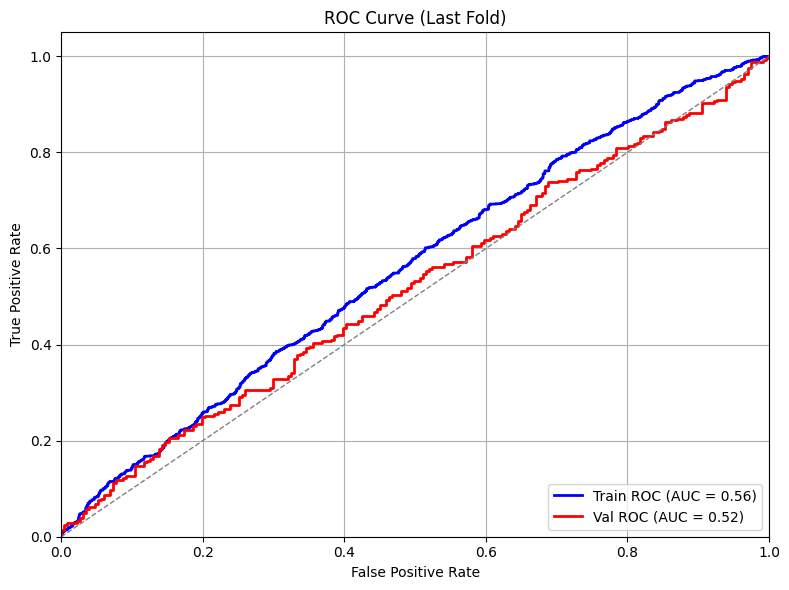

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 49.44%
Confusion Matrix (Total):
[[1314  846]
 [1470  951]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.47      0.49      0.48       231
          Up       0.56      0.54      0.55       278

    accuracy                           0.52       509
   macro avg       0.51      0.51      0.51       509
weighted avg       0.52      0.52      0.52       509

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -265.239283
  Test samples: 5293
  Features used: 30
  Overall Accuracy: 0.5479 (54.79%)
  Weighted Accuracy: 0.5479 (54.79%)
  Rise Accuracy: 0.7373 (73.73%) - 2855 samples
  Fall Accuracy: 0.3261 (32.61%) - 2438 samples
  Precision: 0.5616
  Recall: 0.7373
  F1 Score: 0.6376
  Confusion Matrix (Fall/Rise):
    [[ 795 1643]  # Predicted Fall
     [ 750 2105]]  # Predicted Rise
     # Actual Fall  Actua

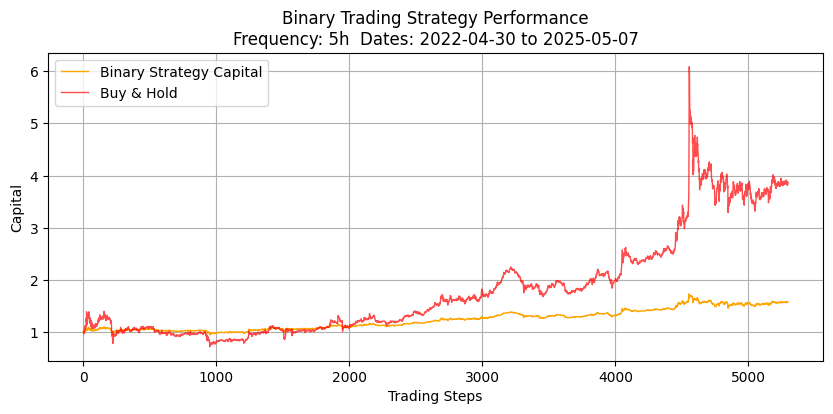

{'Total Return': 0.5797676067436404, 'Buy and Hold Return': 2.8671049542146045, 'Hit Rate': 0.5304889560128374, 'Sharpe Ratio': 0.8934264634242804, 'Number of Trades': 5297}
Hit Rate (Long/Price Rise): 53.04%
Hit Rate (Short/Price Fall): 60.00%
Number of Long Trades: 5292
Number of Short Trades: 5
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


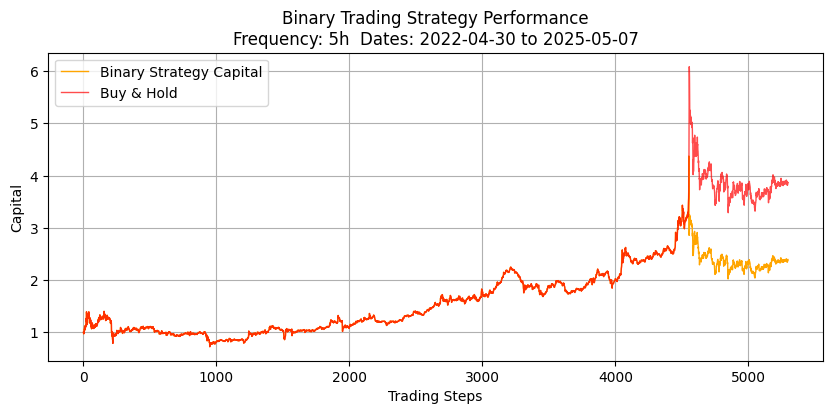

{'Total Return': 1.3944114220183779, 'Buy and Hold Return': 2.8671049542146045, 'Hit Rate': 0.5304889560128374, 'Sharpe Ratio': 0.37192875115303636, 'Number of Trades': 5297}
Hit Rate (Long/Price Rise): 53.04%
Hit Rate (Short/Price Fall): 60.00%
Number of Long Trades: 5292
Number of Short Trades: 5
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


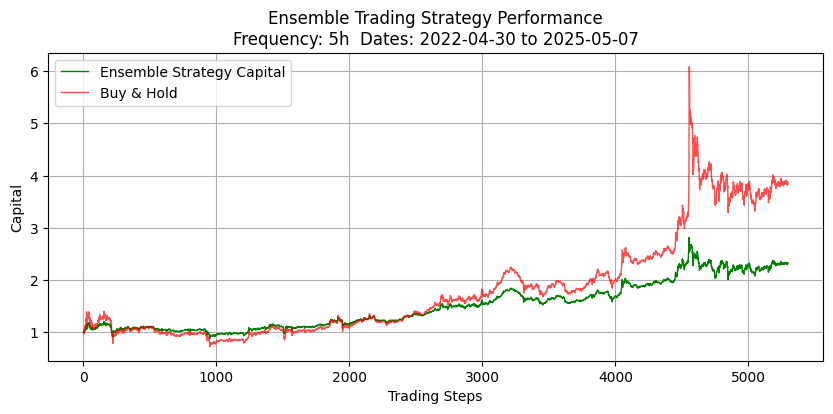

Ensemble Strategy Metrics: {'Total Return': 1.332397255501729, 'Buy and Hold Return': 2.8671049542146045, 'Hit Rate': 0.5309249101569888, 'Sharpe Ratio': 0.7924756891308896, 'Number of Trades': 5287}
Hit Rate (Long/Price Rise): 53.09%
Hit Rate (Short/Price Fall): 50.00%
Number of Long Trades: 5283
Number of Short Trades: 4
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


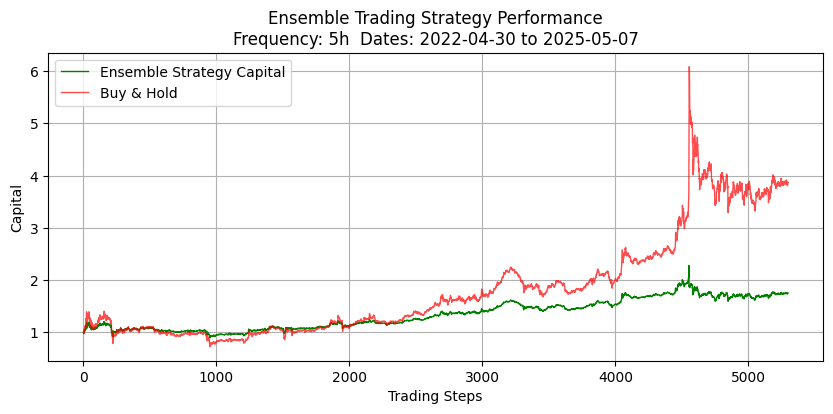

Ensemble Strategy Metrics: {'Total Return': 0.75260833667471, 'Buy and Hold Return': 2.8671049542146045, 'Hit Rate': 0.5309249101569888, 'Sharpe Ratio': 0.5990283966689612, 'Number of Trades': 5287}
Hit Rate (Long/Price Rise): 53.09%
Hit Rate (Short/Price Fall): 50.00%
Number of Long Trades: 5283
Number of Short Trades: 4
Testing TRX with trading window 6
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0005778968325682657
Fraction positive: 0.521286231884058
Fraction negative: 0.47192028985507245
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv'

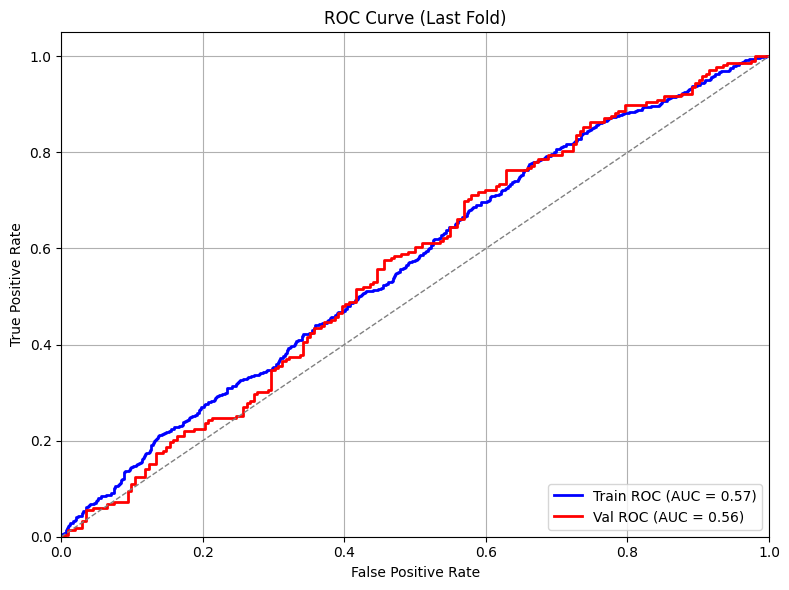

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 49.43%
Confusion Matrix (Total):
[[1065  712]
 [1204  808]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.48      0.95      0.64       202
          Up       0.57      0.06      0.11       219

    accuracy                           0.49       421
   macro avg       0.52      0.50      0.37       421
weighted avg       0.53      0.49      0.36       421

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -207.327837
  Test samples: 4409
  Features used: 30
  Overall Accuracy: 0.5117 (51.17%)
  Weighted Accuracy: 0.5117 (51.17%)
  Rise Accuracy: 0.5708 (57.08%) - 2388 samples
  Fall Accuracy: 0.4419 (44.19%) - 2021 samples
  Precision: 0.5472
  Recall: 0.5708
  F1 Score: 0.5587
  Confusion Matrix (Fall/Rise):
    [[ 893 1128]  # Predicted Fall
     [1025 1363]]  # Predicted Rise
     # Actual Fall  Actua

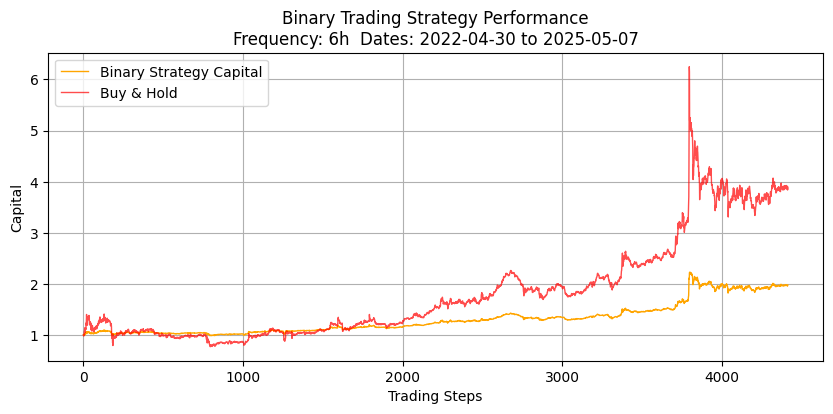

{'Total Return': 0.9769207616525513, 'Buy and Hold Return': 2.889719185086132, 'Hit Rate': 0.5310376076121431, 'Sharpe Ratio': 1.0479414891546803, 'Number of Trades': 4414}
Hit Rate (Long/Price Rise): 53.09%
Hit Rate (Short/Price Fall): 66.67%
Number of Long Trades: 4411
Number of Short Trades: 3
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


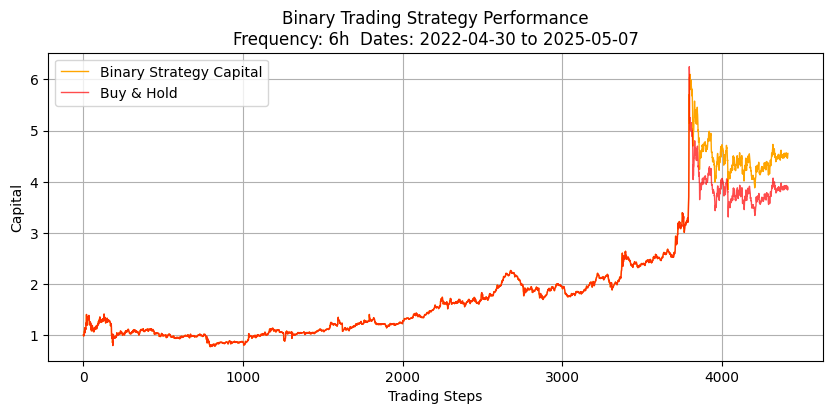

{'Total Return': 3.5513024450710207, 'Buy and Hold Return': 2.889719185086132, 'Hit Rate': 0.5310376076121431, 'Sharpe Ratio': 0.7199021905462789, 'Number of Trades': 4414}
Hit Rate (Long/Price Rise): 53.09%
Hit Rate (Short/Price Fall): 66.67%
Number of Long Trades: 4411
Number of Short Trades: 3
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


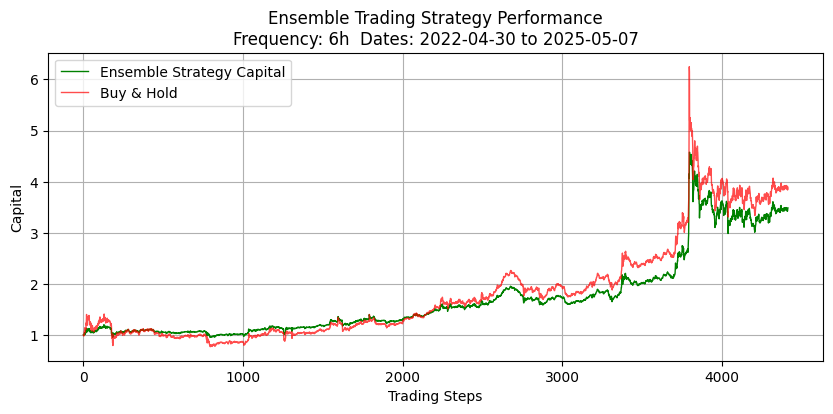

Ensemble Strategy Metrics: {'Total Return': 2.485647863046696, 'Buy and Hold Return': 2.889719185086132, 'Hit Rate': 0.5311720698254364, 'Sharpe Ratio': 0.8056622494359128, 'Number of Trades': 4411}
Hit Rate (Long/Price Rise): 53.11%
Hit Rate (Short/Price Fall): 66.67%
Number of Long Trades: 4408
Number of Short Trades: 3
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


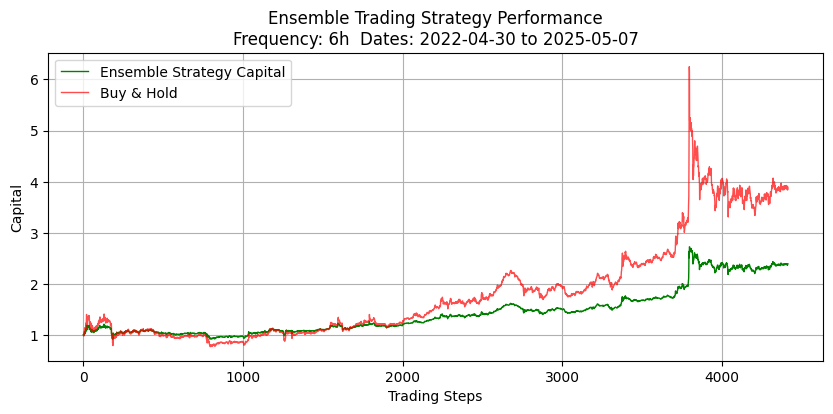

Ensemble Strategy Metrics: {'Total Return': 1.3911264769195046, 'Buy and Hold Return': 2.889719185086132, 'Hit Rate': 0.5311720698254364, 'Sharpe Ratio': 0.9650061772744472, 'Number of Trades': 4411}
Hit Rate (Long/Price Rise): 53.11%
Hit Rate (Short/Price Fall): 66.67%
Number of Long Trades: 4408
Number of Short Trades: 3
Testing XRP with trading window 2
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.00020038619774114547
Fraction positive: 0.5026423071115809
Fraction negative: 0.4954703306658614
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'ob

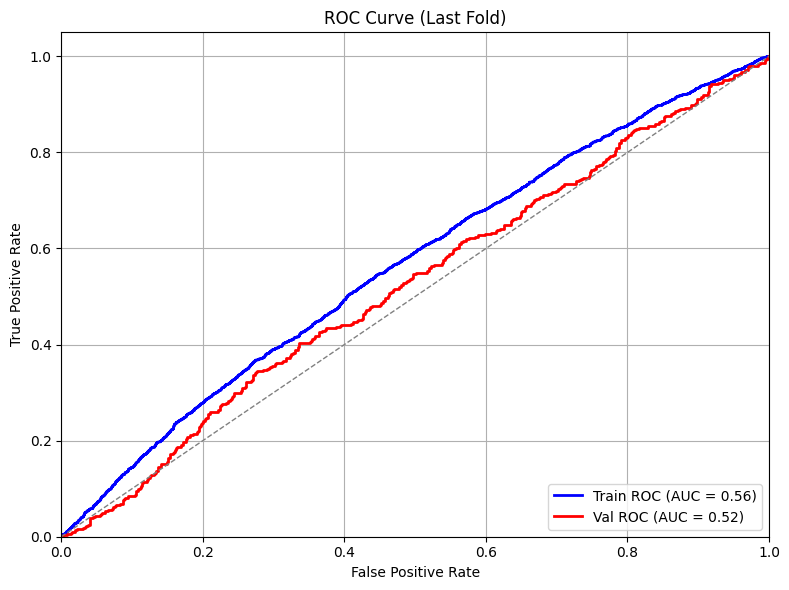

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.78%
Confusion Matrix (Total):
[[3776 1959]
 [3700 2301]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.52      0.63      0.57       647
          Up       0.54      0.43      0.48       657

    accuracy                           0.53      1304
   macro avg       0.53      0.53      0.52      1304
weighted avg       0.53      0.53      0.52      1304

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -574.648450
  Test samples: 13244
  Features used: 30
  Overall Accuracy: 0.5235 (52.35%)
  Weighted Accuracy: 0.5235 (52.35%)
  Rise Accuracy: 0.1986 (19.86%) - 6592 samples
  Fall Accuracy: 0.8455 (84.55%) - 6652 samples
  Precision: 0.5601
  Recall: 0.1986
  F1 Score: 0.2932
  Confusion Matrix (Fall/Rise):
    [[5624 1028]  # Predicted Fall
     [5283 1309]]  # Predicted Rise
     # Actual Fall  Actu

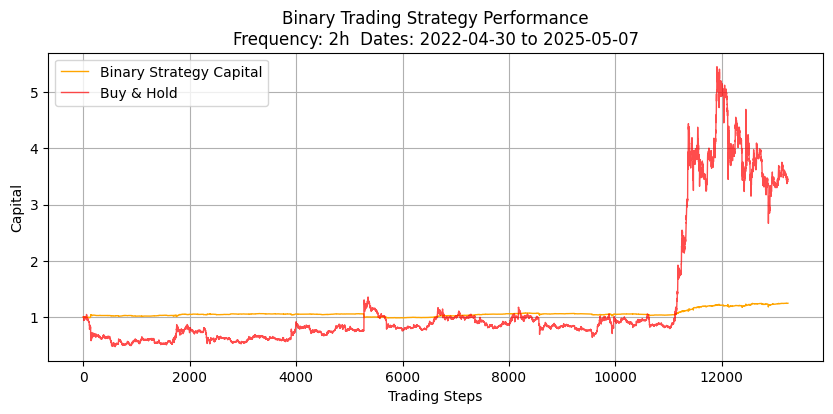

{'Total Return': 0.24746793402846667, 'Buy and Hold Return': 2.410390656463955, 'Hit Rate': 0.514195107218363, 'Sharpe Ratio': 1.0514047970363318, 'Number of Trades': 13244}
Hit Rate (Long/Price Rise): 51.99%
Hit Rate (Short/Price Fall): 50.55%
Number of Long Trades: 7970
Number of Short Trades: 5274
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


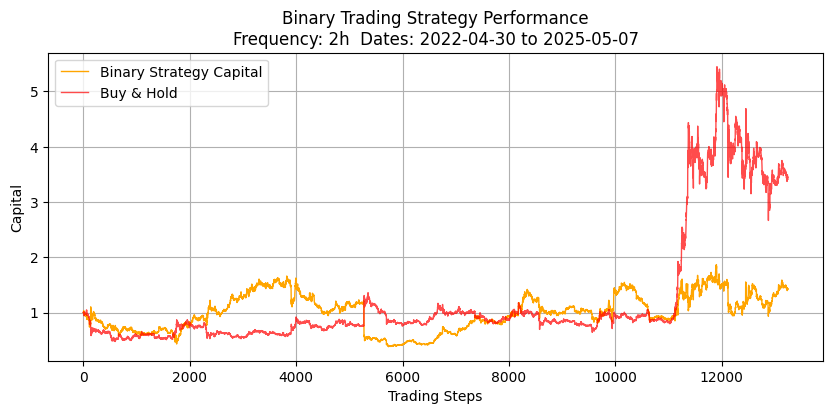

{'Total Return': 0.42199839983681575, 'Buy and Hold Return': 2.410390656463955, 'Hit Rate': 0.514195107218363, 'Sharpe Ratio': 0.14385043682667364, 'Number of Trades': 13244}
Hit Rate (Long/Price Rise): 51.99%
Hit Rate (Short/Price Fall): 50.55%
Number of Long Trades: 7970
Number of Short Trades: 5274
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


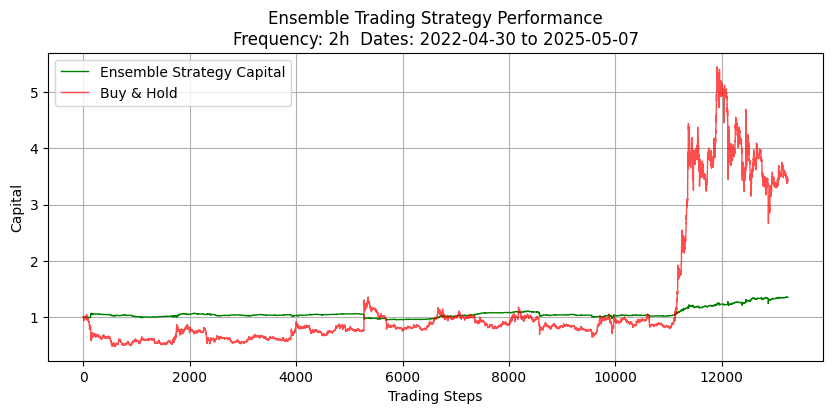

Ensemble Strategy Metrics: {'Total Return': 0.3528511689353724, 'Buy and Hold Return': 2.410390656463955, 'Hit Rate': 0.513354186717998, 'Sharpe Ratio': 0.8717236298542795, 'Number of Trades': 8312}
Hit Rate (Long/Price Rise): 52.52%
Hit Rate (Short/Price Fall): 48.89%
Number of Long Trades: 5598
Number of Short Trades: 2714
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


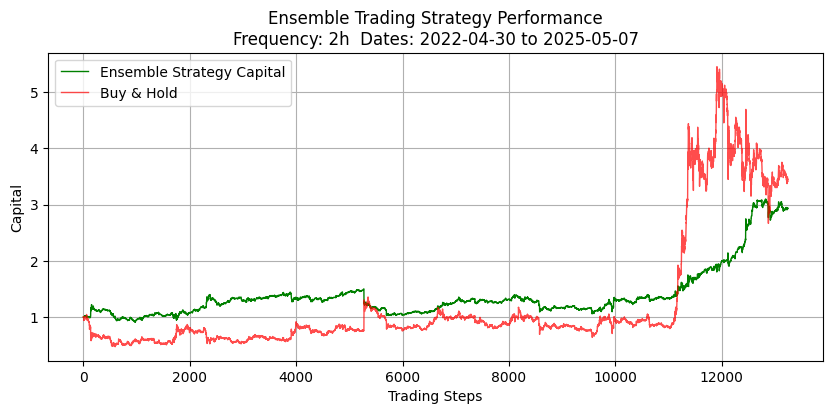

Ensemble Strategy Metrics: {'Total Return': 1.9296456309397918, 'Buy and Hold Return': 2.410390656463955, 'Hit Rate': 0.5264677574590952, 'Sharpe Ratio': 1.1875503642437066, 'Number of Trades': 8312}
Hit Rate (Long/Price Rise): 53.05%
Hit Rate (Short/Price Fall): 51.38%
Number of Long Trades: 6290
Number of Short Trades: 2022
Testing XRP with trading window 3
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0002915358034088006
Fraction positive: 0.5048125920054354
Fraction negative: 0.4938285584871476
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', '

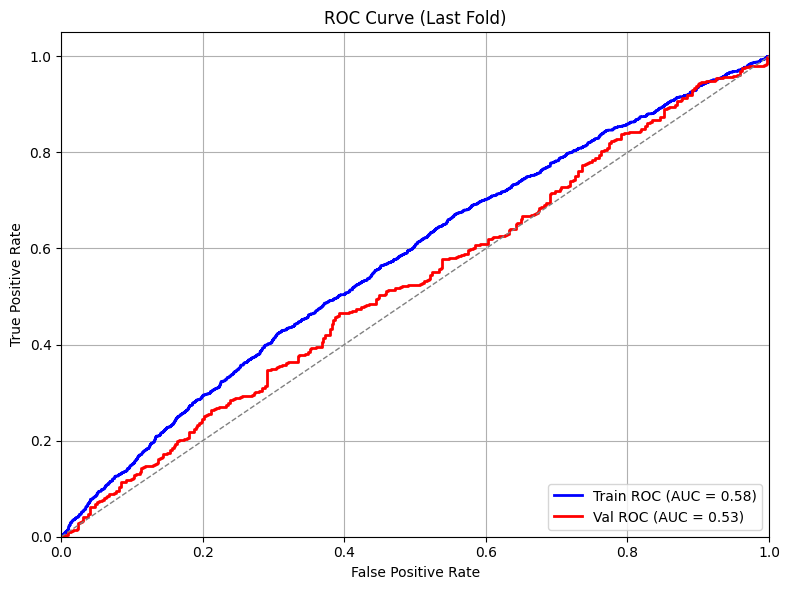

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 52.25%
Confusion Matrix (Total):
[[2658 1145]
 [2564 1400]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.49      0.36      0.41       416
          Up       0.52      0.65      0.58       447

    accuracy                           0.51       863
   macro avg       0.50      0.50      0.50       863
weighted avg       0.50      0.51      0.50       863

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -347.632383
  Test samples: 8827
  Features used: 30
  Overall Accuracy: 0.5132 (51.32%)
  Weighted Accuracy: 0.5132 (51.32%)
  Rise Accuracy: 0.6770 (67.70%) - 4374 samples
  Fall Accuracy: 0.3523 (35.23%) - 4453 samples
  Precision: 0.5066
  Recall: 0.6770
  F1 Score: 0.5795
  Confusion Matrix (Fall/Rise):
    [[1569 2884]  # Predicted Fall
     [1413 2961]]  # Predicted Rise
     # Actual Fall  Actua

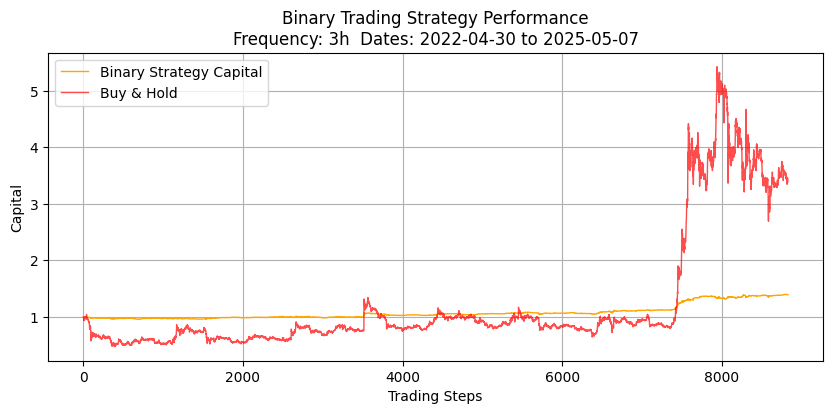

{'Total Return': 0.3927411413538544, 'Buy and Hold Return': 2.3880022455690106, 'Hit Rate': 0.509457469702118, 'Sharpe Ratio': 1.5400899890108368, 'Number of Trades': 8829}
Hit Rate (Long/Price Rise): 50.88%
Hit Rate (Short/Price Fall): 51.15%
Number of Long Trades: 6741
Number of Short Trades: 2088
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


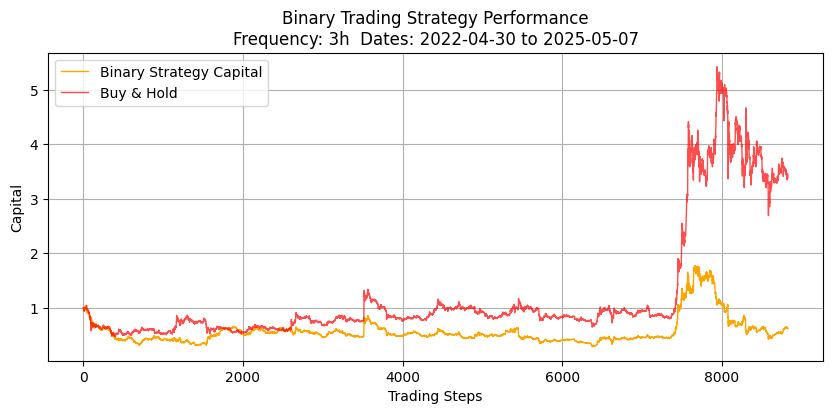

{'Total Return': -0.38012741371140624, 'Buy and Hold Return': 2.3880022455690106, 'Hit Rate': 0.509457469702118, 'Sharpe Ratio': -0.1950856604162457, 'Number of Trades': 8829}
Hit Rate (Long/Price Rise): 50.88%
Hit Rate (Short/Price Fall): 51.15%
Number of Long Trades: 6741
Number of Short Trades: 2088
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


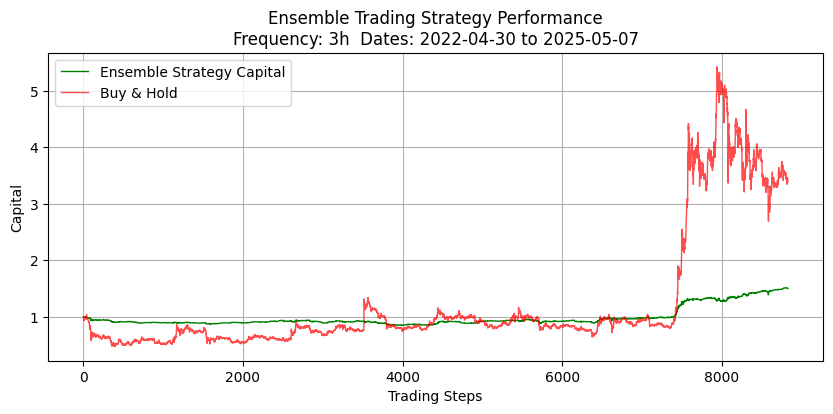

Ensemble Strategy Metrics: {'Total Return': 0.5027746680653924, 'Buy and Hold Return': 2.3880022455690106, 'Hit Rate': 0.5106352605281942, 'Sharpe Ratio': 1.277623430437715, 'Number of Trades': 7005}
Hit Rate (Long/Price Rise): 51.02%
Hit Rate (Short/Price Fall): 51.27%
Number of Long Trades: 5741
Number of Short Trades: 1264
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


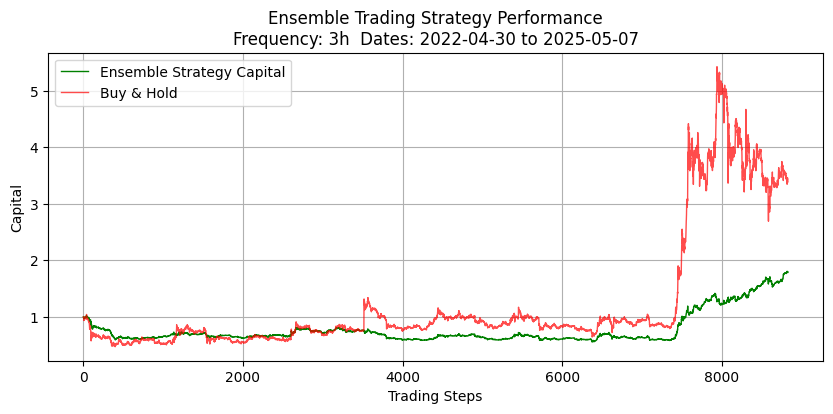

Ensemble Strategy Metrics: {'Total Return': 0.7947716281808475, 'Buy and Hold Return': 2.3880022455690106, 'Hit Rate': 0.5142041399000714, 'Sharpe Ratio': 0.8685390541124132, 'Number of Trades': 7005}
Hit Rate (Long/Price Rise): 51.10%
Hit Rate (Short/Price Fall): 54.27%
Number of Long Trades: 6290
Number of Short Trades: 715
Testing XRP with trading window 4
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.00038521925585080496
Fraction positive: 0.5046051638230409
Fraction negative: 0.494639891287936
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', '

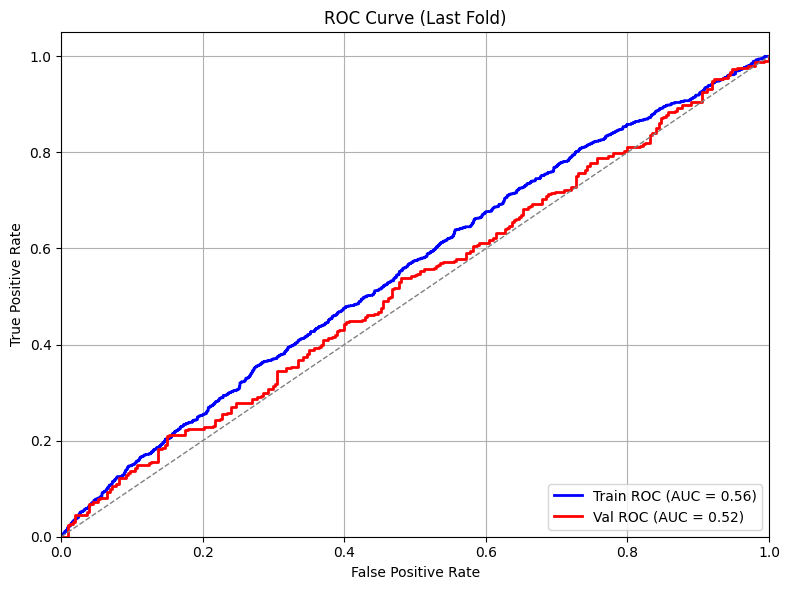

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.66%
Confusion Matrix (Total):
[[1616 1181]
 [1670 1311]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.49      0.21      0.30       308
          Up       0.52      0.80      0.63       334

    accuracy                           0.52       642
   macro avg       0.51      0.51      0.46       642
weighted avg       0.51      0.52      0.47       642

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -161.378317
  Test samples: 6619
  Features used: 30
  Overall Accuracy: 0.5075 (50.75%)
  Weighted Accuracy: 0.5075 (50.75%)
  Rise Accuracy: 0.5067 (50.67%) - 3264 samples
  Fall Accuracy: 0.5082 (50.82%) - 3355 samples
  Precision: 0.5006
  Recall: 0.5067
  F1 Score: 0.5037
  Confusion Matrix (Fall/Rise):
    [[1705 1650]  # Predicted Fall
     [1610 1654]]  # Predicted Rise
     # Actual Fall  Actua

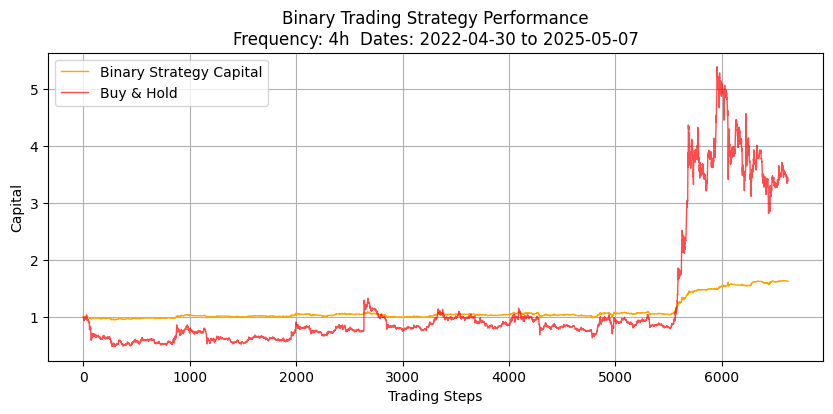

{'Total Return': 0.6283326730242131, 'Buy and Hold Return': 2.387253728962272, 'Hit Rate': 0.5005286210542215, 'Sharpe Ratio': 1.4553964645465942, 'Number of Trades': 6621}
Hit Rate (Long/Price Rise): 49.85%
Hit Rate (Short/Price Fall): 54.48%
Number of Long Trades: 6331
Number of Short Trades: 290
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


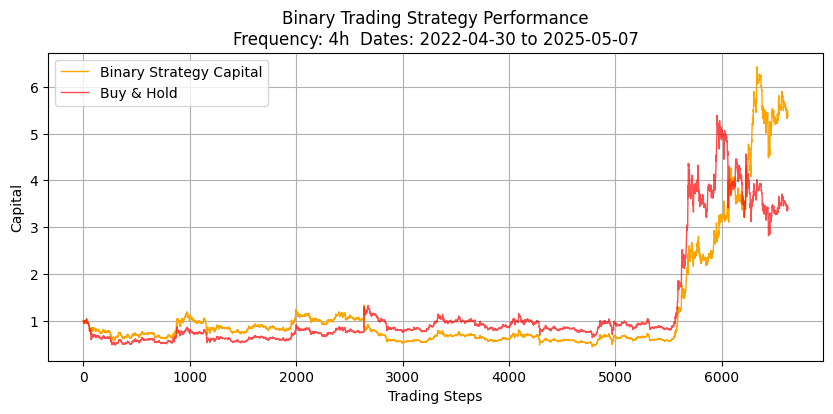

{'Total Return': 4.376551531571284, 'Buy and Hold Return': 2.387253728962272, 'Hit Rate': 0.5005286210542215, 'Sharpe Ratio': 0.885636146091165, 'Number of Trades': 6621}
Hit Rate (Long/Price Rise): 49.85%
Hit Rate (Short/Price Fall): 54.48%
Number of Long Trades: 6331
Number of Short Trades: 290
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


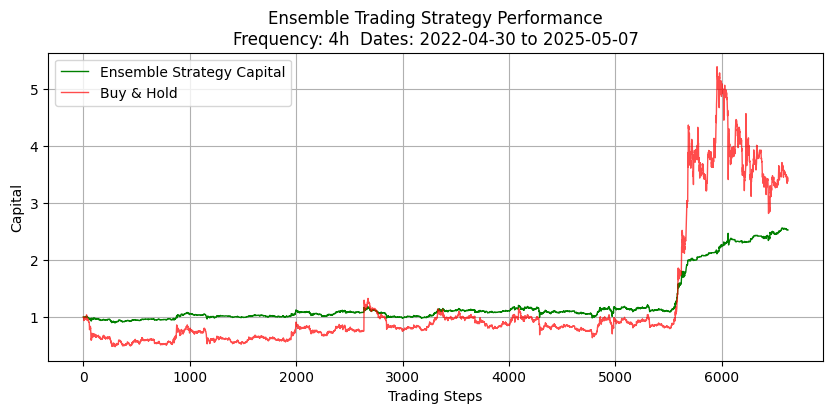

Ensemble Strategy Metrics: {'Total Return': 1.527393671917249, 'Buy and Hold Return': 2.387253728962272, 'Hit Rate': 0.5017805114923923, 'Sharpe Ratio': 1.586476925661374, 'Number of Trades': 6178}
Hit Rate (Long/Price Rise): 49.97%
Hit Rate (Short/Price Fall): 56.10%
Number of Long Trades: 5973
Number of Short Trades: 205
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


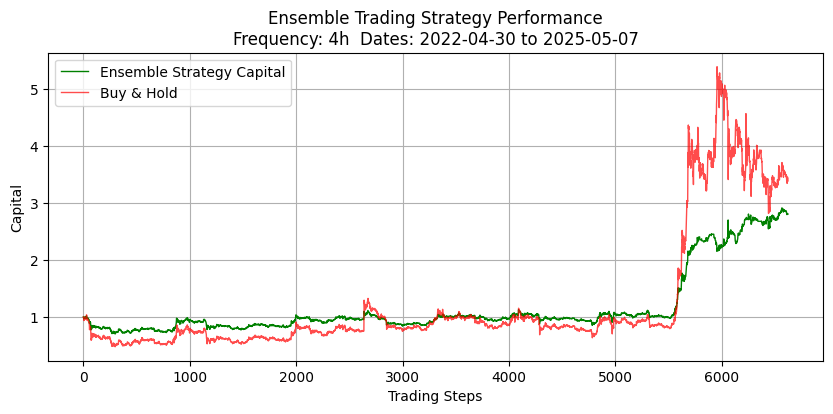

Ensemble Strategy Metrics: {'Total Return': 1.805083134826862, 'Buy and Hold Return': 2.387253728962272, 'Hit Rate': 0.5014567821301392, 'Sharpe Ratio': 1.1609494897021775, 'Number of Trades': 6178}
Hit Rate (Long/Price Rise): 49.96%
Hit Rate (Short/Price Fall): 54.62%
Number of Long Trades: 5929
Number of Short Trades: 249
Testing XRP with trading window 5
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0004973692594827972
Fraction positive: 0.4987733534629175
Fraction negative: 0.4991507831666352
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'ob

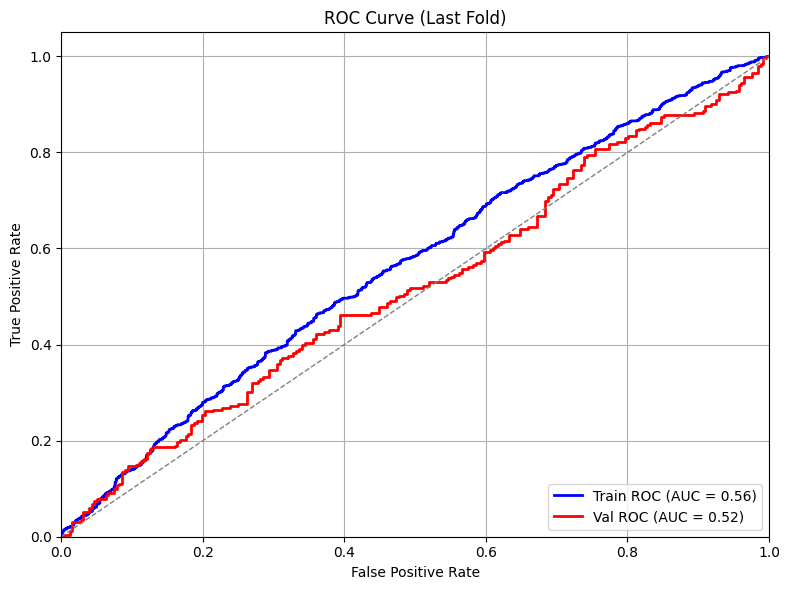

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.62%
Confusion Matrix (Total):
[[1902  392]
 [1870  417]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.51      0.82      0.63       256
          Up       0.53      0.21      0.31       253

    accuracy                           0.52       509
   macro avg       0.52      0.51      0.47       509
weighted avg       0.52      0.52      0.47       509

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -92.164922
  Test samples: 5293
  Features used: 30
  Overall Accuracy: 0.5292 (52.92%)
  Weighted Accuracy: 0.5292 (52.92%)
  Rise Accuracy: 0.1907 (19.07%) - 2591 samples
  Fall Accuracy: 0.8538 (85.38%) - 2702 samples
  Precision: 0.5557
  Recall: 0.1907
  F1 Score: 0.2839
  Confusion Matrix (Fall/Rise):
    [[2307  395]  # Predicted Fall
     [2097  494]]  # Predicted Rise
     # Actual Fall  Actual

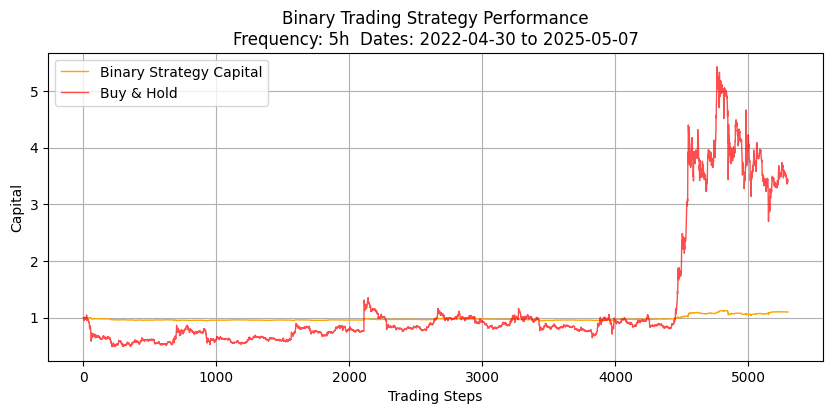

{'Total Return': 0.0970601397516564, 'Buy and Hold Return': 2.394172887069588, 'Hit Rate': 0.49915046252595807, 'Sharpe Ratio': 0.5243223566463493, 'Number of Trades': 5297}
Hit Rate (Long/Price Rise): 49.60%
Hit Rate (Short/Price Fall): 50.52%
Number of Long Trades: 3458
Number of Short Trades: 1839
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


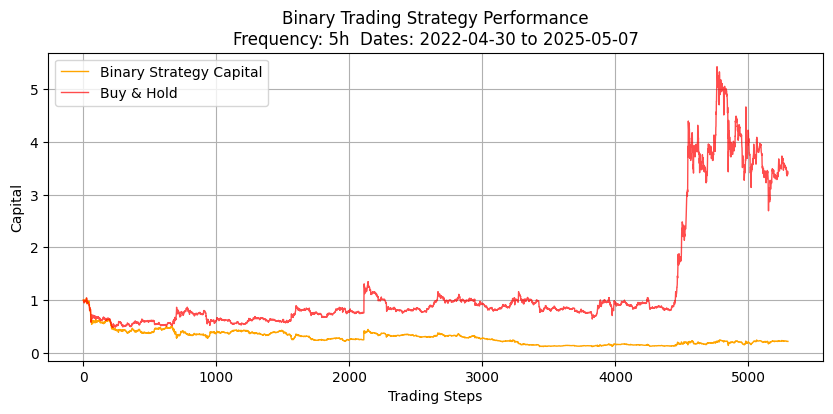

{'Total Return': -0.7816982545372473, 'Buy and Hold Return': 2.394172887069588, 'Hit Rate': 0.49915046252595807, 'Sharpe Ratio': -0.9453392716794295, 'Number of Trades': 5297}
Hit Rate (Long/Price Rise): 49.60%
Hit Rate (Short/Price Fall): 50.52%
Number of Long Trades: 3458
Number of Short Trades: 1839
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


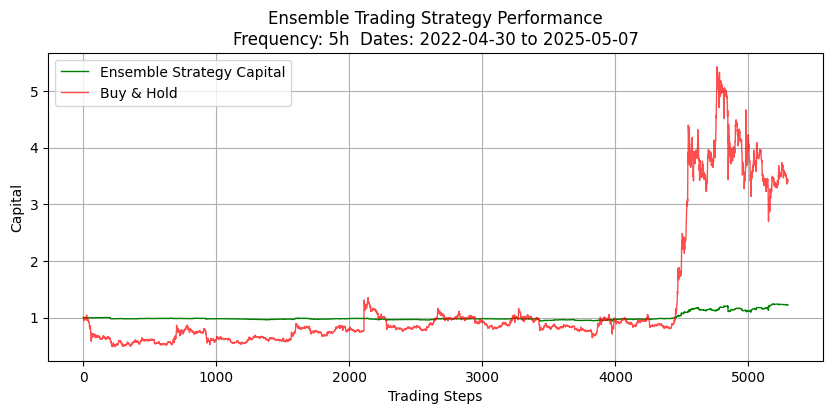

Ensemble Strategy Metrics: {'Total Return': 0.222244952607199, 'Buy and Hold Return': 2.394172887069588, 'Hit Rate': 0.4983742240614839, 'Sharpe Ratio': 0.6803844925625403, 'Number of Trades': 3383}
Hit Rate (Long/Price Rise): 50.21%
Hit Rate (Short/Price Fall): 48.47%
Number of Long Trades: 2665
Number of Short Trades: 718
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


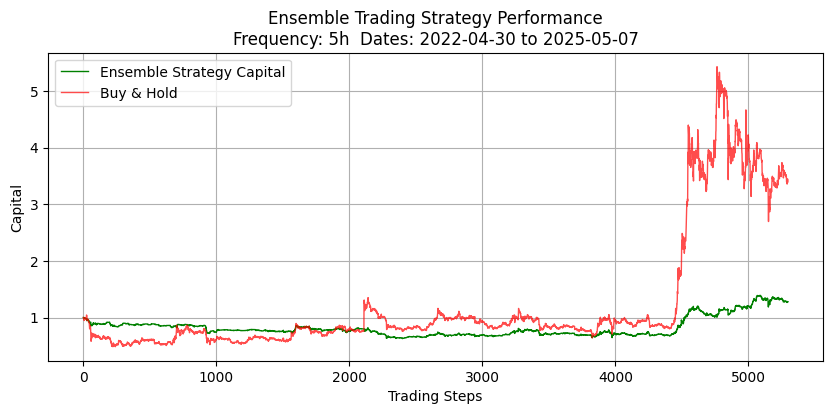

Ensemble Strategy Metrics: {'Total Return': 0.2766398189670427, 'Buy and Hold Return': 2.394172887069588, 'Hit Rate': 0.50872007094295, 'Sharpe Ratio': 0.33814171762107453, 'Number of Trades': 3383}
Hit Rate (Long/Price Rise): 50.65%
Hit Rate (Short/Price Fall): 58.89%
Number of Long Trades: 3293
Number of Short Trades: 90
Testing XRP with trading window 6
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing BALANCED LOGISTIC REGRESSION ===
Mean target_return: 0.0005810148169280251
Fraction positive: 0.5040760869565217
Fraction negative: 0.4952445652173913
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv

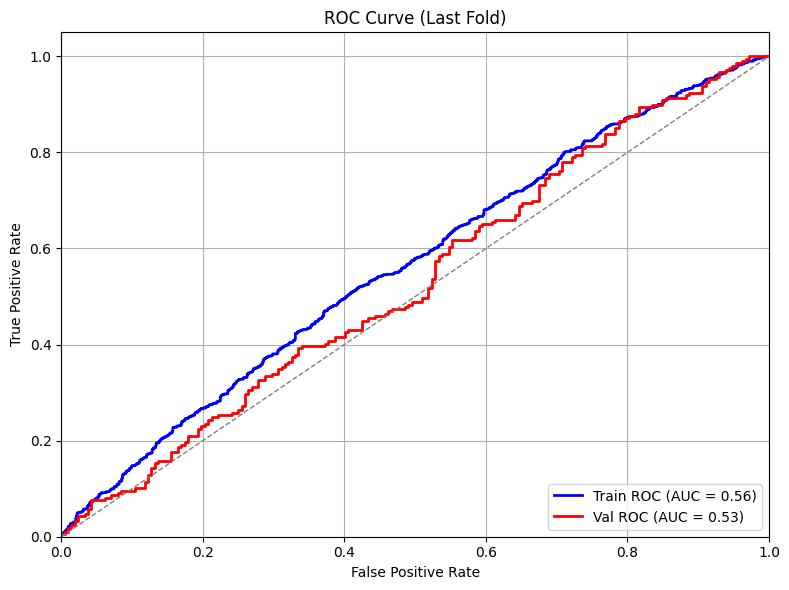

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 49.62%
Confusion Matrix (Total):
[[1211  663]
 [1246  669]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.54      0.33      0.41       212
          Up       0.51      0.72      0.60       209

    accuracy                           0.52       421
   macro avg       0.53      0.52      0.50       421
weighted avg       0.53      0.52      0.50       421

Testing balanced logistic regression on test set...
Test Model Results:
  R² Score: -66.837310
  Test samples: 4409
  Features used: 30
  Overall Accuracy: 0.5457 (54.57%)
  Weighted Accuracy: 0.5457 (54.57%)
  Rise Accuracy: 0.2873 (28.73%) - 2158 samples
  Fall Accuracy: 0.7934 (79.34%) - 2251 samples
  Precision: 0.5714
  Recall: 0.2873
  F1 Score: 0.3824
  Confusion Matrix (Fall/Rise):
    [[1786  465]  # Predicted Fall
     [1538  620]]  # Predicted Rise
     # Actual Fall  Actual

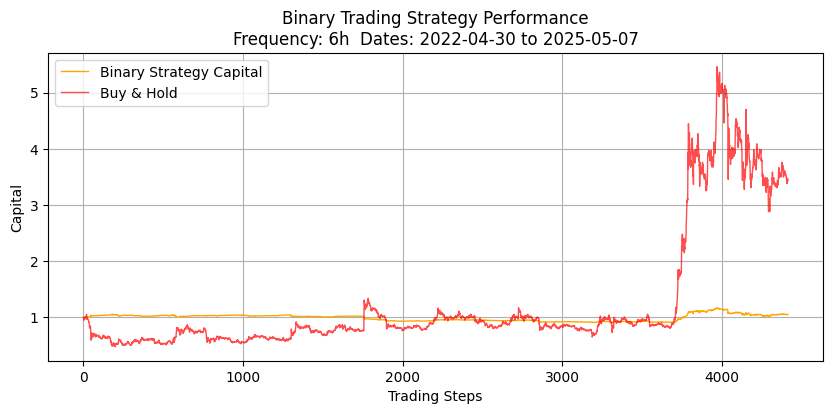

{'Total Return': 0.048996709153545925, 'Buy and Hold Return': 2.4288251917642314, 'Hit Rate': 0.5006796556411418, 'Sharpe Ratio': 0.17274082595101478, 'Number of Trades': 4414}
Hit Rate (Long/Price Rise): 50.52%
Hit Rate (Short/Price Fall): 49.13%
Number of Long Trades: 2971
Number of Short Trades: 1443
Binary-only trading simulation (aggressive)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Binary plot saved as: images/binary_trading_simulation_13072025.png


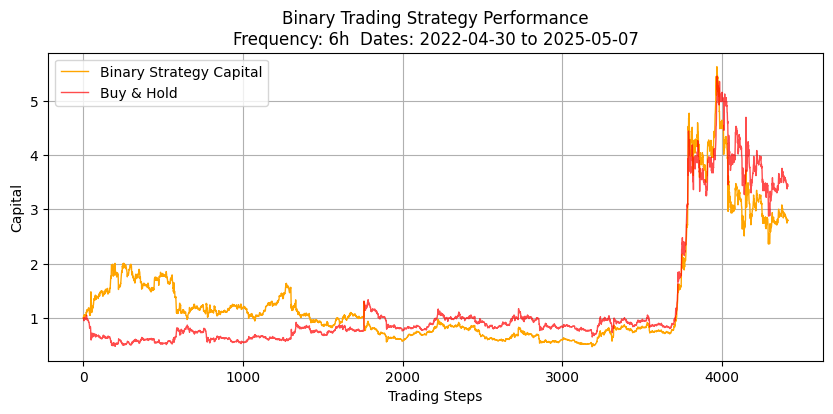

{'Total Return': 1.7951746516121165, 'Buy and Hold Return': 2.4288251917642314, 'Hit Rate': 0.5006796556411418, 'Sharpe Ratio': 0.33455272189948, 'Number of Trades': 4414}
Hit Rate (Long/Price Rise): 50.52%
Hit Rate (Short/Price Fall): 49.13%
Number of Long Trades: 2971
Number of Short Trades: 1443
Ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


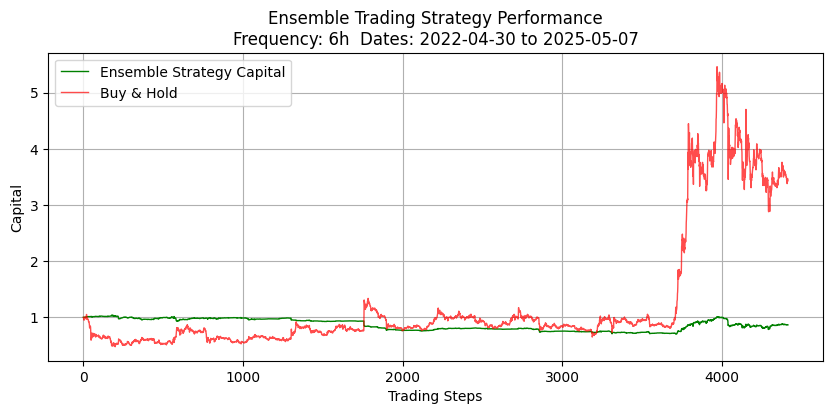

Ensemble Strategy Metrics: {'Total Return': -0.1344016614892911, 'Buy and Hold Return': 2.4288251917642314, 'Hit Rate': 0.48995739500912966, 'Sharpe Ratio': -0.3070311105249229, 'Number of Trades': 3286}
Hit Rate (Long/Price Rise): 49.33%
Hit Rate (Short/Price Fall): 48.40%
Number of Long Trades: 2098
Number of Short Trades: 1188
Aggressive ensemble trading simulation (linear + balanced binary)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


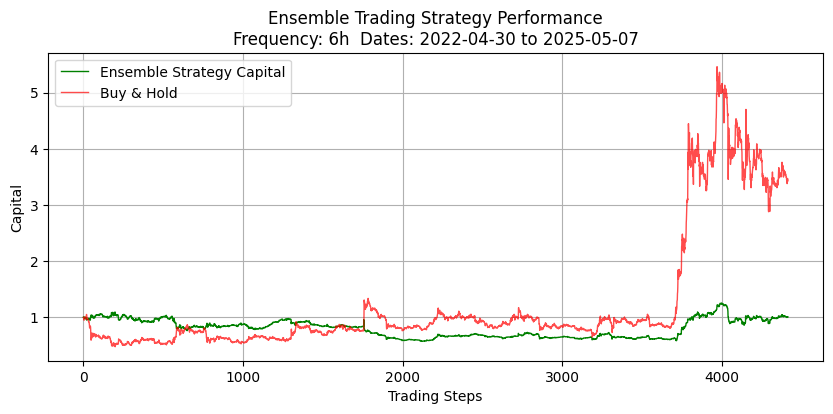

Ensemble Strategy Metrics: {'Total Return': 0.0054915357469118575, 'Buy and Hold Return': 2.4288251917642314, 'Hit Rate': 0.4917833231892879, 'Sharpe Ratio': 0.005711372570444789, 'Number of Trades': 3286}
Hit Rate (Long/Price Rise): 49.50%
Hit Rate (Short/Price Fall): 48.68%
Number of Long Trades: 1994
Number of Short Trades: 1292
Balanced logistic regression testing complete!


In [7]:
import os
import pandas as pd
import numpy as np
from regression import run_indicators, test_model
from trading import simulate_trading, simulate_trading_ensemble, simulate_trading_binary
import importlib

indicator_module = importlib.import_module('indicators')

original_columns = [
    'bam_vwa', 'bam_open', 'bam_close',
    'bam_high', 'bam_low', 'bam_volatility_1m_return', 'base_volume',
    'pct_buy_volume', 'annual_interest_rate', 'spread_1m_vwa_vwa',
    'spread_twa'
]
symbols = ['BNB', 'BTC', 'ETH', 'TRX', 'XRP']

for symbol in symbols:
    for trading_window in range(2, 7):
        print(f"Testing {symbol} with trading window {trading_window}")
        try:
            df = pd.read_csv(f'indicator_results_{symbol}.csv')
            df1 = df[df['window'] == trading_window]

            selected_indicators = df1[df1['weighted_win'] > 0.50]['indicator'].unique()
            if len(selected_indicators) == 0:

                print(f"No indicators with win rate > 50% for {symbol} - {trading_window}h window")
                continue
            print(f"Selected indicators: {selected_indicators}")

            df_symbol = pd.read_csv(f'{symbol}_spot_full.csv')
            half = len(df_symbol) // 2
            df_train = df_symbol.iloc[:half]
            
            # Get start time for testing (second half of data)

            start_time = df_symbol.iloc[half]['close_time']
            
            print(f"Training on: {df_train.iloc[0]['close_time']} to {df_train.iloc[-1]['close_time']}")
            print(f"Testing on: {start_time} to {df_symbol.iloc[-1]['close_time']}")

            print(f"\n=== Testing BALANCED LOGISTIC REGRESSION ===")
            try:
                # Test with balanced class weights
                linear, binary, scaler = run_indicators(df_train, selected_indicators.tolist() + original_columns, 

                                               time_window=trading_window, quantile=False, obj=None)
                
                if linear is not None and binary is not None and scaler is not None:
                    print(f"Testing balanced logistic regression on test set...")
                    r2_binary = test_model(df_symbol, binary, selected_indicators.tolist(), original_columns, 
                                         target_col='bam_close', time_window=trading_window, start_time=start_time, scaler=scaler)
                    
                    print(f"Binary-only trading simulation (balanced model)")
                    simulate_trading_binary(df_symbol, binary, selected_indicators.tolist() + original_columns,
                                         start_time=start_time,
                                         trading_window=trading_window, plot=True, strategy='prob', scaler=scaler)
 
                   
                    print(f"Binary-only trading simulation (aggressive)")
                    simulate_trading_binary(df_symbol, binary, selected_indicators.tolist() + original_columns,
                                         start_time=start_time,
                                         trading_window=trading_window, plot=True, strategy='aggressive', scaler=scaler)
                    
                    print(f"Ensemble trading simulation (linear + balanced binary)")
                    simulate_trading_ensemble(df_symbol, linear, binary, selected_indicators.tolist() + original_columns,
                                           start_time=start_time,
                                           trading_window=trading_window, plot=True, strategy='proba_ensemble', scaler=scaler)
                    
                    print(f"Aggressive ensemble trading simulation (linear + balanced binary)")
                    simulate_trading_ensemble(df_symbol, linear, binary, selected_indicators.tolist() + original_columns,
                                           start_time=start_time,
                                           trading_window=trading_window, plot=True, strategy='aggressive_ensemble', scaler=scaler)
                else:
                    print(f"Failed to create balanced logistic regression model")
                    
            except Exception as e:
                print(f"Error with balanced logistic regression: {str(e)}")
                continue
                    
        except Exception as e:
            print(f"Error processing {symbol} - {trading_window}h: {str(e)}")
            continue

print("Balanced logistic regression testing complete!")


Testing BNB with trading window 2
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0003280677367073612
Fraction positive: 0.5070209874679148
Fraction negative: 0.49056318888721123
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14', 'stochastic_oscillator_14_0', 'stochastic_oscillator_14_1', 'ichimoku_cloud_9_26_52_0', 'ichimoku_cloud_9_26_52_1', 'ichimoku_cloud_9_26_52_2', 'ichimoku_cloud_9_26_52_3', 'vwap', 'atr', 'bam_vwa', 'bam_open', 'bam_close', 'bam_high', 'bam_low', 'bam_volatility_1m_return', 'base_volu

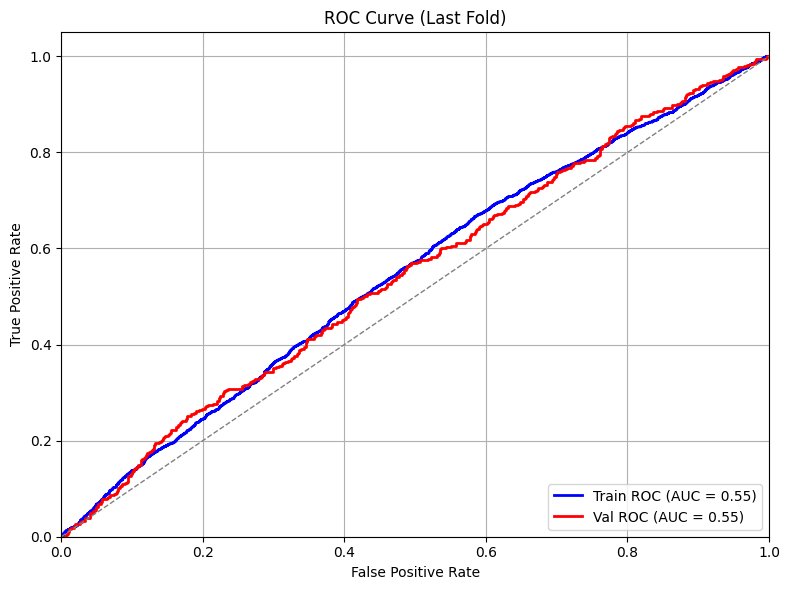

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.74%
Confusion Matrix (Total):
[[3479 2223]
 [3558 2476]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.52      0.69      0.59       649
          Up       0.54      0.36      0.43       655

    accuracy                           0.52      1304
   macro avg       0.53      0.52      0.51      1304
weighted avg       0.53      0.52      0.51      1304

Testing linear model on test set...
Test Model Results:
  R² Score: -0.008436
  Test samples: 13244
  Features used: 31
  Overall Accuracy: 0.5073 (50.73%)
  Weighted Accuracy: 0.5073 (50.73%)
  Rise Accuracy: 0.7430 (74.30%) - 6712 samples
  Fall Accuracy: 0.2652 (26.52%) - 6532 samples
  Precision: 0.5096
  Recall: 0.7430
  F1 Score: 0.6045
  Confusion Matrix (Fall/Rise):
    [[1732 4800]  # Predicted Fall
     [1725 4987]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive

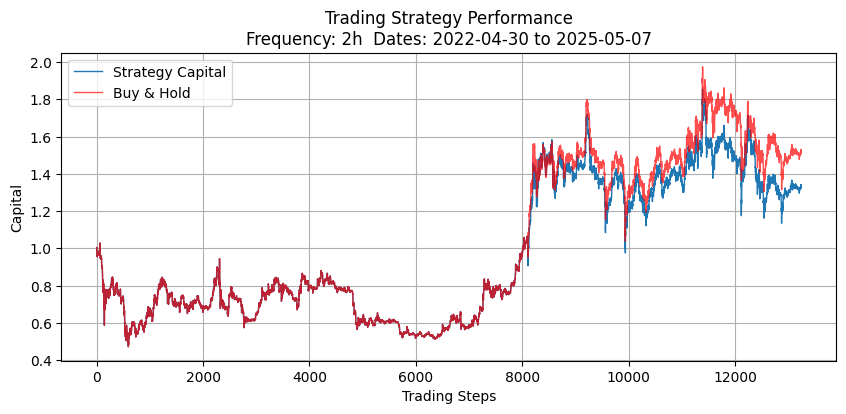

{'Total Return': 0.3297191894651734, 'Buy and Hold Return': 0.5084476897897519, 'Hit Rate': 0.5031712473572939, 'Sharpe Ratio': 0.1719043134449785, 'Number of Trades': 13244}
Hit Rate (Long/Price Rise): 50.35%
Hit Rate (Short/Price Fall): 40.91%
Number of Long Trades: 13200
Number of Short Trades: 44
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


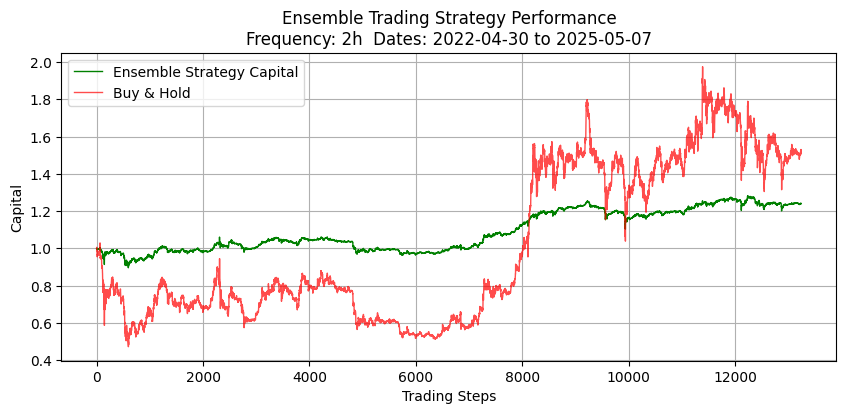

Ensemble Strategy Metrics: {'Total Return': 0.2404490465986937, 'Buy and Hold Return': 0.5084476897897519, 'Hit Rate': 0.5031117182756527, 'Sharpe Ratio': 0.6261253347226046, 'Number of Trades': 13176}
Hit Rate (Long/Price Rise): 50.34%
Hit Rate (Short/Price Fall): 26.67%
Number of Long Trades: 13161
Number of Short Trades: 15
Testing BNB with trading window 3
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0004930882800885277
Fraction positive: 0.5191937492922659
Fraction negative: 0.4794474012003171
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0',

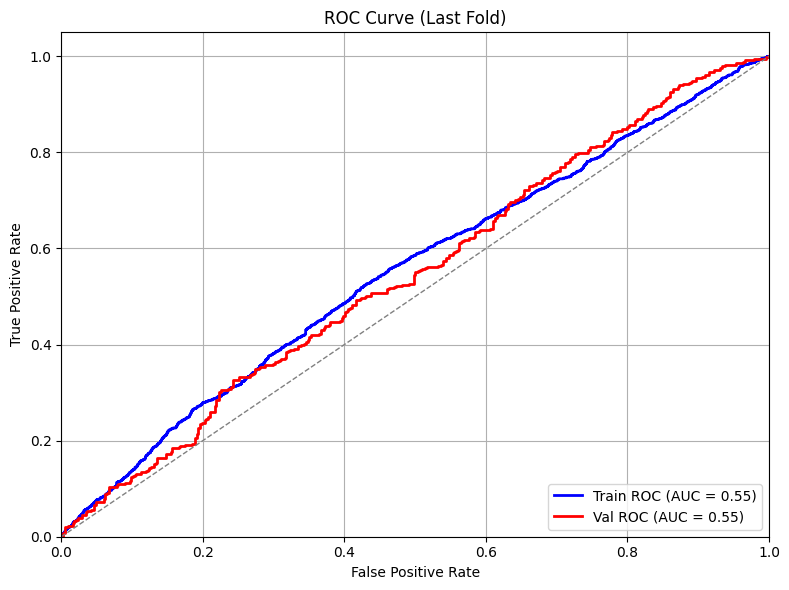

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.27%
Confusion Matrix (Total):
[[2115 1568]
 [2217 1867]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.53      0.60      0.56       434
          Up       0.53      0.47      0.50       429

    accuracy                           0.53       863
   macro avg       0.53      0.53      0.53       863
weighted avg       0.53      0.53      0.53       863

Testing linear model on test set...
Test Model Results:
  R² Score: -0.026532
  Test samples: 8827
  Features used: 31
  Overall Accuracy: 0.5045 (50.45%)
  Weighted Accuracy: 0.5045 (50.45%)
  Rise Accuracy: 0.8355 (83.55%) - 4481 samples
  Fall Accuracy: 0.1631 (16.31%) - 4346 samples
  Precision: 0.5072
  Recall: 0.8355
  F1 Score: 0.6313
  Confusion Matrix (Fall/Rise):
    [[ 709 3637]  # Predicted Fall
     [ 737 3744]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive 

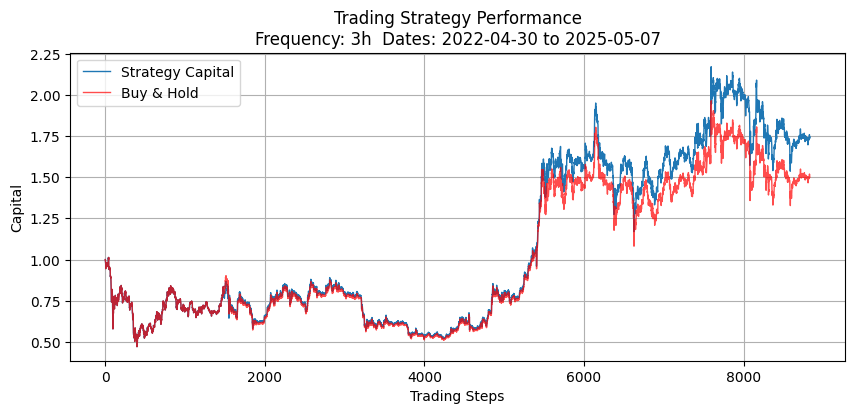

{'Total Return': 0.7453205156279397, 'Buy and Hold Return': 0.5007766503820619, 'Hit Rate': 0.5076452599388379, 'Sharpe Ratio': 0.34553028632560395, 'Number of Trades': 8829}
Hit Rate (Long/Price Rise): 50.74%
Hit Rate (Short/Price Fall): 77.78%
Number of Long Trades: 8820
Number of Short Trades: 9
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


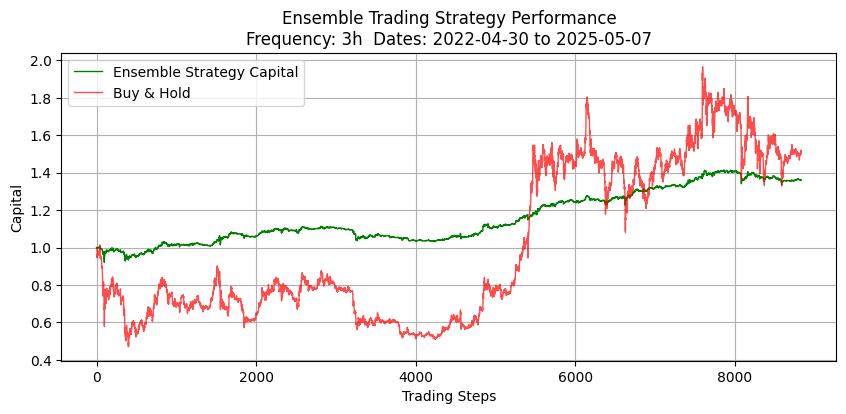

Ensemble Strategy Metrics: {'Total Return': 0.36018773096219214, 'Buy and Hold Return': 0.5007766503820619, 'Hit Rate': 0.5112091581206774, 'Sharpe Ratio': 1.1120199785461593, 'Number of Trades': 8386}
Hit Rate (Long/Price Rise): 51.09%
Hit Rate (Short/Price Fall): 51.90%
Number of Long Trades: 8018
Number of Short Trades: 368
Testing BNB with trading window 4
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0006578248991478246
Fraction positive: 0.517288237958629
Fraction negative: 0.4805979163521063
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 

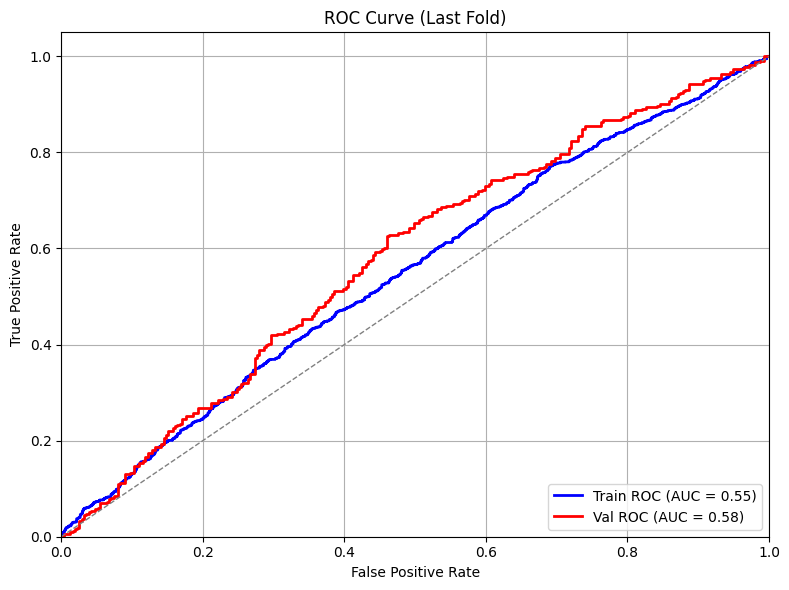

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.11%
Confusion Matrix (Total):
[[1711 1056]
 [1769 1242]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.55      0.58      0.56       311
          Up       0.58      0.56      0.57       331

    accuracy                           0.57       642
   macro avg       0.57      0.57      0.57       642
weighted avg       0.57      0.57      0.57       642

Testing linear model on test set...
Test Model Results:
  R² Score: -0.035114
  Test samples: 6619
  Features used: 31
  Overall Accuracy: 0.5137 (51.37%)
  Weighted Accuracy: 0.5137 (51.37%)
  Rise Accuracy: 0.9057 (90.57%) - 3297 samples
  Fall Accuracy: 0.1246 (12.46%) - 3322 samples
  Precision: 0.5066
  Recall: 0.9057
  F1 Score: 0.6498
  Confusion Matrix (Fall/Rise):
    [[ 414 2908]  # Predicted Fall
     [ 311 2986]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive 

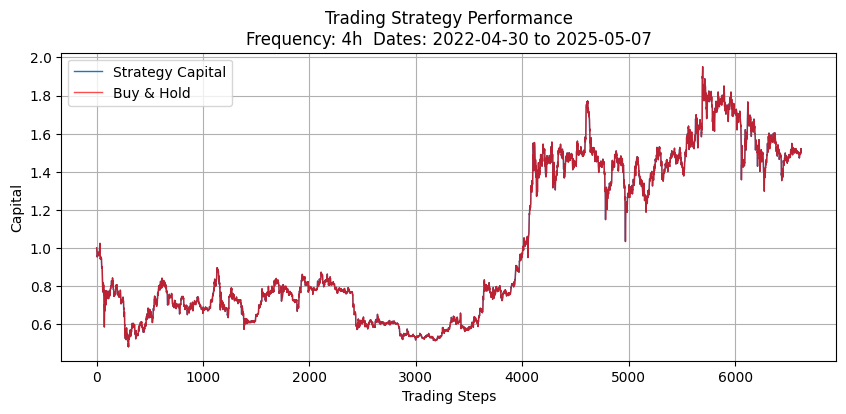

{'Total Return': 0.49938681016143294, 'Buy and Hold Return': 0.5019647102990865, 'Hit Rate': 0.511554145899411, 'Sharpe Ratio': 0.2553163773739909, 'Number of Trades': 6621}
Hit Rate (Long/Price Rise): 51.16%
Hit Rate (Short/Price Fall): nan%
Number of Long Trades: 6621
Number of Short Trades: 0
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


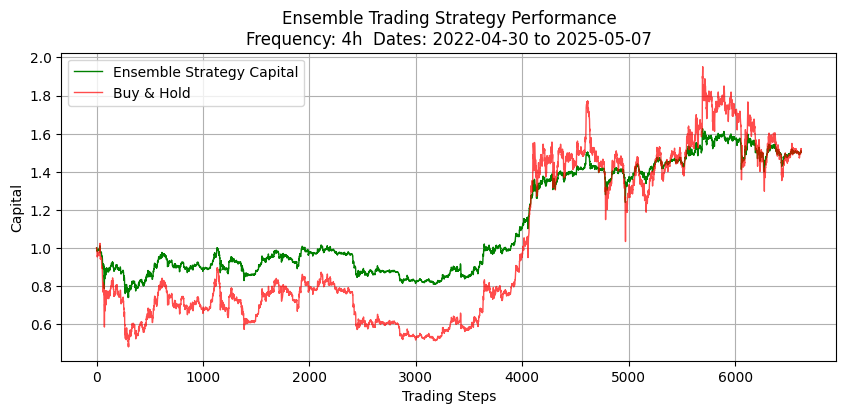

Ensemble Strategy Metrics: {'Total Return': 0.5013675843064909, 'Buy and Hold Return': 0.5019647102990865, 'Hit Rate': 0.5114803625377643, 'Sharpe Ratio': 0.5646382485371696, 'Number of Trades': 6620}
Hit Rate (Long/Price Rise): 51.16%
Hit Rate (Short/Price Fall): 0.00%
Number of Long Trades: 6619
Number of Short Trades: 1
Testing BNB with trading window 5
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0008424340796365307
Fraction positive: 0.5114172485374598
Fraction negative: 0.48650688809209286
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'b

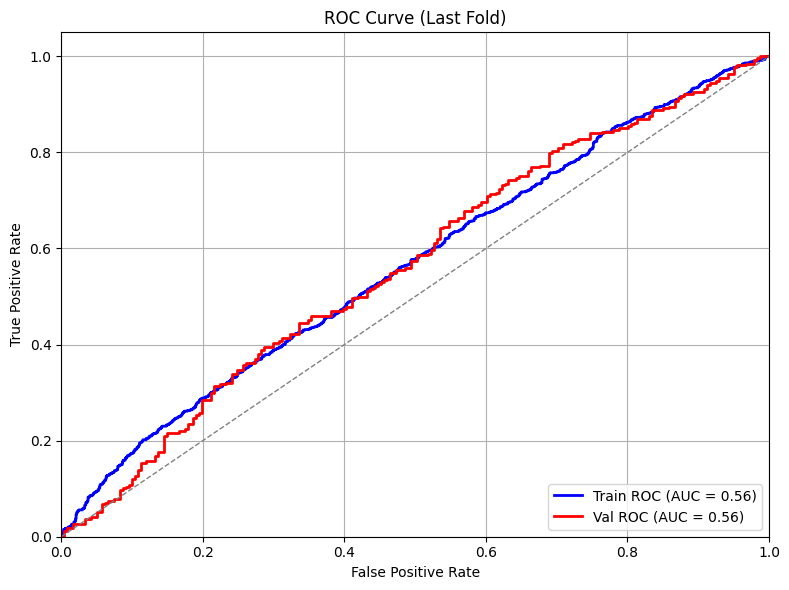

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 49.84%
Confusion Matrix (Total):
[[1641  573]
 [1725  642]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.48      0.86      0.62       241
          Up       0.58      0.18      0.27       268

    accuracy                           0.50       509
   macro avg       0.53      0.52      0.44       509
weighted avg       0.53      0.50      0.43       509

Testing linear model on test set...
Test Model Results:
  R² Score: -0.045109
  Test samples: 5293
  Features used: 31
  Overall Accuracy: 0.5063 (50.63%)
  Weighted Accuracy: 0.5063 (50.63%)
  Rise Accuracy: 0.9126 (91.26%) - 2655 samples
  Fall Accuracy: 0.0974 (9.74%) - 2638 samples
  Precision: 0.5044
  Recall: 0.9126
  F1 Score: 0.6497
  Confusion Matrix (Fall/Rise):
    [[ 257 2381]  # Predicted Fall
     [ 232 2423]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive s

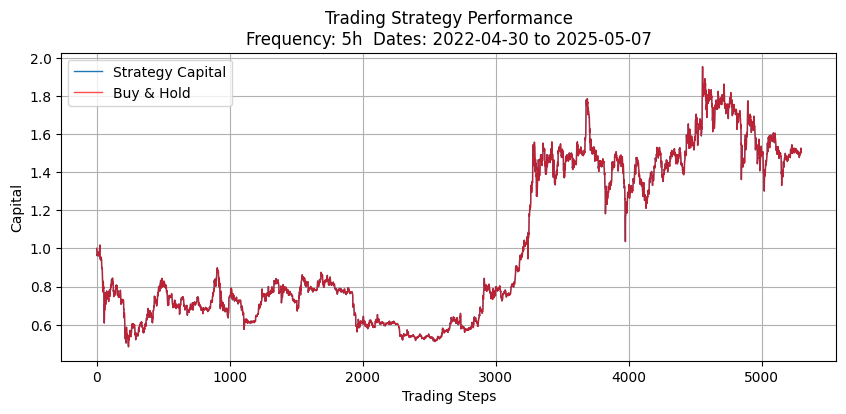

{'Total Return': 0.5110957700514587, 'Buy and Hold Return': 0.5039412576879628, 'Hit Rate': 0.5038701151595243, 'Sharpe Ratio': 0.2643718201511545, 'Number of Trades': 5297}
Hit Rate (Long/Price Rise): 50.39%
Hit Rate (Short/Price Fall): nan%
Number of Long Trades: 5297
Number of Short Trades: 0
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


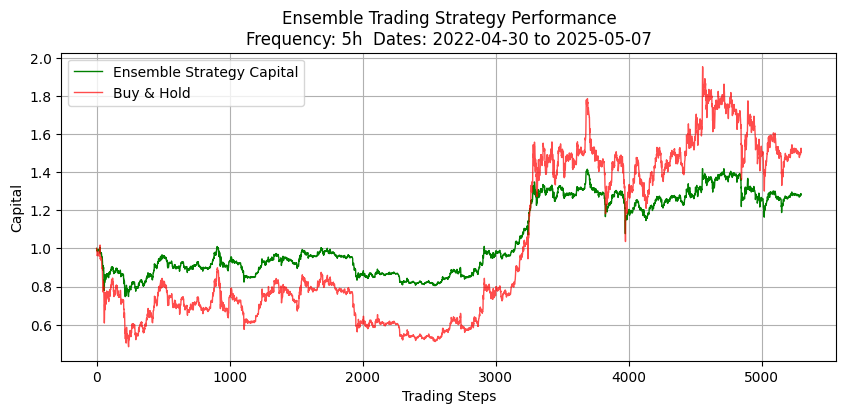

Ensemble Strategy Metrics: {'Total Return': 0.2825021386772115, 'Buy and Hold Return': 0.5039412576879628, 'Hit Rate': 0.5035876132930514, 'Sharpe Ratio': 0.32866921815168504, 'Number of Trades': 5296}
Hit Rate (Long/Price Rise): 50.37%
Hit Rate (Short/Price Fall): 0.00%
Number of Long Trades: 5295
Number of Short Trades: 1
Testing BNB with trading window 6
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0009850774318593382
Fraction positive: 0.5253623188405797
Fraction negative: 0.4725996376811594
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'b

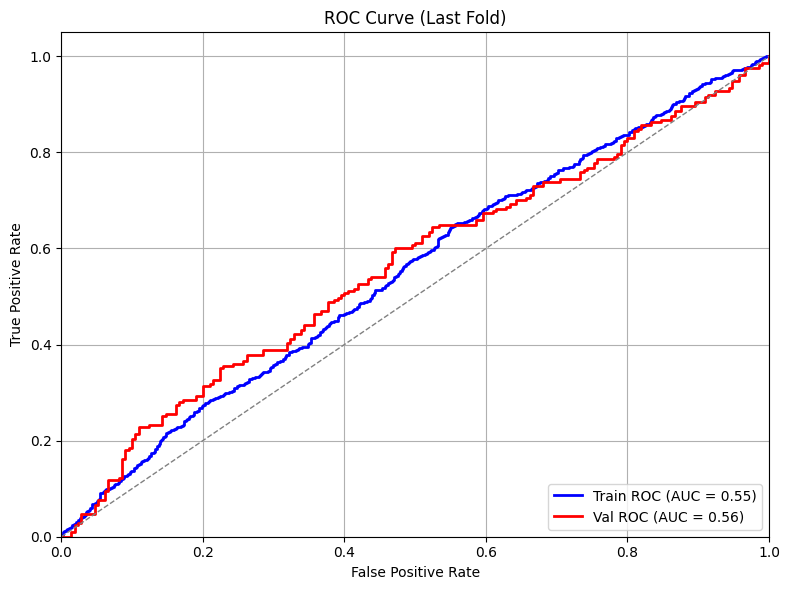

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.22%
Confusion Matrix (Total):
[[1131  642]
 [1244  772]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.52      0.90      0.66       210
          Up       0.65      0.18      0.29       211

    accuracy                           0.54       421
   macro avg       0.59      0.54      0.47       421
weighted avg       0.59      0.54      0.47       421

Testing linear model on test set...
Test Model Results:
  R² Score: -0.081130
  Test samples: 4409
  Features used: 31
  Overall Accuracy: 0.5280 (52.80%)
  Weighted Accuracy: 0.5280 (52.80%)
  Rise Accuracy: 0.9098 (90.98%) - 2239 samples
  Fall Accuracy: 0.1341 (13.41%) - 2170 samples
  Precision: 0.5202
  Recall: 0.9098
  F1 Score: 0.6619
  Confusion Matrix (Fall/Rise):
    [[ 291 1879]  # Predicted Fall
     [ 202 2037]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive 

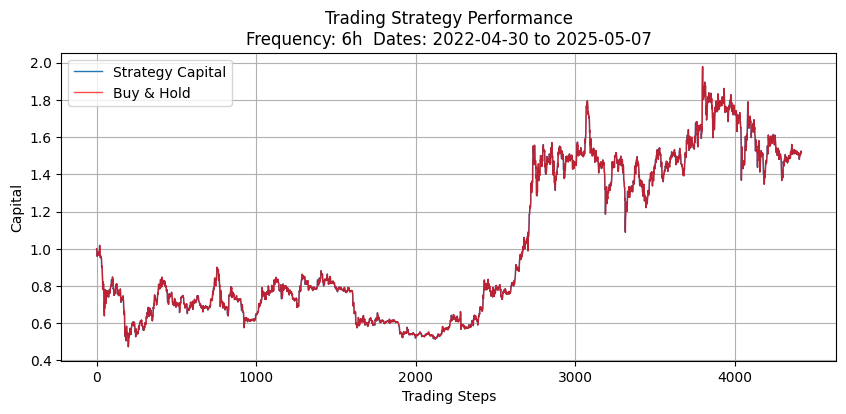

{'Total Return': 0.5179548606733155, 'Buy and Hold Return': 0.5133274492497794, 'Hit Rate': 0.5054372451291346, 'Sharpe Ratio': 0.2690681137746403, 'Number of Trades': 4414}
Hit Rate (Long/Price Rise): 50.54%
Hit Rate (Short/Price Fall): nan%
Number of Long Trades: 4414
Number of Short Trades: 0
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


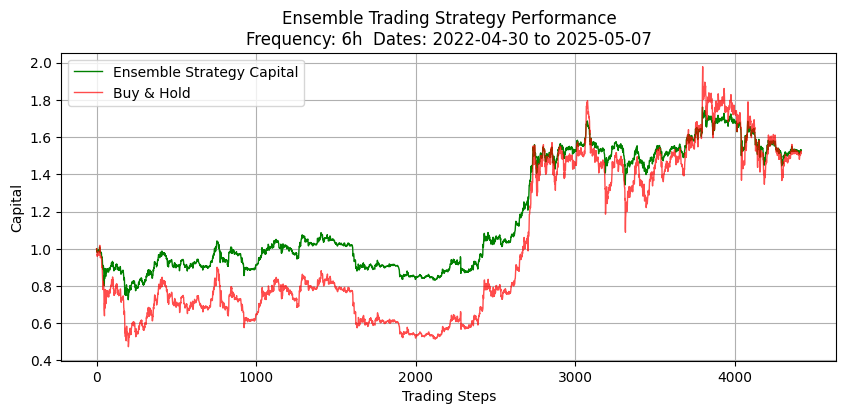

Ensemble Strategy Metrics: {'Total Return': 0.5287492230279665, 'Buy and Hold Return': 0.5133274492497794, 'Hit Rate': 0.5056663644605621, 'Sharpe Ratio': 0.5040045653658013, 'Number of Trades': 4412}
Hit Rate (Long/Price Rise): 50.57%
Hit Rate (Short/Price Fall): nan%
Number of Long Trades: 4412
Number of Short Trades: 0
Testing BTC with trading window 2
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.00021605411029471206
Fraction positive: 0.5133625245357089
Fraction negative: 0.4864864864864865
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bo

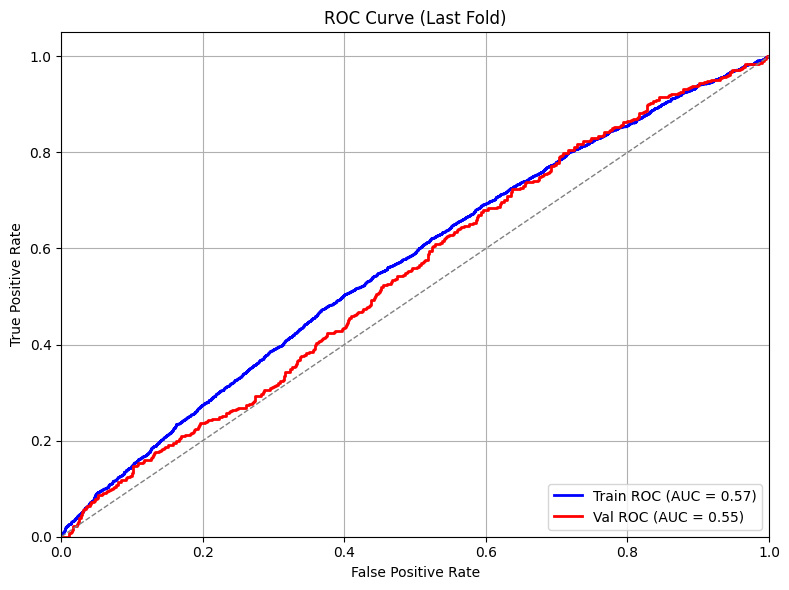

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.24%
Confusion Matrix (Total):
[[3352 2367]
 [3355 2662]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.51      0.61      0.56       649
          Up       0.52      0.43      0.47       655

    accuracy                           0.52      1304
   macro avg       0.52      0.52      0.51      1304
weighted avg       0.52      0.52      0.51      1304

Testing linear model on test set...
Test Model Results:
  R² Score: -0.035556
  Test samples: 13244
  Features used: 31
  Overall Accuracy: 0.4950 (49.50%)
  Weighted Accuracy: 0.4950 (49.50%)
  Rise Accuracy: 0.2020 (20.20%) - 6762 samples
  Fall Accuracy: 0.8007 (80.07%) - 6482 samples
  Precision: 0.5139
  Recall: 0.2020
  F1 Score: 0.2900
  Confusion Matrix (Fall/Rise):
    [[5190 1292]  # Predicted Fall
     [5396 1366]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive

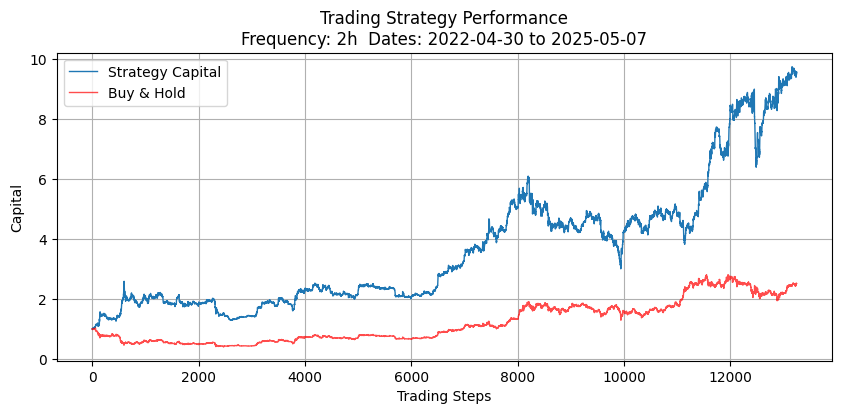

{'Total Return': 8.512715248319273, 'Buy and Hold Return': 1.5099448543453609, 'Hit Rate': 0.5064180006040471, 'Sharpe Ratio': 1.2842229359123483, 'Number of Trades': 13244}
Hit Rate (Long/Price Rise): 51.08%
Hit Rate (Short/Price Fall): 49.19%
Number of Long Trades: 10168
Number of Short Trades: 3076
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


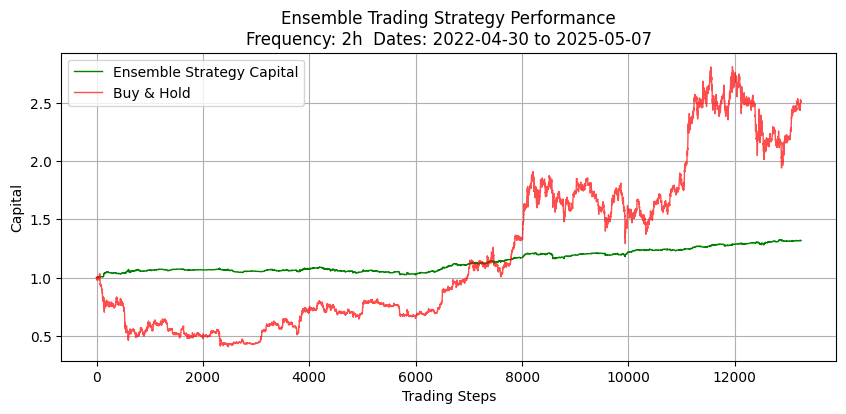

Ensemble Strategy Metrics: {'Total Return': 0.31792720130148977, 'Buy and Hold Return': 1.5099448543453609, 'Hit Rate': 0.5260218896582532, 'Sharpe Ratio': 1.5655217070287315, 'Number of Trades': 8954}
Hit Rate (Long/Price Rise): 53.19%
Hit Rate (Short/Price Fall): 51.11%
Number of Long Trades: 6434
Number of Short Trades: 2520
Testing BTC with trading window 3
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.00032350297996931634
Fraction positive: 0.5144377760163062
Fraction negative: 0.4854489865247424
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0

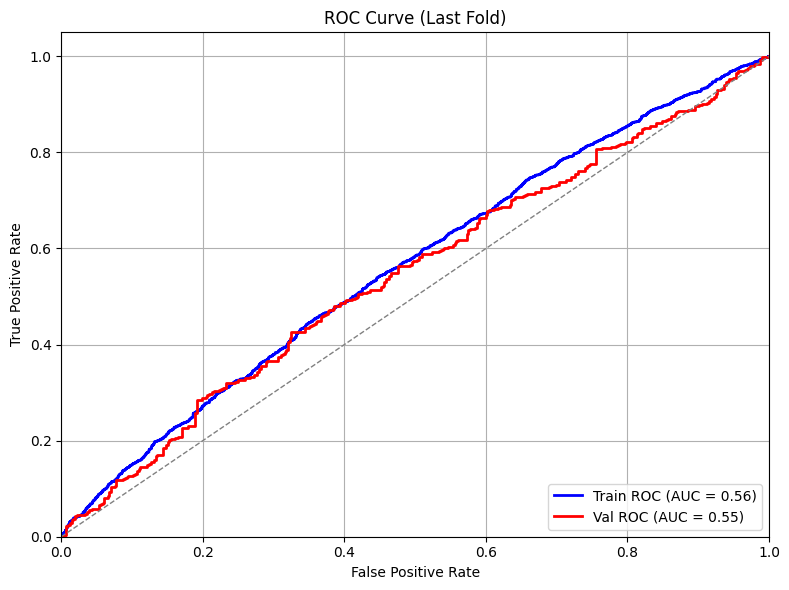

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.93%
Confusion Matrix (Total):
[[1620 2200]
 [1611 2336]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.53      0.41      0.46       412
          Up       0.55      0.66      0.60       451

    accuracy                           0.54       863
   macro avg       0.54      0.54      0.53       863
weighted avg       0.54      0.54      0.53       863

Testing linear model on test set...
Test Model Results:
  R² Score: -0.021925
  Test samples: 8827
  Features used: 31
  Overall Accuracy: 0.4843 (48.43%)
  Weighted Accuracy: 0.4843 (48.43%)
  Rise Accuracy: 0.2482 (24.82%) - 4465 samples
  Fall Accuracy: 0.7260 (72.60%) - 4362 samples
  Precision: 0.4811
  Recall: 0.2482
  F1 Score: 0.3274
  Confusion Matrix (Fall/Rise):
    [[3167 1195]  # Predicted Fall
     [3357 1108]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive 

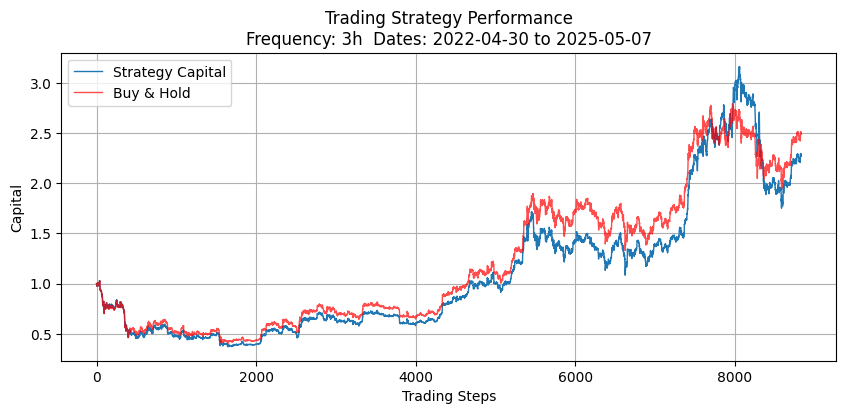

{'Total Return': 1.2910215320417908, 'Buy and Hold Return': 1.4848201063457473, 'Hit Rate': 0.509344206591913, 'Sharpe Ratio': 0.637869864204913, 'Number of Trades': 8829}
Hit Rate (Long/Price Rise): 50.96%
Hit Rate (Short/Price Fall): 49.76%
Number of Long Trades: 8622
Number of Short Trades: 207
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


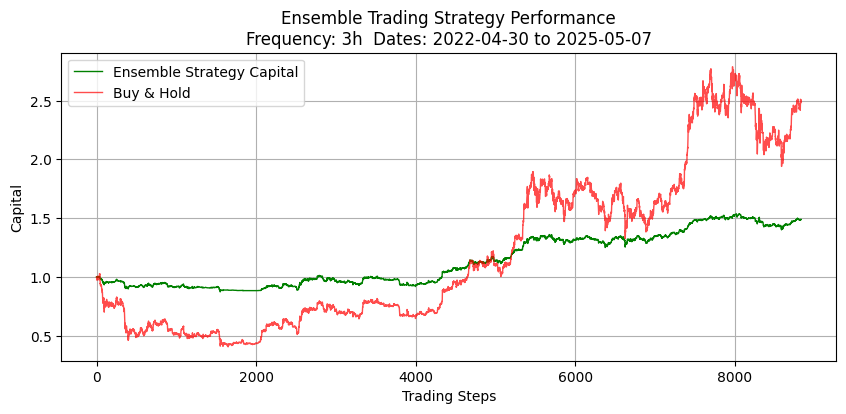

Ensemble Strategy Metrics: {'Total Return': 0.49004781841191214, 'Buy and Hold Return': 1.4848201063457473, 'Hit Rate': 0.5104253544620517, 'Sharpe Ratio': 1.1109250833722941, 'Number of Trades': 8393}
Hit Rate (Long/Price Rise): 51.04%
Hit Rate (Short/Price Fall): 50.93%
Number of Long Trades: 8285
Number of Short Trades: 108
Testing BTC with trading window 4
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0004287976463391228
Fraction positive: 0.5168352710252152
Fraction negative: 0.4828627510191756
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0',

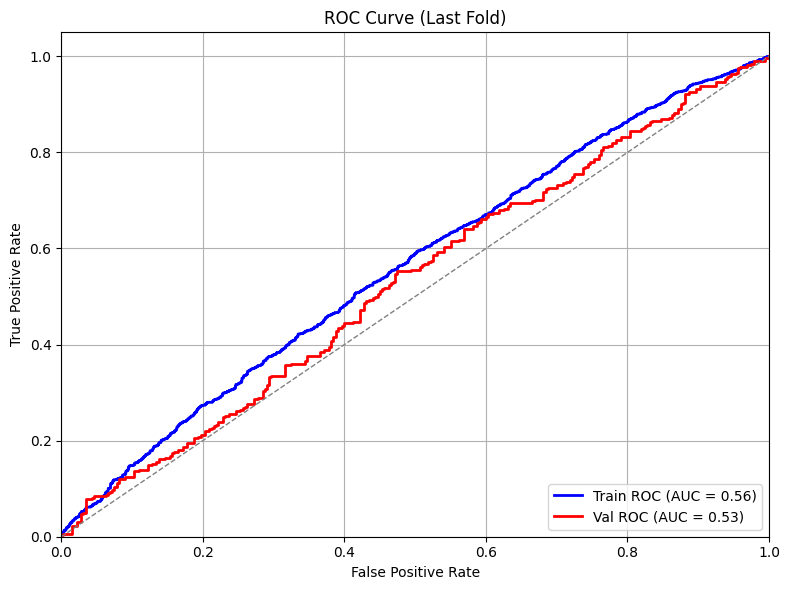

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.24%
Confusion Matrix (Total):
[[1772 1020]
 [1855 1131]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.50      0.90      0.65       320
          Up       0.55      0.12      0.20       322

    accuracy                           0.51       642
   macro avg       0.53      0.51      0.42       642
weighted avg       0.53      0.51      0.42       642

Testing linear model on test set...
Test Model Results:
  R² Score: -0.023949
  Test samples: 6619
  Features used: 31
  Overall Accuracy: 0.4895 (48.95%)
  Weighted Accuracy: 0.4895 (48.95%)
  Rise Accuracy: 0.4629 (46.29%) - 3368 samples
  Fall Accuracy: 0.5171 (51.71%) - 3251 samples
  Precision: 0.4982
  Recall: 0.4629
  F1 Score: 0.4799
  Confusion Matrix (Fall/Rise):
    [[1681 1570]  # Predicted Fall
     [1809 1559]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive 

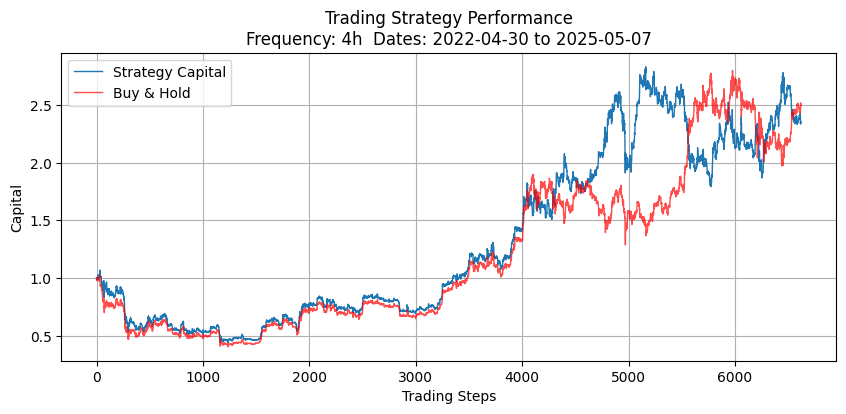

{'Total Return': 1.3496280438359678, 'Buy and Hold Return': 1.5026964985375741, 'Hit Rate': 0.5050596586618336, 'Sharpe Ratio': 0.5695364495693667, 'Number of Trades': 6621}
Hit Rate (Long/Price Rise): 50.97%
Hit Rate (Short/Price Fall): 49.24%
Number of Long Trades: 4854
Number of Short Trades: 1767
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


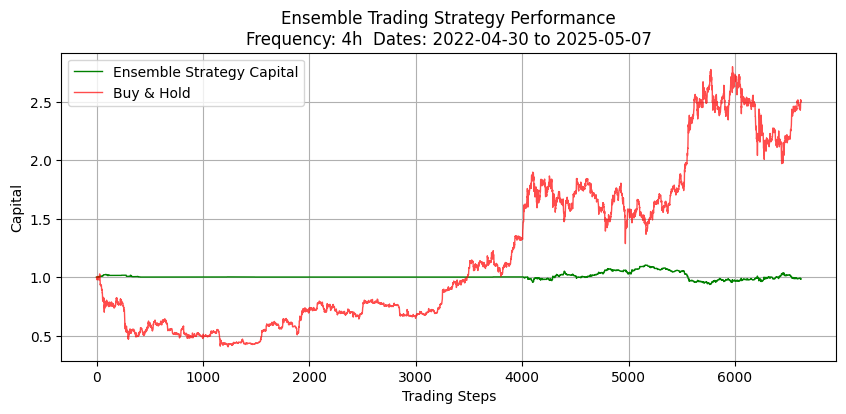

Ensemble Strategy Metrics: {'Total Return': -0.015318033163487454, 'Buy and Hold Return': 1.5026964985375741, 'Hit Rate': 0.49377123442808607, 'Sharpe Ratio': -0.0673376607034614, 'Number of Trades': 1766}
Hit Rate (Long/Price Rise): 83.33%
Hit Rate (Short/Price Fall): 49.26%
Number of Long Trades: 6
Number of Short Trades: 1760
Testing BTC with trading window 5
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0005369532776755626
Fraction positive: 0.5257595772787318
Fraction negative: 0.4740517078694093
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0

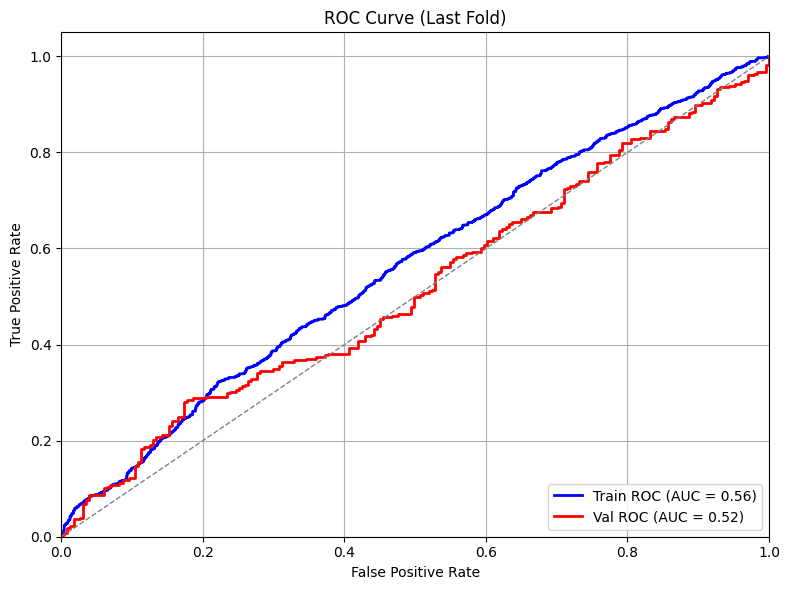

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 49.90%
Confusion Matrix (Total):
[[1155 1052]
 [1243 1131]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.45      0.50      0.47       231
          Up       0.54      0.49      0.51       278

    accuracy                           0.49       509
   macro avg       0.49      0.49      0.49       509
weighted avg       0.50      0.49      0.49       509

Testing linear model on test set...
Test Model Results:
  R² Score: -0.039062
  Test samples: 5293
  Features used: 31
  Overall Accuracy: 0.4927 (49.27%)
  Weighted Accuracy: 0.4927 (49.27%)
  Rise Accuracy: 0.5981 (59.81%) - 2690 samples
  Fall Accuracy: 0.3838 (38.38%) - 2603 samples
  Precision: 0.5008
  Recall: 0.5981
  F1 Score: 0.5451
  Confusion Matrix (Fall/Rise):
    [[ 999 1604]  # Predicted Fall
     [1081 1609]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive 

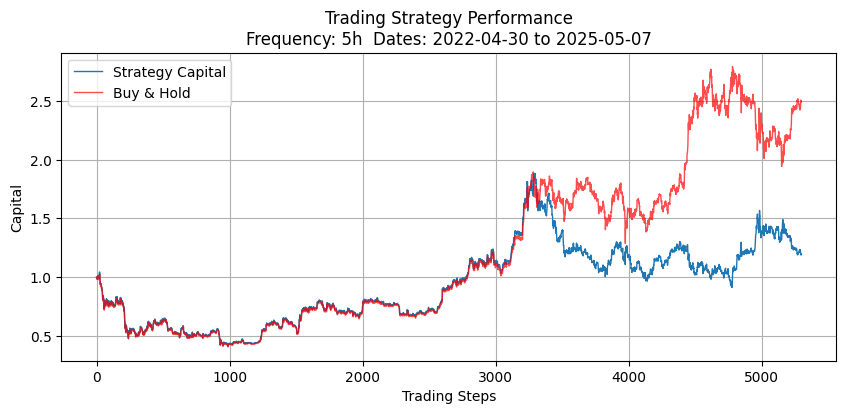

{'Total Return': 0.19010328345651373, 'Buy and Hold Return': 1.491764174420694, 'Hit Rate': 0.500283179158014, 'Sharpe Ratio': 0.12102148038179918, 'Number of Trades': 5297}
Hit Rate (Long/Price Rise): 50.82%
Hit Rate (Short/Price Fall): 46.92%
Number of Long Trades: 4225
Number of Short Trades: 1072
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


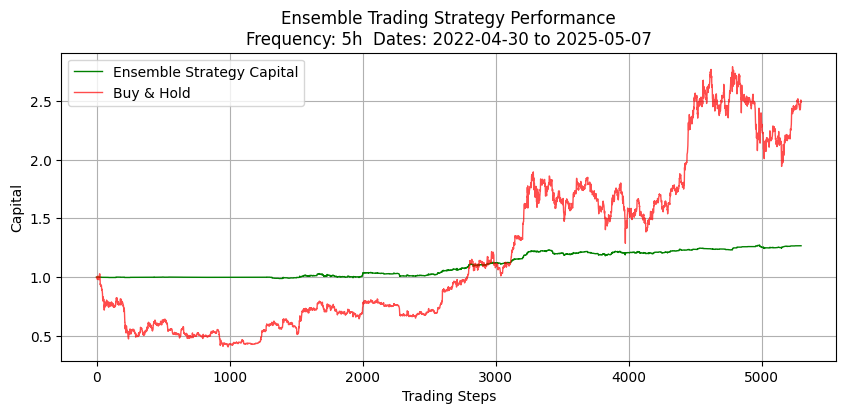

Ensemble Strategy Metrics: {'Total Return': 0.2675322266636233, 'Buy and Hold Return': 1.491764174420694, 'Hit Rate': 0.5154170723790977, 'Sharpe Ratio': 1.6226246188032296, 'Number of Trades': 3081}
Hit Rate (Long/Price Rise): 51.78%
Hit Rate (Short/Price Fall): 48.75%
Number of Long Trades: 2841
Number of Short Trades: 240
Testing BTC with trading window 6
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0006460765916401936
Fraction positive: 0.5210597826086957
Fraction negative: 0.478713768115942
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'b

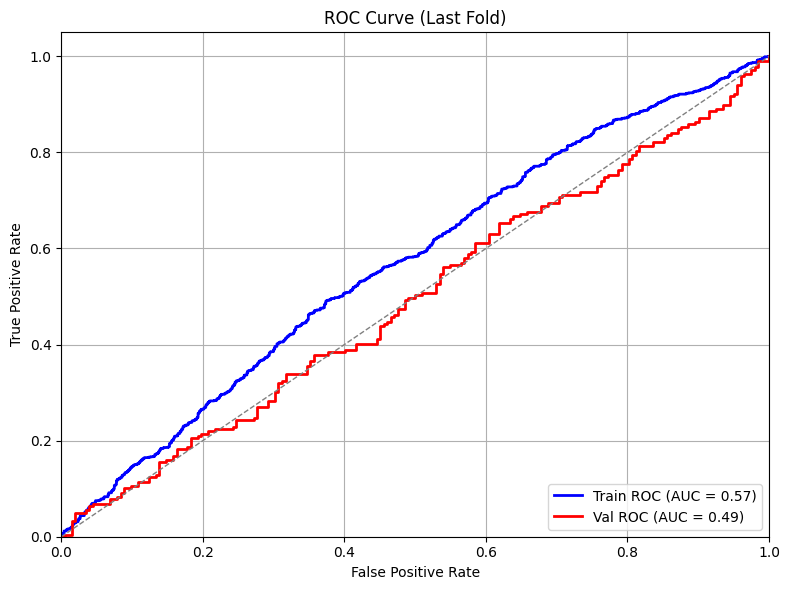

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.83%
Confusion Matrix (Total):
[[956 901]
 [962 970]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.48      0.83      0.61       202
          Up       0.54      0.18      0.27       219

    accuracy                           0.49       421
   macro avg       0.51      0.51      0.44       421
weighted avg       0.51      0.49      0.44       421

Testing linear model on test set...
Test Model Results:
  R² Score: -0.032493
  Test samples: 4409
  Features used: 31
  Overall Accuracy: 0.4815 (48.15%)
  Weighted Accuracy: 0.4815 (48.15%)
  Rise Accuracy: 0.3751 (37.51%) - 2277 samples
  Fall Accuracy: 0.5952 (59.52%) - 2132 samples
  Precision: 0.4974
  Recall: 0.3751
  F1 Score: 0.4276
  Confusion Matrix (Fall/Rise):
    [[1269  863]  # Predicted Fall
     [1423  854]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive stra

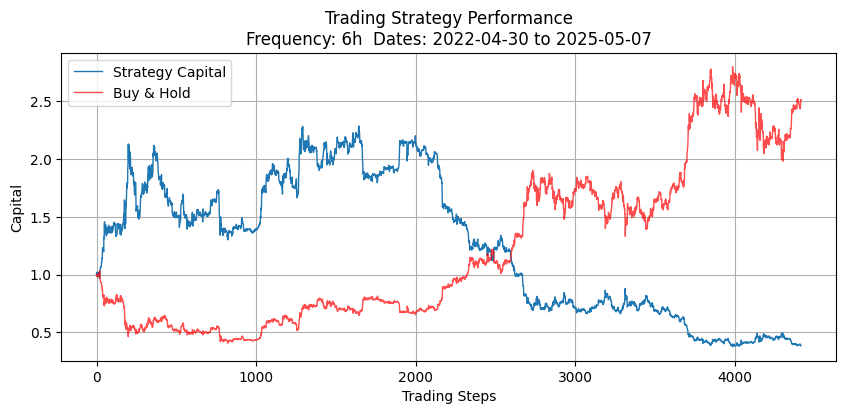

{'Total Return': -0.6156112482418975, 'Buy and Hold Return': 1.5107442725360263, 'Hit Rate': 0.49546896239238786, 'Sharpe Ratio': -0.28933672455745724, 'Number of Trades': 4414}
Hit Rate (Long/Price Rise): 51.32%
Hit Rate (Short/Price Fall): 49.13%
Number of Long Trades: 836
Number of Short Trades: 3578
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


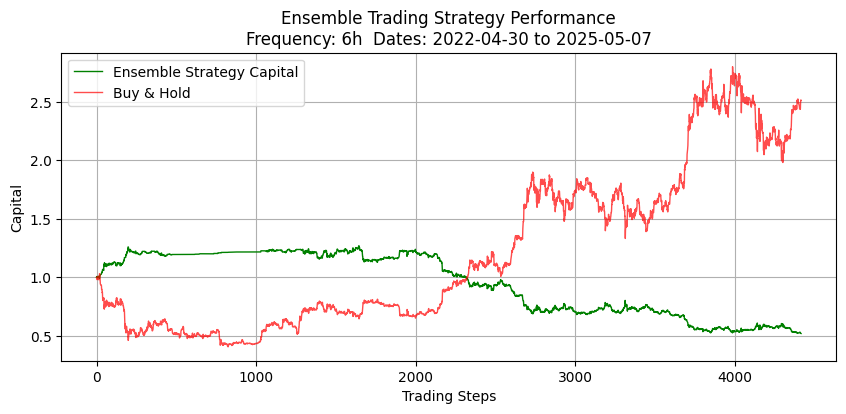

Ensemble Strategy Metrics: {'Total Return': -0.47914180725404454, 'Buy and Hold Return': 1.5107442725360263, 'Hit Rate': 0.49255377826806396, 'Sharpe Ratio': -0.85726735016901, 'Number of Trades': 3626}
Hit Rate (Long/Price Rise): 58.33%
Hit Rate (Short/Price Fall): 49.19%
Number of Long Trades: 24
Number of Short Trades: 3602
Testing ETH with trading window 2
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0003078535737426885
Fraction positive: 0.5114751623131512
Fraction negative: 0.4873924203533142
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0',

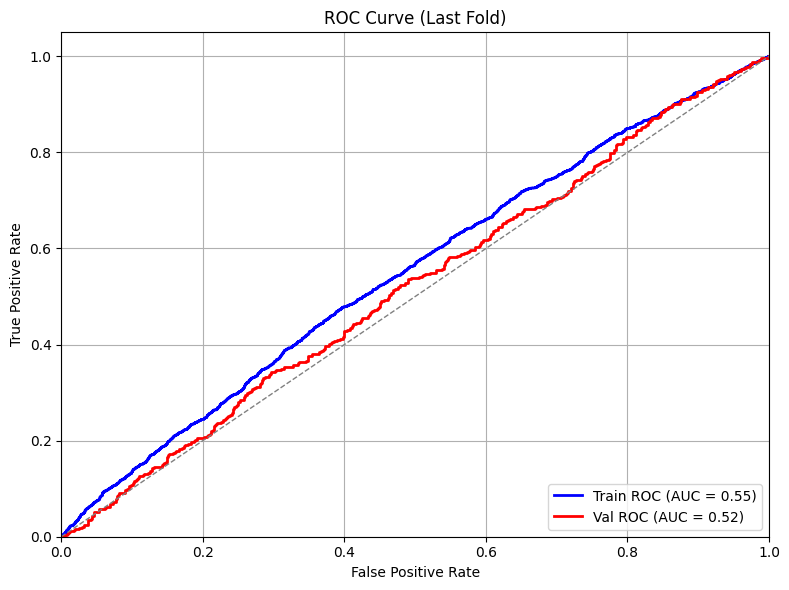

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.80%
Confusion Matrix (Total):
[[2568 3094]
 [2680 3394]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.50      0.55      0.52       635
          Up       0.53      0.49      0.51       669

    accuracy                           0.52      1304
   macro avg       0.52      0.52      0.52      1304
weighted avg       0.52      0.52      0.52      1304

Testing linear model on test set...
Test Model Results:
  R² Score: -0.011859
  Test samples: 13244
  Features used: 31
  Overall Accuracy: 0.5044 (50.44%)
  Weighted Accuracy: 0.5044 (50.44%)
  Rise Accuracy: 0.9489 (94.89%) - 6689 samples
  Fall Accuracy: 0.0508 (5.08%) - 6555 samples
  Precision: 0.5050
  Recall: 0.9489
  F1 Score: 0.6592
  Confusion Matrix (Fall/Rise):
    [[ 333 6222]  # Predicted Fall
     [ 342 6347]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive 

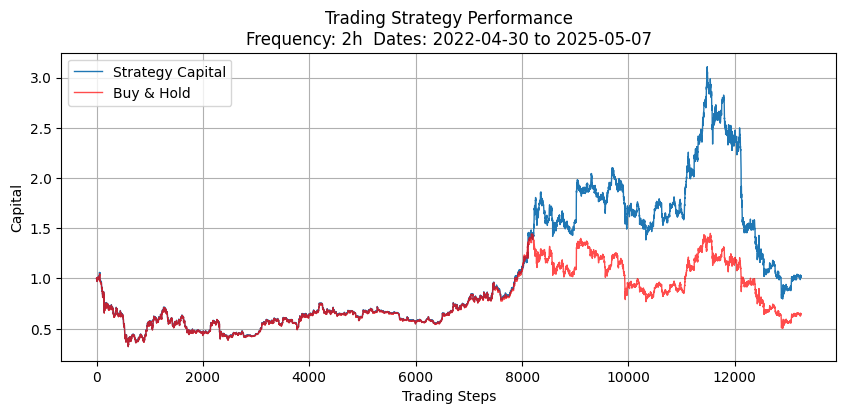

{'Total Return': 0.018710453415914596, 'Buy and Hold Return': -0.3625706532624127, 'Hit Rate': 0.5051344004832377, 'Sharpe Ratio': 0.007457807399673218, 'Number of Trades': 13244}
Hit Rate (Long/Price Rise): 50.61%
Hit Rate (Short/Price Fall): 48.39%
Number of Long Trades: 12686
Number of Short Trades: 558
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


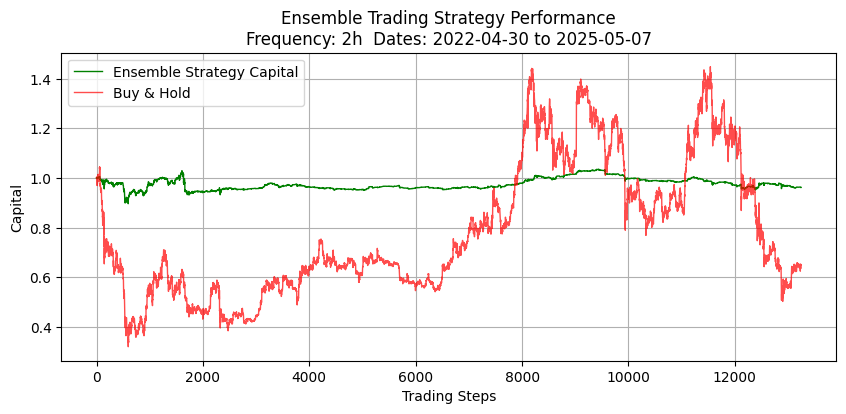

Ensemble Strategy Metrics: {'Total Return': -0.03751978321302385, 'Buy and Hold Return': -0.3625706532624127, 'Hit Rate': 0.523011963406052, 'Sharpe Ratio': -0.17345658552736412, 'Number of Trades': 7105}
Hit Rate (Long/Price Rise): 53.87%
Hit Rate (Short/Price Fall): 48.38%
Number of Long Trades: 5073
Number of Short Trades: 2032
Testing ETH with trading window 3
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0004618039869327803
Fraction positive: 0.5173819499490432
Fraction negative: 0.48193862529724835
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_

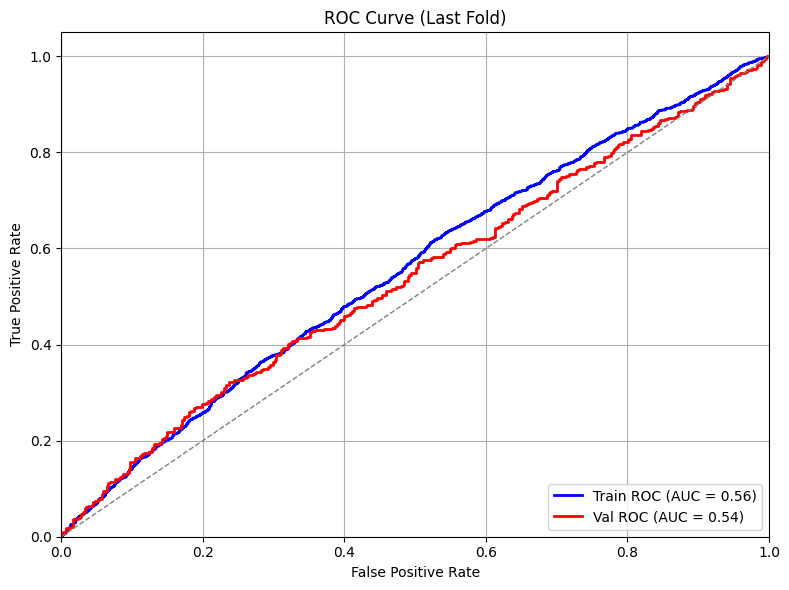

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 52.17%
Confusion Matrix (Total):
[[1466 2234]
 [1481 2586]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.51      0.73      0.60       421
          Up       0.57      0.34      0.42       442

    accuracy                           0.53       863
   macro avg       0.54      0.53      0.51       863
weighted avg       0.54      0.53      0.51       863

Testing linear model on test set...
Test Model Results:
  R² Score: -0.042608
  Test samples: 8827
  Features used: 31
  Overall Accuracy: 0.4973 (49.73%)
  Weighted Accuracy: 0.4973 (49.73%)
  Rise Accuracy: 0.9911 (99.11%) - 4382 samples
  Fall Accuracy: 0.0106 (1.06%) - 4445 samples
  Precision: 0.4969
  Recall: 0.9911
  F1 Score: 0.6619
  Confusion Matrix (Fall/Rise):
    [[  47 4398]  # Predicted Fall
     [  39 4343]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive s

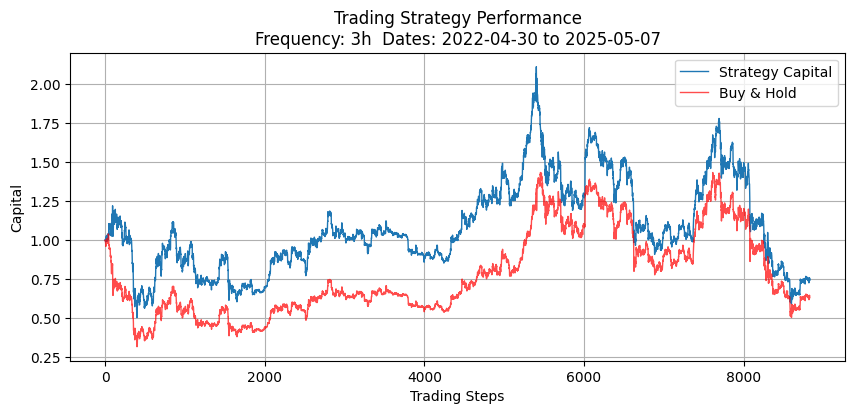

{'Total Return': -0.24820482730758187, 'Buy and Hold Return': -0.366785306939839, 'Hit Rate': 0.5077585230490429, 'Sharpe Ratio': -0.11342323632771932, 'Number of Trades': 8829}
Hit Rate (Long/Price Rise): 50.81%
Hit Rate (Short/Price Fall): 47.62%
Number of Long Trades: 8745
Number of Short Trades: 84
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


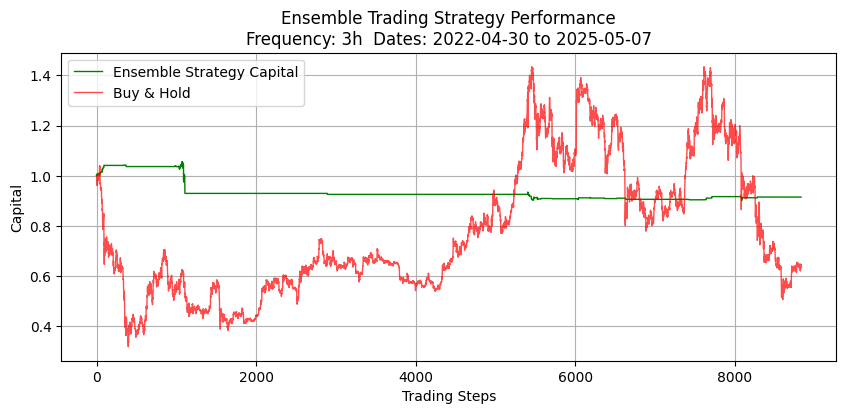

Ensemble Strategy Metrics: {'Total Return': -0.08516603133561573, 'Buy and Hold Return': -0.366785306939839, 'Hit Rate': 0.47761194029850745, 'Sharpe Ratio': -0.49316474334698873, 'Number of Trades': 201}
Hit Rate (Long/Price Rise): 50.00%
Hit Rate (Short/Price Fall): 46.34%
Number of Long Trades: 78
Number of Short Trades: 123
Testing ETH with trading window 4
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.000612833340976593
Fraction positive: 0.5144194473803413
Fraction negative: 0.484674618752831
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 

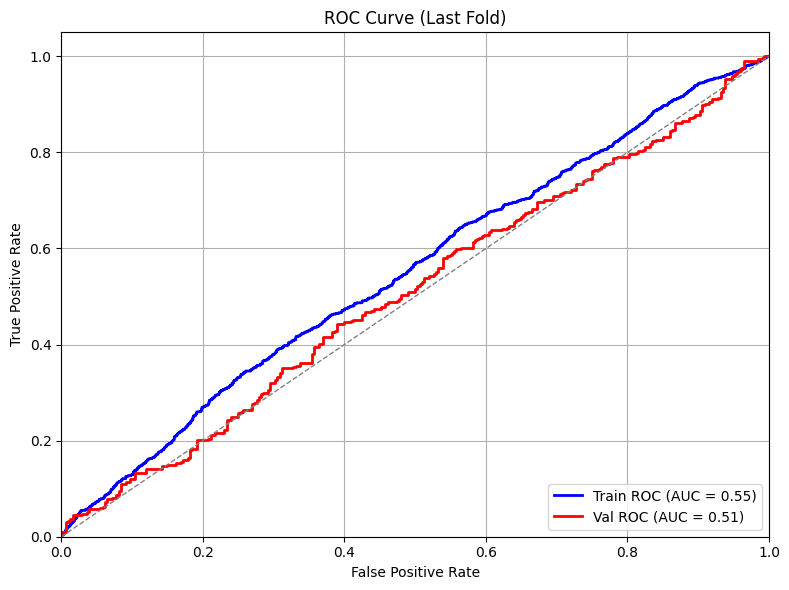

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.94%
Confusion Matrix (Total):
[[1028 1705]
 [1072 1973]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.49      0.25      0.33       308
          Up       0.52      0.76      0.62       334

    accuracy                           0.51       642
   macro avg       0.51      0.50      0.47       642
weighted avg       0.51      0.51      0.48       642

Testing linear model on test set...
Test Model Results:
  R² Score: -0.050860
  Test samples: 6619
  Features used: 31
  Overall Accuracy: 0.5017 (50.17%)
  Weighted Accuracy: 0.5017 (50.17%)
  Rise Accuracy: 0.9888 (98.88%) - 3308 samples
  Fall Accuracy: 0.0151 (1.51%) - 3311 samples
  Precision: 0.5008
  Recall: 0.9888
  F1 Score: 0.6648
  Confusion Matrix (Fall/Rise):
    [[  50 3261]  # Predicted Fall
     [  37 3271]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive s

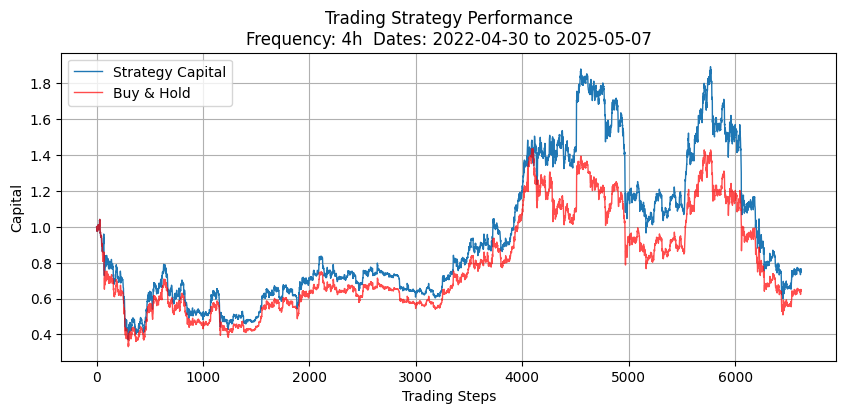

{'Total Return': -0.2524446995406804, 'Buy and Hold Return': -0.3601564500322258, 'Hit Rate': 0.49841413683733576, 'Sharpe Ratio': -0.12694679608884402, 'Number of Trades': 6621}
Hit Rate (Long/Price Rise): 49.85%
Hit Rate (Short/Price Fall): 48.75%
Number of Long Trades: 6541
Number of Short Trades: 80
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


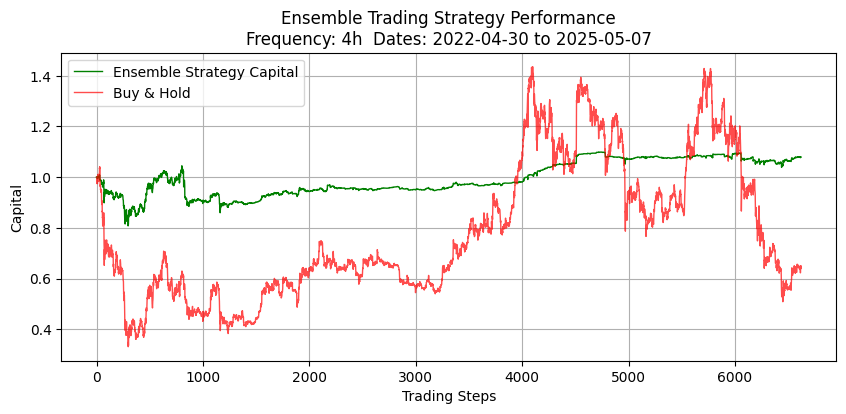

Ensemble Strategy Metrics: {'Total Return': 0.07942267303988393, 'Buy and Hold Return': -0.3601564500322258, 'Hit Rate': 0.5070564516129032, 'Sharpe Ratio': 0.21068093730614892, 'Number of Trades': 4960}
Hit Rate (Long/Price Rise): 51.04%
Hit Rate (Short/Price Fall): 48.79%
Number of Long Trades: 4218
Number of Short Trades: 742
Testing ETH with trading window 5
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0007741656714883776
Fraction positive: 0.5229288545008492
Fraction negative: 0.4763162860917154
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0

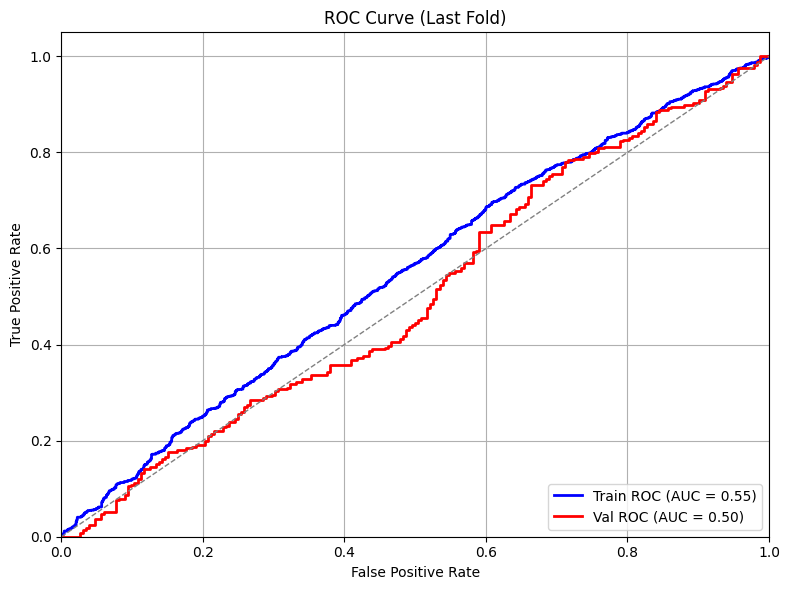

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 49.86%
Confusion Matrix (Total):
[[1107 1028]
 [1269 1177]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.45      0.75      0.57       232
          Up       0.54      0.24      0.33       277

    accuracy                           0.47       509
   macro avg       0.49      0.50      0.45       509
weighted avg       0.50      0.47      0.44       509

Testing linear model on test set...
Test Model Results:
  R² Score: -0.013475
  Test samples: 5293
  Features used: 31
  Overall Accuracy: 0.4942 (49.42%)
  Weighted Accuracy: 0.4942 (49.42%)
  Rise Accuracy: 0.4612 (46.12%) - 2654 samples
  Fall Accuracy: 0.5275 (52.75%) - 2639 samples
  Precision: 0.4953
  Recall: 0.4612
  F1 Score: 0.4777
  Confusion Matrix (Fall/Rise):
    [[1392 1247]  # Predicted Fall
     [1430 1224]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive 

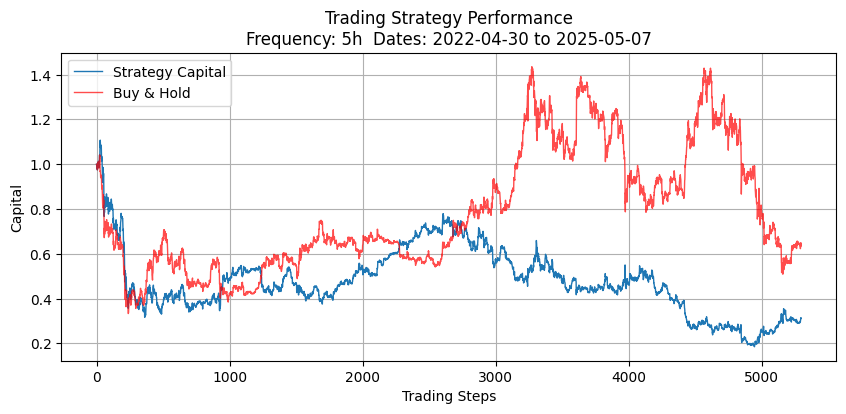

{'Total Return': -0.6886404961279944, 'Buy and Hold Return': -0.3652367044255856, 'Hit Rate': 0.5017934680007552, 'Sharpe Ratio': -0.7165460464923615, 'Number of Trades': 5297}
Hit Rate (Long/Price Rise): 51.85%
Hit Rate (Short/Price Fall): 49.37%
Number of Long Trades: 1728
Number of Short Trades: 3569
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


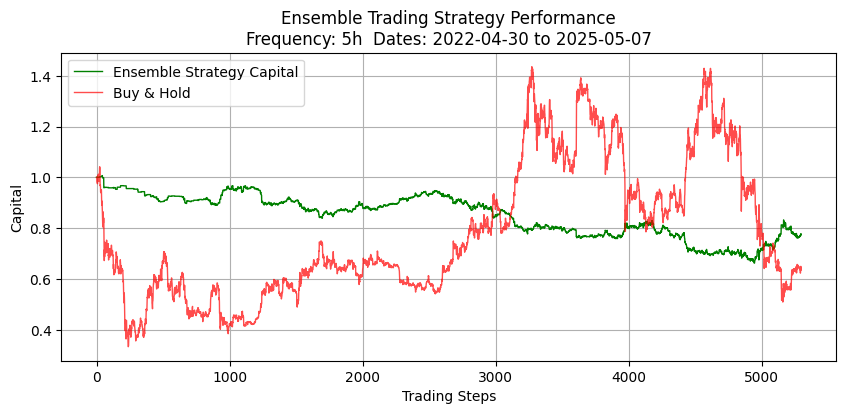

Ensemble Strategy Metrics: {'Total Return': -0.22533829608373102, 'Buy and Hold Return': -0.3652367044255856, 'Hit Rate': 0.4921422663358147, 'Sharpe Ratio': -0.6711530894770854, 'Number of Trades': 3627}
Hit Rate (Long/Price Rise): 42.86%
Hit Rate (Short/Price Fall): 49.29%
Number of Long Trades: 42
Number of Short Trades: 3585
Testing ETH with trading window 6
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0009204502152683965
Fraction positive: 0.5292119565217391
Fraction negative: 0.4701086956521739
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0

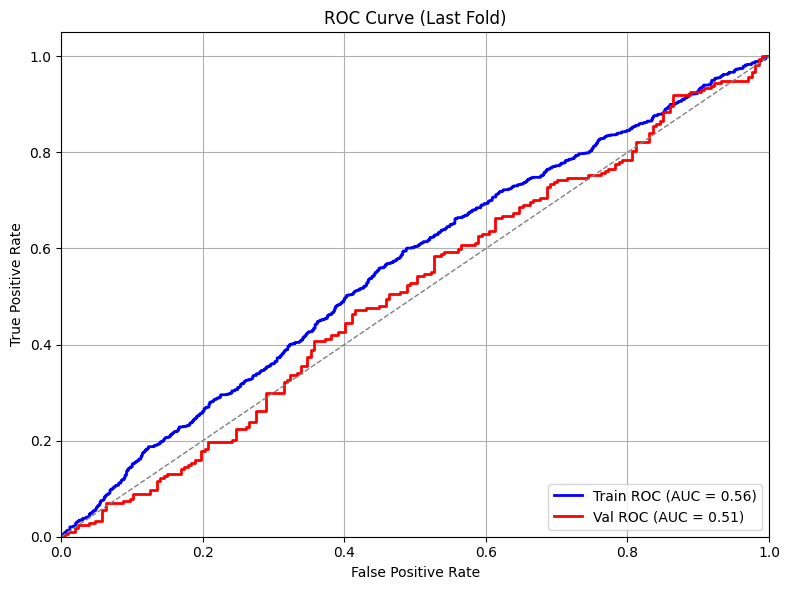

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 48.38%
Confusion Matrix (Total):
[[1024  776]
 [1180  809]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.51      0.50      0.50       207
          Up       0.53      0.54      0.53       214

    accuracy                           0.52       421
   macro avg       0.52      0.52      0.52       421
weighted avg       0.52      0.52      0.52       421

Testing linear model on test set...
Test Model Results:
  R² Score: -0.022339
  Test samples: 4409
  Features used: 31
  Overall Accuracy: 0.4974 (49.74%)
  Weighted Accuracy: 0.4974 (49.74%)
  Rise Accuracy: 0.9711 (97.11%) - 2215 samples
  Fall Accuracy: 0.0191 (1.91%) - 2194 samples
  Precision: 0.4999
  Recall: 0.9711
  F1 Score: 0.6600
  Confusion Matrix (Fall/Rise):
    [[  42 2152]  # Predicted Fall
     [  64 2151]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive s

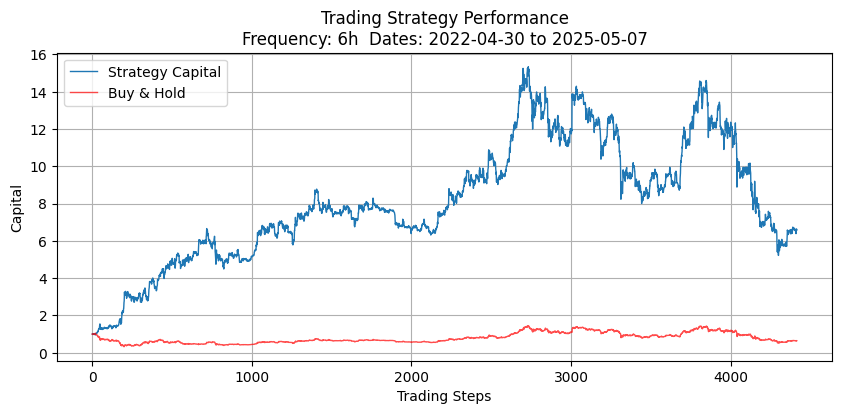

{'Total Return': 5.581850633388161, 'Buy and Hold Return': -0.35805257777801397, 'Hit Rate': 0.506343452650657, 'Sharpe Ratio': 0.3423564214129581, 'Number of Trades': 4414}
Hit Rate (Long/Price Rise): 50.17%
Hit Rate (Short/Price Fall): 55.38%
Number of Long Trades: 4024
Number of Short Trades: 390
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


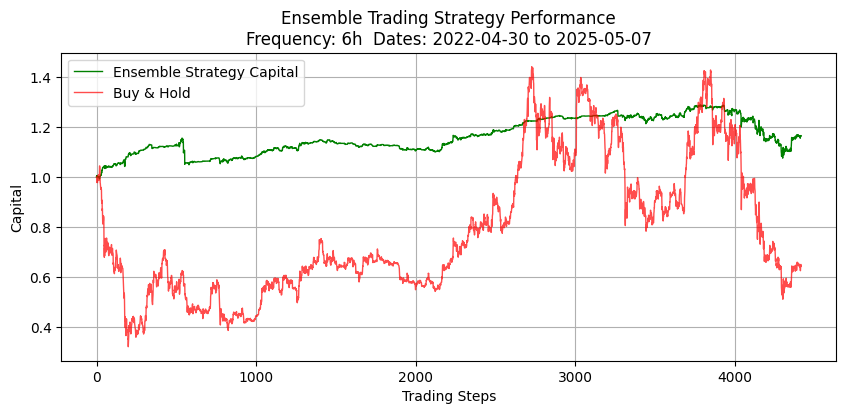

Ensemble Strategy Metrics: {'Total Return': 0.1638598792612629, 'Buy and Hold Return': -0.35805257777801397, 'Hit Rate': 0.5110637163423087, 'Sharpe Ratio': 0.5114494595876908, 'Number of Trades': 3751}
Hit Rate (Long/Price Rise): 50.53%
Hit Rate (Short/Price Fall): 56.40%
Number of Long Trades: 3384
Number of Short Trades: 367
Testing TRX with trading window 2
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.00019856522923226798
Fraction positive: 0.5094368111127887
Fraction negative: 0.4799184659519855
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14',

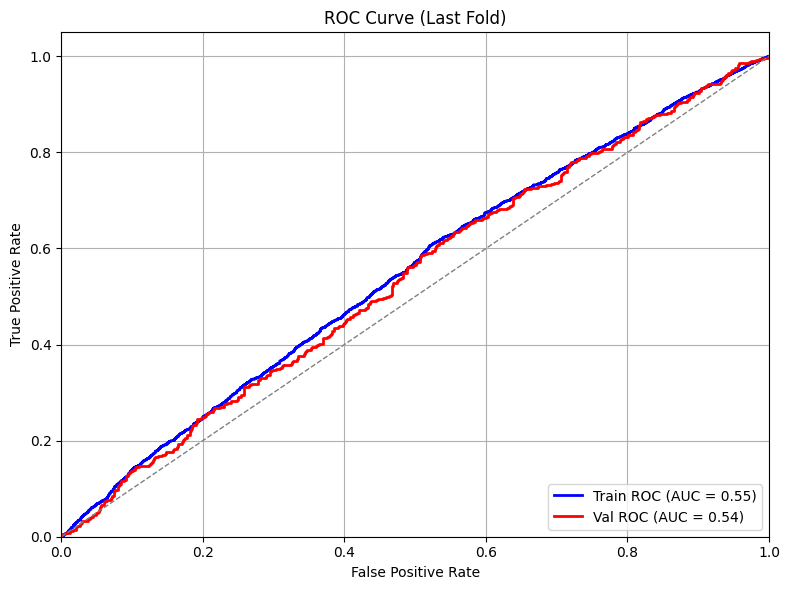

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.38%
Confusion Matrix (Total):
[[2879 2709]
 [2997 3151]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.49      0.65      0.56       616
          Up       0.56      0.40      0.46       688

    accuracy                           0.51      1304
   macro avg       0.52      0.52      0.51      1304
weighted avg       0.52      0.51      0.51      1304

Testing linear model on test set...
Test Model Results:
  R² Score: -0.040799
  Test samples: 13244
  Features used: 30
  Overall Accuracy: 0.5251 (52.51%)
  Weighted Accuracy: 0.5251 (52.51%)
  Rise Accuracy: 0.9192 (91.92%) - 7003 samples
  Fall Accuracy: 0.0828 (8.28%) - 6241 samples
  Precision: 0.5293
  Recall: 0.9192
  F1 Score: 0.6718
  Confusion Matrix (Fall/Rise):
    [[ 517 5724]  # Predicted Fall
     [ 566 6437]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive 

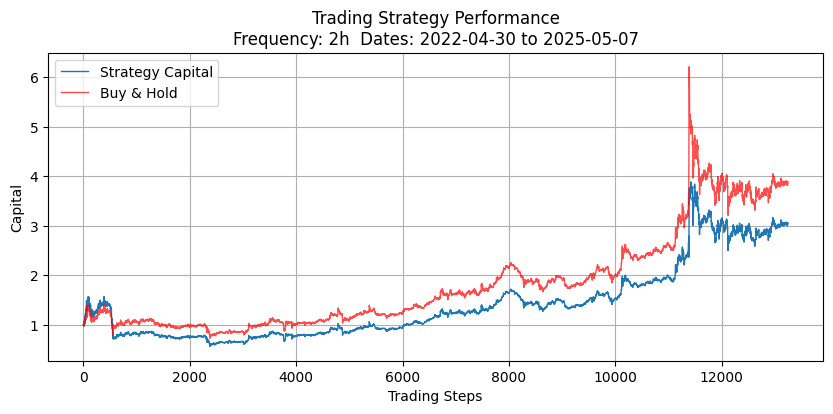

{'Total Return': 2.062079695356929, 'Buy and Hold Return': 2.884064773527341, 'Hit Rate': 0.5182724252491694, 'Sharpe Ratio': 0.6644353187531002, 'Number of Trades': 13244}
Hit Rate (Long/Price Rise): 51.84%
Hit Rate (Short/Price Fall): 49.25%
Number of Long Trades: 13177
Number of Short Trades: 67
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


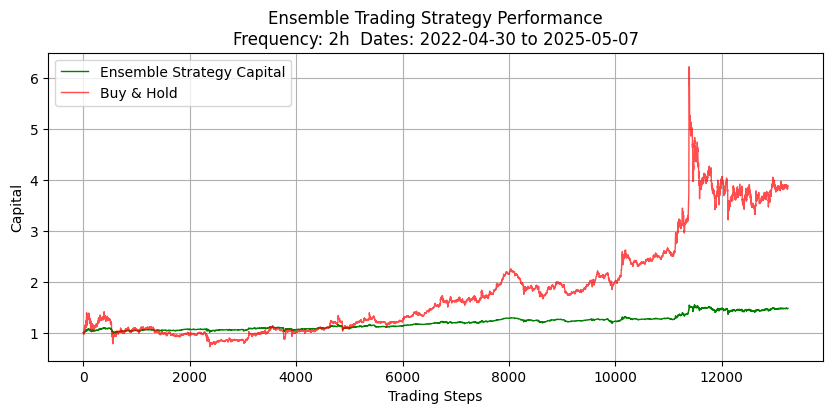

Ensemble Strategy Metrics: {'Total Return': 0.47619056067342047, 'Buy and Hold Return': 2.884064773527341, 'Hit Rate': 0.5177730518000911, 'Sharpe Ratio': 0.9371846651701914, 'Number of Trades': 13166}
Hit Rate (Long/Price Rise): 51.78%
Hit Rate (Short/Price Fall): 47.83%
Number of Long Trades: 13143
Number of Short Trades: 23
Testing TRX with trading window 3
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.00029196334185631106
Fraction positive: 0.5136451138036462
Fraction negative: 0.4799003510361228
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14', 

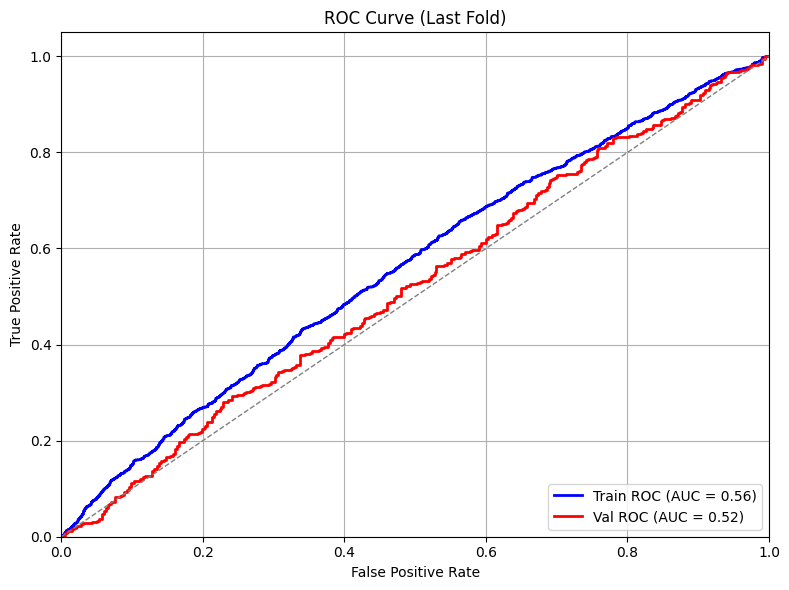

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.23%
Confusion Matrix (Total):
[[2072 1580]
 [2208 1907]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.47      0.59      0.52       398
          Up       0.55      0.43      0.48       465

    accuracy                           0.50       863
   macro avg       0.51      0.51      0.50       863
weighted avg       0.51      0.50      0.50       863

Testing linear model on test set...
Test Model Results:
  R² Score: 0.005119
  Test samples: 8827
  Features used: 30
  Overall Accuracy: 0.5214 (52.14%)
  Weighted Accuracy: 0.5214 (52.14%)
  Rise Accuracy: 0.7823 (78.23%) - 4709 samples
  Fall Accuracy: 0.2229 (22.29%) - 4118 samples
  Precision: 0.5352
  Recall: 0.7823
  F1 Score: 0.6356
  Confusion Matrix (Fall/Rise):
    [[ 918 3200]  # Predicted Fall
     [1025 3684]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive s

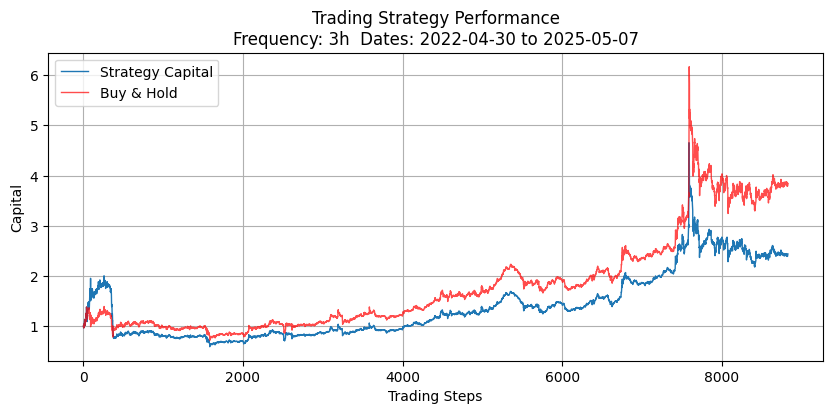

{'Total Return': 1.439072973756403, 'Buy and Hold Return': 2.8437038763303035, 'Hit Rate': 0.5215766224940537, 'Sharpe Ratio': 0.4100223689119825, 'Number of Trades': 8829}
Hit Rate (Long/Price Rise): 52.32%
Hit Rate (Short/Price Fall): 42.25%
Number of Long Trades: 8687
Number of Short Trades: 142
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


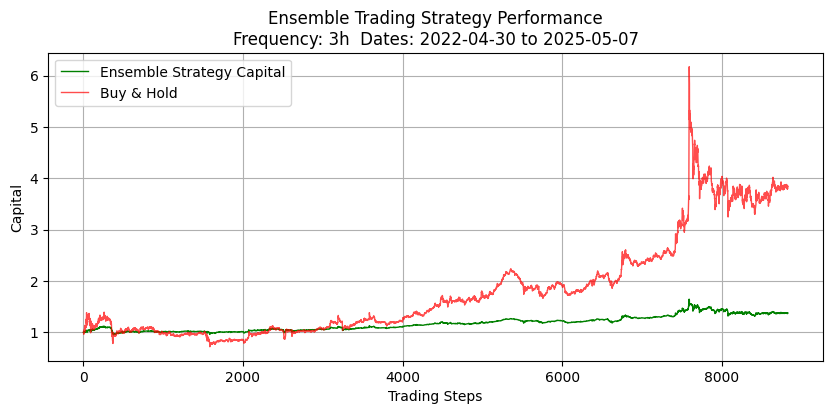

Ensemble Strategy Metrics: {'Total Return': 0.3747890301402059, 'Buy and Hold Return': 2.8437038763303035, 'Hit Rate': 0.5228660292593019, 'Sharpe Ratio': 0.5889402245289277, 'Number of Trades': 8681}
Hit Rate (Long/Price Rise): 52.29%
Hit Rate (Short/Price Fall): 50.00%
Number of Long Trades: 8675
Number of Short Trades: 6
Testing TRX with trading window 4
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.00039396388186782133
Fraction positive: 0.5180431828476522
Fraction negative: 0.47501132417333536
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14', 's

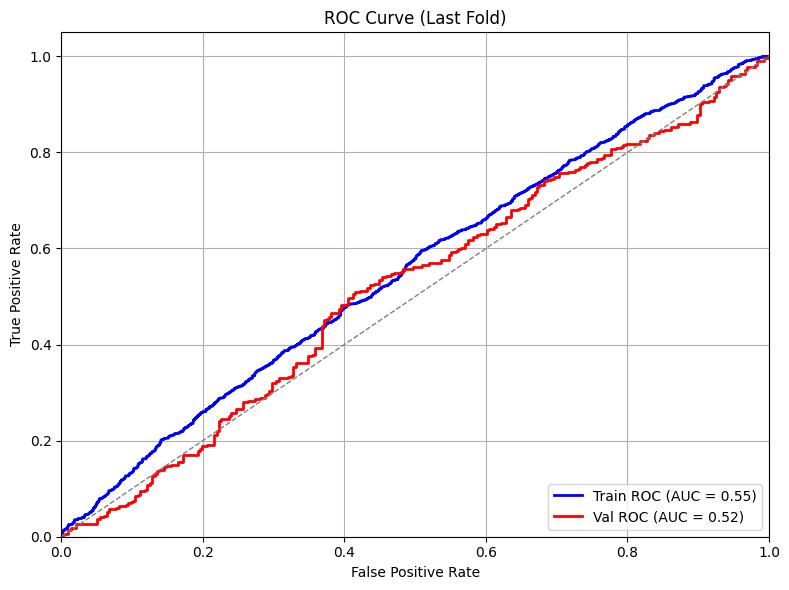

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.80%
Confusion Matrix (Total):
[[1477 1205]
 [1638 1458]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.48      0.44      0.46       296
          Up       0.55      0.60      0.58       346

    accuracy                           0.52       642
   macro avg       0.52      0.52      0.52       642
weighted avg       0.52      0.52      0.52       642

Testing linear model on test set...
Test Model Results:
  R² Score: -0.134614
  Test samples: 6619
  Features used: 30
  Overall Accuracy: 0.5211 (52.11%)
  Weighted Accuracy: 0.5211 (52.11%)
  Rise Accuracy: 0.5576 (55.76%) - 3567 samples
  Fall Accuracy: 0.4784 (47.84%) - 3052 samples
  Precision: 0.5554
  Recall: 0.5576
  F1 Score: 0.5565
  Confusion Matrix (Fall/Rise):
    [[1460 1592]  # Predicted Fall
     [1578 1989]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive 

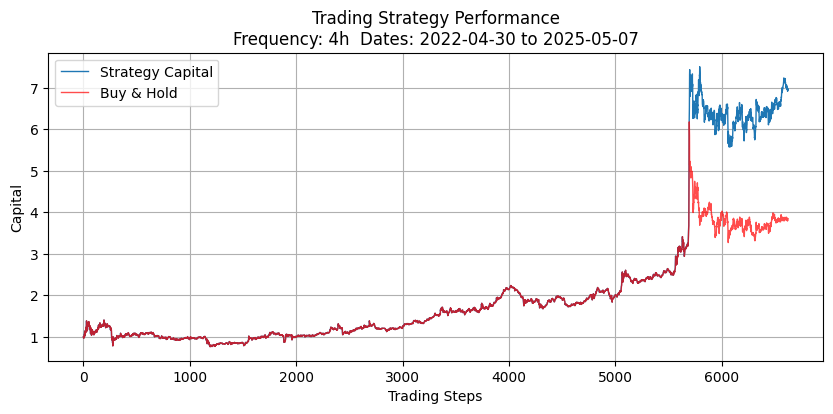

{'Total Return': 5.952954170125958, 'Buy and Hold Return': 2.8467522364838587, 'Hit Rate': 0.5286210542214167, 'Sharpe Ratio': 1.0485205855854218, 'Number of Trades': 6621}
Hit Rate (Long/Price Rise): 53.05%
Hit Rate (Short/Price Fall): 49.03%
Number of Long Trades: 6311
Number of Short Trades: 310
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


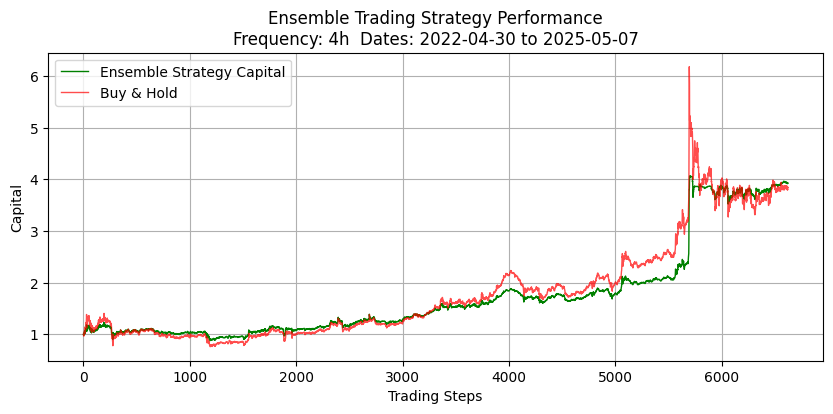

Ensemble Strategy Metrics: {'Total Return': 2.929505662213276, 'Buy and Hold Return': 2.8467522364838587, 'Hit Rate': 0.5304086157744694, 'Sharpe Ratio': 1.3639100925003729, 'Number of Trades': 6314}
Hit Rate (Long/Price Rise): 53.04%
Hit Rate (Short/Price Fall): 50.00%
Number of Long Trades: 6310
Number of Short Trades: 4
Testing TRX with trading window 5
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0004849350558027518
Fraction positive: 0.5187771277599547
Fraction negative: 0.4759388563879977
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14', 'stoc

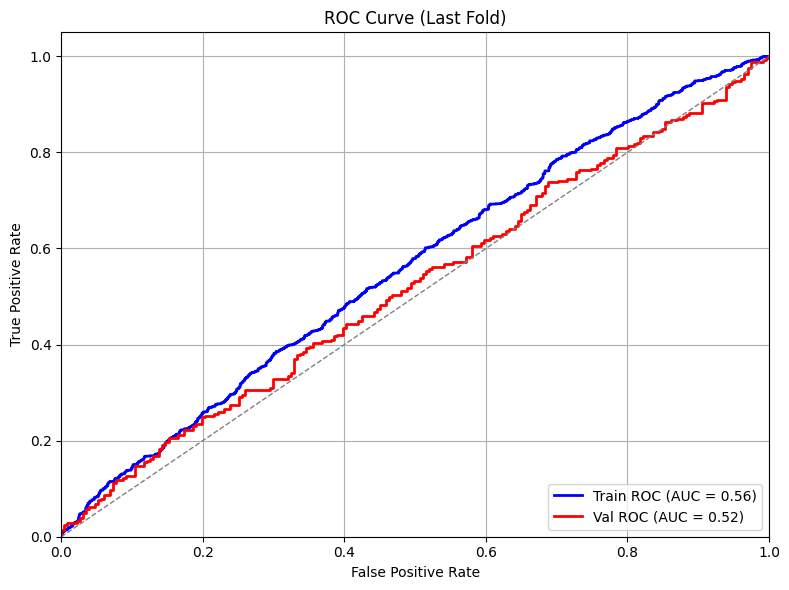

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 49.44%
Confusion Matrix (Total):
[[1314  846]
 [1470  951]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.47      0.49      0.48       231
          Up       0.56      0.54      0.55       278

    accuracy                           0.52       509
   macro avg       0.51      0.51      0.51       509
weighted avg       0.52      0.52      0.52       509

Testing linear model on test set...
Test Model Results:
  R² Score: -0.011393
  Test samples: 5293
  Features used: 30
  Overall Accuracy: 0.5286 (52.86%)
  Weighted Accuracy: 0.5286 (52.86%)
  Rise Accuracy: 0.7152 (71.52%) - 2855 samples
  Fall Accuracy: 0.3101 (31.01%) - 2438 samples
  Precision: 0.5483
  Recall: 0.7152
  F1 Score: 0.6208
  Confusion Matrix (Fall/Rise):
    [[ 756 1682]  # Predicted Fall
     [ 813 2042]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive 

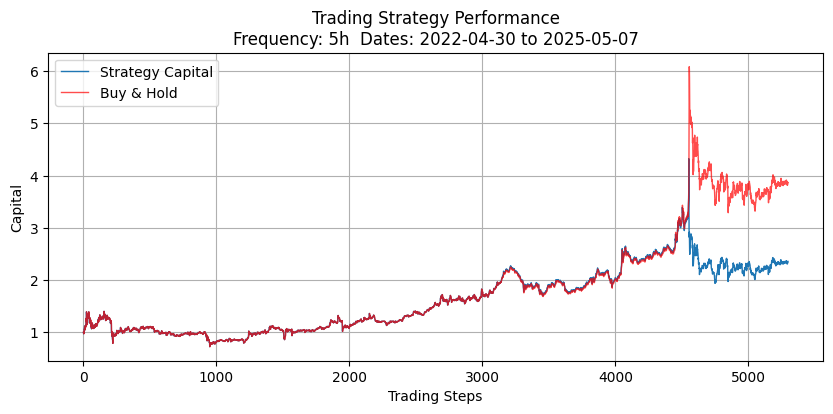

{'Total Return': 1.3587435078150283, 'Buy and Hold Return': 2.8671049542146045, 'Hit Rate': 0.5310553143288654, 'Sharpe Ratio': 0.36898917245024443, 'Number of Trades': 5297}
Hit Rate (Long/Price Rise): 53.08%
Hit Rate (Short/Price Fall): 61.54%
Number of Long Trades: 5284
Number of Short Trades: 13
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


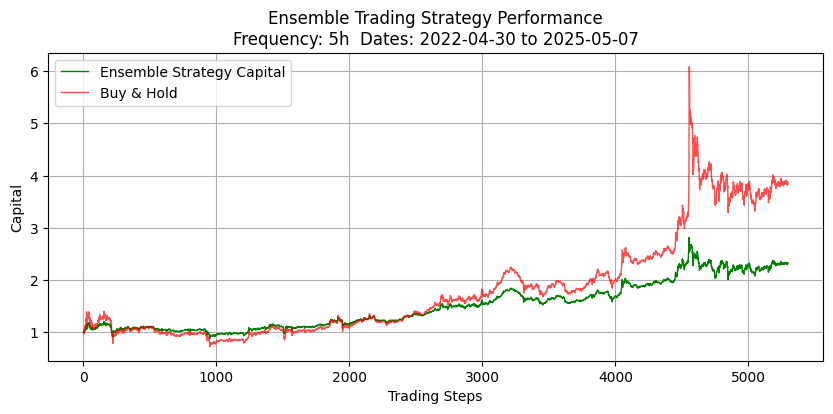

Ensemble Strategy Metrics: {'Total Return': 1.332397255501729, 'Buy and Hold Return': 2.8671049542146045, 'Hit Rate': 0.5309249101569888, 'Sharpe Ratio': 0.7924756891308896, 'Number of Trades': 5287}
Hit Rate (Long/Price Rise): 53.09%
Hit Rate (Short/Price Fall): 50.00%
Number of Long Trades: 5283
Number of Short Trades: 4
Testing TRX with trading window 6
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0005778968325682657
Fraction positive: 0.521286231884058
Fraction negative: 0.47192028985507245
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14', 'stoc

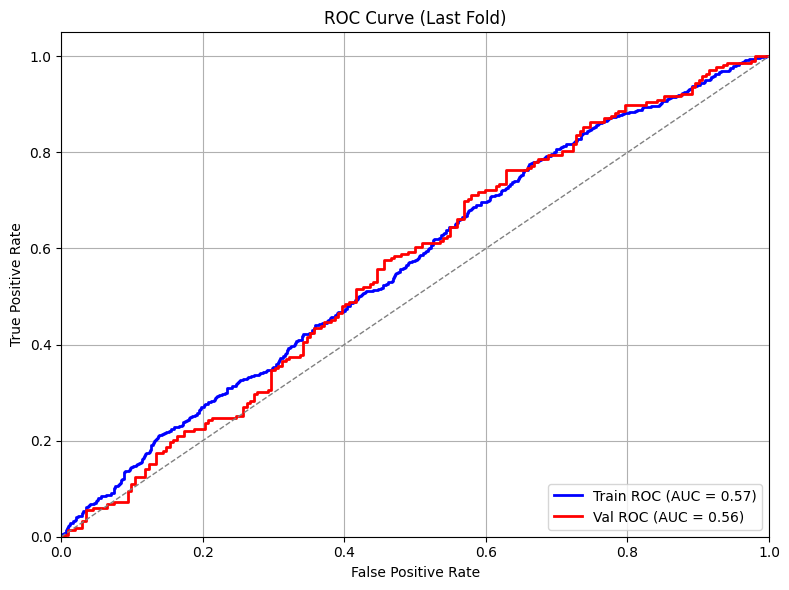

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 49.43%
Confusion Matrix (Total):
[[1065  712]
 [1204  808]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.48      0.95      0.64       202
          Up       0.57      0.06      0.11       219

    accuracy                           0.49       421
   macro avg       0.52      0.50      0.37       421
weighted avg       0.53      0.49      0.36       421

Testing linear model on test set...
Test Model Results:
  R² Score: -0.014181
  Test samples: 4409
  Features used: 30
  Overall Accuracy: 0.5185 (51.85%)
  Weighted Accuracy: 0.5185 (51.85%)
  Rise Accuracy: 0.6880 (68.80%) - 2388 samples
  Fall Accuracy: 0.3182 (31.82%) - 2021 samples
  Precision: 0.5439
  Recall: 0.6880
  F1 Score: 0.6075
  Confusion Matrix (Fall/Rise):
    [[ 643 1378]  # Predicted Fall
     [ 745 1643]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive 

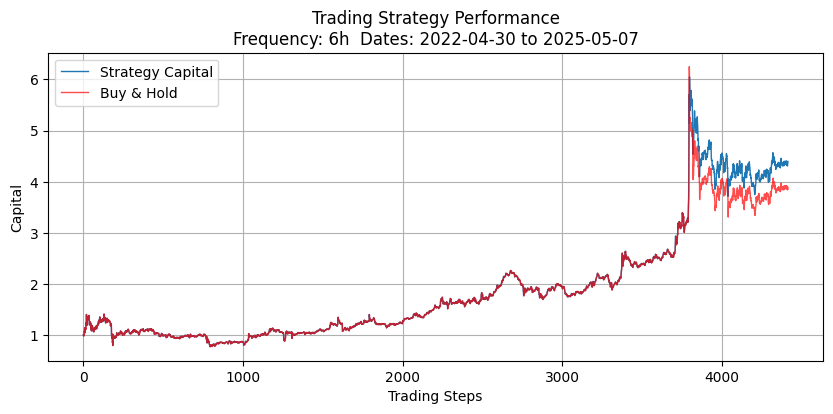

{'Total Return': 3.395054415320578, 'Buy and Hold Return': 2.889719185086132, 'Hit Rate': 0.5312641594925238, 'Sharpe Ratio': 0.698180082008292, 'Number of Trades': 4414}
Hit Rate (Long/Price Rise): 53.11%
Hit Rate (Short/Price Fall): 66.67%
Number of Long Trades: 4408
Number of Short Trades: 6
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


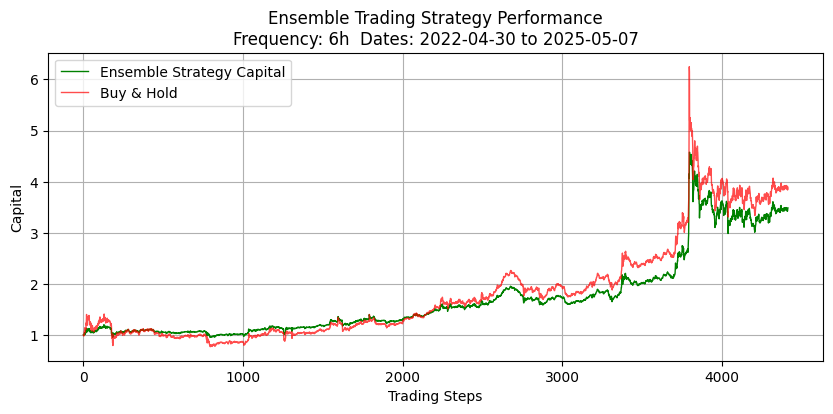

Ensemble Strategy Metrics: {'Total Return': 2.485647863046696, 'Buy and Hold Return': 2.889719185086132, 'Hit Rate': 0.5311720698254364, 'Sharpe Ratio': 0.8056622494359128, 'Number of Trades': 4411}
Hit Rate (Long/Price Rise): 53.11%
Hit Rate (Short/Price Fall): 66.67%
Number of Long Trades: 4408
Number of Short Trades: 3
Testing XRP with trading window 2
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.00020038619774114547
Fraction positive: 0.5026423071115809
Fraction negative: 0.4954703306658614
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14', 'stoc

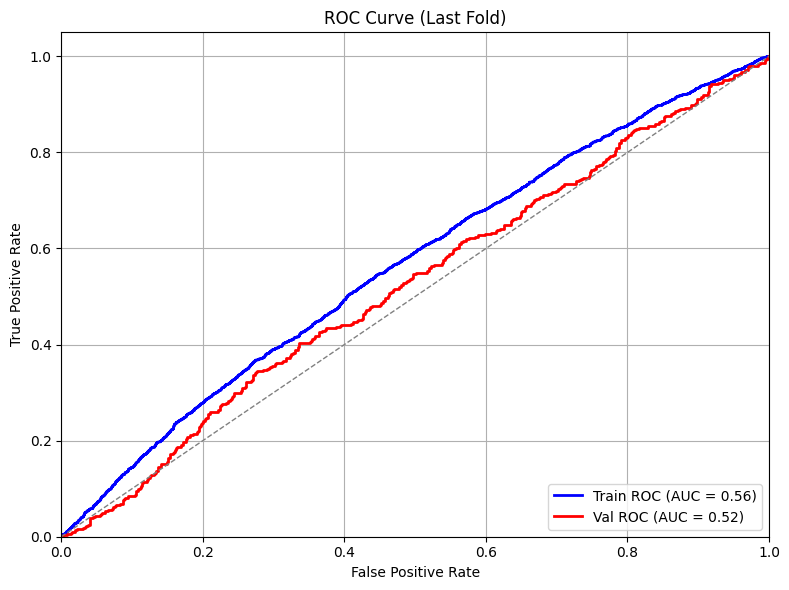

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.78%
Confusion Matrix (Total):
[[3776 1959]
 [3700 2301]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.52      0.63      0.57       647
          Up       0.54      0.43      0.48       657

    accuracy                           0.53      1304
   macro avg       0.53      0.53      0.52      1304
weighted avg       0.53      0.53      0.52      1304

Testing linear model on test set...
Test Model Results:
  R² Score: -0.046031
  Test samples: 13244
  Features used: 30
  Overall Accuracy: 0.5042 (50.42%)
  Weighted Accuracy: 0.5042 (50.42%)
  Rise Accuracy: 0.1127 (11.27%) - 6592 samples
  Fall Accuracy: 0.8922 (89.22%) - 6652 samples
  Precision: 0.5089
  Recall: 0.1127
  F1 Score: 0.1846
  Confusion Matrix (Fall/Rise):
    [[5935  717]  # Predicted Fall
     [5849  743]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive

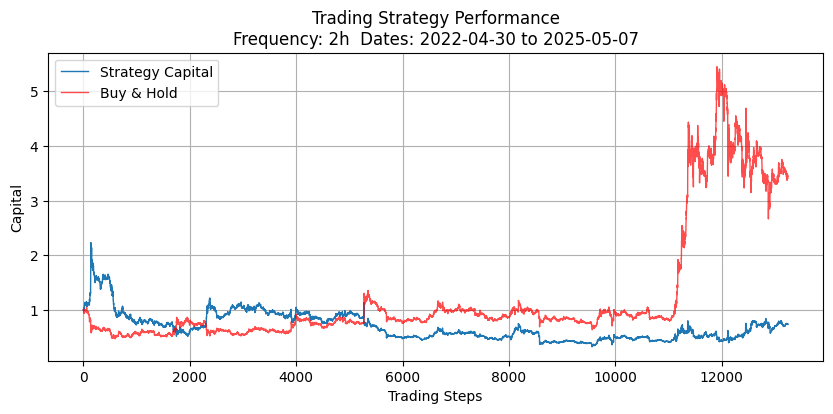

{'Total Return': -0.25575413779107037, 'Buy and Hold Return': 2.410390656463955, 'Hit Rate': 0.5018121413470251, 'Sharpe Ratio': -0.11775700797753783, 'Number of Trades': 13244}
Hit Rate (Long/Price Rise): 50.67%
Hit Rate (Short/Price Fall): 48.91%
Number of Long Trades: 9566
Number of Short Trades: 3678
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 05:00:00 to 2025-05-07 21:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


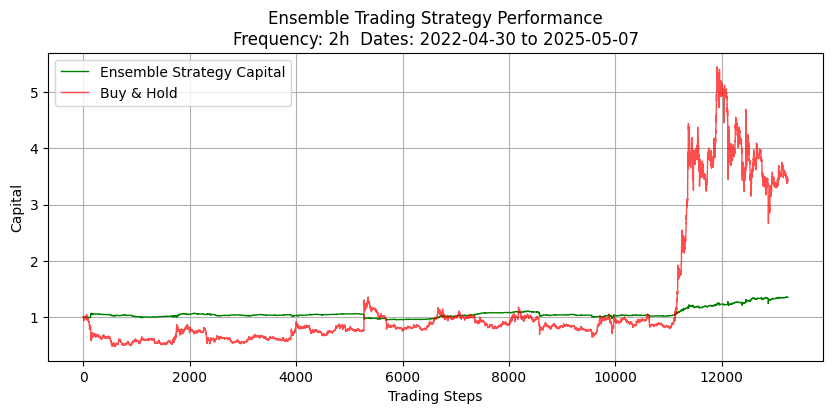

Ensemble Strategy Metrics: {'Total Return': 0.3528511689353724, 'Buy and Hold Return': 2.410390656463955, 'Hit Rate': 0.513354186717998, 'Sharpe Ratio': 0.8717236298542795, 'Number of Trades': 8312}
Hit Rate (Long/Price Rise): 52.52%
Hit Rate (Short/Price Fall): 48.89%
Number of Long Trades: 5598
Number of Short Trades: 2714
Testing XRP with trading window 3
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0002915358034088006
Fraction positive: 0.5048125920054354
Fraction negative: 0.4938285584871476
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14', 'st

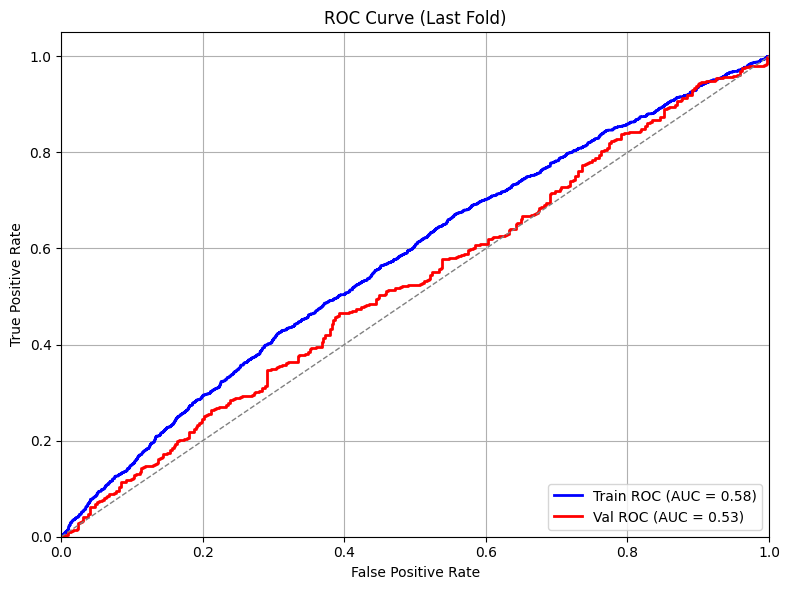

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 52.25%
Confusion Matrix (Total):
[[2658 1145]
 [2564 1400]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.49      0.36      0.41       416
          Up       0.52      0.65      0.58       447

    accuracy                           0.51       863
   macro avg       0.50      0.50      0.50       863
weighted avg       0.50      0.51      0.50       863

Testing linear model on test set...
Test Model Results:
  R² Score: -0.055347
  Test samples: 8827
  Features used: 30
  Overall Accuracy: 0.5021 (50.21%)
  Weighted Accuracy: 0.5021 (50.21%)
  Rise Accuracy: 0.8329 (83.29%) - 4374 samples
  Fall Accuracy: 0.1772 (17.72%) - 4453 samples
  Precision: 0.4986
  Recall: 0.8329
  F1 Score: 0.6237
  Confusion Matrix (Fall/Rise):
    [[ 789 3664]  # Predicted Fall
     [ 731 3643]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive 

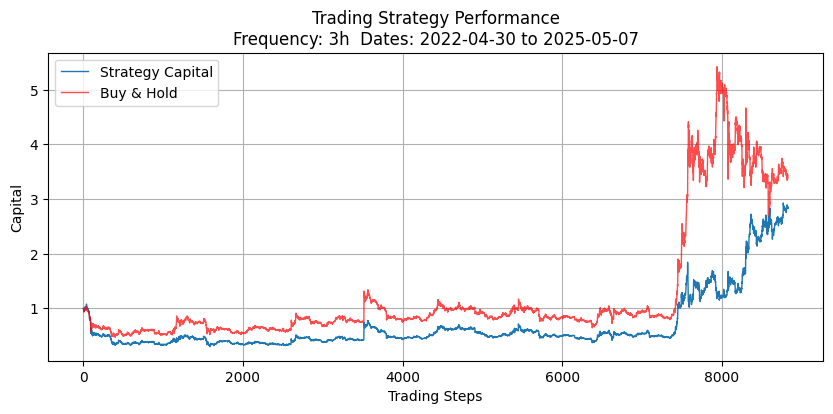

{'Total Return': 1.8616797642417628, 'Buy and Hold Return': 2.3880022455690106, 'Hit Rate': 0.5044738928530977, 'Sharpe Ratio': 0.6999000155682826, 'Number of Trades': 8829}
Hit Rate (Long/Price Rise): 50.42%
Hit Rate (Short/Price Fall): 50.65%
Number of Long Trades: 7678
Number of Short Trades: 1151
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 06:00:00 to 2025-05-07 20:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


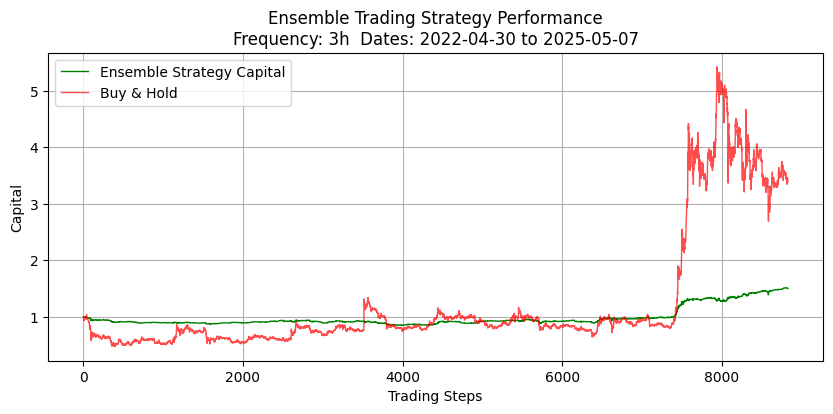

Ensemble Strategy Metrics: {'Total Return': 0.5027746680653924, 'Buy and Hold Return': 2.3880022455690106, 'Hit Rate': 0.5106352605281942, 'Sharpe Ratio': 1.277623430437715, 'Number of Trades': 7005}
Hit Rate (Long/Price Rise): 51.02%
Hit Rate (Short/Price Fall): 51.27%
Number of Long Trades: 5741
Number of Short Trades: 1264
Testing XRP with trading window 4
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.00038521925585080496
Fraction positive: 0.5046051638230409
Fraction negative: 0.494639891287936
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14', 's

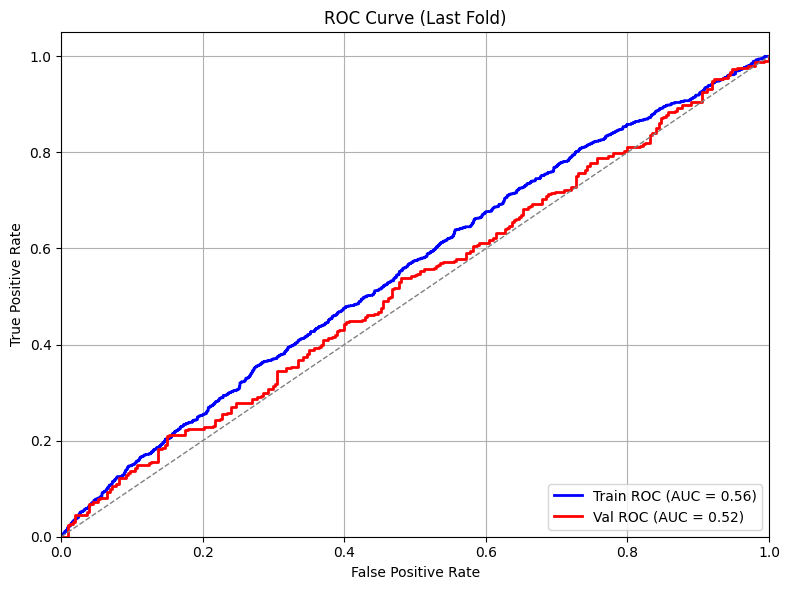

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.66%
Confusion Matrix (Total):
[[1616 1181]
 [1670 1311]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.49      0.21      0.30       308
          Up       0.52      0.80      0.63       334

    accuracy                           0.52       642
   macro avg       0.51      0.51      0.46       642
weighted avg       0.51      0.52      0.47       642

Testing linear model on test set...
Test Model Results:
  R² Score: -0.170233
  Test samples: 6619
  Features used: 30
  Overall Accuracy: 0.4972 (49.72%)
  Weighted Accuracy: 0.4972 (49.72%)
  Rise Accuracy: 0.5395 (53.95%) - 3264 samples
  Fall Accuracy: 0.4560 (45.60%) - 3355 samples
  Precision: 0.4911
  Recall: 0.5395
  F1 Score: 0.5142
  Confusion Matrix (Fall/Rise):
    [[1530 1825]  # Predicted Fall
     [1503 1761]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive 

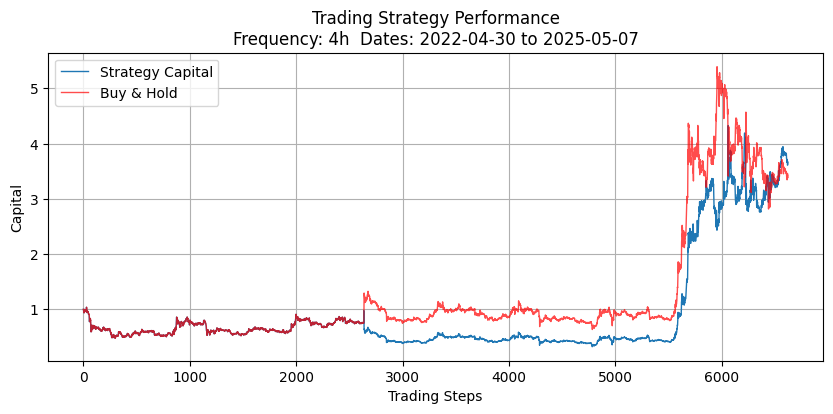

{'Total Return': 2.6646288458498195, 'Buy and Hold Return': 2.387253728962272, 'Hit Rate': 0.5032472436187887, 'Sharpe Ratio': 0.6325510577045801, 'Number of Trades': 6621}
Hit Rate (Long/Price Rise): 49.99%
Hit Rate (Short/Price Fall): 53.38%
Number of Long Trades: 5971
Number of Short Trades: 650
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 07:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


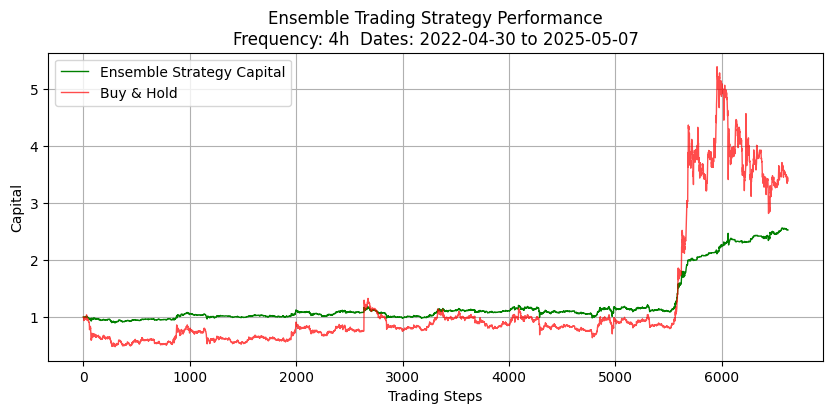

Ensemble Strategy Metrics: {'Total Return': 1.527393671917249, 'Buy and Hold Return': 2.387253728962272, 'Hit Rate': 0.5017805114923923, 'Sharpe Ratio': 1.586476925661374, 'Number of Trades': 6178}
Hit Rate (Long/Price Rise): 49.97%
Hit Rate (Short/Price Fall): 56.10%
Number of Long Trades: 5973
Number of Short Trades: 205
Testing XRP with trading window 5
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0004973692594827972
Fraction positive: 0.4987733534629175
Fraction negative: 0.4991507831666352
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14', 'stoc

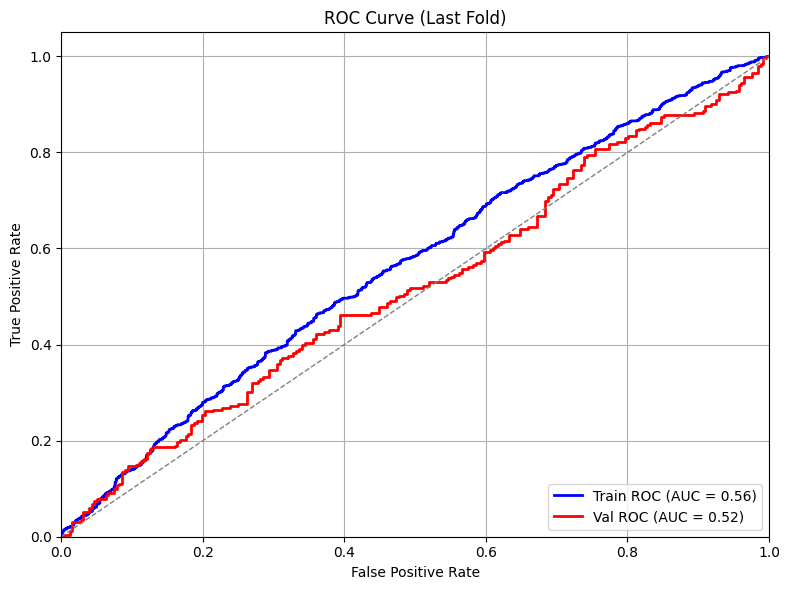

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.62%
Confusion Matrix (Total):
[[1902  392]
 [1870  417]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.51      0.82      0.63       256
          Up       0.53      0.21      0.31       253

    accuracy                           0.52       509
   macro avg       0.52      0.51      0.47       509
weighted avg       0.52      0.52      0.47       509

Testing linear model on test set...
Test Model Results:
  R² Score: -0.030461
  Test samples: 5293
  Features used: 30
  Overall Accuracy: 0.5044 (50.44%)
  Weighted Accuracy: 0.5044 (50.44%)
  Rise Accuracy: 0.7541 (75.41%) - 2591 samples
  Fall Accuracy: 0.2650 (26.50%) - 2702 samples
  Precision: 0.4959
  Recall: 0.7541
  F1 Score: 0.5984
  Confusion Matrix (Fall/Rise):
    [[ 716 1986]  # Predicted Fall
     [ 637 1954]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive 

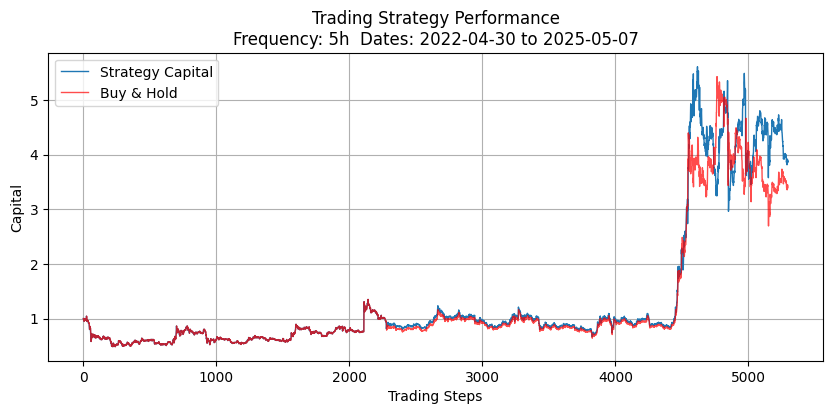

{'Total Return': 2.8810911424653023, 'Buy and Hold Return': 2.394172887069588, 'Hit Rate': 0.5016046818954125, 'Sharpe Ratio': 0.473825140728198, 'Number of Trades': 5297}
Hit Rate (Long/Price Rise): 49.73%
Hit Rate (Short/Price Fall): 56.83%
Number of Long Trades: 4975
Number of Short Trades: 322
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 08:00:00 to 2025-05-07 18:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


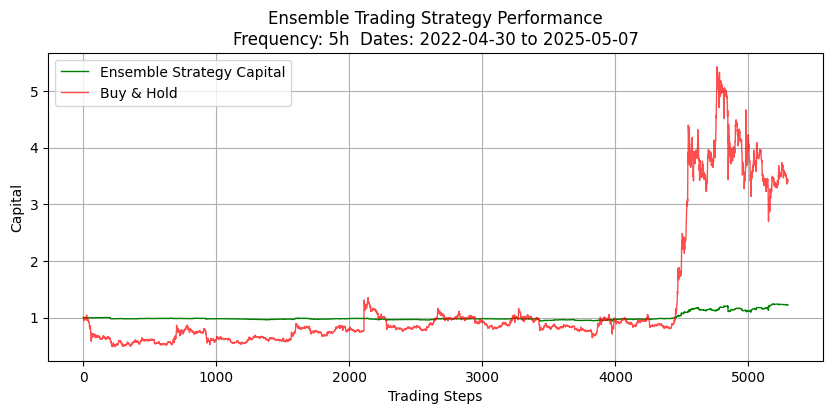

Ensemble Strategy Metrics: {'Total Return': 0.222244952607199, 'Buy and Hold Return': 2.394172887069588, 'Hit Rate': 0.4983742240614839, 'Sharpe Ratio': 0.6803844925625403, 'Number of Trades': 3383}
Hit Rate (Long/Price Rise): 50.21%
Hit Rate (Short/Price Fall): 48.47%
Number of Long Trades: 2665
Number of Short Trades: 718
Testing XRP with trading window 6
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing NONE model ===
Mean target_return: 0.0005810148169280251
Fraction positive: 0.5040760869565217
Fraction negative: 0.4952445652173913
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14', 'sto

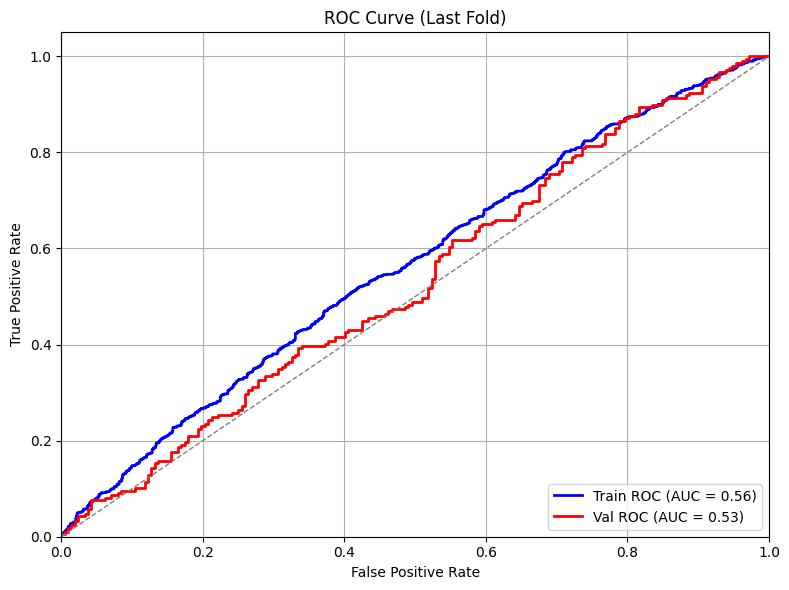

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 49.62%
Confusion Matrix (Total):
[[1211  663]
 [1246  669]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.54      0.33      0.41       212
          Up       0.51      0.72      0.60       209

    accuracy                           0.52       421
   macro avg       0.53      0.52      0.50       421
weighted avg       0.53      0.52      0.50       421

Testing linear model on test set...
Test Model Results:
  R² Score: -0.028680
  Test samples: 4409
  Features used: 30
  Overall Accuracy: 0.5112 (51.12%)
  Weighted Accuracy: 0.5112 (51.12%)
  Rise Accuracy: 0.1446 (14.46%) - 2158 samples
  Fall Accuracy: 0.8627 (86.27%) - 2251 samples
  Precision: 0.5024
  Recall: 0.1446
  F1 Score: 0.2245
  Confusion Matrix (Fall/Rise):
    [[1942  309]  # Predicted Fall
     [1846  312]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressive 

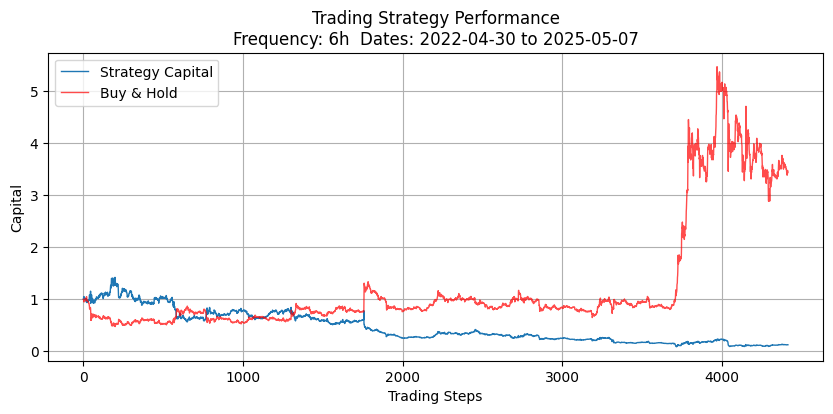

{'Total Return': -0.8717604188260314, 'Buy and Hold Return': 2.4288251917642314, 'Hit Rate': 0.4852741277752605, 'Sharpe Ratio': -0.5918400898543476, 'Number of Trades': 4414}
Hit Rate (Long/Price Rise): 49.27%
Hit Rate (Short/Price Fall): 47.84%
Number of Long Trades: 2125
Number of Short Trades: 2289
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 09:00:00 to 2025-05-07 17:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


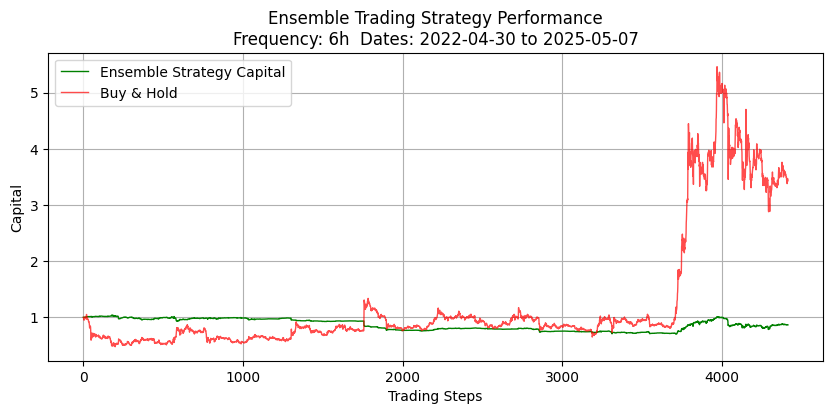

Ensemble Strategy Metrics: {'Total Return': -0.1344016614892911, 'Buy and Hold Return': 2.4288251917642314, 'Hit Rate': 0.48995739500912966, 'Sharpe Ratio': -0.3070311105249229, 'Number of Trades': 3286}
Hit Rate (Long/Price Rise): 49.33%
Hit Rate (Short/Price Fall): 48.40%
Number of Long Trades: 2098
Number of Short Trades: 1188
Linear model testing complete!


In [6]:
for symbol in symbols:
    for trading_window in range(2, 7):
        print(f"Testing {symbol} with trading window {trading_window}")
        try:
            df = pd.read_csv(f'indicator_results_{symbol}.csv')
            df1 = df[df['window'] == trading_window]

            selected_indicators = df1[df1['win'] > 0.50]['indicator'].unique()
            if len(selected_indicators) == 0:
                print(f"No indicators with win rate > 50% for {symbol} - {trading_window}h window")
                continue
            print(f"Selected indicators: {selected_indicators}")

            df_symbol = pd.read_csv(f'{symbol}_spot_full.csv')
            half = len(df_symbol) // 2
            df_train = df_symbol.iloc[:half]
            
            # Get start time for testing (second half of data)
            start_time = df_symbol.iloc[half]['close_time']
            
            print(f"Training on: {df_train.iloc[0]['close_time']} to {df_train.iloc[-1]['close_time']}")
            print(f"Testing on: {start_time} to {df_symbol.iloc[-1]['close_time']}")

            for obj in [None]:
                print(f"\n=== Testing {obj.upper() if obj else 'NONE'} model ===")
                try:
                    linear, binary, scaler = run_indicators(df_train, selected_indicators.tolist() + original_columns, 
                                                   time_window=trading_window, quantile=False, obj=obj)
                    
                    if linear is not None and binary is not None and scaler is not None:
                        print(f"Testing linear model on test set...")
                        r2_linear = test_model(df_symbol, linear, selected_indicators.tolist(), original_columns, 
                                             target_col='bam_close', time_window=trading_window, start_time=start_time, scaler=scaler)
                        
                        print(f"aggressive strategy (linear model)")
                        simulate_trading(df_symbol, linear, selected_indicators.tolist() + original_columns,
                                       start_time=start_time,
                                       trading_window=trading_window, plot=True, strategy='aggressive', scaler=scaler)
                        
                        print(f"proba_ensemble strategy (linear+binary model)")
                        simulate_trading_ensemble(df_symbol, linear, binary, selected_indicators.tolist() + original_columns,
                                               start_time=start_time,
                                               trading_window=trading_window, plot=True, strategy='proba_ensemble', scaler=scaler)
                    else:
                        print(f"Failed to create {obj} model")
                        
                except Exception as e:
                    print(f"Error with {obj} model: {str(e)}")
                    continue
                    
        except Exception as e:
            print(f"Error processing {symbol} - {trading_window}h: {str(e)}")
            continue

print("Linear model testing complete!")

Testing BNB with trading window 1
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing WEIGHTS1 model ===
Mean target_return: 0.00016773470410594085
Fraction positive: 0.5117964591748141
Fraction negative: 0.48495715526027705
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_14', 'stochastic_oscillator_14_0', 'stochastic_oscillator_14_1', 'ichimoku_cloud_9_26_52_0', 'ichimoku_cloud_9_26_52_1', 'ichimoku_cloud_9_26_52_2', 'ichimoku_cloud_9_26_52_3', 'vwap', 'atr', 'bam_vwa', 'bam_open', 'bam_close', 'bam_high', 'bam_low', 'bam_volatility_1m_return', 'base

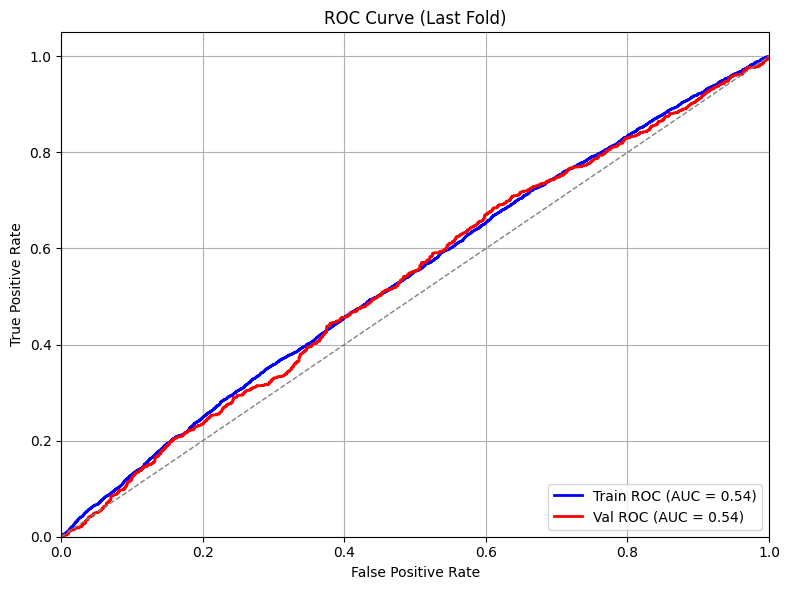

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 50.83%
Confusion Matrix (Total):
[[6964 4517]
 [7112 5059]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.51      0.63      0.56      1283
          Up       0.54      0.42      0.47      1345

    accuracy                           0.52      2628
   macro avg       0.53      0.52      0.52      2628
weighted avg       0.53      0.52      0.52      2628

Testing linear model on test set...
Test Model Results:
  R² Score: -0.568128
  Test samples: 26491
  Features used: 31
  Overall Accuracy: 0.4889 (48.89%)
  Weighted Accuracy: 0.4889 (48.89%)
  Rise Accuracy: 0.8054 (80.54%) - 13213 samples
  Fall Accuracy: 0.1739 (17.39%) - 13278 samples
  Precision: 0.4924
  Recall: 0.8054
  F1 Score: 0.6112
  Confusion Matrix (Fall/Rise):
    [[2309 10969]  # Predicted Fall
     [2571 10642]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggres

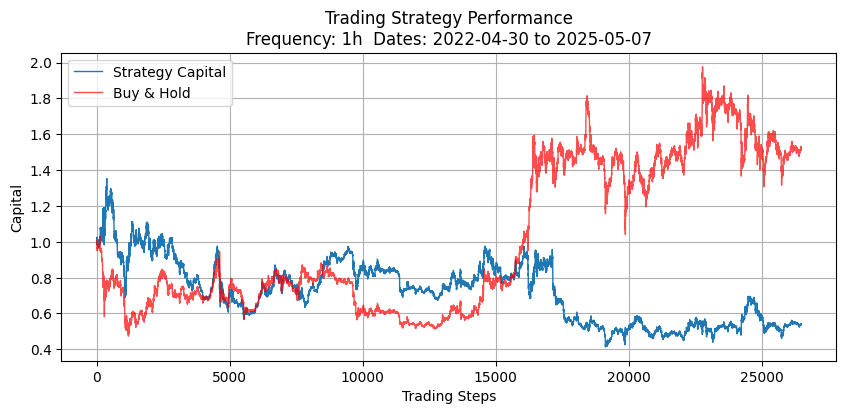

{'Total Return': -0.460859723509074, 'Buy and Hold Return': 0.517189666036547, 'Hit Rate': 0.4867874669686674, 'Sharpe Ratio': -0.3124211634404259, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 49.38%
Hit Rate (Short/Price Fall): 45.55%
Number of Long Trades: 21610
Number of Short Trades: 4880
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


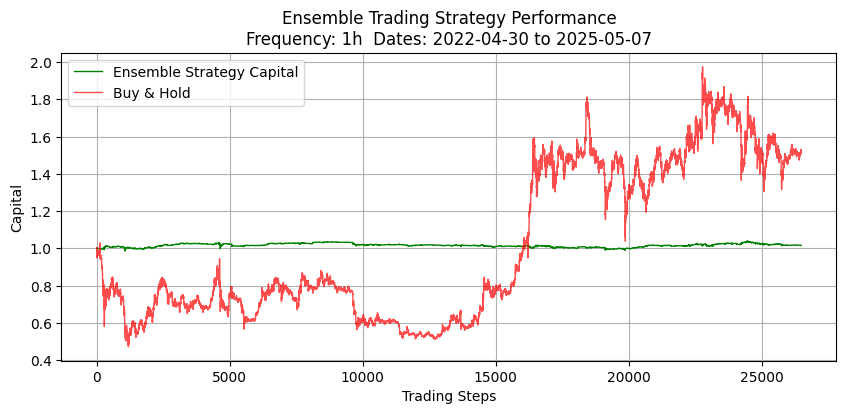

Ensemble Strategy Metrics: {'Total Return': 0.016318173544396686, 'Buy and Hold Return': 0.5156615888203452, 'Hit Rate': 0.5049513627201823, 'Sharpe Ratio': 0.1537957465327734, 'Number of Trades': 11411}
Hit Rate (Long/Price Rise): 53.25%
Hit Rate (Short/Price Fall): 46.49%
Number of Long Trades: 6763
Number of Short Trades: 4648
Testing BTC with trading window 1
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing WEIGHTS1 model ===
Mean target_return: 0.00010939550027540065
Fraction positive: 0.5104375070778755
Fraction negative: 0.4893737495753275
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_

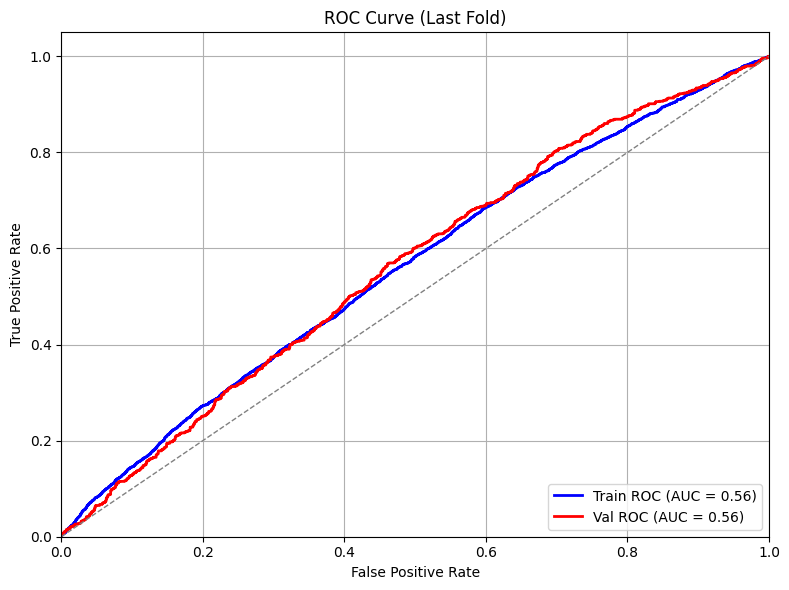

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 53.34%
Confusion Matrix (Total):
[[6566 5089]
 [5948 6049]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.52      0.64      0.57      1291
          Up       0.56      0.44      0.49      1337

    accuracy                           0.54      2628
   macro avg       0.54      0.54      0.53      2628
weighted avg       0.54      0.54      0.53      2628

Testing linear model on test set...
Test Model Results:
  R² Score: -0.496283
  Test samples: 26491
  Features used: 31
  Overall Accuracy: 0.4965 (49.65%)
  Weighted Accuracy: 0.4965 (49.65%)
  Rise Accuracy: 0.6180 (61.80%) - 13428 samples
  Fall Accuracy: 0.3717 (37.17%) - 13063 samples
  Precision: 0.5027
  Recall: 0.6180
  F1 Score: 0.5544
  Confusion Matrix (Fall/Rise):
    [[4855 8208]  # Predicted Fall
     [5130 8298]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressi

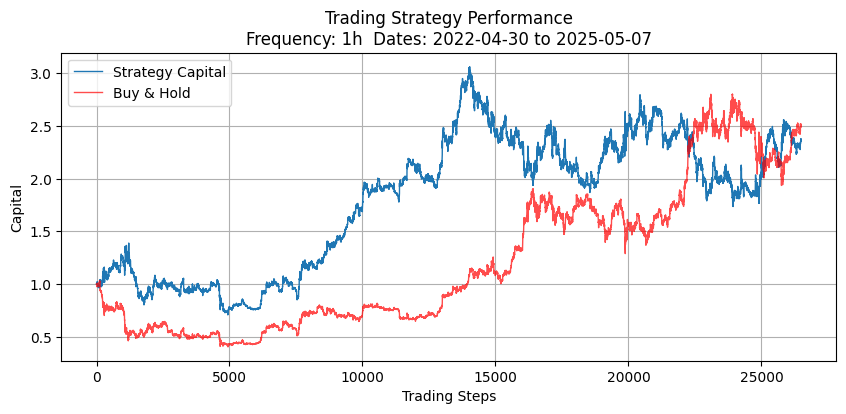

{'Total Return': 1.3586244419411577, 'Buy and Hold Return': 1.516089131482194, 'Hit Rate': 0.49531898829747073, 'Sharpe Ratio': 0.4700296463782242, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 50.18%
Hit Rate (Short/Price Fall): 48.46%
Number of Long Trades: 16506
Number of Short Trades: 9984
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


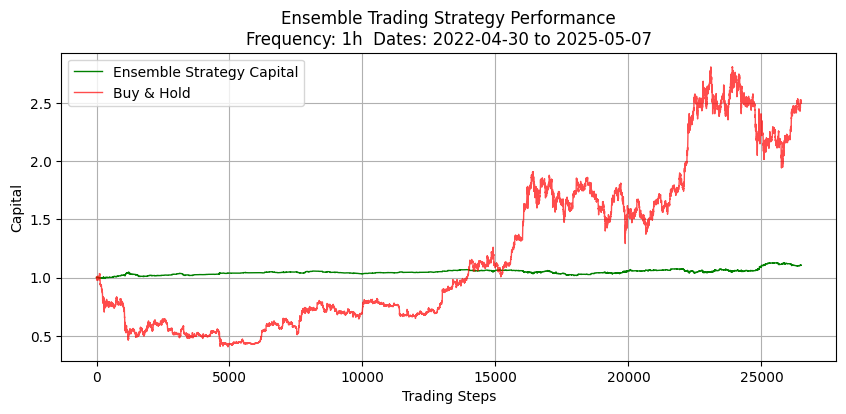

Ensemble Strategy Metrics: {'Total Return': 0.10516631049703173, 'Buy and Hold Return': 1.52281247637203, 'Hit Rate': 0.5068346287858483, 'Sharpe Ratio': 0.7160919587168237, 'Number of Trades': 11193}
Hit Rate (Long/Price Rise): 53.93%
Hit Rate (Short/Price Fall): 49.00%
Number of Long Trades: 3820
Number of Short Trades: 7373
Testing ETH with trading window 1
Selected indicators: ['volatility_breakout' 'buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20'
 'ema_50' 'ema_200' 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14'
 'stochastic_oscillator_14' 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing WEIGHTS1 model ===
Mean target_return: 0.00015614739063441247
Fraction positive: 0.5089653089728587
Fraction negative: 0.4901287229625156
Using features: ['volatility_breakout', 'buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_

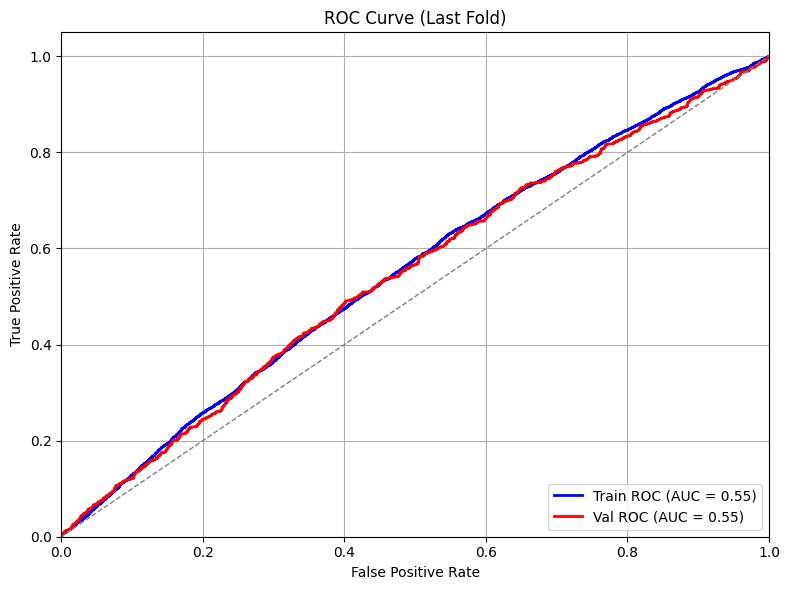

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 52.40%
Confusion Matrix (Total):
[[5558 5879]
 [5379 6836]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.51      0.71      0.60      1285
          Up       0.56      0.35      0.43      1343

    accuracy                           0.53      2628
   macro avg       0.54      0.53      0.52      2628
weighted avg       0.54      0.53      0.51      2628

Testing linear model on test set...
Test Model Results:
  R² Score: -0.636493
  Test samples: 26491
  Features used: 31
  Overall Accuracy: 0.4956 (49.56%)
  Weighted Accuracy: 0.4956 (49.56%)
  Rise Accuracy: 0.8704 (87.04%) - 13305 samples
  Fall Accuracy: 0.1174 (11.74%) - 13186 samples
  Precision: 0.4988
  Recall: 0.8704
  F1 Score: 0.6342
  Confusion Matrix (Fall/Rise):
    [[1548 11638]  # Predicted Fall
     [1724 11581]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggres

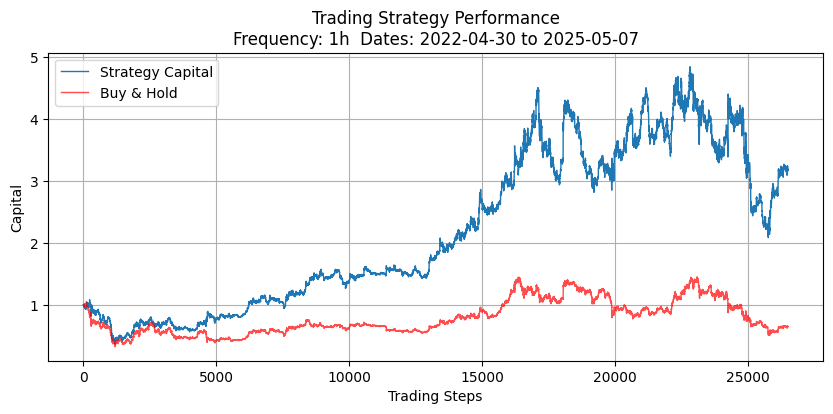

{'Total Return': 2.1843175562090567, 'Buy and Hold Return': -0.3552362889934056, 'Hit Rate': 0.4978859947149868, 'Sharpe Ratio': 0.42893270274045225, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 50.01%
Hit Rate (Short/Price Fall): 48.20%
Number of Long Trades: 23218
Number of Short Trades: 3272
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


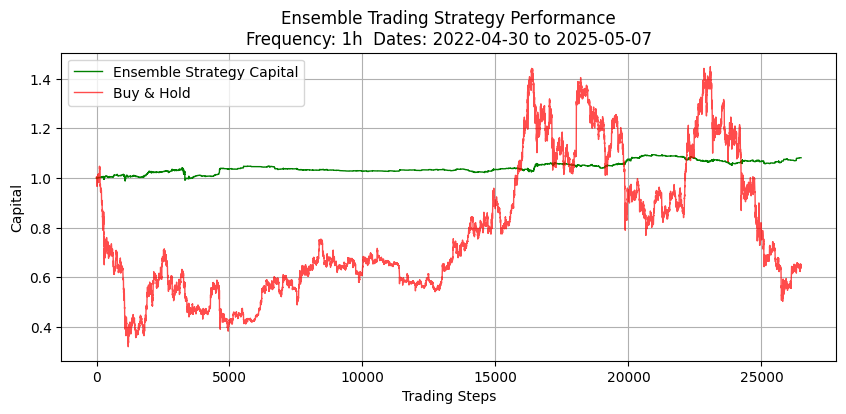

Ensemble Strategy Metrics: {'Total Return': 0.08195186588751091, 'Buy and Hold Return': -0.35586025498095525, 'Hit Rate': 0.496036866359447, 'Sharpe Ratio': 0.6367726389284015, 'Number of Trades': 5425}
Hit Rate (Long/Price Rise): 54.31%
Hit Rate (Short/Price Fall): 47.22%
Number of Long Trades: 1823
Number of Short Trades: 3602
Testing TRX with trading window 1
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing WEIGHTS1 model ===
Mean target_return: 0.00010172305597998901
Fraction positive: 0.5055301800611528
Fraction negative: 0.48186176437280587
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'ad

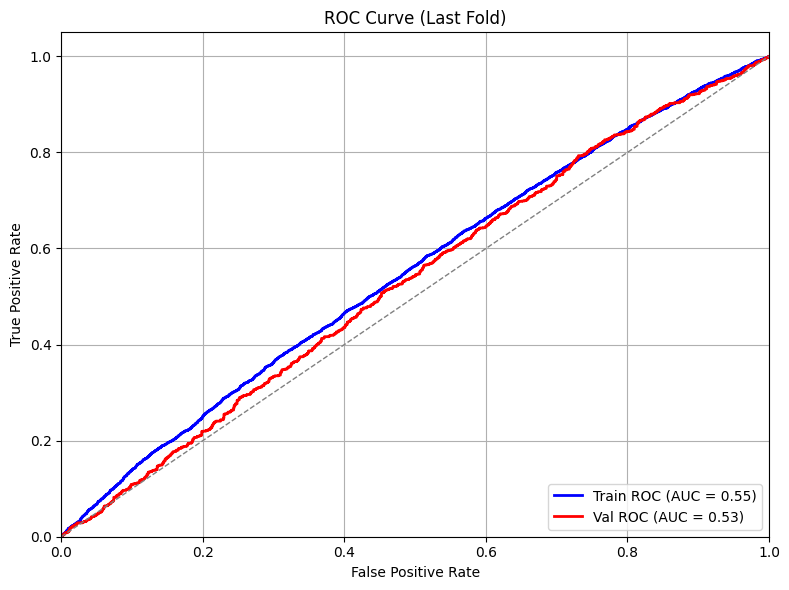

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 51.37%
Confusion Matrix (Total):
[[6475 4923]
 [6580 5674]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.47      0.89      0.62      1240
          Up       0.54      0.11      0.19      1388

    accuracy                           0.48      2628
   macro avg       0.51      0.50      0.40      2628
weighted avg       0.51      0.48      0.39      2628

Testing linear model on test set...
Test Model Results:
  R² Score: -1.586461
  Test samples: 26491
  Features used: 30
  Overall Accuracy: 0.5096 (50.96%)
  Weighted Accuracy: 0.5096 (50.96%)
  Rise Accuracy: 0.6567 (65.67%) - 13625 samples
  Fall Accuracy: 0.3538 (35.38%) - 12866 samples
  Precision: 0.5183
  Recall: 0.6567
  F1 Score: 0.5794
  Confusion Matrix (Fall/Rise):
    [[4552 8314]  # Predicted Fall
     [4678 8947]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggressi

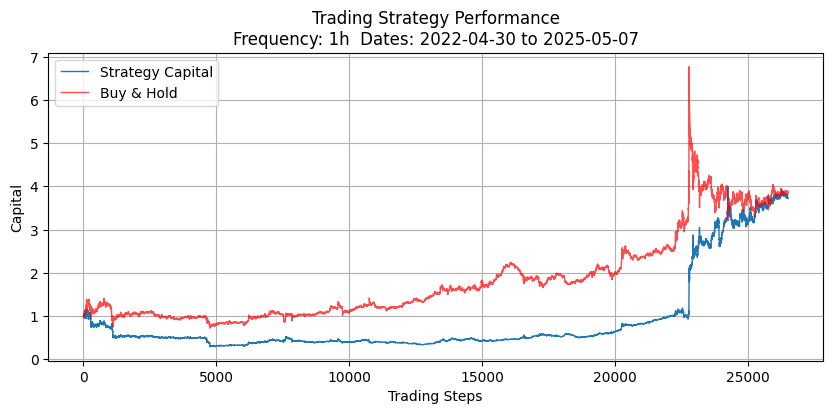

{'Total Return': 2.7274615129059105, 'Buy and Hold Return': 2.8862004370902277, 'Hit Rate': 0.49856549641374104, 'Sharpe Ratio': 1.1013272086321368, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 51.95%
Hit Rate (Short/Price Fall): 45.95%
Number of Long Trades: 17260
Number of Short Trades: 9230
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


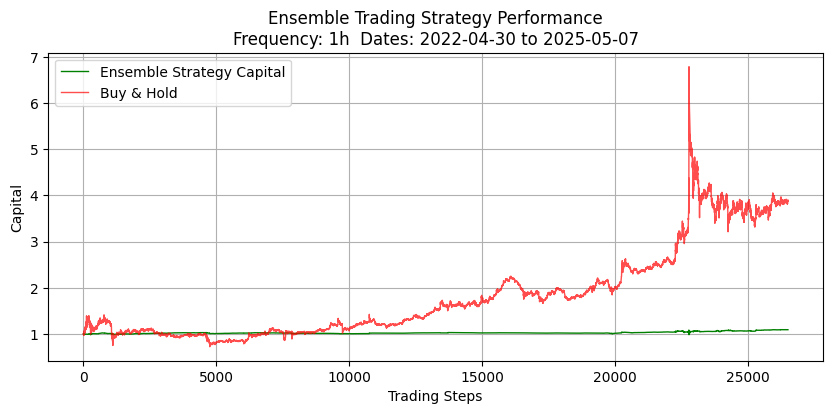

Ensemble Strategy Metrics: {'Total Return': 0.0921220424515996, 'Buy and Hold Return': 2.8950168192130175, 'Hit Rate': 0.508058608058608, 'Sharpe Ratio': 0.43453619613706607, 'Number of Trades': 10920}
Hit Rate (Long/Price Rise): 52.88%
Hit Rate (Short/Price Fall): 43.85%
Number of Long Trades: 8414
Number of Short Trades: 2506
Testing XRP with trading window 1
Selected indicators: ['buy_volume_sentiment' 'sma_50' 'sma_200' 'ema_20' 'ema_50' 'ema_200'
 'rsi_14' 'bollinger_bands_20_2' 'obv' 'adx_14' 'stochastic_oscillator_14'
 'ichimoku_cloud_9_26_52' 'vwap' 'atr']
Training on: 2019-04-20 01:00:00 to 2022-04-30 02:00:00
Testing on: 2022-04-30 03:00:00 to 2025-05-08 00:00:00

=== Testing WEIGHTS1 model ===
Mean target_return: 0.0001052756968163596
Fraction positive: 0.5033785059076668
Fraction negative: 0.49450756860820655
Using features: ['buy_volume_sentiment', 'sma_50', 'sma_200', 'ema_20', 'ema_50', 'ema_200', 'rsi_14', 'bollinger_bands_20_2_0', 'bollinger_bands_20_2_1', 'obv', 'adx_

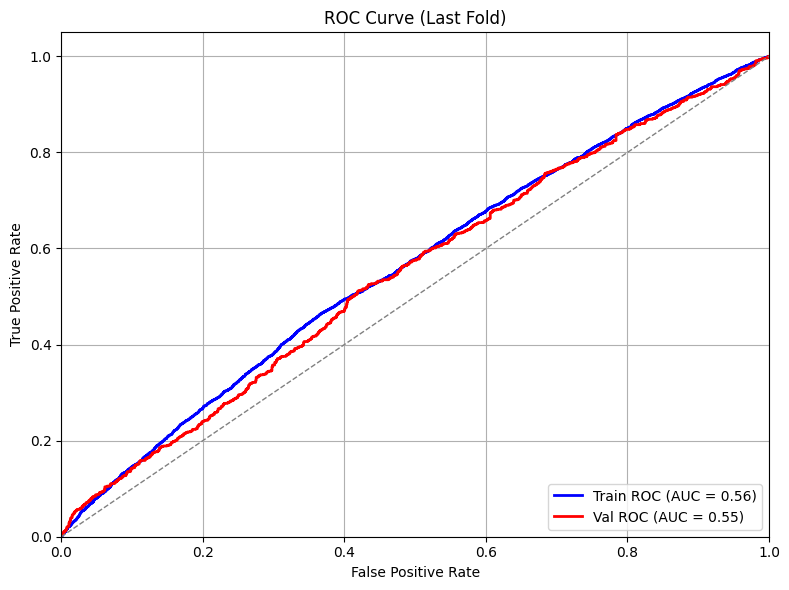

Logistic Regression (Balanced) Walk-Forward Validation Results (9 folds):
Avg Accuracy: 52.99%
Confusion Matrix (Total):
[[6683 4967]
 [6156 5855]]
Classification Report (Last Fold):
              precision    recall  f1-score   support

   Down/Flat       0.53      0.52      0.53      1300
          Up       0.54      0.55      0.55      1329

    accuracy                           0.54      2629
   macro avg       0.54      0.54      0.54      2629
weighted avg       0.54      0.54      0.54      2629

Testing linear model on test set...
Test Model Results:
  R² Score: -0.533972
  Test samples: 26491
  Features used: 30
  Overall Accuracy: 0.4855 (48.55%)
  Weighted Accuracy: 0.4855 (48.55%)
  Rise Accuracy: 0.1352 (13.52%) - 13395 samples
  Fall Accuracy: 0.8438 (84.38%) - 13096 samples
  Precision: 0.4695
  Recall: 0.1352
  F1 Score: 0.2099
  Confusion Matrix (Fall/Rise):
    [[11050 2046]  # Predicted Fall
     [11584 1811]]  # Predicted Rise
     # Actual Fall  Actual Rise
aggres

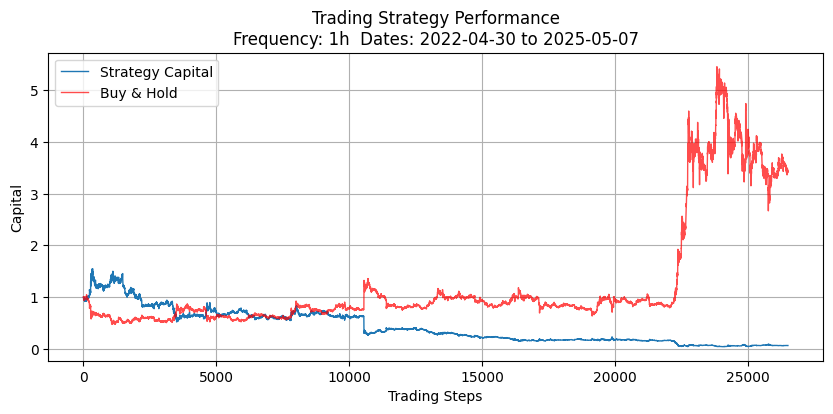

{'Total Return': -0.9330762628101148, 'Buy and Hold Return': 2.4329164985881406, 'Hit Rate': 0.4807097017742544, 'Sharpe Ratio': -0.6287000060020705, 'Number of Trades': 26490}
Hit Rate (Long/Price Rise): 48.54%
Hit Rate (Short/Price Fall): 47.99%
Number of Long Trades: 3857
Number of Short Trades: 22633
proba_ensemble strategy (linear+binary model)
Date range: 2022-04-30 05:00:00 to 2025-05-07 23:00:00
Ensemble plot saved as: images/ensemble_trading_simulation_13072025.png


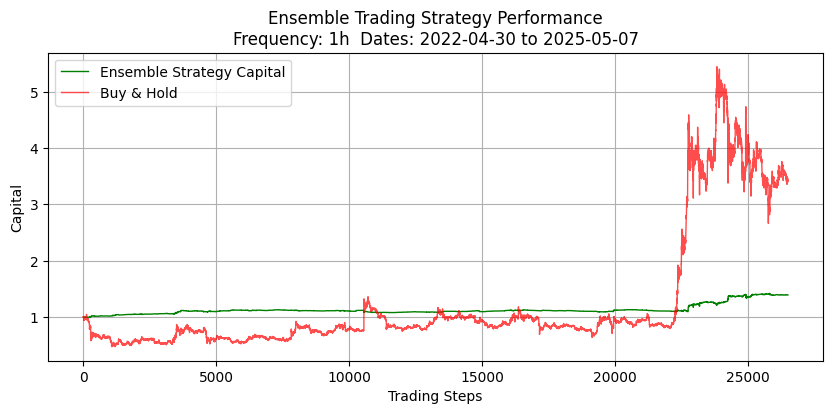

Ensemble Strategy Metrics: {'Total Return': 0.3929162494746836, 'Buy and Hold Return': 2.427386226339106, 'Hit Rate': 0.5118945256520493, 'Sharpe Ratio': 1.2549151626458963, 'Number of Trades': 10467}
Hit Rate (Long/Price Rise): 47.99%
Hit Rate (Short/Price Fall): 53.04%
Number of Long Trades: 3828
Number of Short Trades: 6639
Linear model testing complete!


In [8]:
for symbol in symbols:
    for trading_window in range(1, 2):
        print(f"Testing {symbol} with trading window {trading_window}")
        try:
            df = pd.read_csv(f'indicator_results_{symbol}.csv')
            df1 = df[df['window'] == trading_window]

            selected_indicators = df1[df1['win'] > 0.50]['indicator'].unique()
            if len(selected_indicators) == 0:
                print(f"No indicators with win rate > 50% for {symbol} - {trading_window}h window")
                continue
            print(f"Selected indicators: {selected_indicators}")

            df_symbol = pd.read_csv(f'{symbol}_spot_full.csv')
            half = len(df_symbol) // 2
            df_train = df_symbol.iloc[:half]
            
            # Get start time for testing (second half of data)
            start_time = df_symbol.iloc[half]['close_time']
            
            print(f"Training on: {df_train.iloc[0]['close_time']} to {df_train.iloc[-1]['close_time']}")
            print(f"Testing on: {start_time} to {df_symbol.iloc[-1]['close_time']}")

            for obj in ['weights1']:
                print(f"\n=== Testing {obj.upper() if obj else 'NONE'} model ===")
                try:
                    linear, binary, scaler = run_indicators(df_train, selected_indicators.tolist() + original_columns, 
                                                   time_window=trading_window, quantile=False, obj=obj)
                    
                    if linear is not None and binary is not None and scaler is not None:
                        print(f"Testing linear model on test set...")
                        r2_linear = test_model(df_symbol, linear, selected_indicators.tolist(), original_columns, 
                                             target_col='bam_close', time_window=trading_window, start_time=start_time, scaler=scaler)
                        
                        print(f"aggressive strategy (linear model)")
                        simulate_trading(df_symbol, linear, selected_indicators.tolist() + original_columns,
                                       start_time=start_time,
                                       trading_window=trading_window, plot=True, strategy='aggressive', scaler=scaler)
                        
                        print(f"proba_ensemble strategy (linear+binary model)")
                        simulate_trading_ensemble(df_symbol, linear, binary, selected_indicators.tolist() + original_columns,
                                               start_time=start_time,
                                               trading_window=trading_window, plot=True, strategy='proba_ensemble', scaler=scaler)
                    else:
                        print(f"Failed to create {obj} model")
                        
                except Exception as e:
                    print(f"Error with {obj} model: {str(e)}")
                    continue
                    
        except Exception as e:
            print(f"Error processing {symbol} - {trading_window}h: {str(e)}")
            continue

print("Linear model testing complete!")